In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from numpy import exp, abs, log
from scipy.special import gamma, factorial
import os
import scipy.stats as stats
import statsmodels.api as sm
from utils import *
import time
import datetime as dt
import universal as up
from universal import tools, algos
from universal.algos import *

np.set_printoptions(suppress=True)
np.set_printoptions(precision=4)
np.set_printoptions(threshold=np.inf)

In [26]:
def get_res(paras, phase, maxiter, subn, lb):
    data_path1 = path='./tmp2/%s_phase%02d_iter%d_subn%d_lb%d_M%d_matcnt%d_inv%s_ggd%s.npz'%  \
        (paras['dataset'], phase, paras['maxiter'], paras['subn'], paras['lb'], paras['M'], paras['matcnt'], paras['inverse'], paras['ggd'])
    print(data_path1)
    data1 = np.load(data_path1)
    return data1['predY0'], data1['std_varY0'], data1['sample_Y0']

def ucb_strategy(lam, predY0, std_varY0, sample_Y0):
    rt_v = []
    ninvest = 10

    for i in range(len(predY0)):
        p = predY0[i]
        sell_idx = np.argsort(p-lam*std_varY0[i])[:ninvest//2]
        buy_idx = np.argsort(-(p+lam*std_varY0[i]))[:ninvest//2]
        rr = 1/ninvest
        tmp = rr*(sum(exp(sample_Y0[i, buy_idx]))+sum(exp(-sample_Y0[i, sell_idx])))
        rt_v.append(log(tmp))
    return rt_v


def opt_strategy_fee(predY0, std_var_Y0, sample_Y0, cov, eps, delta, cash=1.0):
    rt_v = []
    x_ori = np.ones(len(predY0[0])) / len(predY0[0])
    for i in range(len(predY0)):
        r = exp(predY0[i])
        cov_dia = std_var_Y0[i] ** 2 * r * r
#          cov_current = np.zeros_like(cov)
        cov_current = cov.copy()
        for k in range(len(r)):
            cov_current[k, k] = cov_dia[k]
        x_opt = passive_solve(len(r), x_ori, r, cov_current, eps, delta, cash)
        if x_opt is None:
            print('No opt solution')
            x_opt = x_ori
        
        print(x_opt)
        print(sum(abs(x_opt-x_ori)))
        
        tmp = sum(x_opt * exp(sample_Y0[i])) / cash
        rt_v.append(log(tmp))
        
        x_ori = x_opt
    return rt_v

def opt_strategy(predY0, std_var_Y0, sample_Y0, cov, gamma, cash=1.0):
    rt_v = []
    for i in range(len(predY0)):
        r = exp(predY0[i])
        cov_dia = std_var_Y0[i]**2 * r * r
        cov_current = cov.copy()
        for k in range(len(r)):
            cov_current[k, k] = cov_dia[k]
        x_opt = solve2(len(r), r, cov_current, gamma)
        
        print(x_opt)
        
        tmp = sum(x_opt * exp(sample_Y0[i])) / cash
        rt_v.append(log(tmp))
    return rt_v

def max_redraw(rt_v):
    res = max([rt_v[i] - min(rt_v[i+1:]) for i in range(len(rt_v)-1)])
    return res

testv = np.arange(-0.1, 0.10001, 0.01)


def run(paras, eps=1.001, delta=0.008, gamma = 3, c=0, figsize=(10,5), testv=testv, phase_cnt=12):
    maxiter, subn, lb = paras['maxiter'], paras['subn'], paras['lb']
    rt_lst, rd_lst, naive_lst, opt_lst = [], [], [], []
    for phs in range(0, phase_cnt):
        print('Phase %d' % phs)
        if paras['dataset']=='snp500-12':
            data_path1 = './stock_data/stock_phase%02d_lb%d.npz' % (phs, lb)
        elif paras['dataset']=='snp500-24':
            data_path1 = './stock_data/stock24_phase%02d_lb%d.npz' % (phs, lb)
        data = np.load(data_path1)
#         data_path = './stock_data/stock_phase%02d_lb%d.npz' % (phs, lb)
#         data = np.load(data_path)
        cov_train, choice = data['cov_train'], data['choice']
        cov = cov_train[choice[:subn], :][:, choice[:subn]]

        print('Testing...')
        plt.figure(figsize=figsize)
        predY0, std_varY0, sample_Y0 = get_res(paras, phs, maxiter, subn, lb)

        print('------------------------------------------------------------------------------------')

        print('Opt strategy')
        if c>1e-6: # has fee
            rt_v = opt_strategy_fee(predY0, std_varY0, sample_Y0, cov, eps, delta)
        else:
            rt_v = opt_strategy(predY0, std_varY0, sample_Y0, cov, gamma)
        opt_lst += rt_v.copy()
        print('Opt strategy   Total log return: %.8f    Max redraw: %.8f' % (sum(rt_v), max_redraw(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt = rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i] += exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'r', label='Opt strategy')
        
        rt_v=ucb_strategy(0, predY0, std_varY0, sample_Y0)
        naive_lst += rt_v.copy()
        print('Naive lambda: %.3f   Total log return: %.8f' % (0, sum(rt_v)))
        print('Total return: %.8f' % exp(sum(rt_v)))
        print('Mean return: %.8f' % exp(np.mean(rt_v)))
        exp_rt=rt_v.copy()
        for i in range(1, len(rt_v)):
            exp_rt[i]+=exp_rt[i-1]
        exp_rt = exp(exp_rt)
        plt.plot(exp_rt, 'y-', label='Naive, lambda=%.3f'%0)
        plt.title('Test UCB');    plt.grid();    plt.legend();    plt.show()
        
    print('-----------------------------Final result-----------------------------')
    plt.figure(figsize=figsize)
    rt_v = opt_lst
    print('Opt strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt = rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i] += exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'r', label='Opt strategy')

    rt_v=naive_lst
    print('Naive strategy')
    print('Total return: %.8f' % exp(sum(rt_v)))
    print('Mean return: %.8f' % exp(np.mean(rt_v)))
    exp_rt=rt_v.copy()
    for i in range(1, len(rt_v)):
        exp_rt[i]+=exp_rt[i-1]
    exp_rt = exp(exp_rt)
    plt.plot(exp_rt, 'y-', label='Naive strategy')
    plt.title('Overall Test');    plt.grid();    plt.legend();    plt.show()

# 12 phases

## HATS mat 30 + GGD

    #!/bin/bash

    maxiter=5000
    subn=100
    lb=5
    M=20
    inverse='True'
    ggd='True'
    matid='48 35 83 25 84 19 21 71 24 68 81 38 51 56 77 43 80 15 30 60 69 37 73 62 34 54 57 70 39 42'

    matcnt=$(echo ${matid} | wc -w)
    for i in `seq 0 11`;
    # for i in 10;
    do
        echo "phase $i"
            python main2.py --phase $i --maxiter ${maxiter} --subn ${subn} --lb ${lb} --inverse ${inverse} --matid ${matid} --M ${M} --ggd ${ggd} --gpu 1  > ./log/main2_noval_inv${inverse}_ggd${ggd}_M${M}_iter${maxiter}_mat${matcnt}_subn${subn}_lb5_s5_log${i}.log
    done

Phase 0
Testing...
./tmp2/snp500-12_phase00_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1  0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.   0.3
  0.  -0.  -0.   0.3 -0.  -0.   0.  -0.  -0.   0.  -0.  -0.   0.  -0.
  0.  -0. ]
[ 0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.   0.  -0.  -0.  -0.   0.
  0.   0.   0.   0.   0.  -0.  -0.  -0.   0.3  0.   0.3  0.   0.  -0.
 -0.  -0.  -0.   0.3 -0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.
  0.   0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.  

[ 0.156   0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.3
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.1193  0.      0.0415  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.0833  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[-0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.      0.3    -0.      0.     -0.     -0.
 -0.      0.      0.221

[0.     0.     0.     0.0409 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.2488 0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.0832 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0271 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.3 -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.  -0.  -0.  -0.   0.   0.   0.   0.   0.  -0.
  0.   0.1  0.   0.3 -0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.3  0. 

[-0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.3  0.  -0.   0.3  0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.   0.3  0.
  0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.   0.
 -0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.  -0.
  0.   0.   0.  -0.   0.  -0.   0.   0.  -0.   0.   0.  -0.   0.   0.
  0.  -0. ]
[ 0.3 -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.
  0.   0.   0.   0.  -0.  -0.  -0.  -0.   0.3  0.  -0.   0.   0.  -0.
  0.  -0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.1  0.  -0.   0.
  0.   0.   0.  -0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.  -0.   0.  -0.   0.  -0.   0.   0.   0.   0.   0.   0.  -0.
  0.   0.   0.   0.   0.   0.   0.3  0.  -0.   0.   0.   0.   0.   0.
  0.   0

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0757 -0.     -0.
  0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.0473 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2771 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2116
 -0.     -0.      0.0435 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0076
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0924 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.  -0.   0.1  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.3  0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.
  0.   0.   0.   

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.082  0.     0.
 0.     0.     0.2827 0.     0.     0.3    0.     0.     0.     0.
 0.     0.0353 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.2573 0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     

[ 0.0997 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.051
 -0.     -0.     -0.     -0.      0.0724 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.177  -0.     -0.     -0.     -0.
 -0.    ]
[ 0.3    -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.      0. 

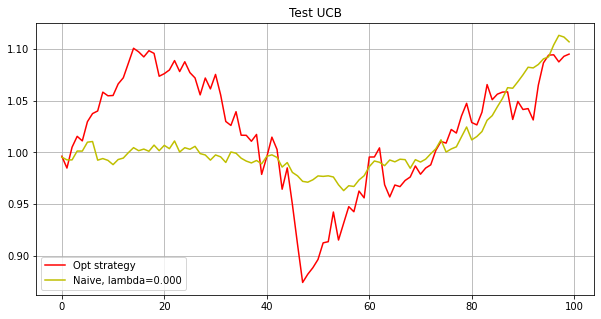

Phase 1
Testing...
./tmp2/snp500-12_phase01_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.     0.     0.     0.2808 0.     0.     0.     0.     0.     0.
 0.     0.0298 0.     0.0894 0.     0.     0.3    0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.2152
 0.     0.     0.     0.     0.     0.     0.     0.     0

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1729 -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0583 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1688  0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0182
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.0985 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.

[-0.     -0.     -0.      0.3    -0.     -0.      0.0001 -0.     -0.
  0.2868 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1141 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.      0.      0.      0.3     0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.    

[-0.      0.      0.      0.1804  0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.3    -0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.095   0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.     -0.
  0.1246]
[-0.      0.      0.1237 -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.2763 -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.    

[-0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0036 -0.     -0.
 -0.     -0.     -0.     -0.      0.0673 -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.3    -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.      0.0291 -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.    ]
[0.     0.     0.     0.     0.     0.2251 0.     0.     0.     0.
 0.     0.     0.3    0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0

[-0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0351  0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0649]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.3     0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.    

[-0.     -0.      0.1542 -0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.3    -0.      0.      0.1617 -0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.0841  0.
  0.      0.      0.      0.      0.3     0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.025   0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0856 -0.
 -0.     -0.      0.    

[ 0.      0.      0.      0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
 -0.     -0.     -0.      0.      0.1878 -0.      0.2122  0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.     -0.      0.3     0.
 -0.      0.     -0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.    ]
[-0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.1 -0.
 -0.   0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
  0.   0.3  0.   0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.3
  0.   0.   0.  -0. 

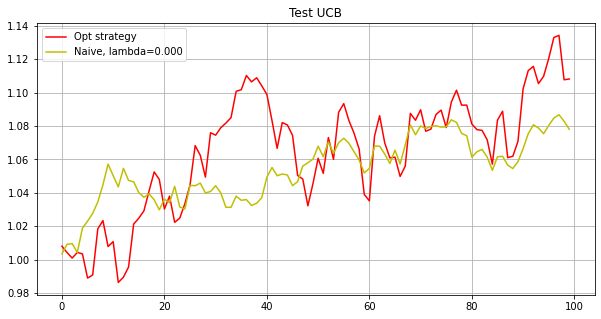

Phase 2
Testing...
./tmp2/snp500-12_phase02_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.      0.0003 -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.1002 -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.     -0.     -0.     -0.      

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.3    -0.      0.2418  0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.1582  0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.    ]
[0.     0.     0.     0.     0.     0.     0.2709 0.     0.     0.
 0.     0.     0.     0.     0.1701 0.     0.     0.     0.     0.2039
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.  

[ 0.      0.     -0.      0.     -0.      0.     -0.      0.      0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.1968 -0.     -0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.2032 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.      0.3    -0.     -0.
 -0.    ]
[-0.      0.      0.     -0.      0.0651 -0.      0.      0.      0.
 -0.      0.3     0.      0.     -0.     -0.      0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.2695
  0.     -0.      0

[ 0.      0.      0.      0.     -0.      0.      0.3     0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.      0.     -0.     -0.      0.     -0.      0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.1641  0.      0.
 -0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.2359  0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.      0.3     0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.   0.3 -0.   0.  -0.  -0.
 -0.   0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.
 -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.1  0.   0.  -0.
 -0.  -0.   0.   0.  

[0.     0.0242 0.     0.     0.     0.0926 0.0768 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.0025 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.0488 0.0558 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0913 0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.008  0.     0.     0.     0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0356 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.      0.092  -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
  0.1496 -0.     -0.     -0.      0.1583 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.    

[ 0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.      0.3     0.     -0.      0.      0.1269  0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.1256
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.0353 -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.1123  0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.    ]
[ 0.      0.     -0.      0.     -0.      0.3    -0.      0.      0.
  0.2812  0.1188  0.      0.      0.      0.     -0.      0.      0.
  0.3     0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.

[ 0.  -0.   0.  -0.   0.  -0.   0.  -0.  -0.  -0.   0.3  0.   0.  -0.
 -0.   0.   0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.3  0.   0.   0.   0.   0.
 -0.  -0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.  -0.  -0.  -0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.  -0.   0.  -0.   0.3 -0.   0.   0.1  0.
  0.  -0. ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
  0.      0.      0.      0.      0.2044  0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.   

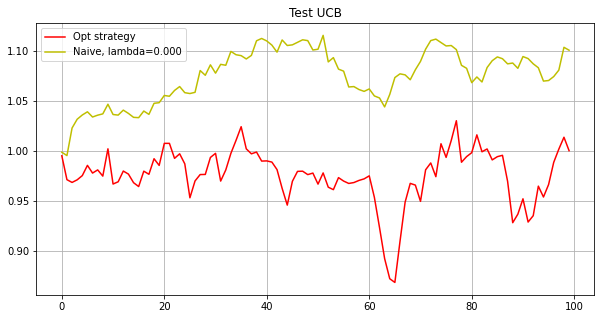

Phase 3
Testing...
./tmp2/snp500-12_phase03_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.      0.2058 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.1942
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
[0.     0.     0.     0.     0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1246 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2754 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.   0.   0.   0.   0.1 -0.  -0.
 -0.  -0.  -0.   0.  

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.0994  0.      0.      0.      0.     -0.      0.      0.1821  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.3     0.     -0.      0.      0.      0.
  0.      0.3     0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.0394 -0.      0.0791  0.     -0.      0.      0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.    ]
[0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.2605 0.     0

[-0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.   0.3 -0.   0.
 -0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.   0.   0.3 -0.   0.
 -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.3  0.  -0.  -0.  -0.
  0.  -0.   0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.1 -0. ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.2584 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.1299 0.     0.
 0.3    0.     0.     0.     0.     0.0117 0.     0.     0.     0.
 0.     0.     0.     0.    

[ 0.      0.      0.      0.0241  0.      0.      0.     -0.      0.
  0.     -0.      0.2444  0.     -0.     -0.     -0.      0.     -0.
  0.     -0.      0.     -0.      0.     -0.     -0.      0.3     0.
 -0.      0.     -0.     -0.      0.     -0.      0.      0.1642  0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.0979  0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.1694 -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.      0.      0.      0.2291
 -0.     -0.      0.

[-0.  -0.  -0.   0.3 -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.   0.
 -0.   0.   0.   0.   0.1  0.  -0.   0.  -0.  -0.   0.   0.3 -0.   0.
 -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.  -0.  -0.
 -0.   0.  -0.   0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.   0.   0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.
  0.  -0.   0.3 -0.   0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.  -0. ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0303 -0.      0.0956 -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0029 -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2712 -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.      0.      0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0105 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0895 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
Opt strategy   Total log return: 0.17081018    Max redraw: 0.13161491
Total return: 1.18626555
Mean return: 1.00170956
Naive lambda: 0.000   Total log return: 0.22606109
Total return: 1.25365225
Mean return: 1.00226317


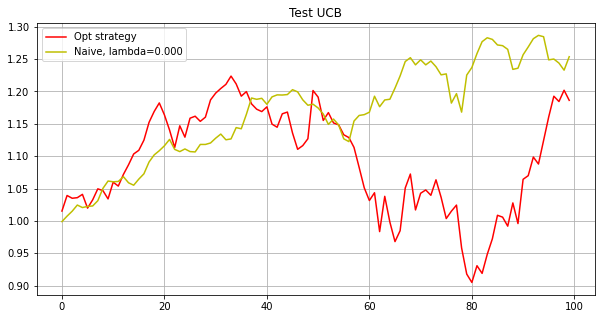

Phase 4
Testing...
./tmp2/snp500-12_phase04_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.      0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.1099 -0.      0.      0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.      0.0859  0.     -0.      0.     -0.     -0.      0.3
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.2043 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.     -0.      0.      0.      

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.3     0.     -0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1259 -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2741 -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0

[ 0.0568 -0.     -0.     -0.      0.0834 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2598 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.3  0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  

[-0.      0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.     -0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.      0.     -0.      0.1155 -0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.3     0.     -0.      0.      0.2134 -0.
  0.      0.      0.2986  0.     -0.      0.     -0.      0.0725  0.
  0.      0.      0.     -0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.2355 0.3
 0.     0.     0.     0.     

[ 0.1091  0.      0.      0.0079  0.      0.      0.      0.1038  0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.1567  0.      0.      0.      0.      0.      0.
  0.      0.      0.2086 -0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.0451  0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.0529  0.      0.      0.      0.      0.0159  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.      0.2196 -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.1965  0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.      0.0581 -0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.      0.      0.0419  0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.      0.3    -0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.3     0.      0.     -0.      0.3     0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.3     0.      0.     -0.
  0.     -0.      0.     -0.      0.      0.1682 -0.     -0.      0.
  0.      0.1881  0.    

[-0.     -0.     -0.     -0.      0.2021 -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.2398  0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.3     0.2581 -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
 -0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.      0.      0.      0.      0.1831  0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.0504  0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.      0.      0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.      0.3    -0.      0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.      0.1086  0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.     -0.
  0.0578]
[ 0.0835  0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.1744  0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.2225  0.
 -0.      0.     -0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
 -0.      0.      0.1931  0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2491  0.
  0.     -0.      0.     -0.      0.      0.      0.      0.2578 -0.
 -0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
  0.     -0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.     -0.      0.3    -0.     -0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.      0.
 -0.    ]
Opt strategy   Total log return: 0.15957320    Max redraw: 0.09870406
Total return: 1.17301012
Mean return: 1.00159701
Naive lambda: 0.000   Total log return: 0.13524916
Total return: 1.14482199
Mean return: 1.00135341


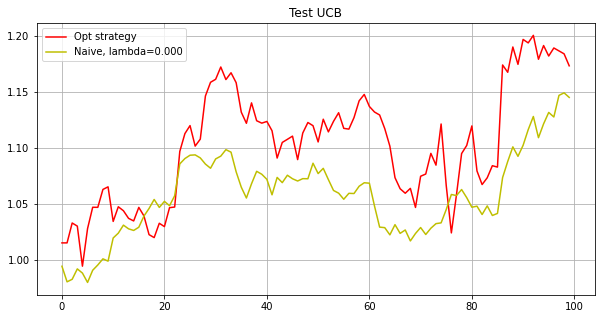

Phase 5
Testing...
./tmp2/snp500-12_phase05_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.     -0.      0.      0.218   0.     -0.      0.      0.
  0.      0.     -0.      0.      0.3     0.      0.     -0.      0.1461
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.      0.      0.     -0.      0.      0.3
  0.0359 -0.      0.      0.      0.     -0.     -0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
  0.    ]
[-0.     -0.     -0.     -0.  

[-0.     -0.      0.     -0.     -0.     -0.      0.3    -0.      0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.1599 -0.     -0.      0.
 -0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.2401 -0.      0.      0.      0.3     0.      0.     -0.
  0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.1562  0.      0.
  0.      0.      0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.3     0.      0.
  0.      0.     -0.    

[ 0.      0.      0.      0.      0.      0.      0.1713  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.3     0.      0.      0.0241  0.      0.
  0.      0.      0.      0.137   0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.      0.1906  0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.1642  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0129  0.     -0.      0.
  0.    ]
[-0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.      0.3     0.      0.      0.      0.
 -0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.     -0.      0.    

[-0.  -0.  -0.   0.3 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[-0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.      0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.     -0.     -0.      0.      0.2068
  0.      0.     -0.      0.      0.3    -0.      0.     -0.      0.1402
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.
 -0.   

[ 0.      0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
  0.      0.     -0.      0.0629 -0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.3    -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.2036 -0.     -0.     -0.
  0.      0.3    -0.      0.     -0.     -0.     -0.      0.      0.
 -0.      0.     -0.     -0.      0.1336 -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.
  0.   0.   0.   0.  

[ 0.      0.      0.      0.      0.     -0.      0.3    -0.     -0.
 -0.      0.      0.      0.     -0.      0.      0.0623 -0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.0942  0.      0.
  0.      0.     -0.     -0.      0.     -0.      0.2438  0.      0.
  0.     -0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0162  0.      0.2835 -0.     -0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.   0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.  -0.  -0.   0.   0.3
  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.   0.1 -0.  -0. 

[-0.     -0.     -0.      0.2562 -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0059  0.0501  0.3
 -0.     -0.      0.     -0.     -0.      0.      0.3    -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.      0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.0878 -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.    ]
[ 0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.  -0.
  0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.  -0.
  0.  -0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.1
  0.   0.   0.   0.

[ 0.      0.     -0.      0.0574  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.3
  0.     -0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.0302  0.     -0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0123  0.      0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.     -0.      0.     -0.      0.      0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.   

[-0.     -0.      0.     -0.     -0.     -0.      0.1486 -0.     -0.
 -0.     -0.     -0.     -0.      0.2514 -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.3    -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
 -0.    ]
[ 0.     -0.      0.      0.      0.     -0.      0.3    -0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.3    -0.     -0.      0.      0.      0.
 -0.     -0.     -0.    

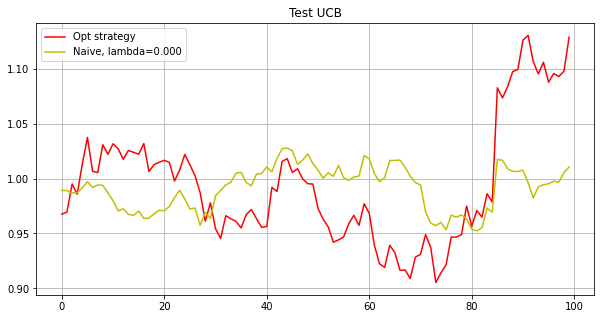

Phase 6
Testing...
./tmp2/snp500-12_phase06_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.0714 -0.      0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.1076 -0.      0.     -0.      0.
  0.0928 -0.     -0.     -0.     -0.     -0.      0.0309 -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.3
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.0973 -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.3     0.
  0.      0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      

[ 0.      0.      0.      0.0945  0.     -0.      0.      0.      0.0139
  0.      0.      0.      0.      0.      0.      0.      0.2176  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.      0.2931  0.     -0.      0.      0.3     0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.081   0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.      0.3    -0.     -0.     -0.      0.      0.1768
 -0.      0.    

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.1 -0.   0.3 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0027
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.      0.3    -0.      0.0009
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.   

[ 0.      0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.2835
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.3     0.      0.3     0.      0.
  0.      0.1165 -0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.0103 -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.0721
 -0.      0.    

[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.1087
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.      0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.2913 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.      0.1236 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0

[0.     0.     0.     0.     0.0051 0.     0.     0.     0.0001 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.1441 0.     0.     0.     0.
 0.     0.     0.     0.0694 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.1812 0.     0.     0.     0.    ]
[ 0.      0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.      0.      0.      0.     -0.     -0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.234  -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.0589
  0.2529  0.     -0.      0.      0.      0. 

[ 0.      0.      0.      0.      0.0906 -0.      0.     -0.      0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.0258  0.
  0.     -0.     -0.      0.2381 -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.1916 -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.3     0.     -0.     -0.      0.      0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.      0.      0.1539 -0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.     -0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[-0.      0.     -0.     -0.      0.0426 -0.     -0.     -0.     -0.
  0.0988  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2586 -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.1305
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
  0.      0.     -0

[ 0.      0.      0.      0.2581 -0.     -0.     -0.     -0.      0.3
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.1419 -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
[ 0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0708 -0.
 -0.     -0.      0.      0.      0.0208 -0.     -0.      0.3    -0.
  0.     -0.     -0.   

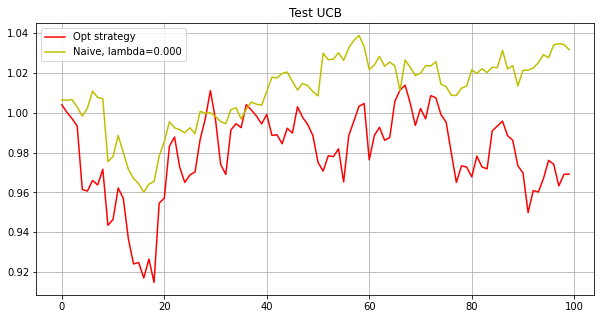

Phase 7
Testing...
./tmp2/snp500-12_phase07_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1299 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.2701
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.0826  0.   

[-0.   0.  -0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.1
  0.   0.   0.  -0.  -0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.  -0.  -0.   0.   0.   0.   0.3  0.  -0.   0.   0.  -0.   0.   0.
 -0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.3  0.   0.  -0.   0.   0.   0.3  0.   0.  -0.  -0.  -0.  -0.
 -0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.
 -0.   0.   0.   0.   0.   0.  -0.  -0.  -0.   0.   0.   0.   0.   0.
  0.   0. ]
[-0.      0.      0.1348 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.      0.2652 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.  

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.1981 0.     0.     0.2976 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.2042 0.     0.     0.     0.     0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.0605 0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.1799 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.1512
 0.     0.     0.     0.     0.     0.     0.     0. 

[-0.   0.  -0.   0.   0.   0.   0.  -0.   0.   0.   0.1  0.   0.  -0.
  0.   0.   0.  -0.   0.3  0.   0.  -0.   0.   0.   0.   0.   0.   0.
  0.   0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.3  0.   0.
 -0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.  -0.  -0.   0.
  0.   0.   0.   0.  -0.   0.   0.   0.   0.3  0.   0.  -0.   0.   0.
 -0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
[0.     0.     0.3    0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.0885 0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0115 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     

[-0.     0.     0.     0.     0.     0.     0.    -0.     0.     0.
  0.     0.     0.    -0.    -0.     0.     0.    -0.    -0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.077 -0.     0.
  0.    -0.    -0.     0.     0.3    0.     0.    -0.     0.     0.023
  0.    -0.    -0.     0.     0.    -0.    -0.    -0.     0.     0.
  0.     0.     0.     0.     0.    -0.     0.    -0.     0.     0.
 -0.     0.     0.     0.     0.    -0.     0.3   -0.    -0.    -0.
 -0.     0.     0.     0.    -0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.3    0.     0.    -0.     0.    -0.     0.
  0.    -0.    -0.     0.    -0.     0.     0.     0.     0.    -0.   ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.     -0.     -0.      0.      0.2139  0.
  0.     -0.      0.      0.      0. 

[-0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.1854 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.      0.2146 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.   0.   0.3 -0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.   0.1
 -0.   0.   0.  -0.  -0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.  -0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.3  0.   0.
 -0.   0.   0.   0.

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.2631  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.1369  0.
  0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.  -0.   0.1  0.   0.   0.  -0.  -0.   0.   0.   0.  -0.   0.  -0.
  0.   0.   0.  -0.  -0.   0.   0.  -0.   0.  -0.   0.   0.   0.  -0.
 -0.   0.  -0.  -0.  -0.   0.   0.3 -0.  -0.  -0.   0.   0.3  0.   0.
 -0.   0.   0.  -0.  

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.3 -0.   0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.
  0.1 -0. ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0965 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0035 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.    

[-0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.      0.3     0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.0967  0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.      0.285
  0.      0.0183 -0.     -0.     -0.     -0.      0.      0.      0.3
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.    ]
[-0.     -0.      0.2809  0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.0208 -0.      0.     -0.      0.     -0.      0.
 -0.     -0.      0.

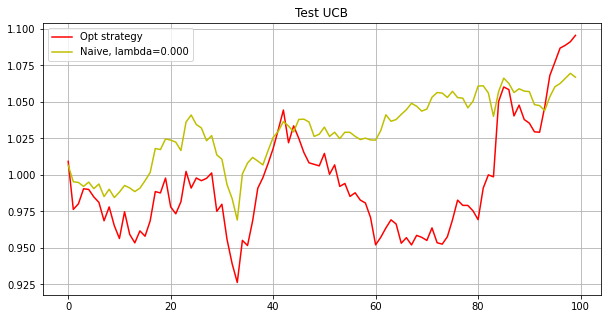

Phase 8
Testing...
./tmp2/snp500-12_phase08_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.   0.  -0.  -0.
 -0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.
  0.   0.   0.   0.3  0.   0.   0.  -0.   0.  -0.  -0.   0.  -0.  -0.
 -0.   0.  -0.   0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.
 -0.  -0.   0.   0.3 -0.  -0.  -0.   0.  -0.  -0.  -0.   0.3 -0.   0.1
  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.  -0.   0.
  0.   0. ]
[0.2575 0.     0.     0.     0.     0.     0.     0.2729 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0015
 0.     0.     0.     0.     0.     0.     0.     0.0675 0.     0.
 0.     0.     0.     0.     

[0.1302 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.2006 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.0692 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.    ]
[-0.   0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.
 -0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.  -0.   0.  -0.   0.1
 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.
  0.  -0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.   0.  -0.  -0.
 -0.   0.3 -0.   0.  -0.   0.   0.   0.  -0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.13
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.      0.2704 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.0579 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0016 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.  

[0.3    0.     0.     0.     0.     0.     0.     0.2629 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.1371 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.     -0.     -0.     -0.      0.0197 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     

[ 0.      0.      0.      0.      0.1224  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.1629  0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3    -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.1147  0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.3
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.3 -0.   0.  -0.  -0.  -0.   0.   0.   0.   0.  -0.   0.   0.   0.
 -0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.  -0.   0.  -0.   0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.
  0.   0.   0.   0. 

[ 0.2778  0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.2119  0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.     -0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.2102  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.    ]
[ 0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.0939  0.      0.0061

[0.1697 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.1905 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.0398 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.    ]
[ 0.0737 -0.     -0.     -0.     -0.     -0.     -0.      0.0137 -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.     -0.
  0.     -0.      0.2608  0.      0.      0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.      0.     

[ 0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.     -0.
  0.3     0.3    -0.     -0.     -0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.2008 -0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.      0.     -0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.     -0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.1992 -0.      0.      0.     -0.      0.      0.     -0.
  0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.   0.  -0.   0.
 -0.  -0.   0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.3
 -0.   0.   0.  -0. 

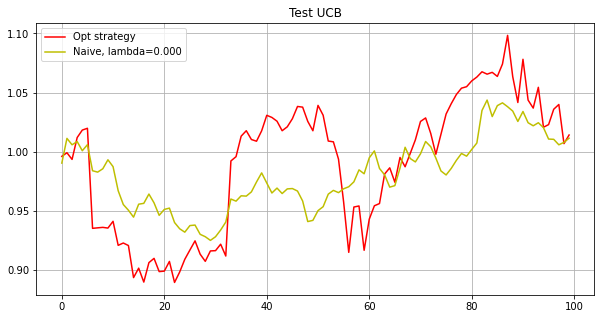

Phase 9
Testing...
./tmp2/snp500-12_phase09_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
  0.2834 -0.      0.      0.      0.2349  0.      0.      0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.2111  0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.2705 -0.      0.      0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.     -0.     -0.      0.      0.     -0.     -0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0

[-0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.   0.  -0.  -0.   0.  -0.
  0.   0.  -0.   0.   0.   0.   0.  -0.   0.  -0.  -0.   0.  -0.  -0.
 -0.  -0.   0.  -0.   0.   0.3  0.   0.  -0.  -0.   0.   0.   0.   0.
 -0.   0.  -0.   0.  -0.  -0.   0.   0.   0.3 -0.  -0.   0.   0.   0.
  0.  -0.  -0.   0.1 -0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0.   0.  -0.   0.   0.  -0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.  -0.   0.   0.
 -0.  -0. ]
[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.1  0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.3  0.   0.3  0.   0.   0.   0.   0.   0.   0.
  0.   0

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0416 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.0584 -0.     -0.      0.3    -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.3    -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
 -0.  -0.  -0.  -0.  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0392 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.      0.0608 -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.0234
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.

[0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0969 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0031 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.0821 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     

[ 0.     -0.     -0.     -0.     -0.      0.     -0.      0.2078  0.
  0.3    -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.      0.     -0.
 -0.     -0.      0.      0.      0.     -0.      0.      0.1922 -0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.      0.      0.3     0.     -0.      0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.      0.     -0.     -0.      0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.1997 0

[0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.2911
 0.     0.     0.     0.     0.     0.     0.1073 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.     -0.     -0.     -0.     -0.      0.     -0.      0.1932  0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.2068  0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.3     0.     -0.
  0.     -0.      0.     -0.      0.     -0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2159 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0943 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1755 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2144 -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.    

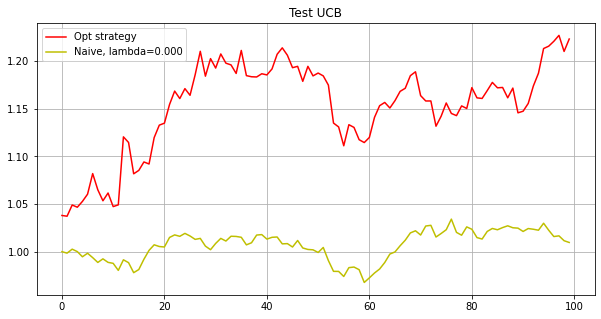

Phase 10
Testing...
./tmp2/snp500-12_phase10_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.0355
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0645 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.    ]
[0.     0.     0.     0.     0

[-0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.   0.   0.
  0.1  0.   0.   0.   0.  -0.   0.   0.3  0.   0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.   0.3  0.  -0.   0.   0.   0.   0.   0.  -0.
 -0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.  -0.
 -0.   0. ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.1 -0.
 -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.   0.3 -0.  -0.
 -0.   0.  -0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.
 -0.  -0.   0.   0.   0.  -0.   0.  -0.  -0.  -0.   0.   0.3  0.  -0.
 -0.  -0.   0.3  0.   0.  -0.  -0.  -0.   0.   0.   0.   0.   0.  -0.
  0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.   0.  -0.
 -0.   0

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.2157  0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.0816  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.1027  0.      0.      0.
  0.3   ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.    

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.1 -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[-0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0076
 -0.     -0.     -0.     -0.      0.0249 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1195 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.1 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.
  0.  -0.   0.   0.   0.3  0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.
 -0.  -0.   0.3 -0.   0.  -0.   0.3 -0.   0.   0.   0.   0.   0.  -0.
  0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.  -0.  -0.
 -0.   0. ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0002 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.1011 -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.   

[ 0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.      0.      0.2625  0.0803 -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.     -0.
  0.0572 -0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.3     0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.3   ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.2163  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.     -0.      0.      0.3     0.      0.1837  0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.     -0.      0.      0.      0.
  0.    ]
[-0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.   0.  -0.
  0.1  0.   0.   0.   0.  -0.   0.   0.3  0.  -0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.  -0.  

[-0.   0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.   0.  -0.
 -0.  -0.   0.   0.   0.  -0.   0.  -0.   0.  -0.   0.   0.   0.   0.
 -0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.1 -0.
 -0.   0.   0.  -0.   0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.  -0.   0.   0.   0.  -0.   0.  -0.
  0.  -0.   0.   0.   0.   0.   0.3  0.   0.   0.3  0.   0.   0.  -0.
  0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.  -0.
 -0.   0.3]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.2133 0.     0.     0.171  0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0157 0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.    

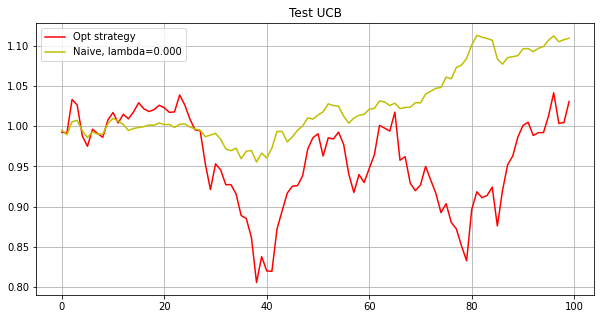

Phase 11
Testing...
./tmp2/snp500-12_phase11_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.      0.      0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.2842  0.1158  0.     -0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.     -0.      0.      0.3
 -0.      0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.     -0.      0.     -0.     -0.      0.3    -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.      0.
  0.    ]
[ 0.  -0.  -0.   0.  -0.   0.  -0

[ 0.   0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.  -0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.1  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.   0.3  0.   0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.  -0.   0.
 -0.   0. ]
[0.     0.     0.     0.     0.     0.     0.     0.1396 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1229 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0793 0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.0582 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     

[-0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.
  0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.   0.  -0.   0.  -0.
 -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.3
 -0.  -0.  -0.   0.  -0.   0.  -0.   0.  -0.  -0.   0.   0.   0.  -0.
 -0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.
  0.  -0.   0.3  0.3  0.   0.   0.  -0.   0.  -0.   0.  -0.  -0.   0.
 -0.   0. ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1573 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2427 -0.
 -0.     -0. 

[ 0.      0.      0.      0.      0.      0.      0.      0.1304  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.3     0.1007  0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.086
  0.      0.      0.      0.      0.      0.083   0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0009 -0.     -0.     -0.     -0.      0.0142 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0354 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.0646 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.     -0.     -0.      0.     -0.     -0.     -0.      0.1571 -0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.    

[ 0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.     -0.      0.     -0.
 -0.     -0.      0.3     0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.2417  0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.3    -0.      0.     -0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.0455  0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.1128  0.     -0.
  0.      0.      0.      0.      0.     -0.     -0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0228 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.   

[-0.     -0.      0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.3
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.0347  0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.      0.0653 -0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.      0.3    -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.      0.      0.      0.     -0.
 -0.    ]
[ 0.     -0.     -0.     -0.     -0.     -0.     -0.      0.059  -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.0214 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.   

[ 0.     -0.      0.      0.      0.      0.     -0.      0.3    -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.      0.      0.      0.      0.      0.0649
  0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0351  0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.     -0.      0.      0.      0.      0.      0.      0.3     0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.

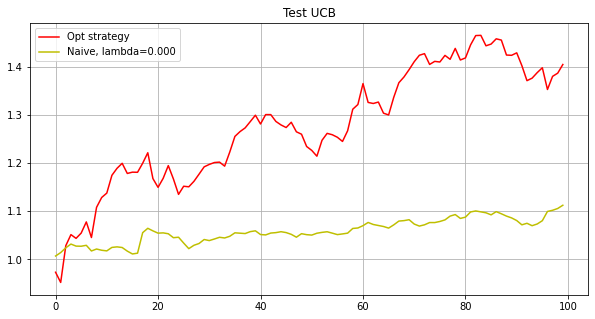

-----------------------------Final result-----------------------------
Opt strategy
Total return: 3.63736849
Mean return: 1.00107663
Naive strategy
Total return: 2.64346537
Mean return: 1.00081040


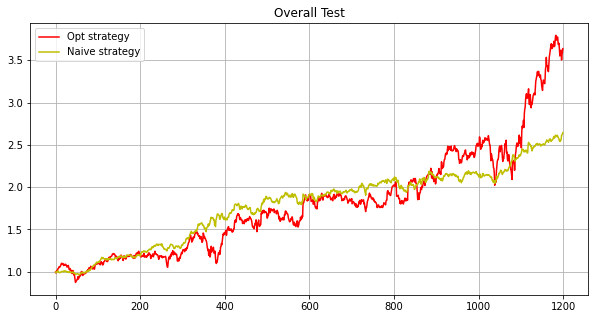

In [35]:
paras={'dataset':'snp500-12', 'maxiter':5000, 'subn':100, 'lb':5, 'M':20, 'inverse':'True', 'ggd':'True', 'matcnt':30}

gamma=3.0
run(paras, c=0.0, gamma=gamma, testv=np.arange(-0.02, 0.0100001, 0.002))

Phase 0
Testing...
./tmp2/res_phase00_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
3.0746043313632093e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
9.360672173023762e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.1491551553834481e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
4.412497353200803e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
6.648335709562303e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.0488477648597228e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
7.316562491976875e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

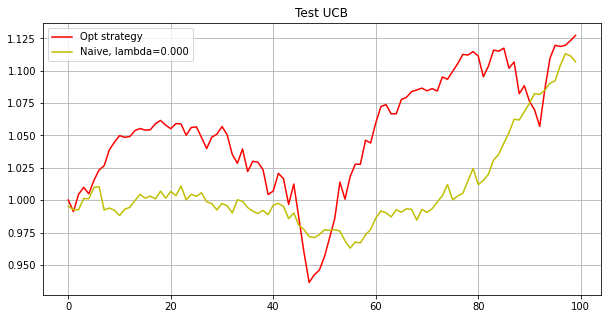

Phase 1
Testing...
./tmp2/res_phase01_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
2.1350271444883773e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
6.278147989154104e-07
[0.0099 0.0099 0.0101 0.0094 0.01   0.0099 0.0096 0.0099 0.0096 0.0106
 0.0098 0.0097 0.0095 0.0103 0.01   0.01   0.0096 0.0101 0.0101 0.0106
 0.0097 0.0098 0.0101 0.0102 0.01   0.0096 0.01   0.0101 0.0104 0.01
 0.0103 0.0104 0.0097 0.0106 0.0099 0.0099 0.0099 0.0101 0.01   0.0098
 0.0102 0.0103 0.0101 0.01   0.0103 0.0104 0.0099 0.0101 0.0094 0.0101
 0.0099 0.0101 0.01   0.0099 0.0098 0.01   0.0101 0.01   0.0099 0.0102
 0.0102 0.0102 0.0102 0.0099 0.0096 0.0097 0.

[0.0099 0.0099 0.0101 0.0094 0.01   0.0099 0.0096 0.0099 0.0096 0.0106
 0.0098 0.0096 0.0095 0.0103 0.01   0.01   0.0096 0.0101 0.0101 0.0106
 0.0097 0.0098 0.0101 0.0102 0.01   0.0096 0.01   0.0101 0.0104 0.01
 0.0103 0.0104 0.0097 0.0106 0.0099 0.0099 0.0099 0.0101 0.01   0.0098
 0.0102 0.0103 0.0101 0.01   0.0103 0.0104 0.0099 0.0101 0.0094 0.0101
 0.0099 0.0101 0.01   0.0099 0.0098 0.01   0.0101 0.01   0.01   0.0102
 0.0102 0.0102 0.0102 0.0099 0.0096 0.0097 0.0102 0.01   0.0101 0.0097
 0.0099 0.0101 0.01   0.0101 0.0101 0.0101 0.0101 0.0101 0.0096 0.0102
 0.0101 0.0098 0.01   0.0103 0.01   0.0104 0.0089 0.0102 0.0103 0.0099
 0.0101 0.01   0.0097 0.01   0.0099 0.0097 0.01   0.0101 0.0103 0.0099]
2.164661966577719e-06
[0.0099 0.0099 0.0101 0.0094 0.01   0.0099 0.0096 0.0099 0.0096 0.0106
 0.0098 0.0096 0.0095 0.0103 0.01   0.01   0.0096 0.0101 0.0101 0.0106
 0.0097 0.0098 0.0101 0.0102 0.01   0.0096 0.01   0.0101 0.0104 0.01
 0.0103 0.0104 0.0097 0.0106 0.0099 0.0099 0.0099 0.0101 0

[0.0099 0.0099 0.0101 0.0094 0.01   0.0099 0.0096 0.0099 0.0096 0.0106
 0.0098 0.0096 0.0095 0.0103 0.01   0.01   0.0096 0.0101 0.0101 0.0106
 0.0097 0.0098 0.0101 0.0102 0.01   0.0096 0.01   0.0101 0.0104 0.01
 0.0103 0.0104 0.0097 0.0106 0.0099 0.0099 0.0099 0.0101 0.01   0.0098
 0.0102 0.0103 0.0101 0.01   0.0103 0.0104 0.0099 0.0101 0.0094 0.0101
 0.0099 0.0101 0.01   0.0099 0.0098 0.01   0.0101 0.01   0.01   0.0102
 0.0102 0.0102 0.0102 0.0099 0.0096 0.0097 0.0102 0.01   0.0101 0.0097
 0.0099 0.0101 0.01   0.0101 0.0101 0.0101 0.0101 0.0101 0.0096 0.0102
 0.0101 0.0098 0.01   0.0103 0.01   0.0104 0.0089 0.0102 0.0103 0.0099
 0.0101 0.01   0.0097 0.01   0.0099 0.0097 0.01   0.0101 0.0103 0.0099]
4.140545759685407e-06
[0.0099 0.0099 0.0101 0.0094 0.01   0.0099 0.0096 0.0099 0.0096 0.0106
 0.0098 0.0096 0.0095 0.0103 0.01   0.01   0.0096 0.0101 0.0101 0.0106
 0.0097 0.0098 0.0101 0.0102 0.01   0.0096 0.01   0.0101 0.0104 0.01
 0.0103 0.0104 0.0097 0.0106 0.0099 0.0099 0.0099 0.0101 0

[0.0099 0.0099 0.0101 0.0094 0.01   0.0099 0.0096 0.0099 0.0096 0.0106
 0.0098 0.0096 0.0095 0.0103 0.01   0.01   0.0096 0.0101 0.0101 0.0106
 0.0097 0.0098 0.0101 0.0102 0.01   0.0096 0.01   0.0101 0.0104 0.01
 0.0103 0.0104 0.0097 0.0106 0.0099 0.0099 0.0099 0.0101 0.01   0.0098
 0.0102 0.0103 0.0101 0.01   0.0103 0.0104 0.0099 0.0101 0.0094 0.0101
 0.0099 0.0101 0.01   0.0099 0.0098 0.01   0.0101 0.01   0.01   0.0102
 0.0102 0.0102 0.0102 0.0099 0.0096 0.0097 0.0102 0.01   0.0101 0.0097
 0.0099 0.0101 0.01   0.0101 0.0101 0.0101 0.0101 0.0101 0.0096 0.0102
 0.0101 0.0098 0.01   0.0103 0.01   0.0104 0.0089 0.0102 0.0103 0.0099
 0.0101 0.01   0.0097 0.01   0.0099 0.0097 0.01   0.0101 0.0103 0.0099]
7.916602840288278e-09
[0.0097 0.0096 0.0102 0.0095 0.0097 0.0098 0.0087 0.0099 0.0094 0.0099
 0.0097 0.0095 0.0096 0.0118 0.009  0.0102 0.0086 0.0098 0.01   0.0113
 0.009  0.0086 0.0103 0.0106 0.0099 0.0089 0.0099 0.0106 0.0109 0.0096
 0.0104 0.0103 0.0086 0.0108 0.0097 0.0097 0.0102 0.0097

[0.0097 0.0096 0.0102 0.0095 0.0097 0.0098 0.0087 0.0099 0.0094 0.0099
 0.0097 0.0095 0.0096 0.0118 0.009  0.0102 0.0086 0.0098 0.01   0.0113
 0.009  0.0086 0.0103 0.0106 0.0099 0.0089 0.0099 0.0106 0.0109 0.0096
 0.0104 0.0103 0.0086 0.0108 0.0097 0.0097 0.0102 0.0097 0.0099 0.0088
 0.0112 0.0097 0.0105 0.01   0.0106 0.0105 0.0094 0.0106 0.0094 0.0106
 0.0098 0.0104 0.009  0.0102 0.0098 0.0102 0.0105 0.01   0.0092 0.0105
 0.011  0.0106 0.0106 0.0115 0.0093 0.01   0.0102 0.0094 0.0105 0.0105
 0.0095 0.0103 0.0102 0.0096 0.0104 0.0102 0.0102 0.0105 0.0097 0.0105
 0.0102 0.0099 0.0098 0.0101 0.0099 0.0116 0.0079 0.0101 0.0104 0.0101
 0.0104 0.0104 0.009  0.0104 0.0097 0.0099 0.0101 0.0102 0.0107 0.0095]
1.3303552076279757e-07
[0.0097 0.0096 0.0102 0.0095 0.0097 0.0098 0.0087 0.0099 0.0094 0.0099
 0.0097 0.0095 0.0096 0.0118 0.009  0.0102 0.0086 0.0098 0.01   0.0113
 0.009  0.0086 0.0103 0.0106 0.0099 0.0089 0.0099 0.0106 0.0109 0.0096
 0.0104 0.0103 0.0086 0.0108 0.0097 0.0097 0.0102 0.0

[0.0097 0.0096 0.0102 0.0095 0.0097 0.0098 0.0087 0.0099 0.0094 0.0099
 0.0097 0.0095 0.0096 0.0118 0.009  0.0102 0.0086 0.0098 0.01   0.0113
 0.009  0.0086 0.0103 0.0106 0.0099 0.0089 0.0099 0.0106 0.0109 0.0096
 0.0104 0.0103 0.0086 0.0108 0.0097 0.0097 0.0102 0.0097 0.0099 0.0088
 0.0112 0.0097 0.0105 0.01   0.0106 0.0105 0.0094 0.0106 0.0094 0.0106
 0.0098 0.0104 0.009  0.0102 0.0098 0.0102 0.0105 0.01   0.0092 0.0105
 0.011  0.0106 0.0106 0.0115 0.0093 0.01   0.0102 0.0094 0.0105 0.0105
 0.0095 0.0103 0.0102 0.0096 0.0104 0.0102 0.0102 0.0105 0.0097 0.0105
 0.0102 0.0099 0.0098 0.0101 0.0099 0.0116 0.0079 0.0101 0.0104 0.0101
 0.0104 0.0104 0.009  0.0104 0.0097 0.0099 0.0101 0.0102 0.0107 0.0095]
1.0816130620577152e-06
[0.0097 0.0096 0.0102 0.0095 0.0097 0.0098 0.0087 0.0099 0.0094 0.0099
 0.0097 0.0095 0.0096 0.0118 0.009  0.0102 0.0086 0.0098 0.01   0.0113
 0.009  0.0086 0.0103 0.0106 0.0099 0.0089 0.0099 0.0106 0.0109 0.0096
 0.0104 0.0103 0.0086 0.0108 0.0097 0.0097 0.0102 0.0

[0.0097 0.0096 0.0102 0.0095 0.0097 0.0098 0.0087 0.0099 0.0094 0.0099
 0.0097 0.0095 0.0096 0.0118 0.009  0.0102 0.0086 0.0098 0.01   0.0113
 0.009  0.0086 0.0103 0.0106 0.0099 0.0089 0.0099 0.0106 0.0109 0.0096
 0.0104 0.0103 0.0086 0.0108 0.0097 0.0097 0.0102 0.0097 0.0099 0.0088
 0.0112 0.0097 0.0105 0.01   0.0106 0.0105 0.0094 0.0106 0.0094 0.0106
 0.0098 0.0104 0.009  0.0102 0.0098 0.0102 0.0105 0.01   0.0092 0.0105
 0.011  0.0106 0.0106 0.0115 0.0093 0.01   0.0102 0.0094 0.0105 0.0105
 0.0095 0.0103 0.0102 0.0096 0.0104 0.0102 0.0102 0.0105 0.0097 0.0105
 0.0102 0.0099 0.0098 0.0101 0.0099 0.0116 0.0079 0.0101 0.0104 0.0101
 0.0104 0.0104 0.009  0.0104 0.0097 0.0099 0.0101 0.0102 0.0107 0.0095]
2.9525167512742256e-06
[0.0097 0.0096 0.0102 0.0095 0.0097 0.0098 0.0087 0.0099 0.0094 0.0099
 0.0097 0.0095 0.0096 0.0118 0.009  0.0102 0.0086 0.0098 0.01   0.0113
 0.009  0.0086 0.0103 0.0106 0.0099 0.0089 0.0099 0.0106 0.0109 0.0096
 0.0104 0.0103 0.0086 0.0108 0.0097 0.0097 0.0102 0.0

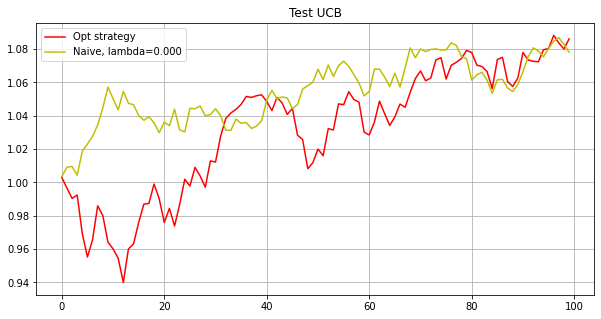

Phase 2
Testing...
./tmp2/res_phase02_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.5698379800949125e-09
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
2.2446848279428222e-08
[0.01   0.0102 0.0102 0.0085 0.01   0.0102 0.0102 0.0093 0.01   0.0101
 0.009  0.0101 0.0099 0.0095 0.0099 0.0094 0.0104 0.0097 0.0105 0.0103
 0.0105 0.0099 0.0104 0.0099 0.01   0.009  0.0099 0.0105 0.0102 0.01
 0.0098 0.0094 0.0103 0.0095 0.0085 0.0101 0.01   0.011  0.0101 0.009
 0.0107 0.0105 0.0102 0.0098 0.0103 0.0108 0.0103 0.0104 0.0101 0.0094
 0.01   0.0099 0.0097 0.0101 0.0105 0.0106 0.0102 0.0104 0.0101 0.0088
 0.009  0.0102 0.0102 0.0105 0.0102 0.01   0.

[0.0089 0.0107 0.0109 0.0068 0.0111 0.0094 0.0076 0.0075 0.0098 0.0084
 0.0054 0.0105 0.0104 0.0096 0.0108 0.0083 0.0106 0.0098 0.0085 0.0113
 0.0108 0.0091 0.0109 0.0091 0.0106 0.0084 0.0104 0.0117 0.0103 0.0096
 0.0082 0.0083 0.0101 0.008  0.0067 0.0102 0.0108 0.0123 0.0115 0.0101
 0.0094 0.0112 0.0099 0.0096 0.0108 0.0129 0.0111 0.0111 0.01   0.0101
 0.0101 0.0094 0.0091 0.0087 0.01   0.01   0.0108 0.0095 0.0103 0.0095
 0.0075 0.0105 0.0104 0.0112 0.0123 0.0109 0.0109 0.01   0.0098 0.0107
 0.0105 0.0121 0.0117 0.0106 0.0109 0.0107 0.0108 0.0102 0.0107 0.0103
 0.0113 0.0082 0.0102 0.01   0.0099 0.0107 0.0113 0.0111 0.0102 0.0103
 0.0104 0.0104 0.0091 0.0087 0.0099 0.0109 0.0083 0.0093 0.0103 0.0102]
1.2222942034206818e-07
[0.0089 0.0107 0.0109 0.0068 0.0111 0.0094 0.0076 0.0075 0.0098 0.0084
 0.0054 0.0105 0.0104 0.0096 0.0108 0.0083 0.0106 0.0098 0.0085 0.0113
 0.0108 0.0091 0.0109 0.0091 0.0106 0.0084 0.0104 0.0117 0.0103 0.0096
 0.0082 0.0083 0.0101 0.008  0.0067 0.0102 0.0108 0.0

[0.0089 0.0107 0.0109 0.0068 0.0111 0.0094 0.0076 0.0075 0.0098 0.0084
 0.0054 0.0105 0.0104 0.0096 0.0108 0.0083 0.0106 0.0098 0.0085 0.0113
 0.0108 0.0091 0.0109 0.0091 0.0106 0.0084 0.0104 0.0117 0.0103 0.0096
 0.0082 0.0083 0.0101 0.008  0.0067 0.0102 0.0108 0.0123 0.0115 0.0101
 0.0094 0.0112 0.0099 0.0096 0.0108 0.0129 0.0111 0.0111 0.01   0.0101
 0.0101 0.0094 0.0091 0.0087 0.01   0.01   0.0108 0.0095 0.0103 0.0095
 0.0075 0.0105 0.0104 0.0112 0.0123 0.0109 0.0109 0.01   0.0098 0.0107
 0.0105 0.0121 0.0117 0.0106 0.0109 0.0107 0.0108 0.0102 0.0107 0.0103
 0.0113 0.0082 0.0102 0.01   0.0099 0.0107 0.0113 0.0111 0.0102 0.0103
 0.0104 0.0104 0.0091 0.0087 0.0099 0.0109 0.0083 0.0093 0.0103 0.0102]
4.9165547856902525e-08
[0.0089 0.0107 0.0109 0.0068 0.0111 0.0094 0.0076 0.0075 0.0098 0.0084
 0.0054 0.0105 0.0104 0.0096 0.0108 0.0083 0.0106 0.0098 0.0085 0.0113
 0.0108 0.0091 0.0109 0.0091 0.0106 0.0084 0.0104 0.0117 0.0103 0.0096
 0.0082 0.0083 0.0101 0.008  0.0067 0.0102 0.0108 0.0

[0.0089 0.0107 0.0109 0.0068 0.0111 0.0094 0.0076 0.0075 0.0098 0.0084
 0.0054 0.0105 0.0104 0.0096 0.0108 0.0083 0.0106 0.0098 0.0085 0.0113
 0.0108 0.0091 0.0109 0.0091 0.0106 0.0084 0.0104 0.0117 0.0103 0.0096
 0.0082 0.0083 0.0101 0.008  0.0067 0.0102 0.0108 0.0123 0.0115 0.0101
 0.0094 0.0112 0.0099 0.0096 0.0108 0.0129 0.0111 0.0111 0.01   0.0101
 0.0101 0.0094 0.0091 0.0087 0.01   0.01   0.0108 0.0095 0.0103 0.0095
 0.0075 0.0105 0.0104 0.0112 0.0123 0.0109 0.0109 0.01   0.0098 0.0107
 0.0105 0.0121 0.0117 0.0106 0.0109 0.0107 0.0108 0.0102 0.0107 0.0103
 0.0113 0.0082 0.0102 0.01   0.0099 0.0107 0.0113 0.0111 0.0102 0.0103
 0.0104 0.0104 0.0091 0.0087 0.0099 0.0109 0.0083 0.0093 0.0103 0.0102]
3.445367505443969e-08
[0.0089 0.0107 0.0109 0.0068 0.0111 0.0094 0.0076 0.0075 0.0098 0.0084
 0.0054 0.0105 0.0104 0.0096 0.0108 0.0083 0.0106 0.0098 0.0085 0.0113
 0.0108 0.0091 0.0109 0.0091 0.0106 0.0084 0.0104 0.0117 0.0103 0.0096
 0.0082 0.0083 0.0101 0.008  0.0067 0.0102 0.0108 0.01

[0.0083 0.0113 0.0115 0.0063 0.0116 0.0086 0.006  0.0076 0.01   0.008
 0.0059 0.0107 0.01   0.0094 0.0111 0.0079 0.0109 0.0098 0.0072 0.0109
 0.0111 0.009  0.0113 0.0087 0.0107 0.0077 0.0109 0.0122 0.0107 0.0095
 0.0071 0.0075 0.0097 0.0089 0.0062 0.0101 0.01   0.013  0.0117 0.0103
 0.0096 0.0113 0.0101 0.0084 0.0112 0.0138 0.0115 0.0114 0.0099 0.0101
 0.0102 0.0092 0.0086 0.0091 0.01   0.0101 0.0112 0.0092 0.0105 0.0098
 0.0068 0.0104 0.0102 0.0115 0.0125 0.0114 0.0111 0.0101 0.0103 0.0108
 0.0098 0.0128 0.0123 0.0097 0.0116 0.0104 0.0111 0.0102 0.0109 0.0112
 0.0117 0.0079 0.0103 0.0099 0.0099 0.011  0.0117 0.0114 0.0101 0.0107
 0.0102 0.0107 0.0088 0.0077 0.0098 0.011  0.0077 0.0091 0.0104 0.0102]
8.088102015461028e-06
[0.0083 0.0113 0.0115 0.0063 0.0116 0.0086 0.006  0.0076 0.01   0.008
 0.0059 0.0107 0.01   0.0094 0.0111 0.0079 0.0109 0.0098 0.0072 0.0109
 0.0111 0.009  0.0113 0.0087 0.0107 0.0077 0.0109 0.0122 0.0107 0.0095
 0.0071 0.0075 0.0097 0.0089 0.0062 0.0101 0.01   0.013 

[0.007  0.012  0.0124 0.0039 0.0122 0.0099 0.0022 0.0062 0.0094 0.0087
 0.0066 0.0111 0.0099 0.0099 0.011  0.0068 0.0112 0.0099 0.0075 0.0117
 0.01   0.0078 0.0124 0.008  0.011  0.0074 0.0114 0.0132 0.0108 0.0082
 0.0052 0.0076 0.0107 0.0106 0.0057 0.0101 0.0082 0.013  0.0109 0.0064
 0.0103 0.0127 0.0105 0.0067 0.012  0.0136 0.0119 0.0117 0.0108 0.0104
 0.0106 0.0099 0.0091 0.0088 0.0098 0.0101 0.0108 0.009  0.0109 0.0068
 0.0077 0.0098 0.0109 0.0119 0.0122 0.0113 0.0115 0.0104 0.0112 0.0113
 0.0115 0.0128 0.0124 0.0087 0.0127 0.0092 0.0117 0.01   0.0113 0.0116
 0.0128 0.0094 0.0102 0.0099 0.0099 0.0113 0.0125 0.0122 0.0103 0.0116
 0.0106 0.0111 0.0079 0.0064 0.0096 0.0111 0.008  0.0083 0.0105 0.0119]
6.803315739908064e-05
[0.007  0.012  0.0124 0.0039 0.0122 0.0099 0.0022 0.0062 0.0094 0.0087
 0.0066 0.0111 0.0099 0.0098 0.011  0.0068 0.0112 0.01   0.0075 0.0117
 0.01   0.0078 0.0124 0.008  0.011  0.0074 0.0114 0.0132 0.0108 0.0082
 0.0052 0.0076 0.0107 0.0106 0.0057 0.0101 0.0082 0.01

[0.007  0.012  0.0124 0.0039 0.0122 0.0099 0.0022 0.0062 0.0094 0.0087
 0.0066 0.0111 0.0099 0.0098 0.011  0.0068 0.0112 0.01   0.0075 0.0117
 0.01   0.0078 0.0124 0.008  0.011  0.0074 0.0114 0.0132 0.0108 0.0082
 0.0052 0.0076 0.0107 0.0106 0.0057 0.0101 0.0082 0.013  0.0108 0.0064
 0.0103 0.0127 0.0105 0.0067 0.012  0.0136 0.0119 0.0117 0.0108 0.0104
 0.0106 0.0098 0.0091 0.0088 0.0098 0.0101 0.0108 0.009  0.0109 0.0068
 0.0077 0.0098 0.0109 0.0119 0.0122 0.0113 0.0115 0.0104 0.0112 0.0113
 0.0115 0.0128 0.0124 0.0087 0.0127 0.0092 0.0117 0.01   0.0113 0.0116
 0.0128 0.0094 0.0102 0.0099 0.0099 0.0113 0.0125 0.0122 0.0103 0.0116
 0.0106 0.0111 0.0079 0.0064 0.0096 0.011  0.008  0.0083 0.0105 0.0119]
3.0934819248741585e-08
[0.007  0.012  0.0124 0.0039 0.0122 0.0099 0.0022 0.0062 0.0094 0.0087
 0.0066 0.0111 0.0099 0.0098 0.011  0.0068 0.0112 0.01   0.0075 0.0117
 0.01   0.0078 0.0124 0.008  0.011  0.0074 0.0114 0.0132 0.0108 0.0082
 0.0052 0.0076 0.0107 0.0106 0.0057 0.0101 0.0082 0.0

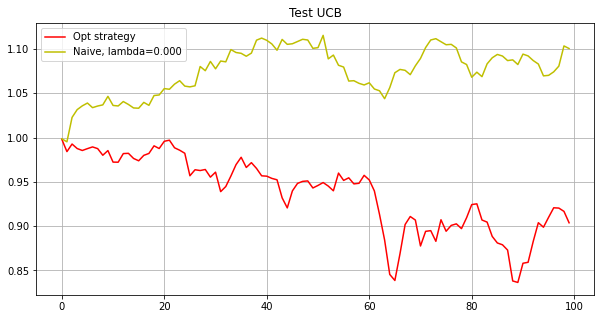

Phase 3
Testing...
./tmp2/res_phase03_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0116  0.0107  0.0079  0.      0.0051  0.009   0.0136  0.0067  0.0136
  0.0072  0.009   0.019   0.013   0.0115  0.0101  0.0127  0.01    0.0115
  0.0087  0.0107  0.0059  0.0031  0.0077  0.0052 -0.      0.0001  0.0151
  0.0074  0.0064  0.0127  0.0178  0.0019  0.0103  0.0135  0.0058  0.0107
  0.0075  0.0066  0.0108  0.0075  0.0088  0.0088  0.01    0.0094  0.0176
  0.0084  0.009   0.0082  0.011   0.0103  0.0103  0.0106  0.0101  0.0089
  0.0077  0.0072  0.0147  0.0094  0.0094  0.0109  0.0111  0.0135  0.0112
  0.0124  0.0109  0.0097  0.0123  0.0113  0.011   0.0098  0.0089  0.011
  0.0146  0.0094  0.0091  0.0104  0.0069  0.0128  0.0121  0.0092  0.0093
  0.0101  0.0116  0.01    0.0107  0.0045  0.0224  0.0101  0.012   0.0142
  0.0094  0.0104  0.0102  0.0121  0.0131  0.0095  0.0102  0.0118  0.0112
  0.0115

[ 0.0142  0.0114  0.0062  0.      0.0011  0.0068  0.016   0.0036  0.0158
  0.0009  0.0065  0.0045  0.008   0.0012  0.0084  0.0068  0.0089  0.0126
  0.0166  0.0078  0.0081  0.0037  0.0046  0.0032 -0.     -0.      0.0191
  0.0089 -0.      0.0171  0.0194 -0.      0.0048  0.0074  0.0079  0.008
  0.0064  0.001   0.0167  0.0005  0.0062  0.0107  0.0108  0.008   0.011
  0.0045  0.0067  0.0012  0.0138  0.0136  0.0117  0.0099  0.0118  0.0086
  0.0082  0.0077  0.0154  0.0113  0.0145  0.0099  0.0165  0.0182  0.
  0.0165  0.0137  0.0157  0.0099  0.0117  0.0122  0.0108  0.0051  0.0125
  0.0204  0.0116  0.0085  0.0104  0.0089  0.0167  0.0121  0.0091  0.0062
  0.0138  0.0153  0.0092  0.0112  0.002   0.0323  0.0135  0.0133  0.0166
  0.0108  0.0105  0.0121  0.0156  0.0161  0.0159  0.0107  0.0105  0.0179
  0.017 ]
0.00014853437296317553
[ 0.0143  0.0114  0.0059 -0.     -0.      0.0065  0.0161  0.0026  0.0157
  0.0002  0.0056  0.0042  0.0073  0.0002  0.0083  0.007   0.0087  0.0123
  0.0163  0.0076  0.0083

[ 0.0153  0.0117  0.0044 -0.      0.002   0.0056  0.0173  0.0031  0.0148
  0.      0.0058  0.0047  0.0049  0.0004  0.0075  0.0031  0.0077  0.0127
  0.02    0.0067  0.0079 -0.      0.0021  0.0015  0.      0.0021  0.0229
  0.0081 -0.      0.0187  0.0203 -0.      0.0015  0.0055  0.0011  0.005
  0.0068  0.0007  0.0172  0.0012  0.0034  0.0162  0.0108  0.0054  0.006
  0.0032  0.0003 -0.      0.0158  0.014   0.0122  0.0086  0.0139  0.0108
  0.0099  0.009   0.0158  0.0104  0.0153  0.0093  0.019   0.0207  0.0014
  0.018   0.0153  0.0159  0.0075  0.0114  0.0128  0.0105  0.005   0.0144
  0.0211  0.0103  0.0091  0.0123  0.0119  0.0186  0.0121  0.0104  0.0088
  0.0148  0.0164  0.0089  0.0123  0.      0.0357  0.0114  0.0147  0.017
  0.0123  0.0104  0.0127  0.0171  0.0165  0.0157  0.0105  0.0087  0.0198
  0.0181]
7.516809409875933e-05
[ 0.0153  0.0117  0.0044 -0.      0.002   0.0056  0.0173  0.0031  0.0148
  0.      0.0058  0.0047  0.0049  0.0004  0.0075  0.0031  0.0077  0.0127
  0.02    0.0067  0.00

[ 0.0159  0.0118  0.0036  0.0036  0.      0.0046  0.0187  0.0032  0.0139
  0.      0.0059  0.0028  0.0059  0.      0.0068  0.0016  0.0071  0.0124
  0.0201  0.0048  0.004   0.      0.0012  0.002   0.0001  0.0047  0.0219
  0.0062  0.0006  0.0198  0.0208  0.0002 -0.      0.0024  0.0031  0.0023
  0.006   0.      0.0187 -0.      0.0035  0.015   0.0111  0.0022  0.0058
  0.0025  0.0003 -0.      0.0165  0.0145  0.0142  0.0081  0.0143  0.0132
  0.0084  0.0106  0.0193  0.0116  0.0164  0.0078  0.0192  0.0224 -0.
  0.0185  0.0162  0.0149  0.0061  0.0114  0.0132  0.0108  0.0048  0.0155
  0.0221  0.0097  0.0091  0.0134  0.0118  0.0201  0.0115  0.0125  0.0098
  0.0152  0.0175  0.0085  0.0123 -0.      0.0352  0.0103  0.0147  0.0175
  0.0126  0.0102  0.0134  0.018   0.0165  0.0145  0.0117  0.0076  0.0197
  0.0196]
0.08083709622071664
[ 0.0159  0.0118  0.0036  0.0036  0.      0.0046  0.0187  0.0032  0.0139
  0.      0.0059  0.0028  0.0059 -0.      0.0068  0.0016  0.0071  0.0124
  0.0201  0.0048  0.004  

[ 0.016   0.0118  0.0036  0.0034 -0.      0.0046  0.0187  0.0034  0.0139
  0.      0.0058  0.0026  0.0058  0.      0.0067  0.0017  0.007   0.0125
  0.02    0.0047  0.0038  0.0002  0.0011  0.002  -0.      0.0054  0.0217
  0.0062  0.0003  0.0199  0.0208  0.     -0.      0.0021  0.003   0.002
  0.0059 -0.      0.0188  0.      0.0034  0.015   0.0111  0.0018  0.0057
  0.0024  0.0003  0.      0.0166  0.0146  0.0143  0.008   0.0144  0.0132
  0.0084  0.0105  0.0194  0.0115  0.0164  0.0078  0.0195  0.0226  0.
  0.0185  0.0163  0.0149  0.006   0.0113  0.0132  0.0108  0.0048  0.0155
  0.022   0.0098  0.009   0.0133  0.0119  0.0202  0.0115  0.0122  0.0097
  0.0152  0.0175  0.0085  0.0124 -0.      0.0354  0.0104  0.0147  0.0176
  0.0126  0.0102  0.0135  0.0181  0.0165  0.0145  0.0119  0.0075  0.0204
  0.0197]
2.8732423279521055e-05
[ 0.016   0.0118  0.0036  0.0034 -0.      0.0046  0.0187  0.0034  0.0139
 -0.      0.0058  0.0026  0.0058 -0.      0.0067  0.0017  0.007   0.0125
  0.02    0.0047  0.003

[ 0.016   0.0117  0.0036  0.0034  0.      0.0046  0.0187  0.0034  0.0139
  0.      0.0058  0.0026  0.0058  0.      0.0068  0.0017  0.007   0.0125
  0.02    0.0047  0.0038  0.0002  0.0011  0.002  -0.      0.0054  0.0217
  0.0062  0.0003  0.0199  0.0208 -0.     -0.      0.0021  0.003   0.002
  0.0059 -0.      0.0188  0.      0.0034  0.015   0.0111  0.0018  0.0057
  0.0024  0.0002 -0.      0.0166  0.0146  0.0143  0.008   0.0144  0.0132
  0.0084  0.0105  0.0194  0.0115  0.0164  0.0078  0.0195  0.0226  0.
  0.0185  0.0163  0.0149  0.006   0.0113  0.0132  0.0108  0.0048  0.0155
  0.0221  0.0098  0.009   0.0133  0.0119  0.0202  0.0115  0.0122  0.0097
  0.0152  0.0175  0.0085  0.0124 -0.      0.0354  0.0104  0.0148  0.0176
  0.0126  0.0102  0.0135  0.0181  0.0165  0.0145  0.0119  0.0075  0.0204
  0.0197]
2.766693852843583e-05
[ 0.016   0.0117  0.0036  0.0034  0.      0.0046  0.0187  0.0034  0.0139
  0.      0.0058  0.0026  0.0058  0.      0.0068  0.0017  0.007   0.0125
  0.02    0.0047  0.0038

[ 0.0172  0.0122  0.0016  0.0049  0.      0.0032  0.02    0.0013  0.0157
 -0.      0.0063  0.0006  0.0065 -0.      0.0053 -0.      0.0056  0.0134
  0.0245  0.0021  0.0024  0.      0.      0.0022  0.      0.0041  0.0223
  0.0026  0.0042  0.0212  0.0197  0.     -0.      0.0037  0.0054  0.0006
  0.0049 -0.      0.015   0.      0.0005  0.0129  0.012   0.0037  0.0047
  0.0012  0.0024 -0.      0.0169  0.0156  0.0158  0.0068  0.014   0.0159
  0.0115  0.0078  0.0229  0.0099  0.0153  0.0077  0.0175  0.0251  0.
  0.0195  0.0162  0.0195  0.0054  0.0127  0.0137  0.0116  0.0031  0.0179
  0.0212  0.0063  0.0076  0.0121  0.0126  0.022   0.0105  0.0103  0.0086
  0.0157  0.0183  0.0079  0.0129 -0.      0.0399  0.0136  0.0167  0.0166
  0.0139  0.0099  0.0141  0.0205  0.0179  0.0079  0.0105  0.0046  0.0208
  0.019 ]
0.00010472092501205091
[ 0.0172  0.0122  0.0016  0.0049  0.      0.0032  0.02    0.0013  0.0157
 -0.      0.0063  0.0006  0.0065  0.      0.0053  0.      0.0056  0.0134
  0.0245  0.0021  0.00

[ 0.0171  0.0121  0.0016  0.0049 -0.      0.0032  0.02    0.0013  0.0157
 -0.      0.0063  0.0006  0.0065 -0.      0.0053 -0.      0.0056  0.0134
  0.0245  0.0021  0.0025  0.      0.      0.0022  0.      0.0041  0.0223
  0.0025  0.0042  0.0212  0.0196 -0.     -0.      0.0037  0.0054  0.0006
  0.0049  0.      0.015  -0.      0.0005  0.0129  0.012   0.0037  0.0047
  0.0012  0.0024  0.      0.0169  0.0156  0.0158  0.0068  0.014   0.0159
  0.0115  0.0078  0.0229  0.0099  0.0153  0.0077  0.0175  0.0251 -0.
  0.0195  0.0162  0.0195  0.0054  0.0127  0.0137  0.0116  0.0031  0.0179
  0.0212  0.0063  0.0076  0.0121  0.0126  0.022   0.0105  0.0103  0.0086
  0.0157  0.0183  0.008   0.0129  0.      0.0399  0.0136  0.0167  0.0165
  0.0139  0.0099  0.0141  0.0205  0.0179  0.0079  0.0105  0.0046  0.0208
  0.019 ]
0.00017580211561355404
[ 0.0171  0.0121  0.0016  0.0049 -0.      0.0032  0.02    0.0013  0.0157
 -0.      0.0063  0.0006  0.0065 -0.      0.0053 -0.      0.0056  0.0134
  0.0245  0.0021  0.00

[ 0.0171  0.0121  0.0016  0.0049 -0.      0.0032  0.02    0.0013  0.0157
  0.      0.0063  0.0006  0.0065  0.      0.0053  0.      0.0056  0.0134
  0.0245  0.0021  0.0025  0.0001 -0.      0.0022 -0.      0.0041  0.0223
  0.0025  0.0042  0.0212  0.0196 -0.     -0.      0.0037  0.0054  0.0006
  0.0049 -0.      0.015  -0.      0.0004  0.0129  0.012   0.0037  0.0047
  0.0012  0.0024 -0.      0.0169  0.0156  0.0158  0.0068  0.014   0.0159
  0.0115  0.0078  0.0229  0.0099  0.0153  0.0077  0.0175  0.0251  0.
  0.0194  0.0162  0.0195  0.0054  0.0127  0.0137  0.0116  0.0031  0.0179
  0.0212  0.0063  0.0076  0.0121  0.0126  0.022   0.0105  0.0103  0.0086
  0.0157  0.0183  0.008   0.0129  0.      0.0399  0.0136  0.0167  0.0166
  0.0139  0.0099  0.0141  0.0205  0.0179  0.0079  0.0105  0.0046  0.0208
  0.019 ]
0.00016170334735006662
[ 0.0171  0.0121  0.0016  0.0049 -0.      0.0032  0.02    0.0013  0.0157
  0.      0.0063  0.0006  0.0065  0.      0.0053  0.      0.0056  0.0134
  0.0245  0.0021  0.00

[ 0.0171  0.0121  0.0016  0.0049  0.      0.0032  0.02    0.0013  0.0157
 -0.      0.0063  0.0006  0.0065 -0.      0.0053  0.      0.0056  0.0134
  0.0245  0.0021  0.0025  0.     -0.      0.0023 -0.      0.0041  0.0223
  0.0025  0.0043  0.0212  0.0196  0.      0.      0.0037  0.0054  0.0006
  0.0049 -0.      0.015  -0.      0.0005  0.0129  0.012   0.0037  0.0047
  0.0012  0.0024 -0.      0.0169  0.0156  0.0158  0.0068  0.014   0.0159
  0.0115  0.0078  0.0229  0.0099  0.0153  0.0077  0.0175  0.0251 -0.
  0.0194  0.0162  0.0195  0.0054  0.0127  0.0137  0.0116  0.0031  0.0179
  0.0212  0.0063  0.0076  0.0121  0.0126  0.022   0.0105  0.0103  0.0086
  0.0157  0.0183  0.008   0.0129  0.      0.0399  0.0136  0.0167  0.0166
  0.0139  0.0099  0.0141  0.0205  0.0179  0.008   0.0105  0.0046  0.0208
  0.019 ]
0.00015053955242816202
[ 0.0171  0.0121  0.0016  0.0049  0.      0.0032  0.02    0.0013  0.0157
 -0.      0.0063  0.0006  0.0065 -0.      0.0053  0.      0.0056  0.0135
  0.0245  0.0021  0.00

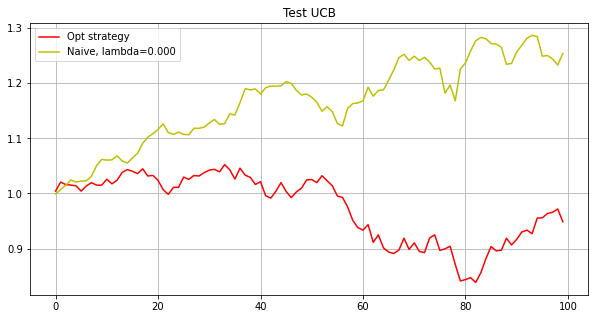

Phase 4
Testing...
./tmp2/res_phase04_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.     0.0108 0.0109 0.0131 0.     0.0121 0.0077 0.0107 0.0079 0.0098
 0.0092 0.009  0.0101 0.0078 0.007  0.006  0.0091 0.01   0.0106 0.0118
 0.0068 0.0096 0.0096 0.0113 0.0077 0.     0.0101 0.0129 0.0092 0.015
 0.0096 0.0077 0.0099 0.011  0.0106 0.0091 0.0122 0.0083 0.0099 0.0114
 0.0096 0.0091 0.0221 0.0078 0.0114 0.0109 0.0092 0.0149 0.0083 0.0114
 0.009  0.0099 0.012  0.0156 0.0108 0.0128 0.0113 0.0101 0.0098 0.0106
 0.0119 0.0065 0.007  0.0126 0.0092 0.0081 0.0113 0.0126 0.0087 0.0099
 0.0129 0.0082 0.0053 0.0108 0.0078 0.015  0.0118 0.0131 0.0118 0.0109
 0.0117 0.0099 0.011  0.0132 0.0094 0.0034 0.0127 0.0097 0.0103 0.0087
 0.0104 0.0107 0.0128 0.0126 0.0084 0.0102 0.0079 0.0068 0.0121 0.0108]
0.20283544153586147
[-0.      0.0108  0.0109  0.0131  0.      0.0121  0.0077  0.0107  0.0079
  0.009

[-0.      0.014   0.0138  0.0091 -0.      0.0195  0.001   0.0102  0.
  0.0084  0.0016  0.0056 -0.      0.      0.0038  0.02    0.007  -0.
  0.0077  0.0134  0.0012  0.0063  0.0075  0.0137  0.0056  0.0009  0.0106
  0.0102 -0.      0.0267  0.0049  0.0018  0.0108  0.009   0.0101  0.0046
  0.0187  0.005   0.0076 -0.      0.0114  0.0097  0.0366  0.0134  0.0167
  0.0105  0.0042  0.0105  0.0006  0.0138 -0.      0.011   0.0187  0.0233
  0.0068  0.007   0.0107  0.0086  0.0091  0.0082  0.0173  0.0034  0.0026
  0.0138  0.0133  0.0053  0.0213  0.0218  0.0016  0.0149  0.0159  0.0087
  0.0102  0.0093  0.0099  0.0227  0.0148  0.0201  0.0134  0.0141  0.0131
  0.0115  0.0123  0.0138  0.008  -0.      0.021   0.0079  0.0108  0.0158
  0.0126  0.0133  0.0125  0.0104  0.0035  0.0133  0.0117  0.0025  0.0237
  0.0072]
0.14178667908152295
[ 0.      0.0141  0.0139  0.0087 -0.      0.0198  0.0007  0.0106  0.
  0.0083  0.0011  0.0056 -0.      0.      0.0013  0.0183  0.007  -0.
  0.0078  0.0137  0.0007  0.0061  0.0

[ 0.0003  0.0151  0.0147  0.      0.0006  0.0202  0.      0.0125  0.
  0.0072  0.0001  0.0096  0.0007 -0.      0.0001  0.0144  0.007  -0.
  0.0109  0.0135  0.0011  0.0034  0.0056  0.0215  0.0015  0.0003  0.0123
  0.0051  0.001   0.0232 -0.      0.      0.0137  0.0065  0.0091  0.0018
  0.025   0.0053  0.0084  0.      0.0176  0.0091  0.0322  0.0144  0.0173
  0.007   0.0009  0.0038  0.      0.0137  0.0003  0.0118  0.0215  0.0241
  0.0043  0.0043  0.0085  0.0065  0.008   0.006   0.0205  0.0046 -0.
  0.0122  0.017   0.005   0.0198  0.0256  0.0056  0.0176  0.0154  0.006
  0.013   0.0088  0.0064  0.026   0.0168  0.0224  0.0139  0.0151  0.012
  0.0136  0.0129  0.0203  0.0062  0.0034  0.0256  0.0069  0.0107  0.0191
  0.0142  0.0138  0.0127  0.0121  0.0002  0.0157  0.0113  0.0012  0.0247
  0.0088]
0.03133970020251272
[ 0.0003  0.0151  0.0148  0.      0.0006  0.0202  0.      0.0125  0.
  0.0072  0.0001  0.0096  0.0007 -0.      0.0001  0.0144  0.007  -0.
  0.0109  0.0135  0.0011  0.0034  0.0056  0

[-0.      0.0167  0.0158  0.0042 -0.      0.0189  0.      0.014   0.
  0.0052  0.      0.      0.      0.     -0.      0.0063  0.0064  0.0002
  0.0107  0.0128  0.      0.      0.0029  0.0054 -0.     -0.      0.0139
  0.0057  0.009   0.018   0.      0.0037  0.0143  0.0097  0.0073  0.
  0.0298  0.0043  0.0061  0.0146  0.0204  0.0108  0.0106  0.0124  0.0179
  0.0043  0.0005  0.0047  0.0005  0.0082 -0.      0.0122  0.0231  0.0318
  0.0064  0.0001  0.0135  0.0043  0.0056  0.0026  0.0222  0.0111  0.
  0.0085  0.0233 -0.      0.0177  0.0321  0.0069  0.0193  0.0142  0.0017
  0.0157  0.0043  0.0054  0.026   0.0185  0.026   0.0173  0.0167  0.0139
  0.0175  0.0144  0.0225  0.0061  0.0002  0.0306  0.0026  0.0097  0.0179
  0.0138  0.0158  0.0129  0.0159 -0.      0.0169  0.0064  0.0095  0.032
  0.009 ]
0.06349503350110948
[-0.      0.0166  0.0158  0.0042 -0.      0.0189  0.      0.014   0.
  0.0052  0.     -0.      0.     -0.     -0.      0.0063  0.0064  0.0002
  0.0107  0.0128  0.     -0.      0.00

[-0.      0.0169  0.016   0.0002  0.      0.0191 -0.      0.0143  0.
  0.0049 -0.      0.     -0.      0.      0.0001  0.0079  0.0067  0.0008
  0.0108  0.014  -0.     -0.      0.0025  0.0076  0.0009 -0.      0.0133
  0.0023  0.0057  0.0169 -0.      0.0051  0.0154  0.0106  0.0071 -0.
  0.0306  0.004   0.0058  0.0121  0.0196  0.0126  0.0083  0.0109  0.0179
  0.0053 -0.      0.0049 -0.      0.009  -0.      0.0123  0.024   0.032
  0.0062  0.0005  0.0123  0.0038  0.0055  0.0027  0.0224  0.0103  0.
  0.0084  0.0247  0.      0.0175  0.0332  0.0083  0.0201  0.0156  0.0007
  0.0148  0.0046  0.0048  0.0262  0.0183  0.0261  0.0173  0.0169  0.0136
  0.0176  0.0143  0.0214  0.0059 -0.      0.0322  0.0018  0.0095  0.0183
  0.0141  0.0161  0.014   0.0152 -0.      0.0168  0.0059  0.0115  0.0339
  0.0082]
0.00010871306631563292
[-0.      0.0169  0.016   0.0002  0.      0.0191 -0.      0.0143  0.
  0.0049 -0.      0.      0.      0.      0.0001  0.0079  0.0067  0.0008
  0.0108  0.014   0.     -0.      0

[-0.      0.0168  0.016   0.0061  0.0024  0.0193 -0.      0.0131 -0.
  0.0039  0.      0.     -0.     -0.      0.0032  0.0076  0.0061 -0.
  0.0128  0.0138  0.0033  0.      0.0017  0.0037  0.0004  0.0011  0.0142
  0.0039  0.0075  0.0159  0.      0.0052  0.0155  0.0096  0.0067  0.
  0.0325  0.0036  0.0054  0.0093  0.021   0.0119  0.0082  0.0148  0.0179
  0.0029  0.      0.0041  0.      0.0111  0.      0.0121  0.0246  0.0299
  0.0103  0.      0.0126  0.0031  0.0045  0.0023  0.0234  0.0087  0.
  0.0059  0.0243 -0.      0.0172  0.0342  0.0093  0.0207  0.0166  0.
  0.0143  0.0084  0.0028  0.0245  0.0177  0.0266  0.0157  0.0169  0.013
  0.0175  0.0146  0.0195  0.0048  0.0006  0.0333  0.0013  0.0089  0.0173
  0.0119  0.0159  0.015   0.0145 -0.      0.0165  0.0062  0.0102  0.0335
  0.0063]
0.08172751220277738
[-0.      0.0168  0.016   0.0061  0.0024  0.0193 -0.      0.0131 -0.
  0.0039  0.      0.      0.     -0.      0.0032  0.0076  0.0061 -0.
  0.0128  0.0138  0.0034 -0.      0.0017  0.0037  

[ 0.      0.0182  0.017   0.      0.0073  0.0228 -0.      0.0152 -0.
  0.003  -0.     -0.      0.     -0.      0.0049  0.0075  0.0041  0.
  0.0105  0.0127  0.0012  0.      0.0005  0.0007  0.      0.      0.0163
  0.      0.0046  0.0081  0.      0.0017  0.0137  0.0083  0.0066 -0.
  0.0378  0.0017  0.0086  0.0038  0.0215  0.0143  0.0105  0.0207  0.0193
  0.0052  0.      0.0003  0.      0.0093 -0.      0.0121  0.0269  0.0335
  0.0102  0.0003  0.0091  0.0012  0.0063  0.      0.0244  0.0032  0.
  0.006   0.0247 -0.      0.0161  0.0379  0.0171  0.0206  0.0176  0.0001
  0.0184  0.0027  0.0043  0.0227  0.0175  0.0291  0.0166  0.0183  0.0132
  0.0205  0.0161  0.0153  0.0033  0.      0.0383  0.0044  0.0087  0.021
  0.012   0.017   0.0154  0.0097  0.      0.0164  0.0044  0.0105  0.0364
  0.0025]
0.026902533869029507
[ 0.0024  0.0185  0.0171  0.0022  0.0072  0.0227 -0.      0.0149 -0.
  0.0025 -0.      0.      0.     -0.      0.0084  0.0098  0.0044  0.0013
  0.0108  0.0142 -0.     -0.      0.0001 

[ 0.0024  0.0185  0.0171  0.0022  0.0072  0.0227 -0.      0.0149 -0.
  0.0025  0.     -0.      0.      0.      0.0084  0.0098  0.0044  0.0013
  0.0108  0.0142  0.      0.      0.0002  0.0035  0.      0.      0.0171
  0.0011  0.0074  0.0067  0.      0.002   0.0152  0.0086  0.0068 -0.
  0.0379  0.0009  0.0082 -0.      0.0199  0.0168  0.0054  0.0202  0.02
  0.0049 -0.     -0.     -0.      0.0088 -0.      0.0123  0.0269  0.0356
  0.0036 -0.      0.0076  0.0003  0.0054  0.      0.0258  0.0012  0.0007
  0.0059  0.0247  0.      0.0147  0.0392  0.0176  0.0204  0.0172 -0.
  0.0181  0.0068  0.0039  0.0233  0.0177  0.0291  0.016   0.0187  0.0125
  0.0204  0.0161  0.0128  0.003   0.0006  0.0394  0.0032  0.0085  0.0228
  0.0128  0.0171  0.0162  0.0074  0.0009  0.0169  0.0038  0.0065  0.0375
  0.0011]
0.00017053569007961604
[ 0.0024  0.0185  0.0171  0.0022  0.0072  0.0227 -0.      0.0149 -0.
  0.0025  0.     -0.      0.      0.      0.0084  0.0098  0.0044  0.0013
  0.0108  0.0142  0.      0.      0.

[ 0.0008  0.019   0.0174  0.0054  0.0102  0.0223 -0.      0.0132  0.
  0.0014  0.      0.     -0.     -0.      0.0016  0.0165  0.0044  0.0011
  0.0096  0.0127  0.     -0.     -0.      0.0013  0.0004  0.      0.0177
  0.0009  0.0025  0.0095 -0.      0.0016  0.0171  0.0087  0.0062 -0.
  0.0371  0.0015  0.0061 -0.      0.0153  0.0174  0.0108  0.0226  0.02
  0.0032 -0.      0.      0.      0.0079 -0.      0.0121  0.028   0.028
  0.008   0.      0.0058  0.      0.0057  0.0009  0.0265  0.0024  0.
  0.0054  0.0237  0.0001  0.0179  0.0417  0.0187  0.021   0.0184  0.0008
  0.0208  0.0045  0.0019  0.0211  0.0186  0.031   0.0183  0.0192  0.0129
  0.022   0.0156  0.0126  0.0034  0.001   0.0407  0.0034  0.0081  0.023
  0.0136  0.0179  0.0168  0.0058  0.      0.0167  0.0015  0.0028  0.0382
 -0.    ]
0.0003207554794283789
[ 0.0008  0.019   0.0174  0.0054  0.0102  0.0223 -0.      0.0132  0.
  0.0014  0.      0.     -0.     -0.      0.0016  0.0165  0.0044  0.0011
  0.0096  0.0127  0.      0.     -0.   

[ 0.0078  0.0201  0.0181  0.0078  0.0097  0.0216  0.      0.0172 -0.
  0.     -0.     -0.     -0.     -0.      0.0091  0.0139  0.0014 -0.
  0.0063  0.015   0.0013 -0.      0.      0.0074 -0.      0.0024  0.0165
 -0.      0.      0.0021  0.      0.0014  0.0212  0.0093  0.0042  0.
  0.0348  0.      0.0038  0.      0.0106  0.0203  0.0108  0.0161  0.0203
  0.      0.0046  0.0018  0.      0.0032  0.      0.0113  0.0294  0.0233
  0.0114  0.0005  0.0091  0.      0.0047 -0.      0.0288  0.0043  0.0006
  0.0037  0.0244  0.0007  0.023   0.0461  0.0252  0.0211  0.0143  0.0014
  0.0159  0.0009  0.      0.0143  0.0192  0.0336  0.0174  0.0203  0.0134
  0.0223  0.0159  0.0109  0.0014  0.      0.0447  0.0024  0.0073  0.0283
  0.0126  0.0193  0.0143  0.0029 -0.      0.0147  0.      0.0009  0.0411
  0.0025]
8.527178255960981e-05
[ 0.0078  0.0201  0.0181  0.0078  0.0097  0.0216  0.      0.0172 -0.
  0.     -0.     -0.     -0.     -0.      0.0091  0.0139  0.0014 -0.
  0.0064  0.015   0.0013 -0.     -0.   

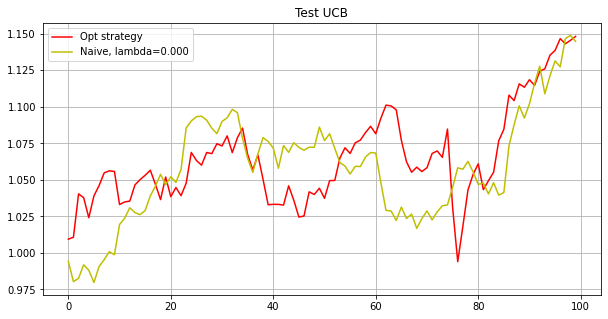

Phase 5
Testing...
./tmp2/res_phase05_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0108 0.0101 0.0102 0.01   0.0113 0.0101 0.0102 0.0097 0.0097 0.0106
 0.01   0.0094 0.0098 0.0117 0.0102 0.0095 0.0101 0.0109 0.0101 0.0099
 0.0096 0.0092 0.0104 0.01   0.0097 0.0099 0.0104 0.0104 0.0096 0.0099
 0.0086 0.0102 0.01   0.0098 0.0099 0.0101 0.0098 0.0102 0.0101 0.0091
 0.0102 0.0094 0.01   0.0104 0.011  0.0108 0.01   0.0098 0.0103 0.01
 0.0094 0.008  0.0099 0.0105 0.0101 0.0103 0.0099 0.01   0.0096 0.0098
 0.01   0.0101 0.01   0.0102 0.0097 0.0099 0.0103 0.0101 0.0102 0.0099
 0.01   0.0102 0.0102 0.0103 0.0099 0.0103 0.0099 0.0097 0.0099 0.0099
 0.0098 0.01   0.01   0.0099 0.01   0.0099 0.01   0.0098 0.0101 0.0101
 0.0099 0.0098 0.0099 0.01   0.0098 0.0102 0.01   0.0098 0.0099 0.0096]
0.028128695188013555
[ 0.      0.0142  0.0145 -0.     -0.      0.0127  0.0142  0.0049  0.0064
 -0.   

[-0.      0.0232  0.0233  0.      0.0006  0.016   0.019   0.      0.
  0.0064  0.0157  0.0002  0.0012  0.0114  0.0191  0.0073  0.0224  0.0085
  0.0009  0.0103  0.0012  0.0005  0.      0.0165  0.0071 -0.      0.0132
  0.0032 -0.      0.0066  0.0036  0.0223  0.0124  0.0128  0.0105  0.0032
  0.0076  0.0237  0.0138  0.003   0.0305  0.0113  0.0135  0.005   0.002
  0.     -0.      0.0062  0.018   0.0202 -0.     -0.      0.0106  0.0101
  0.0109  0.007   0.0143  0.0179  0.0099  0.0072  0.0076  0.0206  0.008
  0.0159  0.0005  0.0137  0.0058  0.0071  0.008   0.0088  0.0011  0.0111
  0.0059  0.0307  0.0089  0.0234  0.      0.0033  0.0056  0.0107  0.0181
  0.0135  0.0163  0.      0.018   0.027   0.0139  0.0096  0.0018  0.0105
  0.0224  0.0081  0.0073  0.0088  0.0034  0.0297  0.0193  0.0184  0.0106
  0.0055]
0.028690936880368754
[-0.      0.0233  0.0234  0.      0.0006  0.0161  0.0199  0.      0.0001
  0.0063  0.0157  0.0002  0.0007  0.0109  0.0193  0.0072  0.0227  0.0083
  0.0008  0.0102  0.0014  

[ 0.      0.0249  0.0248  0.      0.0026  0.0169  0.0166  0.      0.
  0.0068  0.0162  0.      0.0003  0.0104  0.0201  0.0004  0.0262  0.0071
  0.      0.01    0.0018  0.0007  0.      0.017   0.0064  0.0015  0.0118
  0.0011 -0.      0.0059  0.0039  0.0239  0.0116  0.0084  0.0097 -0.
  0.0061  0.0257  0.0144  0.003   0.0292  0.007   0.0142  0.0049  0.
  0.     -0.      0.0041  0.0194  0.0225  0.      0.0005  0.01    0.0102
  0.0121  0.0063  0.015   0.0168  0.0097  0.0108  0.0079  0.0211  0.0076
  0.0141  0.      0.0141  0.0044  0.0046  0.0101  0.0082  0.      0.0119
  0.007   0.0345  0.0086  0.0249 -0.      0.0038  0.0045  0.0098  0.0171
  0.0128  0.0164  0.      0.0198  0.0301  0.014   0.0092  0.0022  0.0108
  0.0245  0.0066  0.0082  0.0099  0.0063  0.0312  0.0197  0.0189  0.0102
  0.0063]
4.278958879152146e-05
[-0.      0.0255  0.0254 -0.      0.0024  0.0173  0.0164 -0.     -0.
  0.0054  0.0165  0.      0.      0.0098  0.0208  0.      0.0281  0.0065
  0.      0.01    0.0005  0.0014  0

[-0.      0.0255  0.0254 -0.      0.0024  0.0173  0.0163  0.     -0.
  0.0054  0.0165  0.      0.      0.0098  0.0208  0.      0.0282  0.0065
 -0.      0.01    0.0005  0.0014 -0.      0.0173  0.0042  0.0012  0.0126
  0.0001 -0.      0.0058  0.0021  0.0245  0.0118  0.0064  0.0102 -0.
  0.0058  0.0263  0.0146  0.004   0.0296  0.0065  0.0144  0.0053 -0.
 -0.      0.      0.0045  0.0202  0.0235  0.0002  0.      0.0098  0.0097
  0.0125  0.0051  0.0153  0.0175  0.01    0.0102  0.0086  0.0213  0.0076
  0.0132 -0.      0.0142  0.0049  0.004   0.0111  0.0082 -0.      0.0133
  0.0072  0.0361  0.0084  0.0248  0.0006  0.0031  0.004   0.0099  0.0174
  0.0131  0.0166  0.0001  0.0196  0.0298  0.0145  0.009   0.0008  0.0107
  0.025   0.0071  0.0079  0.0096  0.0052  0.0317  0.0197  0.0189  0.0101
  0.0056]
3.733323300855501e-05
[-0.      0.0255  0.0254 -0.      0.0024  0.0173  0.0163  0.      0.
  0.0054  0.0165 -0.     -0.      0.0098  0.0208  0.      0.0282  0.0065
  0.      0.01    0.0005  0.0014 -0

[ 0.      0.0257  0.0256  0.0004  0.0019  0.0174  0.0163 -0.     -0.
  0.0043  0.0166 -0.      0.      0.011   0.021   0.0002  0.029   0.0061
  0.      0.0099  0.001   0.0018  0.      0.0174  0.0027  0.0003  0.0125
 -0.      0.      0.0057  0.0015  0.0247  0.0117  0.0058  0.0096  0.0013
  0.0056  0.0266  0.0147  0.0037  0.0292  0.0064  0.0144  0.0054  0.
 -0.      0.      0.0045  0.0206  0.0237  0.0003  0.0007  0.0097  0.0097
  0.0127  0.0044  0.0154  0.0173  0.0101  0.0098  0.0083  0.0213  0.0076
  0.013   0.      0.0137  0.0047  0.0038  0.0114  0.0081  0.      0.0129
  0.0076  0.0364  0.0083  0.025   0.0008  0.0034  0.0038  0.0097  0.0171
  0.013   0.0168  0.0001  0.0194  0.0305  0.0147  0.0093  0.0011  0.0106
  0.0253  0.0076  0.0077  0.0097  0.0049  0.032   0.02    0.0185  0.0101
  0.0057]
0.00023832092319693967
[ 0.      0.0257  0.0256  0.0004  0.0019  0.0174  0.0163 -0.     -0.
  0.0043  0.0166  0.      0.      0.0109  0.021   0.0002  0.029   0.0061
  0.      0.0099  0.001   0.00

[-0.      0.0262  0.0261  0.001   0.0022  0.0177  0.0155 -0.      0.
  0.0035  0.0167  0.      0.0001  0.0097  0.0217  0.      0.0295  0.0053
 -0.      0.0097  0.0023  0.0018  0.      0.0176  0.0035 -0.      0.0118
 -0.     -0.      0.0053  0.0015  0.0252  0.0111  0.0079  0.0094  0.0003
  0.0051  0.0268  0.0155  0.0045  0.0287  0.0063  0.0146  0.0042  0.
 -0.     -0.      0.0036  0.0213  0.0232  0.      0.0002  0.0094  0.0089
  0.0129  0.0072  0.0154  0.0169  0.0088  0.0093  0.0089  0.021   0.0073
  0.0112  0.      0.0139  0.0054  0.0033  0.0124  0.0078 -0.      0.0122
  0.0072  0.0373  0.0077  0.025   0.0007  0.003   0.0036  0.0094  0.0172
  0.0131  0.0167  0.      0.0192  0.0304  0.0148  0.0092 -0.      0.0103
  0.026   0.0074  0.0083  0.0103  0.005   0.0324  0.0203  0.0194  0.0099
  0.0071]
3.1996759491812984e-05
[ 0.      0.0262  0.0261  0.001   0.0022  0.0177  0.0155  0.      0.
  0.0035  0.0167 -0.      0.0001  0.0097  0.0217  0.      0.0295  0.0053
 -0.      0.0097  0.0023  0.00

[ 0.      0.0265  0.0264  0.0012  0.0012  0.0178  0.0147  0.     -0.
  0.0031  0.0168 -0.     -0.      0.0091  0.0221  0.0021  0.0299  0.005
 -0.      0.0097  0.0018  0.0014 -0.      0.0177  0.0027 -0.      0.0118
 -0.     -0.      0.0051  0.0018  0.0255  0.0106  0.0067  0.0088  0.0004
  0.0049  0.0271  0.0151  0.0054  0.029   0.006   0.0147  0.0042 -0.
 -0.     -0.      0.0034  0.0215  0.0232  0.      0.0001  0.0093  0.0085
  0.013   0.0068  0.0155  0.0166  0.0091  0.0099  0.0089  0.0209  0.0074
  0.0109  0.0003  0.0137  0.0052  0.0029  0.0132  0.0077  0.      0.0124
  0.0077  0.0377  0.0077  0.0258  0.001   0.003   0.0033  0.0093  0.0173
  0.0132  0.0169  0.      0.019   0.0311  0.0148  0.0092  0.      0.0102
  0.0261  0.0076  0.0083  0.0106  0.0044  0.0326  0.0205  0.0191  0.0099
  0.0068]
1.7815603800402768e-05
[ 0.      0.0265  0.0264  0.0012  0.0012  0.0178  0.0147  0.      0.
  0.0031  0.0168  0.      0.      0.0091  0.0221  0.0021  0.0299  0.005
 -0.      0.0097  0.0018  0.0014

[-0.      0.0265  0.0264  0.0012  0.0012  0.0178  0.0147 -0.      0.
  0.0031  0.0168 -0.      0.      0.0091  0.0221  0.0021  0.0299  0.005
  0.      0.0097  0.0018  0.0014  0.      0.0177  0.0027  0.      0.0118
  0.      0.      0.0051  0.0018  0.0255  0.0106  0.0067  0.0088  0.0004
  0.0049  0.0271  0.0151  0.0054  0.029   0.006   0.0147  0.0043  0.
 -0.     -0.      0.0034  0.0215  0.0232  0.      0.0001  0.0093  0.0085
  0.013   0.0068  0.0155  0.0166  0.0091  0.0099  0.0089  0.0209  0.0074
  0.0109  0.0003  0.0137  0.0052  0.0029  0.0132  0.0077  0.      0.0124
  0.0077  0.0377  0.0077  0.0258  0.001   0.003   0.0033  0.0093  0.0173
  0.0132  0.0169 -0.      0.019   0.0311  0.0148  0.0092 -0.      0.0102
  0.0261  0.0076  0.0083  0.0106  0.0044  0.0326  0.0205  0.0191  0.0099
  0.0068]
5.1321463896383443e-05
[-0.      0.0265  0.0264  0.0012  0.0012  0.0178  0.0147 -0.     -0.
  0.0031  0.0168 -0.     -0.      0.0091  0.0221  0.0021  0.0299  0.005
  0.      0.0097  0.0018  0.0014

[ 0.      0.028   0.0277  0.0008  0.0025  0.0183  0.0223 -0.     -0.
  0.0039  0.0174  0.      0.      0.0036  0.0221 -0.      0.0297  0.0051
  0.      0.0094  0.0007  0.0034  0.0009  0.0184  0.      0.      0.0125
  0.0005  0.      0.0046  0.      0.0272  0.0086  0.0082  0.0081  0.
  0.0046  0.0283  0.0141  0.0023  0.0277  0.0096  0.0146  0.0044  0.
  0.      0.      0.0031  0.0219  0.0239 -0.     -0.      0.009   0.0081
  0.0136  0.0139  0.0154  0.0171  0.0056  0.0091  0.0089  0.0185  0.0071
  0.0077 -0.      0.0126  0.0051  0.0011  0.0139  0.0073  0.0001  0.0009
  0.0073  0.0413  0.0065  0.0241  0.0003  0.0073  0.002   0.0086  0.0161
  0.014   0.0168  0.0005  0.0187  0.0311  0.0158  0.01   -0.      0.0106
  0.0278  0.0093  0.0099  0.0125  0.007   0.0335  0.0203  0.0207  0.0096
  0.0049]
0.00016348197391787543
[-0.      0.028   0.0277  0.0009  0.0025  0.0183  0.0223 -0.     -0.
  0.0039  0.0174 -0.     -0.      0.0036  0.0221 -0.      0.0297  0.0051
  0.      0.0094  0.0007  0.0034  

[ 0.      0.028   0.0277  0.0008  0.0025  0.0183  0.0223 -0.     -0.
  0.0039  0.0174 -0.     -0.      0.0036  0.0221 -0.      0.0297  0.0051
  0.      0.0094  0.0007  0.0034  0.0009  0.0184  0.0001 -0.      0.0125
  0.0005  0.      0.0046  0.      0.0272  0.0086  0.0082  0.0081 -0.
  0.0046  0.0283  0.0141  0.0023  0.0277  0.0096  0.0145  0.0044  0.
  0.      0.      0.0031  0.0219  0.0239  0.     -0.      0.009   0.0081
  0.0136  0.0139  0.0154  0.0171  0.0056  0.0091  0.0089  0.0185  0.0071
  0.0077 -0.      0.0126  0.0051  0.001   0.0139  0.0073  0.0001  0.0009
  0.0073  0.0413  0.0065  0.0241  0.0003  0.0073  0.002   0.0086  0.0161
  0.014   0.0168  0.0005  0.0187  0.0311  0.0158  0.0101  0.      0.0106
  0.0278  0.0093  0.0099  0.0125  0.007   0.0335  0.0203  0.0207  0.0096
  0.0049]
5.016454361993832e-05
[-0.      0.0285  0.0282  0.0006  0.0024  0.0186  0.0201  0.     -0.
  0.0032  0.0175  0.0008 -0.      0.0016  0.0232  0.0056  0.0293  0.0035
 -0.      0.0092  0.      0.0028  0

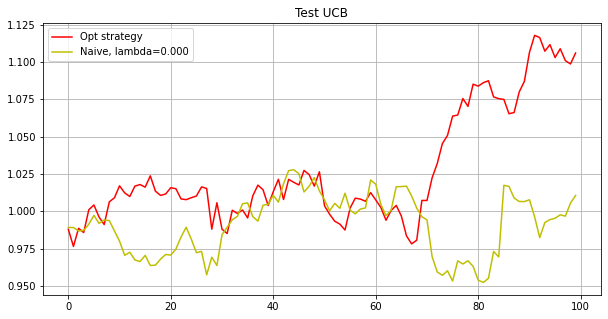

Phase 6
Testing...
./tmp2/res_phase06_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
6.047737305531209e-06
[0.0065 0.0119 0.0096 0.0081 0.0123 0.0064 0.0079 0.0109 0.0111 0.0138
 0.013  0.0081 0.0125 0.0113 0.011  0.0116 0.0098 0.0089 0.0117 0.0093
 0.0051 0.0112 0.0093 0.0095 0.0102 0.0015 0.0052 0.0109 0.0098 0.0067
 0.009  0.0078 0.0082 0.0074 0.01   0.0082 0.0122 0.0124 0.0067 0.

[0.0065 0.0119 0.0096 0.0081 0.0123 0.0064 0.0079 0.0109 0.0111 0.0138
 0.013  0.0081 0.0125 0.0113 0.011  0.0116 0.0098 0.0089 0.0117 0.0093
 0.0051 0.0112 0.0093 0.0095 0.0102 0.0015 0.0052 0.0109 0.0098 0.0067
 0.009  0.0078 0.0082 0.0074 0.01   0.0082 0.0122 0.0124 0.0067 0.0127
 0.0067 0.0092 0.0119 0.0116 0.0074 0.0115 0.0099 0.0086 0.0127 0.0105
 0.0116 0.0153 0.0105 0.0102 0.007  0.0095 0.0104 0.0116 0.0108 0.0112
 0.0086 0.0136 0.009  0.0095 0.0111 0.009  0.011  0.0102 0.0106 0.0079
 0.0112 0.0101 0.0085 0.009  0.0076 0.0108 0.0112 0.0106 0.0099 0.0107
 0.012  0.0107 0.0096 0.0107 0.0116 0.0125 0.0101 0.0084 0.0084 0.0096
 0.0114 0.0106 0.0107 0.011  0.0073 0.0109 0.011  0.0116 0.0116 0.0121]
2.2230594298603204e-07
[0.0065 0.0119 0.0096 0.0081 0.0123 0.0064 0.0079 0.0109 0.0111 0.0138
 0.013  0.0081 0.0125 0.0113 0.011  0.0116 0.0098 0.0089 0.0117 0.0093
 0.0051 0.0112 0.0093 0.0095 0.0102 0.0015 0.0052 0.0109 0.0098 0.0067
 0.009  0.0078 0.0082 0.0074 0.01   0.0082 0.0122 0.0

[0.0063 0.0125 0.0092 0.0073 0.0131 0.0049 0.0072 0.0104 0.011  0.0136
 0.0139 0.0073 0.013  0.0114 0.0109 0.0119 0.0099 0.0084 0.0124 0.0095
 0.0053 0.0115 0.009  0.0076 0.0103 0.0011 0.0047 0.0111 0.0099 0.0062
 0.0088 0.0078 0.0075 0.0068 0.0097 0.008  0.0121 0.0132 0.0058 0.0132
 0.0062 0.0081 0.0125 0.0121 0.0076 0.0116 0.0098 0.0082 0.0124 0.0108
 0.012  0.0146 0.0107 0.0094 0.0062 0.0094 0.0101 0.012  0.011  0.0114
 0.0082 0.0139 0.0086 0.0098 0.011  0.0095 0.011  0.0103 0.0107 0.008
 0.0114 0.0102 0.0086 0.0111 0.0073 0.0111 0.0113 0.0115 0.0096 0.0108
 0.0125 0.0102 0.0099 0.0112 0.0111 0.0123 0.0099 0.0077 0.0098 0.0098
 0.0119 0.0106 0.0117 0.0109 0.007  0.0114 0.0114 0.012  0.0119 0.0127]
1.0773667658124696e-05
[0.0063 0.0125 0.0092 0.0073 0.0131 0.0049 0.0072 0.0104 0.011  0.0136
 0.0139 0.0073 0.013  0.0114 0.0109 0.0119 0.0099 0.0084 0.0124 0.0095
 0.0053 0.0115 0.009  0.0076 0.0103 0.0011 0.0047 0.0111 0.0099 0.0062
 0.0088 0.0078 0.0075 0.0068 0.0097 0.008  0.0121 0.01

[0.0039 0.0133 0.0087 0.0087 0.016  0.0033 0.0063 0.0086 0.011  0.0143
 0.0151 0.0063 0.0135 0.0119 0.01   0.0119 0.009  0.0079 0.0143 0.0083
 0.0044 0.0105 0.0081 0.006  0.0094 0.     0.0005 0.0118 0.01   0.0056
 0.0085 0.0082 0.0075 0.0065 0.0094 0.0096 0.0147 0.0155 0.0052 0.0138
 0.0063 0.0095 0.0136 0.0124 0.0082 0.0099 0.0098 0.0079 0.0144 0.0103
 0.0122 0.0126 0.011  0.0093 0.0054 0.0093 0.0108 0.012  0.0114 0.0096
 0.0076 0.0148 0.0053 0.0097 0.0107 0.0101 0.0112 0.0106 0.0109 0.0073
 0.0117 0.0105 0.0081 0.0131 0.0068 0.0122 0.0114 0.0123 0.0098 0.0108
 0.0134 0.0094 0.0094 0.011  0.0109 0.0133 0.0097 0.0075 0.0093 0.0103
 0.0127 0.0111 0.0133 0.0104 0.0069 0.012  0.0119 0.0128 0.0122 0.0146]
5.095359613861304e-05
[0.0039 0.0133 0.0087 0.0087 0.016  0.0033 0.0063 0.0086 0.011  0.0143
 0.0151 0.0063 0.0135 0.0119 0.01   0.0119 0.009  0.0079 0.0143 0.0083
 0.0044 0.0105 0.0081 0.006  0.0094 0.     0.0005 0.0118 0.01   0.0056
 0.0085 0.0082 0.0075 0.0065 0.0094 0.0096 0.0147 0.01

[0.0039 0.0133 0.0087 0.0087 0.016  0.0033 0.0063 0.0086 0.011  0.0143
 0.0151 0.0063 0.0135 0.0119 0.01   0.0119 0.009  0.0079 0.0143 0.0083
 0.0044 0.0105 0.0081 0.006  0.0094 0.     0.0005 0.0118 0.01   0.0056
 0.0085 0.0082 0.0075 0.0065 0.0094 0.0096 0.0147 0.0155 0.0052 0.0138
 0.0063 0.0095 0.0136 0.0124 0.0082 0.0099 0.0098 0.0079 0.0144 0.0103
 0.0122 0.0126 0.011  0.0093 0.0054 0.0093 0.0108 0.012  0.0114 0.0096
 0.0076 0.0148 0.0053 0.0096 0.0107 0.0101 0.0112 0.0106 0.0109 0.0073
 0.0117 0.0105 0.0082 0.0131 0.0068 0.0122 0.0114 0.0123 0.0098 0.0108
 0.0134 0.0094 0.0094 0.011  0.011  0.0133 0.0097 0.0075 0.0093 0.0103
 0.0127 0.0111 0.0133 0.0104 0.0069 0.012  0.0119 0.0128 0.0122 0.0146]
0.00021066263136735363
[0.0039 0.0133 0.0087 0.0087 0.016  0.0033 0.0063 0.0086 0.011  0.0143
 0.0151 0.0063 0.0136 0.0119 0.01   0.0119 0.009  0.0079 0.0143 0.0083
 0.0044 0.0105 0.0081 0.006  0.0094 0.     0.0005 0.0118 0.01   0.0055
 0.0085 0.0082 0.0075 0.0065 0.0094 0.0096 0.0147 0.0

[0.0039 0.0133 0.0087 0.0087 0.016  0.0033 0.0063 0.0086 0.011  0.0142
 0.0151 0.0063 0.0136 0.0119 0.01   0.0119 0.009  0.0079 0.0143 0.0083
 0.0044 0.0105 0.0081 0.006  0.0094 0.     0.0005 0.0118 0.01   0.0055
 0.0085 0.0082 0.0075 0.0065 0.0094 0.0096 0.0147 0.0155 0.0053 0.0138
 0.0063 0.0095 0.0136 0.0124 0.0082 0.0099 0.0098 0.0079 0.0144 0.0103
 0.0122 0.0126 0.011  0.0093 0.0054 0.0093 0.0108 0.012  0.0114 0.0096
 0.0076 0.0148 0.0053 0.0096 0.0107 0.0101 0.0112 0.0106 0.0109 0.0073
 0.0117 0.0105 0.0082 0.0131 0.0068 0.0122 0.0114 0.0123 0.0098 0.0108
 0.0134 0.0094 0.0094 0.011  0.011  0.0133 0.0097 0.0075 0.0093 0.0103
 0.0127 0.0111 0.0133 0.0104 0.0069 0.012  0.0119 0.0128 0.0122 0.0146]
4.811273558864004e-05
[ 0.0039  0.0133  0.0087  0.0087  0.016   0.0033  0.0063  0.0086  0.011
  0.0142  0.0151  0.0063  0.0136  0.0119  0.01    0.0119  0.009   0.0079
  0.0143  0.0083  0.0044  0.0105  0.0081  0.006   0.0094 -0.      0.0005
  0.0118  0.01    0.0055  0.0085  0.0082  0.0075 

[ 0.0039  0.0133  0.0087  0.0087  0.016   0.0033  0.0063  0.0086  0.011
  0.0142  0.0151  0.0063  0.0136  0.0119  0.01    0.0119  0.009   0.0079
  0.0143  0.0083  0.0044  0.0105  0.0081  0.006   0.0094 -0.      0.0005
  0.0118  0.01    0.0055  0.0085  0.0082  0.0075  0.0065  0.0094  0.0096
  0.0147  0.0155  0.0053  0.0138  0.0063  0.0095  0.0136  0.0124  0.0082
  0.0099  0.0098  0.0079  0.0144  0.0103  0.0122  0.0126  0.011   0.0093
  0.0054  0.0093  0.0108  0.012   0.0114  0.0096  0.0076  0.0148  0.0053
  0.0096  0.0107  0.0101  0.0112  0.0106  0.0109  0.0073  0.0117  0.0105
  0.0082  0.0131  0.0068  0.0122  0.0114  0.0123  0.0098  0.0108  0.0134
  0.0094  0.0094  0.011   0.011   0.0133  0.0097  0.0075  0.0093  0.0103
  0.0127  0.0111  0.0133  0.0104  0.0069  0.012   0.0119  0.0128  0.0122
  0.0146]
0.00015249570164416459
[ 0.0039  0.0133  0.0087  0.0087  0.016   0.0033  0.0063  0.0086  0.011
  0.0142  0.0151  0.0063  0.0136  0.0119  0.01    0.0119  0.009   0.0079
  0.0143  0.0083  0.

[0.0038 0.0134 0.0087 0.0087 0.016  0.0033 0.0063 0.0086 0.011  0.0142
 0.0151 0.0063 0.0136 0.0119 0.01   0.0119 0.009  0.0079 0.0143 0.0083
 0.0044 0.0105 0.0081 0.006  0.0094 0.     0.0005 0.0118 0.0101 0.0055
 0.0085 0.0082 0.0075 0.0065 0.0094 0.0096 0.0147 0.0155 0.0053 0.0138
 0.0063 0.0095 0.0136 0.0124 0.0082 0.0099 0.0098 0.0079 0.0144 0.0103
 0.0122 0.0126 0.011  0.0093 0.0054 0.0093 0.0108 0.012  0.0114 0.0096
 0.0076 0.0148 0.0053 0.0096 0.0107 0.0101 0.0112 0.0106 0.0109 0.0073
 0.0117 0.0105 0.0082 0.0131 0.0068 0.0122 0.0114 0.0123 0.0098 0.0108
 0.0134 0.0094 0.0094 0.011  0.011  0.0133 0.0097 0.0075 0.0093 0.0103
 0.0127 0.0111 0.0133 0.0104 0.0069 0.012  0.0119 0.0128 0.0122 0.0146]
0.00011471487319888219
[0.0038 0.0134 0.0087 0.0087 0.016  0.0033 0.0063 0.0086 0.011  0.0142
 0.0151 0.0063 0.0136 0.0119 0.01   0.0119 0.009  0.0079 0.0143 0.0083
 0.0044 0.0105 0.0081 0.006  0.0094 0.     0.0005 0.0118 0.0101 0.0055
 0.0085 0.0082 0.0075 0.0065 0.0094 0.0096 0.0147 0.0

[0.0045 0.0138 0.0083 0.0094 0.0163 0.0028 0.0058 0.0077 0.0126 0.0143
 0.0158 0.0055 0.014  0.0112 0.0092 0.0118 0.0083 0.0099 0.0156 0.0074
 0.0037 0.0098 0.0088 0.0049 0.0094 0.0021 0.0015 0.012  0.01   0.0046
 0.0085 0.0081 0.0066 0.006  0.0093 0.0096 0.0143 0.0158 0.0048 0.0139
 0.0055 0.0086 0.0142 0.0126 0.0083 0.0093 0.0097 0.0076 0.0145 0.0112
 0.0123 0.0117 0.0111 0.0099 0.0052 0.0093 0.0105 0.012  0.0115 0.0097
 0.0073 0.0147 0.0051 0.0095 0.0106 0.0097 0.0112 0.0114 0.011  0.0064
 0.0118 0.0105 0.009  0.0131 0.0065 0.0122 0.0115 0.0125 0.01   0.0103
 0.0138 0.0089 0.0094 0.01   0.0112 0.0128 0.0095 0.0071 0.0108 0.0111
 0.0129 0.0112 0.0136 0.0102 0.0066 0.0122 0.0124 0.0131 0.0125 0.0136]
3.6086072886039496e-07
[0.0045 0.0138 0.0083 0.0094 0.0163 0.0028 0.0058 0.0077 0.0126 0.0143
 0.0158 0.0055 0.014  0.0112 0.0092 0.0118 0.0083 0.0099 0.0156 0.0074
 0.0037 0.0098 0.0088 0.0049 0.0094 0.0021 0.0015 0.012  0.01   0.0046
 0.0085 0.0081 0.0066 0.006  0.0093 0.0096 0.0143 0.0

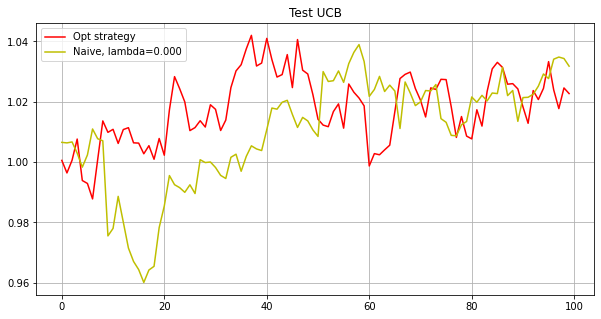

Phase 7
Testing...
./tmp2/res_phase07_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0114 0.0097 0.0092 0.0053 0.012  0.0124 0.0084 0.0117 0.0076 0.0112
 0.0147 0.0104 0.0093 0.0087 0.0125 0.0106 0.0112 0.0109 0.0135 0.013
 0.011  0.0083 0.0078 0.0118 0.0085 0.0118 0.0071 0.0117 0.0082 0.0112
 0.0095 0.011  0.01   0.0098 0.0069 0.0109 0.0116 0.0111 0.009  0.0092
 0.0114 0.009  0.0101 0.0119 0.0051 0.0086 0.0092 0.0093 0.0111 0.01
 0.0071 0.0108 0.0118 0.0107 0.0124 0.0047 0.0054 0.0092 0.0101 0.0108
 0.0069 0.0099 0.0107 0.0052 0.0098 0.0107 0.008  0.0101 0.0108 0.0116
 0.0107 0.0084 0.0104 0.0094 0.0089 0.0091 0.0103 0.0074 0.0096 0.0154
 0.0135 0.0121 0.011  0.0098 0.0091 0.0096 0.0104 0.0088 0.0127 0.0096
 0.0114 0.0085 0.0099 0.0098 0.0103 0.0106 0.0106 0.0112 0.0087 0.0109]
0.14748748089094282
[0.0114 0.0097 0.0092 0.0053 0.012  0.0124 0.0084 0.0117 0.0076 0.0112
 0.0147 0.0

[0.0114 0.0097 0.0092 0.0053 0.012  0.0124 0.0084 0.0117 0.0076 0.0112
 0.0147 0.0104 0.0093 0.0087 0.0125 0.0106 0.0112 0.0109 0.0135 0.013
 0.011  0.0084 0.0078 0.0118 0.0085 0.0118 0.0071 0.0117 0.0082 0.0112
 0.0095 0.011  0.01   0.0098 0.0069 0.0109 0.0116 0.0111 0.009  0.0092
 0.0114 0.009  0.0101 0.0119 0.0051 0.0086 0.0092 0.0093 0.0111 0.01
 0.0071 0.0108 0.0118 0.0107 0.0124 0.0047 0.0054 0.0092 0.0101 0.0108
 0.0069 0.0099 0.0107 0.0052 0.0098 0.0107 0.008  0.0101 0.0108 0.0116
 0.0107 0.0084 0.0104 0.0094 0.0089 0.0091 0.0103 0.0074 0.0096 0.0154
 0.0135 0.0121 0.011  0.0098 0.0091 0.0096 0.0104 0.0088 0.0127 0.0096
 0.0114 0.0085 0.0099 0.0098 0.0103 0.0106 0.0106 0.0112 0.0087 0.0109]
1.2661382651959346e-07
[0.0114 0.0097 0.0092 0.0053 0.012  0.0124 0.0084 0.0117 0.0076 0.0112
 0.0147 0.0104 0.0093 0.0087 0.0125 0.0106 0.0112 0.0109 0.0135 0.013
 0.011  0.0084 0.0078 0.0118 0.0085 0.0118 0.0071 0.0117 0.0082 0.0112
 0.0095 0.011  0.01   0.0098 0.0069 0.0109 0.0116 0.0111 

[0.0116 0.0087 0.0093 0.0054 0.0118 0.013  0.0078 0.0121 0.0077 0.0117
 0.0153 0.0103 0.0089 0.0082 0.013  0.0102 0.0108 0.0111 0.0121 0.013
 0.0112 0.008  0.0077 0.0125 0.0093 0.0119 0.0063 0.0123 0.0096 0.0112
 0.0094 0.0115 0.0102 0.0087 0.007  0.0109 0.0115 0.0113 0.0088 0.0095
 0.0118 0.0088 0.0098 0.0123 0.0049 0.008  0.009  0.0095 0.0105 0.01
 0.0074 0.0108 0.012  0.0109 0.0126 0.0029 0.0059 0.0089 0.0102 0.0108
 0.0058 0.0097 0.0114 0.006  0.0091 0.0103 0.0073 0.0102 0.0104 0.0111
 0.0111 0.0103 0.0102 0.0095 0.0082 0.0094 0.0101 0.0078 0.0091 0.0146
 0.0127 0.0126 0.0106 0.0099 0.0092 0.0098 0.0105 0.0092 0.0124 0.0094
 0.0111 0.0089 0.0105 0.0101 0.0103 0.0107 0.0108 0.0112 0.0091 0.0111]
0.00021182972833940156
[0.0116 0.0087 0.0093 0.0054 0.0118 0.013  0.0078 0.0121 0.0077 0.0117
 0.0153 0.0103 0.0089 0.0082 0.013  0.0102 0.0108 0.0111 0.0121 0.013
 0.0112 0.008  0.0077 0.0125 0.0093 0.0119 0.0063 0.0123 0.0095 0.0112
 0.0094 0.0115 0.0102 0.0087 0.007  0.0109 0.0115 0.0113 

[ 0.014   0.0055  0.0144  0.0072  0.0123  0.0169  0.0045  0.0123  0.0015
  0.0096  0.0211  0.0038  0.0077  0.0037  0.0163  0.0172  0.005   0.0095
  0.0078  0.0148  0.0116  0.0059  0.0052  0.0142  0.0093  0.0147  0.0059
  0.0115  0.0096  0.0113  0.0085  0.0055  0.0082  0.0041  0.002   0.0122
  0.0091  0.0133  0.0054  0.019   0.0146  0.0078  0.0129  0.0158  0.0039
  0.0062  0.0086  0.0093  0.0057  0.0121  0.0068  0.0126  0.0152  0.0103
  0.015  -0.      0.0022  0.0065  0.0096  0.0099  0.0022  0.0101  0.0113
  0.0038  0.0142  0.0101  0.0113  0.0099  0.0117  0.008   0.0154  0.0107
  0.0122  0.009   0.0113  0.0079  0.0102  0.0067  0.0092  0.0156  0.0139
  0.0154  0.0141  0.0089  0.0116  0.0097  0.0125  0.0107  0.0146  0.0093
  0.009   0.0096  0.0118  0.008   0.0101  0.0121  0.012   0.0089  0.0075
  0.013 ]
7.142944912658436e-05
[ 0.014   0.0055  0.0144  0.0072  0.0123  0.0169  0.0045  0.0123  0.0016
  0.0096  0.0211  0.0038  0.0077  0.0037  0.0163  0.0172  0.005   0.0095
  0.0078  0.0148  0

[0.0141 0.0055 0.0143 0.0073 0.0123 0.0169 0.0045 0.0122 0.0015 0.0096
 0.0211 0.0038 0.0077 0.0037 0.0163 0.0172 0.005  0.0095 0.0078 0.0148
 0.0116 0.0059 0.0052 0.0141 0.0093 0.0147 0.006  0.0115 0.0096 0.0113
 0.0085 0.0054 0.0082 0.0041 0.002  0.0122 0.0091 0.0133 0.0054 0.019
 0.0146 0.0078 0.0129 0.0158 0.0039 0.0061 0.0086 0.0093 0.0057 0.0121
 0.0068 0.0126 0.0152 0.0103 0.015  0.0001 0.0023 0.0065 0.0096 0.0099
 0.0022 0.0101 0.0113 0.0039 0.0142 0.0101 0.0113 0.0099 0.0117 0.008
 0.0154 0.0107 0.0122 0.009  0.0113 0.0079 0.0101 0.0067 0.0092 0.0156
 0.0139 0.0154 0.0141 0.0089 0.0116 0.0097 0.0125 0.0107 0.0146 0.0093
 0.009  0.0096 0.0118 0.008  0.0101 0.0121 0.012  0.0089 0.0075 0.013 ]
1.2332188644165396e-06
[0.0141 0.0055 0.0143 0.0073 0.0123 0.0169 0.0045 0.0122 0.0015 0.0096
 0.0211 0.0038 0.0077 0.0037 0.0163 0.0172 0.005  0.0095 0.0078 0.0148
 0.0116 0.0059 0.0052 0.0141 0.0093 0.0147 0.006  0.0115 0.0096 0.0113
 0.0085 0.0054 0.0082 0.0041 0.002  0.0122 0.0091 0.013

[0.0141 0.0055 0.0143 0.0073 0.0123 0.0169 0.0045 0.0122 0.0015 0.0096
 0.0211 0.0038 0.0077 0.0037 0.0163 0.0172 0.005  0.0095 0.0078 0.0148
 0.0116 0.0059 0.0052 0.0141 0.0093 0.0147 0.006  0.0115 0.0096 0.0113
 0.0085 0.0054 0.0082 0.0041 0.002  0.0122 0.0091 0.0133 0.0054 0.019
 0.0146 0.0078 0.0129 0.0158 0.0039 0.0061 0.0086 0.0093 0.0057 0.0121
 0.0068 0.0126 0.0152 0.0103 0.015  0.0001 0.0022 0.0065 0.0096 0.0099
 0.0022 0.0101 0.0113 0.0039 0.0142 0.0101 0.0113 0.0099 0.0117 0.008
 0.0154 0.0107 0.0122 0.009  0.0113 0.0079 0.0101 0.0067 0.0092 0.0156
 0.0139 0.0154 0.0141 0.0089 0.0116 0.0097 0.0125 0.0107 0.0146 0.0093
 0.009  0.0096 0.0118 0.008  0.0101 0.0121 0.012  0.0089 0.0075 0.013 ]
4.1653961602307983e-07
[0.0141 0.0055 0.0143 0.0073 0.0123 0.0169 0.0045 0.0122 0.0015 0.0096
 0.0211 0.0038 0.0077 0.0037 0.0163 0.0172 0.005  0.0095 0.0078 0.0148
 0.0116 0.0059 0.0052 0.0141 0.0093 0.0147 0.006  0.0115 0.0096 0.0113
 0.0085 0.0054 0.0082 0.0041 0.002  0.0122 0.0091 0.013

[0.0141 0.0055 0.0143 0.0073 0.0123 0.0169 0.0045 0.0122 0.0015 0.0096
 0.0211 0.0038 0.0077 0.0037 0.0163 0.0172 0.005  0.0095 0.0078 0.0148
 0.0116 0.0059 0.0052 0.0141 0.0093 0.0147 0.006  0.0115 0.0096 0.0113
 0.0085 0.0054 0.0082 0.0041 0.002  0.0122 0.0091 0.0133 0.0054 0.019
 0.0146 0.0078 0.0129 0.0158 0.0039 0.0061 0.0086 0.0093 0.0057 0.0121
 0.0068 0.0126 0.0152 0.0103 0.015  0.0001 0.0022 0.0065 0.0096 0.0099
 0.0022 0.0101 0.0113 0.0039 0.0142 0.0101 0.0113 0.0099 0.0117 0.008
 0.0154 0.0107 0.0122 0.009  0.0113 0.0079 0.0102 0.0067 0.0092 0.0156
 0.0139 0.0154 0.0141 0.0089 0.0116 0.0097 0.0125 0.0107 0.0146 0.0093
 0.009  0.0096 0.0118 0.008  0.0101 0.0121 0.012  0.0089 0.0075 0.013 ]
2.147604300628192e-06
[0.0141 0.0055 0.0143 0.0073 0.0123 0.0169 0.0045 0.0122 0.0015 0.0096
 0.0211 0.0038 0.0077 0.0037 0.0163 0.0172 0.005  0.0095 0.0078 0.0148
 0.0116 0.0059 0.0052 0.0141 0.0093 0.0147 0.006  0.0115 0.0096 0.0113
 0.0085 0.0054 0.0082 0.0041 0.002  0.0122 0.0091 0.0133

[ 0.0151  0.0049  0.0142  0.0056  0.0147  0.0187  0.0029  0.012   0.0009
  0.0093  0.0227  0.0038  0.0071  0.0055  0.0175  0.0189  0.002   0.0099
  0.0048  0.0154  0.0109  0.0065  0.0067  0.0156  0.0112  0.0161  0.0037
  0.0132  0.0111  0.0118  0.0076  0.0021  0.0077  0.0045  0.0015  0.0127
  0.008   0.0142  0.0053  0.0171  0.0152  0.0087  0.0135  0.0171  0.0013
  0.0059  0.0087  0.0102  0.0053  0.0127  0.0066  0.0131  0.0164  0.0082
  0.0163 -0.      0.0025  0.0059  0.0093  0.0093  0.      0.01    0.0113
  0.0064  0.0153  0.0107  0.0108  0.0101  0.0131  0.0067  0.0163  0.0084
  0.0126  0.0088  0.0097  0.008   0.0105  0.0063  0.0091  0.0158  0.0119
  0.0169  0.0127  0.0075  0.0114  0.0105  0.013   0.0099  0.0141  0.0091
  0.0069  0.0103  0.0129  0.0082  0.0098  0.0125  0.0123  0.0087  0.0081
  0.0136]
2.798828217430574e-05
[ 0.0151  0.0049  0.0142  0.0056  0.0147  0.0187  0.0029  0.012   0.0009
  0.0093  0.0227  0.0038  0.0071  0.0056  0.0175  0.0189  0.002   0.0099
  0.0048  0.0154  0

[0.0151 0.0049 0.0142 0.0056 0.0147 0.0187 0.0029 0.012  0.0009 0.0093
 0.0227 0.0038 0.0071 0.0055 0.0175 0.0189 0.002  0.0099 0.0048 0.0154
 0.0109 0.0065 0.0067 0.0156 0.0112 0.0161 0.0037 0.0132 0.0111 0.0118
 0.0076 0.0021 0.0077 0.0045 0.0015 0.0127 0.008  0.0142 0.0053 0.0171
 0.0152 0.0087 0.0135 0.017  0.0013 0.0059 0.0087 0.0102 0.0053 0.0127
 0.0066 0.0131 0.0164 0.0082 0.0163 0.     0.0025 0.0059 0.0093 0.0093
 0.     0.01   0.0113 0.0064 0.0153 0.0107 0.0108 0.0101 0.0131 0.0067
 0.0163 0.0084 0.0126 0.0088 0.0097 0.008  0.0105 0.0063 0.0091 0.0158
 0.0119 0.0169 0.0127 0.0075 0.0114 0.0105 0.013  0.0099 0.0141 0.0091
 0.0069 0.0103 0.0129 0.0082 0.0098 0.0125 0.0123 0.0088 0.0081 0.0136]
5.9777989029919774e-06
[0.0151 0.0049 0.0142 0.0056 0.0147 0.0187 0.0029 0.012  0.0009 0.0093
 0.0227 0.0038 0.0071 0.0055 0.0175 0.0189 0.002  0.0099 0.0048 0.0154
 0.0109 0.0065 0.0067 0.0156 0.0112 0.0161 0.0037 0.0132 0.0111 0.0118
 0.0076 0.0021 0.0077 0.0045 0.0015 0.0127 0.008  0.0

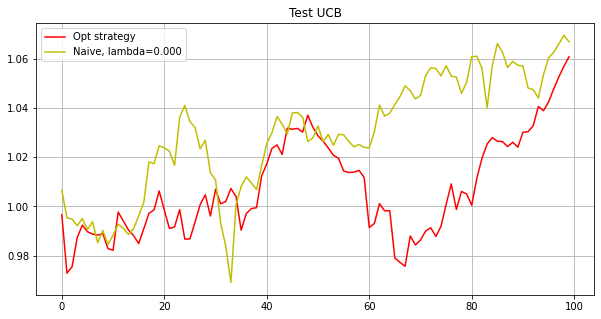

Phase 8
Testing...
./tmp2/res_phase08_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
0.0004810090466556699
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 

[0.0103 0.0099 0.01   0.0095 0.0104 0.0095 0.0099 0.01   0.0102 0.0099
 0.01   0.0098 0.0101 0.01   0.0101 0.0097 0.0102 0.0097 0.0101 0.0099
 0.0101 0.0101 0.01   0.01   0.0101 0.0097 0.0101 0.0107 0.0103 0.0102
 0.0101 0.01   0.0096 0.0099 0.0098 0.0099 0.0101 0.0102 0.01   0.0098
 0.01   0.01   0.0101 0.0099 0.01   0.0103 0.0101 0.0099 0.0098 0.0101
 0.0098 0.0104 0.01   0.0101 0.01   0.0099 0.0102 0.0103 0.0097 0.0101
 0.01   0.0099 0.0098 0.0104 0.0098 0.0097 0.0096 0.0101 0.0099 0.0102
 0.0099 0.0098 0.01   0.0101 0.0097 0.01   0.0099 0.01   0.01   0.01
 0.0102 0.0097 0.01   0.0099 0.0101 0.01   0.0097 0.0099 0.0099 0.0103
 0.0098 0.0101 0.01   0.0097 0.0101 0.011  0.0097 0.0101 0.01   0.0103]
3.179659064708046e-06
[0.0103 0.0099 0.01   0.0095 0.0104 0.0095 0.0099 0.01   0.0102 0.0099
 0.01   0.0098 0.0101 0.01   0.0101 0.0097 0.0102 0.0097 0.0101 0.0099
 0.0101 0.0101 0.01   0.01   0.0101 0.0097 0.0101 0.0107 0.0103 0.0102
 0.0101 0.01   0.0096 0.0099 0.0098 0.0099 0.0101 0.0102

[0.0111 0.0097 0.01   0.0089 0.0109 0.0086 0.0098 0.0106 0.0106 0.0096
 0.0103 0.0103 0.0101 0.0099 0.01   0.009  0.0105 0.0096 0.0101 0.0096
 0.0102 0.0103 0.0101 0.0105 0.0102 0.0095 0.0099 0.0107 0.0093 0.0105
 0.0104 0.0101 0.0089 0.0101 0.0093 0.0099 0.0102 0.0106 0.0102 0.0093
 0.0098 0.01   0.01   0.0091 0.0101 0.01   0.0101 0.0091 0.0095 0.0102
 0.0099 0.0112 0.0098 0.0104 0.0099 0.0098 0.0102 0.0121 0.0097 0.0097
 0.0102 0.0099 0.0099 0.0104 0.0098 0.0098 0.0094 0.01   0.0097 0.0104
 0.0105 0.0095 0.0102 0.0104 0.0097 0.0101 0.0096 0.0103 0.0103 0.0103
 0.0104 0.01   0.01   0.0096 0.01   0.0098 0.0093 0.0094 0.0098 0.0105
 0.01   0.0102 0.0098 0.0096 0.0103 0.0106 0.01   0.01   0.01   0.0103]
0.02634950064199408
[0.0111 0.0097 0.01   0.0089 0.0109 0.0086 0.0098 0.0106 0.0106 0.0096
 0.0103 0.0103 0.0101 0.0099 0.01   0.009  0.0105 0.0096 0.0101 0.0096
 0.0102 0.0103 0.0101 0.0105 0.0102 0.0095 0.0099 0.0107 0.0093 0.0105
 0.0104 0.0101 0.0089 0.0101 0.0093 0.0099 0.0102 0.0106

[0.013  0.0089 0.0141 0.0043 0.0189 0.0065 0.009  0.0137 0.0125 0.0047
 0.0113 0.0126 0.0113 0.0119 0.0061 0.0032 0.0144 0.0101 0.0074 0.0104
 0.0125 0.0137 0.0126 0.     0.0108 0.0066 0.0141 0.0148 0.0064 0.0144
 0.0125 0.0116 0.006  0.0134 0.0052 0.0117 0.0138 0.0145 0.0123 0.
 0.0111 0.0169 0.0118 0.0081 0.0114 0.0079 0.007  0.0032 0.0067 0.0158
 0.0095 0.0005 0.0108 0.0071 0.007  0.0087 0.0135 0.0123 0.0071 0.0096
 0.0109 0.0107 0.0106 0.0094 0.0072 0.0145 0.0083 0.0122 0.0091 0.0141
 0.0137 0.0109 0.0095 0.0047 0.0058 0.0114 0.0064 0.0109 0.0122 0.0092
 0.0126 0.0101 0.0086 0.0079 0.0111 0.0053 0.0059 0.0057 0.0098 0.0146
 0.0163 0.0146 0.0112 0.0048 0.0135 0.0098 0.006  0.0137 0.0084 0.0113]
0.050739605227384146
[0.013  0.0089 0.0141 0.0043 0.0189 0.0065 0.009  0.0137 0.0125 0.0047
 0.0113 0.0126 0.0113 0.0119 0.0061 0.0032 0.0144 0.0101 0.0074 0.0104
 0.0125 0.0137 0.0126 0.     0.0108 0.0066 0.0141 0.0148 0.0064 0.0144
 0.0125 0.0116 0.006  0.0134 0.0052 0.0117 0.0138 0.0145 0.

[ 0.013   0.0089  0.0141  0.0043  0.0189  0.0065  0.009   0.0137  0.0125
  0.0047  0.0113  0.0126  0.0113  0.0119  0.0061  0.0032  0.0144  0.0101
  0.0074  0.0104  0.0125  0.0137  0.0127 -0.      0.0108  0.0066  0.0141
  0.0148  0.0064  0.0144  0.0125  0.0115  0.006   0.0134  0.0052  0.0117
  0.0138  0.0145  0.0123  0.      0.0111  0.0169  0.0118  0.0081  0.0114
  0.0079  0.007   0.0032  0.0067  0.0158  0.0095  0.0005  0.0108  0.0071
  0.0071  0.0087  0.0135  0.0123  0.0071  0.0096  0.0109  0.0107  0.0106
  0.0094  0.0072  0.0145  0.0083  0.0122  0.0091  0.0141  0.0137  0.0109
  0.0095  0.0047  0.0058  0.0114  0.0064  0.011   0.0122  0.0092  0.0126
  0.0101  0.0086  0.0079  0.0111  0.0053  0.0059  0.0057  0.0098  0.0146
  0.0163  0.0146  0.0112  0.0048  0.0135  0.0098  0.006   0.0137  0.0084
  0.0113]
6.539383978538273e-05
[ 0.013   0.0089  0.0141  0.0043  0.0189  0.0065  0.009   0.0137  0.0125
  0.0047  0.0113  0.0126  0.0113  0.0119  0.0061  0.0032  0.0144  0.0101
  0.0074  0.0104  0

[0.013  0.0089 0.0141 0.0043 0.0189 0.0065 0.009  0.0137 0.0125 0.0047
 0.0113 0.0126 0.0113 0.0119 0.0061 0.0032 0.0144 0.0101 0.0073 0.0104
 0.0125 0.0137 0.0127 0.     0.0108 0.0066 0.0141 0.0148 0.0064 0.0144
 0.0125 0.0116 0.006  0.0134 0.0052 0.0117 0.0138 0.0145 0.0123 0.
 0.0111 0.0169 0.0118 0.0081 0.0114 0.0079 0.0069 0.0032 0.0067 0.0158
 0.0095 0.0005 0.0108 0.0071 0.0071 0.0087 0.0135 0.0123 0.0071 0.0096
 0.0109 0.0107 0.0106 0.0094 0.0072 0.0145 0.0083 0.0122 0.0091 0.0141
 0.0137 0.0109 0.0095 0.0047 0.0058 0.0114 0.0064 0.011  0.0122 0.0092
 0.0126 0.0101 0.0086 0.0079 0.0111 0.0053 0.0059 0.0057 0.0098 0.0147
 0.0163 0.0146 0.0112 0.0048 0.0135 0.0098 0.006  0.0137 0.0084 0.0113]
2.9407509538871723e-06
[0.013  0.0089 0.0141 0.0043 0.0189 0.0065 0.009  0.0137 0.0125 0.0047
 0.0113 0.0126 0.0113 0.0119 0.0061 0.0032 0.0144 0.0101 0.0073 0.0104
 0.0125 0.0137 0.0127 0.     0.0108 0.0066 0.0141 0.0148 0.0064 0.0144
 0.0125 0.0116 0.006  0.0134 0.0052 0.0117 0.0138 0.0145 

[0.0154 0.0088 0.0135 0.0027 0.0199 0.0049 0.0087 0.0158 0.0132 0.0041
 0.0117 0.0124 0.0118 0.0117 0.0061 0.0018 0.0156 0.0096 0.0069 0.0107
 0.0128 0.0142 0.0123 0.0002 0.0111 0.0059 0.0145 0.0152 0.0064 0.0142
 0.0132 0.0119 0.004  0.0133 0.0049 0.0119 0.0145 0.0148 0.0126 0.
 0.0117 0.0181 0.0122 0.0079 0.0109 0.0081 0.0063 0.0013 0.0065 0.0163
 0.0099 0.0007 0.0103 0.0049 0.0067 0.009  0.0128 0.0121 0.0066 0.0089
 0.0112 0.0109 0.0099 0.0093 0.0057 0.0139 0.0094 0.0118 0.0088 0.0148
 0.0137 0.0105 0.0098 0.0052 0.0053 0.0115 0.0058 0.0113 0.0124 0.0091
 0.0122 0.0125 0.0085 0.0088 0.0114 0.0057 0.0048 0.0055 0.0092 0.0155
 0.0158 0.0153 0.0108 0.0049 0.0143 0.0103 0.0057 0.014  0.0084 0.0116]
1.7759062095265352e-05
[0.0154 0.0088 0.0135 0.0027 0.0199 0.0049 0.0087 0.0158 0.0132 0.0041
 0.0117 0.0124 0.0118 0.0117 0.0061 0.0018 0.0156 0.0096 0.0069 0.0107
 0.0128 0.0142 0.0123 0.0002 0.0111 0.0059 0.0145 0.0152 0.0064 0.0142
 0.0132 0.0119 0.004  0.0133 0.0049 0.0119 0.0145 0.0148 

[ 0.0131  0.0086  0.0142  0.0008  0.0217  0.0033  0.0083  0.0164  0.0128
  0.0029  0.0119  0.0116  0.0115  0.0119  0.0061 -0.      0.0122  0.0088
  0.0065  0.0111  0.0131  0.0147  0.014   0.0009  0.0112  0.0062  0.0148
  0.0163  0.0058  0.015   0.0135  0.0123  0.005   0.0144  0.0044  0.0115
  0.0152  0.0159  0.0129  0.      0.0117  0.0195  0.0117  0.0068  0.0111
  0.0091  0.0069 -0.      0.0067  0.0166  0.0106  0.      0.0101  0.0024
  0.0057  0.0079  0.0133  0.0154  0.0058  0.0082  0.0111  0.0111  0.0099
  0.0094  0.0056  0.014   0.0087  0.0118  0.0098  0.0155  0.0143  0.0087
  0.0099  0.0055  0.0049  0.0117  0.0049  0.0112  0.0129  0.0088  0.0125
  0.0133  0.0075  0.0098  0.0109  0.0067  0.0044  0.0053  0.0096  0.0166
  0.015   0.0155  0.0114  0.006   0.0149  0.0105  0.0047  0.0147  0.0084
  0.0125]
0.00019471473386515546
[ 0.0131  0.0086  0.0142  0.0008  0.0217  0.0033  0.0083  0.0164  0.0128
  0.0029  0.012   0.0116  0.0115  0.0119  0.0061 -0.      0.0122  0.0088
  0.0065  0.0111  

[ 0.0138  0.0085  0.014   0.0002  0.022   0.0034  0.008   0.0168  0.0129
  0.0028  0.012   0.0116  0.0117  0.0118  0.0066  0.      0.0109  0.0091
  0.0063  0.011   0.0133  0.0149  0.0143  0.0021  0.0114  0.0064  0.0148
  0.0159  0.0047  0.0145  0.0135  0.0123  0.0047  0.0141  0.0043  0.0118
  0.0152  0.0163  0.0131 -0.      0.0121  0.0204  0.0115  0.0067  0.0112
  0.0084  0.0068 -0.      0.0062  0.017   0.0108  0.      0.0102  0.0022
  0.0054  0.0076  0.0137  0.0156  0.0058  0.0088  0.0111  0.0111  0.0094
  0.0094  0.0051  0.0136  0.0084  0.0119  0.01    0.0159  0.0137  0.0086
  0.0099  0.0049  0.0047  0.0118  0.0046  0.011   0.0134  0.0087  0.0126
  0.0133  0.0079  0.0096  0.011   0.0065  0.0037  0.0048  0.0099  0.0177
  0.0152  0.0156  0.0114  0.005   0.0151  0.0108  0.0043  0.0155  0.0085
  0.0126]
2.8834747129540298e-05
[ 0.0138  0.0085  0.014   0.0002  0.022   0.0034  0.008   0.0168  0.0129
  0.0028  0.012   0.0116  0.0117  0.0118  0.0066 -0.      0.0109  0.0091
  0.0063  0.011   

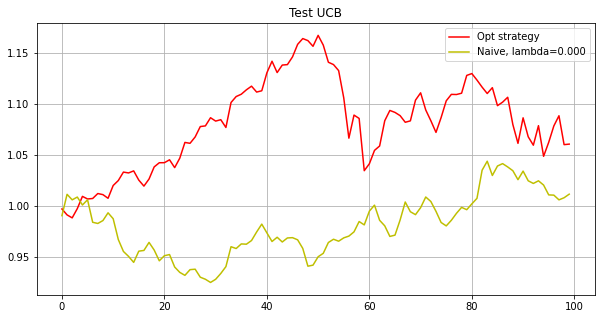

Phase 9
Testing...
./tmp2/res_phase09_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
7.992266596208719e-07
[0.0103 0.0106 0.0082 0.0101 0.0103 0.0094 0.0104 0.0101 0.0112 0.0095
 0.009  0.0088 0.0081 0.0098 0.0091 0.0099 0.0089 0.01   0.0086 0.0085
 0.0102 0.0092 0.0089 0.0118 0.0116 0.0104 0.0111 0.0104 0.0103 0.0102
 0.0107 0.0098 0.0108 0.0104 0.0092 0.0103 0.0089 0.0104 0.0096 0.

[0.0103 0.0106 0.0082 0.0101 0.0103 0.0094 0.0104 0.0101 0.0112 0.0095
 0.009  0.0088 0.0081 0.0098 0.0091 0.0099 0.0089 0.01   0.0086 0.0085
 0.0102 0.0092 0.0089 0.0118 0.0116 0.0104 0.0111 0.0104 0.0103 0.0102
 0.0107 0.0098 0.0108 0.0104 0.0092 0.0103 0.0089 0.0104 0.0096 0.0102
 0.0113 0.0089 0.0088 0.0098 0.0104 0.0092 0.011  0.0102 0.0104 0.0105
 0.0112 0.0119 0.01   0.009  0.0103 0.0106 0.0095 0.0121 0.0116 0.0122
 0.0104 0.01   0.0099 0.0107 0.0102 0.0105 0.0106 0.0106 0.0112 0.0111
 0.0097 0.0108 0.0115 0.0103 0.0104 0.0107 0.0095 0.0085 0.0103 0.0101
 0.0099 0.0081 0.0096 0.0095 0.011  0.0105 0.0119 0.01   0.0085 0.0092
 0.0096 0.0034 0.0112 0.01   0.0085 0.0102 0.0091 0.01   0.0092 0.0098]
9.923539596697409e-08
[0.0103 0.0105 0.0082 0.0101 0.0103 0.0094 0.0103 0.0101 0.0112 0.0095
 0.009  0.0088 0.0081 0.0098 0.0091 0.0098 0.0089 0.01   0.0086 0.0085
 0.0102 0.0092 0.0089 0.0118 0.0116 0.0104 0.0111 0.0104 0.0103 0.0102
 0.0107 0.0098 0.0108 0.0104 0.0092 0.0103 0.0089 0.01

[0.0103 0.0106 0.0082 0.0101 0.0103 0.0094 0.0104 0.0101 0.0112 0.0095
 0.009  0.0088 0.0081 0.0098 0.009  0.0098 0.0089 0.01   0.0086 0.0085
 0.0101 0.0092 0.0089 0.0118 0.0117 0.0104 0.0111 0.0104 0.0103 0.0102
 0.0107 0.0098 0.0108 0.0104 0.0092 0.0103 0.0089 0.0104 0.0096 0.0102
 0.0113 0.0089 0.0088 0.0098 0.0104 0.0092 0.011  0.0102 0.0104 0.0104
 0.0113 0.0119 0.01   0.009  0.0103 0.0106 0.0095 0.0121 0.0116 0.0122
 0.0104 0.01   0.0099 0.0107 0.0102 0.0105 0.0106 0.0106 0.0112 0.0111
 0.0097 0.0108 0.0115 0.0103 0.0104 0.0107 0.0095 0.0085 0.0103 0.0101
 0.0099 0.0081 0.0096 0.0095 0.011  0.0105 0.0119 0.01   0.0085 0.0092
 0.0096 0.0034 0.0112 0.01   0.0085 0.0102 0.009  0.01   0.0092 0.0098]
0.0002144517292264913
[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.01

[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.0101 0.0106 0.01
 0.0126 0.0091 0.0078 0.009  0.0108 0.0089 0.0104 0.0112 0.0108 0.0102
 0.0123 0.013  0.0099 0.0092 0.0106 0.0108 0.0093 0.0143 0.012  0.0119
 0.0108 0.0086 0.0108 0.012  0.0105 0.0123 0.0119 0.0096 0.011  0.0127
 0.0091 0.0116 0.0114 0.0101 0.0109 0.0109 0.0103 0.0086 0.0091 0.0101
 0.0101 0.0082 0.0121 0.0098 0.013  0.0117 0.0122 0.0089 0.0079 0.0079
 0.009  0.0041 0.01   0.0105 0.0086 0.0105 0.0103 0.0099 0.0088 0.0097]
7.03498153806735e-08
[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.0101 

[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.0101 0.0106 0.01
 0.0126 0.0091 0.0078 0.009  0.0108 0.0089 0.0104 0.0112 0.0108 0.0102
 0.0123 0.013  0.0099 0.0092 0.0106 0.0108 0.0093 0.0142 0.012  0.0119
 0.0108 0.0086 0.0108 0.012  0.0105 0.0123 0.0119 0.0096 0.011  0.0127
 0.0091 0.0116 0.0114 0.0101 0.0109 0.0109 0.0103 0.0086 0.0091 0.0101
 0.0101 0.0082 0.0121 0.0098 0.013  0.0117 0.0122 0.0089 0.0079 0.0079
 0.009  0.0041 0.01   0.0105 0.0086 0.0105 0.0103 0.0099 0.0088 0.0097]
1.5358648653438292e-07
[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.010

[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.0101 0.0106 0.01
 0.0126 0.0091 0.0078 0.009  0.0108 0.0089 0.0104 0.0112 0.0108 0.0102
 0.0123 0.013  0.0099 0.0092 0.0106 0.0108 0.0093 0.0142 0.012  0.0119
 0.0108 0.0086 0.0108 0.012  0.0105 0.0123 0.0119 0.0096 0.011  0.0127
 0.0091 0.0116 0.0114 0.0101 0.0109 0.0109 0.0103 0.0086 0.0091 0.0101
 0.0101 0.0082 0.0121 0.0098 0.013  0.0117 0.0122 0.0089 0.0079 0.0079
 0.009  0.0041 0.01   0.0105 0.0086 0.0105 0.0103 0.0099 0.0088 0.0097]
1.4240462956624858e-07
[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.010

[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.0101 0.0106 0.01
 0.0126 0.0091 0.0078 0.009  0.0108 0.0089 0.0104 0.0112 0.0108 0.0102
 0.0123 0.013  0.0099 0.0092 0.0106 0.0108 0.0093 0.0142 0.012  0.0119
 0.0108 0.0086 0.0108 0.012  0.0105 0.0123 0.0119 0.0096 0.011  0.0127
 0.0091 0.0116 0.0114 0.0101 0.0109 0.0109 0.0103 0.0086 0.0091 0.0101
 0.0101 0.0082 0.0121 0.0098 0.013  0.0117 0.0122 0.0089 0.0079 0.0079
 0.009  0.0041 0.01   0.0105 0.0086 0.0105 0.0103 0.0099 0.0088 0.0097]
3.028087537573082e-08
[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.0101

[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.0101 0.0106 0.01
 0.0126 0.0091 0.0078 0.009  0.0108 0.0089 0.0104 0.0112 0.0108 0.0102
 0.0123 0.013  0.0099 0.0092 0.0106 0.0108 0.0093 0.0142 0.012  0.0119
 0.0108 0.0086 0.0108 0.012  0.0105 0.0123 0.0119 0.0096 0.011  0.0127
 0.0091 0.0116 0.0114 0.0101 0.0109 0.0109 0.0103 0.0086 0.0091 0.0101
 0.0101 0.0082 0.0121 0.0098 0.013  0.0117 0.0122 0.0089 0.0079 0.0079
 0.009  0.0041 0.01   0.0105 0.0086 0.0105 0.0103 0.0099 0.0088 0.0097]
3.019686825225104e-07
[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.0101

[0.0108 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0117 0.0104 0.0107
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0076 0.0101 0.0106 0.01
 0.0126 0.0091 0.0078 0.009  0.0108 0.0089 0.0104 0.0112 0.0108 0.0102
 0.0123 0.013  0.0099 0.0092 0.0106 0.0108 0.0093 0.0142 0.012  0.0119
 0.0108 0.0086 0.0108 0.012  0.0105 0.0123 0.0119 0.0096 0.011  0.0127
 0.0091 0.0116 0.0114 0.0101 0.0109 0.0109 0.0103 0.0086 0.0091 0.0101
 0.0101 0.0082 0.0121 0.0098 0.013  0.0117 0.0122 0.0089 0.0079 0.0079
 0.009  0.0041 0.01   0.0105 0.0086 0.0105 0.0103 0.0099 0.0088 0.0097]
2.2079409602287353e-08
[0.0109 0.011  0.0063 0.0102 0.0106 0.0094 0.0107 0.0062 0.0124 0.0067
 0.0081 0.0087 0.0071 0.0086 0.0088 0.0096 0.009  0.0102 0.0081 0.0027
 0.0095 0.0093 0.0082 0.0112 0.0116 0.0105 0.0113 0.0116 0.0104 0.0106
 0.0109 0.0094 0.0106 0.0119 0.0092 0.0104 0.0077 0.010

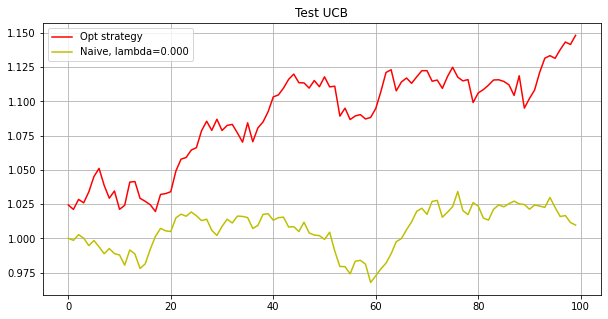

Phase 10
Testing...
./tmp2/res_phase10_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
2.6081132932023743e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
2.2885641211278784e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
7.353805307752648e-09
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
4.0952248613057574e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
3.4923805757036686e-09
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
5.376006700190394e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.

[0.0108 0.0102 0.0098 0.0102 0.0102 0.0094 0.01   0.0104 0.0101 0.0099
 0.0106 0.0096 0.0088 0.0101 0.0097 0.0104 0.0098 0.0091 0.0104 0.0102
 0.0103 0.0113 0.0106 0.0107 0.0095 0.0106 0.0095 0.0099 0.0103 0.0105
 0.0103 0.01   0.0106 0.0111 0.01   0.0103 0.0108 0.0109 0.0109 0.0102
 0.0112 0.0101 0.0096 0.0104 0.0101 0.01   0.0101 0.0105 0.01   0.0104
 0.0097 0.0102 0.0098 0.0104 0.0102 0.0096 0.0097 0.0092 0.0106 0.0107
 0.0092 0.0101 0.0096 0.0107 0.01   0.0102 0.01   0.0075 0.0082 0.0102
 0.0104 0.0102 0.0111 0.0098 0.0095 0.0106 0.0093 0.0068 0.0098 0.0099
 0.0101 0.0099 0.0104 0.0103 0.0094 0.0095 0.0092 0.0089 0.0104 0.0106
 0.0098 0.0097 0.0113 0.0097 0.0103 0.0085 0.0102 0.0103 0.0101 0.008 ]
8.384157028362704e-09
[0.0108 0.0102 0.0098 0.0102 0.0102 0.0094 0.01   0.0104 0.0101 0.0099
 0.0106 0.0096 0.0088 0.0101 0.0097 0.0104 0.0098 0.0091 0.0104 0.0102
 0.0103 0.0113 0.0106 0.0107 0.0095 0.0106 0.0095 0.0099 0.0103 0.0105
 0.0103 0.01   0.0106 0.0111 0.01   0.0103 0.0108 0.01

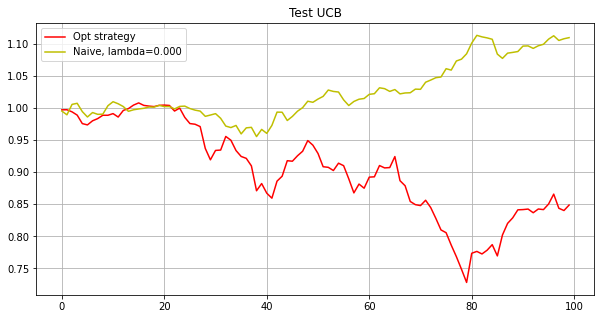

Phase 11
Testing...
./tmp2/res_phase11_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
3.078281727505322e-05
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01

[0.0117 0.0113 0.0081 0.0115 0.0104 0.0117 0.0117 0.0129 0.0077 0.0108
 0.0079 0.012  0.0111 0.0125 0.0133 0.0095 0.0098 0.0133 0.0041 0.0084
 0.0154 0.0073 0.0107 0.013  0.0107 0.0123 0.0095 0.0103 0.0078 0.0154
 0.0114 0.0073 0.0114 0.0097 0.0101 0.01   0.0069 0.0047 0.0113 0.0078
 0.0058 0.0145 0.0086 0.0081 0.0048 0.0081 0.0116 0.008  0.0086 0.0087
 0.01   0.0096 0.008  0.0067 0.012  0.0152 0.0088 0.012  0.0106 0.0136
 0.0119 0.0134 0.0088 0.0106 0.0126 0.0144 0.0081 0.0105 0.0117 0.003
 0.0002 0.0057 0.0112 0.011  0.0112 0.0095 0.0098 0.0117 0.0094 0.0103
 0.0111 0.0082 0.0101 0.0122 0.0122 0.0116 0.0121 0.0138 0.0098 0.0068
 0.0112 0.0002 0.0138 0.0107 0.0081 0.0082 0.0105 0.0065 0.013  0.0094]
2.104579231894388e-07
[0.0117 0.0113 0.0081 0.0115 0.0104 0.0117 0.0117 0.0129 0.0077 0.0108
 0.0079 0.012  0.0111 0.0125 0.0133 0.0095 0.0098 0.0133 0.0041 0.0084
 0.0154 0.0073 0.0107 0.013  0.0107 0.0123 0.0095 0.0103 0.0078 0.0154
 0.0114 0.0073 0.0114 0.0097 0.0101 0.01   0.0069 0.004

[0.012  0.0114 0.0075 0.0116 0.0104 0.0118 0.0114 0.0128 0.0075 0.0098
 0.0078 0.0121 0.0112 0.0125 0.0137 0.0094 0.0104 0.0126 0.0039 0.0083
 0.0152 0.0072 0.0108 0.0134 0.0109 0.0127 0.0094 0.0075 0.0076 0.0154
 0.0124 0.0068 0.0111 0.0096 0.0104 0.0098 0.0066 0.0047 0.011  0.0071
 0.0056 0.014  0.0086 0.0084 0.0049 0.0082 0.0124 0.0082 0.0095 0.0085
 0.01   0.0092 0.008  0.0076 0.0123 0.0155 0.0093 0.0121 0.0109 0.0143
 0.0123 0.0132 0.0095 0.0106 0.0128 0.0147 0.0085 0.0103 0.012  0.0033
 0.0011 0.0055 0.011  0.0111 0.0108 0.0101 0.01   0.0112 0.0092 0.0105
 0.0112 0.0083 0.0103 0.0122 0.0118 0.0122 0.012  0.0137 0.0098 0.0066
 0.0114 0.     0.0135 0.0107 0.0083 0.0082 0.0103 0.0045 0.0128 0.0097]
0.0005350373510498095
[ 0.012   0.0114  0.0075  0.0116  0.0104  0.0118  0.0114  0.0128  0.0075
  0.0098  0.0078  0.0121  0.0112  0.0125  0.0137  0.0094  0.0104  0.0126
  0.0039  0.0083  0.0152  0.0072  0.0108  0.0134  0.0109  0.0127  0.0094
  0.0075  0.0076  0.0154  0.0124  0.0068  0.0111

[ 0.0119  0.0114  0.0075  0.0116  0.0105  0.0118  0.0114  0.0128  0.0076
  0.0099  0.0078  0.0121  0.0112  0.0125  0.0137  0.0095  0.0104  0.0126
  0.0039  0.0083  0.0152  0.0072  0.0108  0.0134  0.0109  0.0127  0.0095
  0.0075  0.0076  0.0154  0.0124  0.0068  0.0111  0.0096  0.0104  0.0098
  0.0066  0.0047  0.011   0.0071  0.0056  0.014   0.0086  0.0084  0.0049
  0.0082  0.0124  0.0082  0.0095  0.0085  0.01    0.0092  0.008   0.0076
  0.0122  0.0155  0.0093  0.0121  0.0108  0.0143  0.0122  0.0132  0.0095
  0.0106  0.0128  0.0147  0.0085  0.0103  0.012   0.0033  0.001   0.0054
  0.011   0.011   0.0107  0.0101  0.01    0.0112  0.0092  0.0105  0.0112
  0.0083  0.0103  0.0122  0.0118  0.0122  0.012   0.0137  0.0098  0.0066
  0.0114 -0.      0.0135  0.0107  0.0083  0.0082  0.0103  0.0045  0.0128
  0.0096]
0.0004739555316733126
[0.012  0.0114 0.0075 0.0116 0.0105 0.0118 0.0114 0.0128 0.0076 0.0099
 0.0078 0.0121 0.0112 0.0125 0.0137 0.0095 0.0104 0.0126 0.0039 0.0083
 0.0152 0.0072 0.0108 0

[ 0.012   0.0114  0.0075  0.0116  0.0105  0.0118  0.0114  0.0128  0.0076
  0.0099  0.0078  0.0121  0.0112  0.0125  0.0137  0.0095  0.0104  0.0126
  0.0039  0.0083  0.0152  0.0072  0.0108  0.0134  0.0109  0.0127  0.0095
  0.0075  0.0076  0.0154  0.0124  0.0068  0.0111  0.0096  0.0104  0.0098
  0.0066  0.0047  0.011   0.0071  0.0056  0.014   0.0086  0.0084  0.0049
  0.0082  0.0124  0.0082  0.0095  0.0085  0.01    0.0092  0.008   0.0076
  0.0122  0.0155  0.0093  0.0121  0.0108  0.0143  0.0122  0.0132  0.0095
  0.0106  0.0128  0.0147  0.0085  0.0103  0.012   0.0033  0.001   0.0054
  0.011   0.011   0.0107  0.0101  0.01    0.0112  0.0092  0.0105  0.0112
  0.0083  0.0103  0.0122  0.0118  0.0122  0.012   0.0137  0.0098  0.0066
  0.0114 -0.      0.0135  0.0107  0.0083  0.0082  0.0103  0.0045  0.0128
  0.0097]
1.949292525945243e-05
[ 0.012   0.0114  0.0075  0.0116  0.0105  0.0118  0.0114  0.0128  0.0076
  0.0099  0.0078  0.0121  0.0112  0.0125  0.0137  0.0095  0.0104  0.0126
  0.0039  0.0083  0

[ 0.012   0.0114  0.0075  0.0116  0.0105  0.0118  0.0114  0.0128  0.0076
  0.0099  0.0078  0.0121  0.0112  0.0125  0.0137  0.0095  0.0104  0.0126
  0.0039  0.0083  0.0152  0.0072  0.0108  0.0134  0.0109  0.0127  0.0095
  0.0075  0.0076  0.0154  0.0124  0.0068  0.0111  0.0096  0.0104  0.0098
  0.0066  0.0047  0.011   0.0071  0.0056  0.014   0.0086  0.0084  0.0049
  0.0081  0.0124  0.0082  0.0095  0.0085  0.01    0.0092  0.008   0.0076
  0.0122  0.0155  0.0093  0.0121  0.0108  0.0143  0.0123  0.0132  0.0095
  0.0106  0.0128  0.0147  0.0085  0.0103  0.012   0.0033  0.001   0.0054
  0.011   0.011   0.0107  0.0101  0.01    0.0112  0.0092  0.0105  0.0112
  0.0083  0.0103  0.0122  0.0118  0.0122  0.012   0.0137  0.0098  0.0066
  0.0114 -0.      0.0135  0.0107  0.0083  0.0082  0.0103  0.0045  0.0128
  0.0096]
1.5193750183705097e-05
[ 0.012   0.0114  0.0075  0.0116  0.0105  0.0118  0.0114  0.0128  0.0076
  0.0099  0.0078  0.0121  0.0112  0.0125  0.0137  0.0095  0.0104  0.0126
  0.0039  0.0083  

[0.0122 0.0115 0.0071 0.0117 0.0106 0.012  0.0111 0.0136 0.0074 0.0095
 0.0079 0.0122 0.0113 0.0125 0.0138 0.0096 0.0105 0.0122 0.0036 0.0083
 0.0149 0.0067 0.0108 0.0137 0.0109 0.0129 0.0092 0.0074 0.0076 0.0153
 0.0122 0.0067 0.011  0.0096 0.0108 0.0098 0.0066 0.004  0.0109 0.0066
 0.0057 0.0136 0.0084 0.0084 0.005  0.0078 0.0123 0.0081 0.0094 0.0086
 0.01   0.0091 0.008  0.0077 0.0124 0.0151 0.0096 0.0125 0.0115 0.0148
 0.0125 0.0131 0.0099 0.0109 0.013  0.0145 0.0079 0.0102 0.0122 0.0033
 0.0013 0.0055 0.011  0.0112 0.0108 0.0104 0.0098 0.0112 0.0092 0.0101
 0.0114 0.0082 0.0103 0.0123 0.0121 0.0124 0.0118 0.0144 0.0097 0.0065
 0.0114 0.0002 0.0136 0.0106 0.0081 0.0078 0.0102 0.0043 0.0129 0.0097]
1.0777132696947623e-08
[0.0122 0.0115 0.0071 0.0117 0.0106 0.012  0.0111 0.0136 0.0074 0.0095
 0.0079 0.0122 0.0113 0.0125 0.0138 0.0096 0.0105 0.0122 0.0036 0.0083
 0.0149 0.0067 0.0108 0.0137 0.0109 0.0129 0.0092 0.0074 0.0076 0.0153
 0.0122 0.0067 0.011  0.0096 0.0108 0.0098 0.0066 0.0

[0.0122 0.0115 0.0071 0.0117 0.0106 0.012  0.0111 0.0136 0.0074 0.0095
 0.0079 0.0122 0.0113 0.0125 0.0138 0.0096 0.0105 0.0122 0.0036 0.0083
 0.0149 0.0067 0.0108 0.0137 0.0109 0.0129 0.0092 0.0074 0.0076 0.0153
 0.0122 0.0067 0.011  0.0096 0.0108 0.0098 0.0066 0.004  0.0109 0.0066
 0.0057 0.0136 0.0084 0.0084 0.005  0.0078 0.0123 0.0081 0.0094 0.0086
 0.01   0.0091 0.008  0.0077 0.0124 0.0151 0.0096 0.0125 0.0115 0.0148
 0.0125 0.0131 0.0099 0.0109 0.013  0.0145 0.0079 0.0102 0.0122 0.0033
 0.0013 0.0055 0.011  0.0112 0.0108 0.0104 0.0098 0.0112 0.0092 0.0101
 0.0114 0.0082 0.0103 0.0123 0.0121 0.0124 0.0118 0.0144 0.0097 0.0065
 0.0114 0.0002 0.0136 0.0106 0.0081 0.0078 0.0102 0.0043 0.0129 0.0097]
2.43528920476269e-07
[0.0122 0.0115 0.0071 0.0117 0.0106 0.012  0.0111 0.0136 0.0074 0.0095
 0.0079 0.0122 0.0113 0.0125 0.0138 0.0096 0.0105 0.0122 0.0036 0.0083
 0.0149 0.0067 0.0108 0.0137 0.0109 0.0129 0.0092 0.0074 0.0076 0.0153
 0.0122 0.0067 0.011  0.0096 0.0108 0.0098 0.0066 0.004

[0.0122 0.0115 0.0071 0.0117 0.0106 0.012  0.0111 0.0136 0.0074 0.0095
 0.0079 0.0122 0.0113 0.0125 0.0138 0.0096 0.0105 0.0122 0.0036 0.0083
 0.0149 0.0067 0.0108 0.0137 0.0109 0.0129 0.0092 0.0074 0.0076 0.0153
 0.0122 0.0067 0.011  0.0096 0.0108 0.0098 0.0066 0.004  0.0109 0.0066
 0.0057 0.0136 0.0084 0.0084 0.005  0.0078 0.0123 0.0081 0.0094 0.0086
 0.01   0.0091 0.008  0.0077 0.0124 0.0151 0.0096 0.0125 0.0115 0.0148
 0.0125 0.0131 0.0099 0.0109 0.013  0.0145 0.0079 0.0102 0.0122 0.0033
 0.0013 0.0055 0.011  0.0112 0.0108 0.0104 0.0098 0.0112 0.0092 0.0101
 0.0114 0.0082 0.0103 0.0123 0.0121 0.0124 0.0118 0.0144 0.0097 0.0065
 0.0114 0.0002 0.0136 0.0106 0.0081 0.0078 0.0102 0.0043 0.0129 0.0097]
4.983061483795231e-07
[0.0122 0.0115 0.0071 0.0117 0.0106 0.012  0.0111 0.0136 0.0074 0.0095
 0.0079 0.0122 0.0113 0.0125 0.0138 0.0096 0.0105 0.0122 0.0036 0.0083
 0.0149 0.0067 0.0108 0.0137 0.0109 0.0129 0.0092 0.0074 0.0076 0.0153
 0.0122 0.0067 0.011  0.0096 0.0108 0.0098 0.0066 0.00

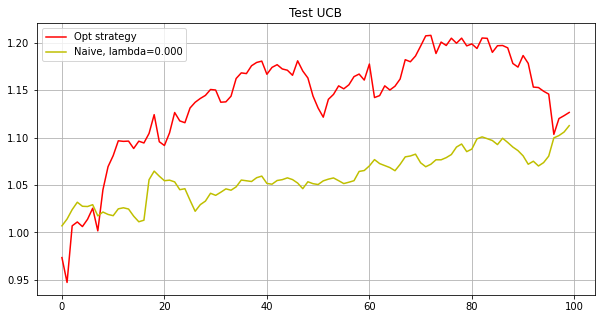

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.68386934
Mean return: 1.00043434
Naive strategy
Total return: 2.64346537
Mean return: 1.00081040


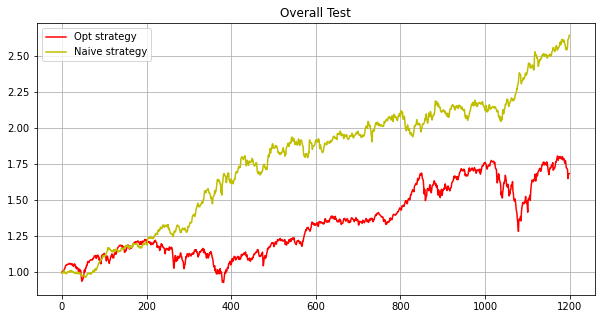

In [15]:
paras={'maxiter':5000, 'subn':100, 'lb':5, 'M':20, 'inverse':'True', 'ggd':'True', 'matcnt':30}

eps = 1.0001
delta = 0.01
run(paras, c=0.001, eps=eps, delta=delta, testv=np.arange(-0.02, 0.0100001, 0.002))

Phase 0
Testing...
./tmp2/res_phase00_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
8.806787542801897e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 

[0.0099 0.0091 0.01   0.0102 0.0105 0.0098 0.0098 0.0115 0.009  0.01
 0.0104 0.0106 0.0101 0.01   0.01   0.0096 0.0101 0.0106 0.01   0.0097
 0.0098 0.0096 0.0102 0.0108 0.0101 0.0099 0.0097 0.0096 0.0102 0.0101
 0.0104 0.009  0.0101 0.0101 0.0104 0.0098 0.0099 0.0102 0.0099 0.0103
 0.0101 0.0093 0.0098 0.0101 0.0103 0.0096 0.0103 0.0095 0.0101 0.0099
 0.0102 0.0097 0.0101 0.0102 0.0096 0.0101 0.0101 0.0103 0.0093 0.0101
 0.0102 0.0101 0.0098 0.01   0.0094 0.01   0.0103 0.0098 0.0099 0.0098
 0.0101 0.0105 0.0098 0.0102 0.0099 0.0101 0.0101 0.0099 0.0101 0.0099
 0.0103 0.01   0.0102 0.0102 0.0099 0.0099 0.0101 0.01   0.0099 0.0097
 0.0102 0.01   0.0104 0.0103 0.0093 0.0102 0.0102 0.0092 0.0103 0.0101]
1.1849738887556582e-06
[0.0099 0.0091 0.01   0.0102 0.0105 0.0098 0.0098 0.0115 0.009  0.01
 0.0104 0.0106 0.0101 0.01   0.01   0.0096 0.0101 0.0106 0.01   0.0097
 0.0098 0.0096 0.0102 0.0108 0.0101 0.0099 0.0097 0.0096 0.0102 0.0101
 0.0104 0.009  0.0101 0.0101 0.0104 0.0098 0.0099 0.0102 

[0.0099 0.0091 0.01   0.0102 0.0105 0.0098 0.0098 0.0115 0.009  0.01
 0.0104 0.0106 0.0101 0.01   0.01   0.0096 0.0101 0.0106 0.01   0.0097
 0.0098 0.0096 0.0102 0.0108 0.0101 0.0099 0.0097 0.0096 0.0102 0.0101
 0.0104 0.009  0.0101 0.0101 0.0104 0.0098 0.0099 0.0102 0.0099 0.0103
 0.0101 0.0093 0.0098 0.0101 0.0103 0.0096 0.0103 0.0095 0.0101 0.0099
 0.0102 0.0097 0.0101 0.0102 0.0096 0.0101 0.0101 0.0103 0.0093 0.0101
 0.0102 0.0101 0.0098 0.01   0.0094 0.01   0.0103 0.0098 0.0099 0.0098
 0.0101 0.0105 0.0098 0.0102 0.0099 0.0101 0.0101 0.0099 0.0101 0.0099
 0.0103 0.01   0.0102 0.0102 0.0099 0.0099 0.0101 0.01   0.0099 0.0097
 0.0102 0.01   0.0104 0.0103 0.0093 0.0102 0.0102 0.0092 0.0103 0.0101]
2.3905484628286566e-08
[0.0099 0.0091 0.01   0.0102 0.0105 0.0098 0.0098 0.0115 0.009  0.01
 0.0104 0.0106 0.0101 0.01   0.01   0.0096 0.0101 0.0106 0.01   0.0097
 0.0098 0.0096 0.0102 0.0108 0.0101 0.0099 0.0097 0.0096 0.0102 0.0101
 0.0104 0.009  0.0101 0.0101 0.0104 0.0098 0.0099 0.0102 

[0.0099 0.0091 0.01   0.0102 0.0105 0.0098 0.0098 0.0115 0.009  0.01
 0.0104 0.0106 0.0101 0.01   0.01   0.0096 0.0101 0.0106 0.01   0.0097
 0.0098 0.0096 0.0102 0.0108 0.0101 0.0099 0.0097 0.0096 0.0102 0.0101
 0.0104 0.009  0.0101 0.0101 0.0104 0.0098 0.0099 0.0102 0.0099 0.0103
 0.0101 0.0093 0.0098 0.0101 0.0103 0.0096 0.0103 0.0095 0.0101 0.0099
 0.0102 0.0097 0.0101 0.0102 0.0096 0.0101 0.0101 0.0103 0.0093 0.0101
 0.0102 0.0101 0.0098 0.01   0.0094 0.01   0.0103 0.0098 0.0099 0.0098
 0.0101 0.0105 0.0098 0.0102 0.0099 0.0101 0.0101 0.0099 0.0101 0.0099
 0.0103 0.01   0.0102 0.0102 0.0099 0.0099 0.0101 0.01   0.0099 0.0097
 0.0102 0.01   0.0104 0.0103 0.0093 0.0102 0.0102 0.0092 0.0103 0.0101]
6.39071744690245e-08
[0.0099 0.0091 0.01   0.0102 0.0105 0.0098 0.0098 0.0115 0.009  0.01
 0.0104 0.0106 0.0101 0.01   0.01   0.0096 0.0101 0.0106 0.01   0.0097
 0.0098 0.0096 0.0102 0.0108 0.0101 0.0099 0.0097 0.0096 0.0102 0.0101
 0.0104 0.009  0.0101 0.0101 0.0104 0.0098 0.0099 0.0102 0.

[0.0099 0.0091 0.01   0.0102 0.0105 0.0098 0.0098 0.0115 0.009  0.01
 0.0104 0.0106 0.0101 0.01   0.01   0.0096 0.0101 0.0106 0.01   0.0097
 0.0098 0.0096 0.0102 0.0108 0.0101 0.0099 0.0097 0.0096 0.0102 0.0101
 0.0104 0.009  0.0101 0.0101 0.0104 0.0098 0.0099 0.0102 0.0099 0.0103
 0.0101 0.0093 0.0098 0.0101 0.0103 0.0096 0.0103 0.0095 0.0101 0.0099
 0.0102 0.0097 0.0101 0.0102 0.0096 0.0101 0.0101 0.0103 0.0093 0.0101
 0.0102 0.0101 0.0098 0.01   0.0094 0.01   0.0103 0.0098 0.0099 0.0098
 0.0101 0.0105 0.0098 0.0102 0.0099 0.0101 0.0101 0.0099 0.0101 0.0099
 0.0103 0.01   0.0102 0.0101 0.0099 0.0099 0.0101 0.01   0.0099 0.0097
 0.0102 0.01   0.0104 0.0103 0.0093 0.0102 0.0102 0.0092 0.0103 0.0101]
2.000444432721099e-05
[0.0099 0.0091 0.01   0.0102 0.0105 0.0098 0.0098 0.0115 0.009  0.01
 0.0104 0.0106 0.0101 0.01   0.01   0.0096 0.0101 0.0106 0.01   0.0097
 0.0098 0.0096 0.0102 0.0108 0.0101 0.0099 0.0097 0.0096 0.0102 0.0101
 0.0104 0.009  0.0101 0.0101 0.0104 0.0098 0.0099 0.0102 0

[0.0098 0.0082 0.0102 0.0104 0.0108 0.0095 0.0097 0.011  0.0084 0.0096
 0.0106 0.011  0.0099 0.0098 0.0095 0.0094 0.0099 0.0109 0.0102 0.0096
 0.0096 0.0093 0.0104 0.0109 0.0101 0.0098 0.0097 0.0102 0.0103 0.0102
 0.0106 0.0087 0.0102 0.0101 0.0111 0.01   0.0102 0.0102 0.0099 0.0105
 0.0101 0.0091 0.0097 0.0102 0.0105 0.009  0.0103 0.0095 0.0101 0.0099
 0.0099 0.0097 0.0102 0.0102 0.0097 0.0102 0.0101 0.0105 0.0087 0.0102
 0.0103 0.0102 0.0097 0.0102 0.0094 0.0105 0.0104 0.0097 0.0102 0.0098
 0.0101 0.0106 0.0095 0.0102 0.0098 0.0099 0.0102 0.0099 0.0102 0.01
 0.0105 0.0101 0.0103 0.0103 0.01   0.0095 0.0101 0.01   0.0101 0.0095
 0.0103 0.0099 0.0101 0.0105 0.009  0.0103 0.0102 0.0095 0.0105 0.0102]
3.2111152765273987e-07
[0.0098 0.0082 0.0102 0.0104 0.0108 0.0095 0.0097 0.011  0.0084 0.0096
 0.0106 0.011  0.0099 0.0098 0.0095 0.0094 0.0099 0.0109 0.0102 0.0096
 0.0096 0.0093 0.0104 0.0109 0.0101 0.0098 0.0097 0.0102 0.0103 0.0102
 0.0106 0.0087 0.0102 0.0101 0.0111 0.01   0.0102 0.010

[0.0097 0.0084 0.0101 0.0105 0.0111 0.0094 0.0094 0.0105 0.0081 0.0089
 0.0109 0.0114 0.0101 0.0097 0.0095 0.0091 0.0108 0.011  0.0107 0.0094
 0.0094 0.0089 0.0107 0.0109 0.0101 0.0097 0.0097 0.0101 0.0105 0.0104
 0.0107 0.0083 0.0103 0.0102 0.0108 0.0098 0.0105 0.0102 0.0099 0.0108
 0.0102 0.0089 0.0096 0.0103 0.011  0.0081 0.0102 0.0095 0.0102 0.0102
 0.0095 0.0098 0.0103 0.0102 0.0097 0.0102 0.0101 0.0106 0.0079 0.0103
 0.0104 0.0103 0.0096 0.0103 0.0094 0.0112 0.0103 0.0096 0.0097 0.0096
 0.0102 0.0108 0.0096 0.0102 0.0097 0.0098 0.01   0.0097 0.0103 0.01
 0.0107 0.0101 0.0105 0.0104 0.0099 0.0096 0.0103 0.0101 0.0099 0.0095
 0.0104 0.0099 0.0099 0.0106 0.0088 0.0104 0.0102 0.0096 0.0107 0.0103]
1.0895294836991976e-07
[0.0097 0.0084 0.0101 0.0105 0.0111 0.0094 0.0094 0.0105 0.0081 0.0089
 0.0109 0.0114 0.0101 0.0097 0.0095 0.0091 0.0108 0.011  0.0107 0.0094
 0.0094 0.0089 0.0107 0.0109 0.0101 0.0097 0.0097 0.0101 0.0105 0.0104
 0.0107 0.0083 0.0103 0.0102 0.0108 0.0098 0.0105 0.010

[0.0097 0.0084 0.0101 0.0105 0.0111 0.0094 0.0094 0.0105 0.0081 0.0089
 0.0109 0.0114 0.0101 0.0097 0.0095 0.0091 0.0108 0.011  0.0107 0.0094
 0.0094 0.0089 0.0107 0.0109 0.0101 0.0097 0.0097 0.0101 0.0105 0.0104
 0.0107 0.0083 0.0103 0.0102 0.0108 0.0098 0.0105 0.0102 0.0099 0.0108
 0.0102 0.0089 0.0096 0.0103 0.011  0.0081 0.0102 0.0095 0.0102 0.0102
 0.0095 0.0098 0.0103 0.0102 0.0097 0.0102 0.0101 0.0106 0.0079 0.0103
 0.0104 0.0103 0.0096 0.0103 0.0094 0.0112 0.0103 0.0096 0.0097 0.0096
 0.0102 0.0108 0.0096 0.0102 0.0097 0.0098 0.01   0.0097 0.0103 0.01
 0.0107 0.0101 0.0105 0.0104 0.0099 0.0096 0.0103 0.0101 0.0099 0.0095
 0.0104 0.0099 0.0099 0.0106 0.0088 0.0104 0.0102 0.0096 0.0107 0.0103]
8.830091557058412e-07
[0.0097 0.0084 0.0101 0.0105 0.0111 0.0094 0.0094 0.0105 0.0081 0.0089
 0.0109 0.0114 0.0101 0.0097 0.0095 0.0091 0.0108 0.011  0.0107 0.0094
 0.0094 0.0089 0.0107 0.0109 0.0101 0.0097 0.0097 0.0101 0.0105 0.0104
 0.0107 0.0083 0.0103 0.0102 0.0108 0.0098 0.0105 0.0102

[0.0097 0.0084 0.0101 0.0105 0.0111 0.0094 0.0094 0.0105 0.0081 0.0089
 0.0109 0.0114 0.0101 0.0097 0.0095 0.0091 0.0108 0.011  0.0107 0.0094
 0.0094 0.0089 0.0107 0.0109 0.0101 0.0097 0.0097 0.0101 0.0105 0.0104
 0.0107 0.0083 0.0103 0.0102 0.0108 0.0098 0.0105 0.0102 0.0099 0.0108
 0.0102 0.0089 0.0096 0.0103 0.011  0.0081 0.0102 0.0095 0.0102 0.0102
 0.0095 0.0098 0.0103 0.0102 0.0097 0.0102 0.0101 0.0106 0.0079 0.0103
 0.0104 0.0103 0.0096 0.0103 0.0094 0.0112 0.0103 0.0096 0.0097 0.0096
 0.0102 0.0108 0.0096 0.0102 0.0097 0.0098 0.01   0.0097 0.0103 0.01
 0.0107 0.0101 0.0105 0.0104 0.0099 0.0096 0.0103 0.0101 0.0099 0.0095
 0.0104 0.0099 0.0099 0.0106 0.0088 0.0104 0.0102 0.0096 0.0107 0.0103]
7.431616124778384e-07
[0.0097 0.0084 0.0101 0.0105 0.0111 0.0094 0.0094 0.0105 0.0081 0.0089
 0.0109 0.0114 0.0101 0.0097 0.0095 0.0091 0.0108 0.011  0.0107 0.0094
 0.0094 0.0089 0.0107 0.0109 0.0101 0.0097 0.0097 0.0101 0.0105 0.0104
 0.0107 0.0083 0.0103 0.0102 0.0108 0.0098 0.0105 0.0102

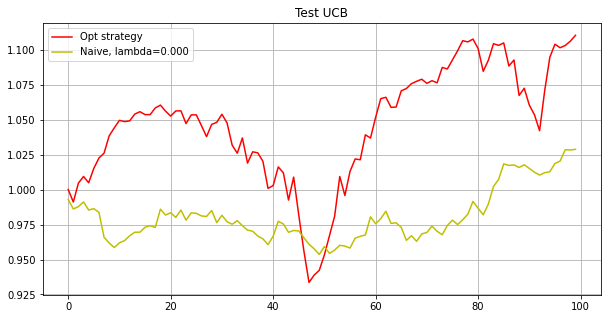

Phase 1
Testing...
./tmp2/res_phase01_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.071667497798412e-09
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 

[0.0091 0.0137 0.009  0.0117 0.0119 0.0088 0.0083 0.0115 0.0018 0.0118
 0.0105 0.0101 0.0099 0.0094 0.0044 0.0094 0.0104 0.0106 0.0108 0.0081
 0.011  0.0113 0.0104 0.0104 0.0119 0.0116 0.0065 0.0088 0.0108 0.0103
 0.0103 0.0062 0.0096 0.0103 0.011  0.0108 0.0095 0.0131 0.01   0.0099
 0.0101 0.0104 0.0096 0.0105 0.0086 0.0096 0.0117 0.0096 0.0117 0.0112
 0.0099 0.011  0.0114 0.0072 0.0091 0.0102 0.0103 0.0092 0.0093 0.0172
 0.0101 0.0113 0.0103 0.0114 0.0095 0.0081 0.0106 0.0102 0.0117 0.0109
 0.0108 0.0101 0.0107 0.0084 0.0112 0.01   0.0091 0.0104 0.0106 0.01
 0.01   0.0094 0.0094 0.0111 0.0093 0.0097 0.0096 0.0095 0.0094 0.0081
 0.0108 0.0113 0.0103 0.011  0.0094 0.0026 0.0108 0.0098 0.0099 0.0102]
0.0002835006751121334
[0.0091 0.0137 0.009  0.0117 0.012  0.0088 0.0083 0.0115 0.0018 0.0118
 0.0105 0.0101 0.0099 0.0094 0.0044 0.0094 0.0104 0.0106 0.0108 0.0081
 0.011  0.0113 0.0104 0.0104 0.0119 0.0116 0.0065 0.0088 0.0108 0.0103
 0.0103 0.0062 0.0096 0.0103 0.011  0.0108 0.0095 0.0131

[ 0.0071  0.      0.0094  0.0084  0.0094  0.006   0.007   0.0149  0.002
  0.0157  0.0102  0.0118  0.014   0.0095  0.      0.0085  0.0099  0.0119
  0.0104  0.0062  0.0139  0.0108  0.0114  0.0061  0.0141  0.0141  0.0016
  0.0091  0.0125  0.011   0.0111 -0.      0.0091  0.0102  0.0139  0.0166
  0.0106  0.0189  0.0125  0.0087  0.0113  0.0105  0.0101  0.011   0.0075
  0.0088  0.0147  0.0088  0.015   0.012   0.0109  0.0116  0.012   0.0062
  0.0111  0.0099  0.0105  0.0045  0.0079  0.0086  0.0106  0.0106  0.0115
  0.014   0.0085  0.0082  0.012   0.0086  0.0109  0.0128  0.0119  0.0095
  0.0124  0.0103  0.011   0.0106  0.0092  0.0153  0.0118  0.0099  0.0045
  0.0097  0.0118  0.0107  0.0083  0.0113  0.0093  0.0068  0.0079  0.0095
  0.0121  0.0147  0.0114  0.0136  0.0073  0.0027  0.0104  0.0094  0.01
  0.0076]
0.0005028773457740668
[ 0.0071  0.      0.0094  0.0084  0.0094  0.006   0.007   0.0149  0.002
  0.0157  0.0102  0.0118  0.014   0.0095  0.      0.0085  0.0099  0.0119
  0.0104  0.0062  0.013

[ 0.0071  0.      0.0094  0.0084  0.0094  0.006   0.007   0.0149  0.002
  0.0157  0.0102  0.0118  0.014   0.0095  0.      0.0085  0.0099  0.0119
  0.0104  0.0062  0.0139  0.0108  0.0114  0.0061  0.0141  0.0141  0.0016
  0.0091  0.0125  0.011   0.0111 -0.      0.0091  0.0102  0.0139  0.0166
  0.0106  0.0189  0.0125  0.0087  0.0113  0.0105  0.0101  0.011   0.0075
  0.0088  0.0147  0.0088  0.015   0.012   0.0109  0.0116  0.012   0.0062
  0.0111  0.0099  0.0105  0.0045  0.0079  0.0086  0.0106  0.0106  0.0115
  0.014   0.0085  0.0082  0.012   0.0086  0.0109  0.0128  0.0119  0.0095
  0.0124  0.0103  0.011   0.0106  0.0092  0.0153  0.0118  0.0099  0.0045
  0.0097  0.0118  0.0107  0.0083  0.0113  0.0093  0.0068  0.008   0.0095
  0.0121  0.0147  0.0114  0.0136  0.0073  0.0027  0.0104  0.0094  0.01
  0.0076]
0.0002480102063397346
[ 0.0071 -0.      0.0094  0.0084  0.0094  0.006   0.007   0.0149  0.002
  0.0157  0.0102  0.0118  0.014   0.0095  0.      0.0085  0.0099  0.0119
  0.0105  0.0062  0.013

[ 0.0071 -0.      0.0094  0.0084  0.0094  0.0061  0.007   0.0149  0.002
  0.0157  0.0102  0.0118  0.014   0.0095  0.      0.0085  0.0099  0.0119
  0.0105  0.0062  0.0139  0.0108  0.0114  0.0061  0.0141  0.0141  0.0016
  0.0091  0.0125  0.011   0.0111  0.      0.0091  0.0102  0.0139  0.0166
  0.0106  0.0189  0.0125  0.0087  0.0113  0.0105  0.0101  0.011   0.0075
  0.0088  0.0147  0.0088  0.015   0.012   0.0109  0.0116  0.012   0.0062
  0.0111  0.0099  0.0105  0.0045  0.0079  0.0086  0.0106  0.0106  0.0115
  0.014   0.0085  0.0082  0.012   0.0086  0.0109  0.0128  0.0119  0.0095
  0.0124  0.0103  0.011   0.0106  0.0092  0.0153  0.0118  0.0099  0.0045
  0.0097  0.0118  0.0107  0.0083  0.0113  0.0093  0.0068  0.008   0.0095
  0.0121  0.0147  0.0114  0.0136  0.0073  0.0027  0.0104  0.0094  0.01
  0.0076]
0.00012944627513337723
[ 0.0071 -0.      0.0094  0.0084  0.0094  0.0061  0.007   0.0149  0.002
  0.0157  0.0102  0.0118  0.014   0.0095  0.      0.0085  0.0099  0.0119
  0.0105  0.0062  0.01

[ 0.0071 -0.      0.0094  0.0084  0.0094  0.0061  0.007   0.0149  0.002
  0.0157  0.0102  0.0118  0.014   0.0095  0.      0.0085  0.0099  0.0118
  0.0104  0.0062  0.0138  0.0108  0.0114  0.0061  0.0141  0.0141  0.0016
  0.0091  0.0125  0.011   0.0111 -0.      0.0091  0.0102  0.0139  0.0166
  0.0106  0.0189  0.0125  0.0087  0.0113  0.0105  0.0101  0.011   0.0075
  0.0088  0.0147  0.0088  0.015   0.012   0.0109  0.0116  0.012   0.0062
  0.0111  0.0099  0.0105  0.0045  0.0079  0.0086  0.0106  0.0106  0.0115
  0.014   0.0085  0.0083  0.012   0.0086  0.0108  0.0128  0.0119  0.0095
  0.0124  0.0103  0.011   0.0106  0.0092  0.0153  0.0118  0.0099  0.0045
  0.0097  0.0118  0.0107  0.0083  0.0113  0.0093  0.0068  0.008   0.0095
  0.0121  0.0147  0.0114  0.0136  0.0073  0.0027  0.0104  0.0094  0.01
  0.0076]
0.00036187798700812554
[0.0071 0.     0.0094 0.0084 0.0094 0.0061 0.007  0.0149 0.002  0.0157
 0.0102 0.0118 0.014  0.0095 0.     0.0085 0.0099 0.0118 0.0104 0.0062
 0.0138 0.0108 0.0114 0.0

[ 0.0071 -0.      0.0094  0.0084  0.0094  0.0061  0.0071  0.0149  0.002
  0.0157  0.0102  0.0118  0.014   0.0095 -0.      0.0085  0.0099  0.0118
  0.0104  0.0062  0.0138  0.0108  0.0114  0.0061  0.0141  0.0141  0.0016
  0.0091  0.0125  0.011   0.0111 -0.      0.0091  0.0102  0.0139  0.0166
  0.0106  0.0189  0.0125  0.0087  0.0113  0.0105  0.0101  0.011   0.0075
  0.0088  0.0147  0.0088  0.015   0.012   0.0109  0.0116  0.012   0.0062
  0.0111  0.0099  0.0105  0.0045  0.0079  0.0086  0.0106  0.0106  0.0115
  0.014   0.0085  0.0082  0.012   0.0086  0.0108  0.0128  0.0119  0.0095
  0.0124  0.0103  0.011   0.0106  0.0092  0.0153  0.0118  0.0099  0.0045
  0.0097  0.0118  0.0107  0.0083  0.0113  0.0093  0.0068  0.008   0.0095
  0.0121  0.0147  0.0114  0.0136  0.0073  0.0027  0.0104  0.0094  0.01
  0.0076]
5.4954364952433036e-05
[0.0071 0.     0.0095 0.0084 0.0095 0.0061 0.0071 0.0149 0.002  0.0157
 0.0102 0.0118 0.014  0.0095 0.     0.0085 0.0099 0.0118 0.0105 0.0063
 0.0138 0.0108 0.0114 0.0

[ 0.0071  0.      0.0095  0.0083  0.0095  0.0061  0.0071  0.0148  0.002
  0.0157  0.0102  0.0118  0.014   0.0095 -0.      0.0085  0.0099  0.0118
  0.0105  0.0063  0.0139  0.0108  0.0114  0.0061  0.0141  0.0141  0.0016
  0.0091  0.0125  0.011   0.0111  0.      0.0091  0.0102  0.0139  0.0166
  0.0106  0.0189  0.0125  0.0087  0.0113  0.0105  0.0101  0.011   0.0075
  0.0088  0.0147  0.0088  0.015   0.012   0.0109  0.0115  0.012   0.0062
  0.0111  0.0099  0.0105  0.0045  0.0079  0.0086  0.0106  0.0106  0.0115
  0.014   0.0085  0.0082  0.012   0.0086  0.0109  0.0128  0.0119  0.0095
  0.0124  0.0103  0.011   0.0106  0.0092  0.0153  0.0118  0.0099  0.0045
  0.0097  0.0117  0.0107  0.0084  0.0113  0.0093  0.0068  0.008   0.0095
  0.0121  0.0147  0.0114  0.0136  0.0073  0.0027  0.0104  0.0094  0.01
  0.0076]
0.00011931661369055957
[ 0.0071  0.      0.0095  0.0083  0.0095  0.0061  0.0071  0.0149  0.002
  0.0157  0.0102  0.0118  0.014   0.0095 -0.      0.0085  0.0099  0.0118
  0.0105  0.0063  0.01

[0.0071 0.     0.0095 0.0083 0.0095 0.0061 0.0071 0.0149 0.002  0.0157
 0.0102 0.0118 0.014  0.0095 0.     0.0085 0.0099 0.0118 0.0105 0.0063
 0.0139 0.0108 0.0114 0.0061 0.0141 0.0141 0.0016 0.0091 0.0125 0.011
 0.0111 0.     0.0091 0.0102 0.0139 0.0166 0.0106 0.0189 0.0125 0.0087
 0.0113 0.0105 0.0101 0.011  0.0075 0.0088 0.0147 0.0088 0.015  0.012
 0.0109 0.0115 0.012  0.0062 0.0111 0.0099 0.0105 0.0045 0.0079 0.0086
 0.0106 0.0106 0.0115 0.014  0.0085 0.0082 0.012  0.0086 0.0109 0.0128
 0.0119 0.0095 0.0124 0.0103 0.011  0.0106 0.0092 0.0153 0.0118 0.0099
 0.0045 0.0097 0.0117 0.0107 0.0083 0.0113 0.0093 0.0068 0.008  0.0095
 0.0121 0.0147 0.0114 0.0136 0.0073 0.0027 0.0104 0.0094 0.01   0.0076]
3.3522073662068104e-06
[ 0.0072 -0.      0.0095  0.0083  0.0095  0.0061  0.0071  0.0149  0.002
  0.0157  0.0102  0.0118  0.014   0.0095  0.      0.0085  0.0099  0.0118
  0.0105  0.0063  0.0139  0.0108  0.0114  0.0061  0.0141  0.0141  0.0016
  0.0091  0.0125  0.011   0.0111 -0.      0.0091  

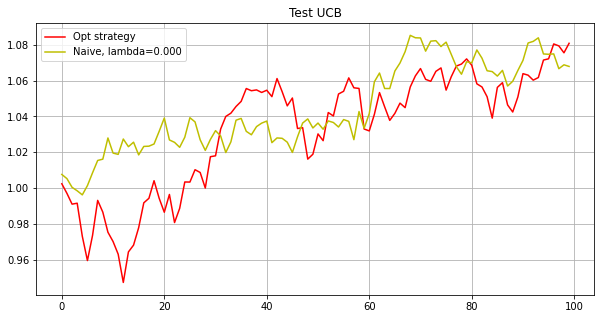

Phase 2
Testing...
./tmp2/res_phase02_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0071 0.0105 0.0105 0.0084 0.0084 0.0083 0.0107 0.0085 0.0044 0.0109
 0.0105 0.0088 0.0099 0.0146 0.0129 0.0094 0.0118 0.0086 0.0083 0.0113
 0.0097 0.0109 0.0105 0.0127 0.0085 0.0099 0.0085 0.0104 0.0136 0.0102
 0.0089 0.0071 0.0103 0.0109 0.0102 0.0118 0.0112 0.013  0.007  0.0123
 0.0096 0.0088 0.0089 0.014  0.0107 0.0088 0.0142 0.0114 0.0093 0.0103
 0.0084 0.0085 0.0106 0.0095 0.011  0.0102 0.0106 0.0079 0.0108 0.0086
 0.0052 0.0076 0.0095 0.0127 0.0125 0.01   0.0101 0.0086 0.0097 0.0102
 0.0072 0.0137 0.0099 0.0098 0.0098 0.0105 0.0083 0.0113 0.0106 0.0093
 0.0127 0.0092 0.0083 0.0057 0.0095 0.0113 0.0129 0.011  0.0102 0.0107
 0.0105 0.0092 0.0095 0.0086 0.0096 0.0114 0.0101 0.0093 0.0115 0.0093]
0.13854309112428936
[0.0071 0.0105 0.0105 0.0084 0.0084 0.0083 0.0107 0.0085 0.0044 0.0109
 0.0105 

[0.0062 0.0121 0.0111 0.0082 0.0072 0.0065 0.0113 0.0068 0.0042 0.0115
 0.0104 0.0092 0.0098 0.0137 0.0138 0.0095 0.0112 0.0073 0.0071 0.0117
 0.0091 0.0115 0.0108 0.0143 0.008  0.0104 0.0074 0.0109 0.0138 0.0111
 0.0089 0.0031 0.0104 0.0116 0.0108 0.0145 0.0103 0.0153 0.0071 0.0136
 0.0096 0.008  0.0084 0.0184 0.0077 0.0088 0.0131 0.0123 0.0084 0.0106
 0.0078 0.0089 0.0109 0.0106 0.0118 0.0106 0.0111 0.0067 0.0114 0.008
 0.0011 0.0051 0.0094 0.0155 0.0105 0.0095 0.0074 0.0082 0.01   0.01
 0.007  0.0172 0.0102 0.01   0.0093 0.012  0.0112 0.0108 0.0111 0.0091
 0.0116 0.0087 0.0115 0.0043 0.0086 0.0122 0.0151 0.0117 0.01   0.0114
 0.0105 0.0092 0.0094 0.008  0.0092 0.0106 0.0102 0.0088 0.0113 0.0084]
1.977690596356588e-06
[0.0062 0.0121 0.0111 0.0082 0.0072 0.0065 0.0113 0.0068 0.0042 0.0115
 0.0104 0.0092 0.0098 0.0137 0.0138 0.0095 0.0112 0.0073 0.0071 0.0117
 0.0091 0.0115 0.0108 0.0143 0.008  0.0104 0.0074 0.0109 0.0138 0.0111
 0.0089 0.0031 0.0104 0.0116 0.0108 0.0145 0.0103 0.0153 

[ 0.0054  0.0122  0.0122  0.0119  0.0053  0.0074  0.0126  0.0027  0.0008
  0.0141  0.0131  0.0092  0.009   0.0111  0.0147  0.0072  0.0108  0.0076
  0.0055  0.0137  0.0093  0.013   0.01    0.0178  0.0075  0.0117  0.0083
  0.013   0.0066  0.0109  0.0116  0.0009  0.0109  0.0127  0.0118  0.0173
  0.0157  0.0196  0.0018  0.0167  0.0085  0.0081  0.0084  0.0235 -0.
  0.0089  0.0117  0.0144  0.0069  0.0113  0.0066  0.0095  0.0116  0.0098
  0.0134  0.0112  0.0121  0.0046  0.0121  0.0073  0.      0.0056  0.0098
  0.0195  0.0085  0.0089  0.0065  0.0137  0.0105  0.0082  0.0033  0.021
  0.0103  0.0103  0.0076  0.0108  0.0108  0.0107  0.0122  0.0087  0.0145
  0.0061  0.0073  0.      0.0073  0.0131  0.0136  0.0128  0.0106  0.0111
  0.0103  0.0085  0.0092  0.0073  0.0089  0.0101  0.0106  0.0081  0.0131
  0.0074]
0.0001539519373629614
[ 0.0054  0.0122  0.0122  0.0119  0.0053  0.0074  0.0126  0.0027  0.0008
  0.0141  0.0131  0.0092  0.009   0.0111  0.0147  0.0072  0.0108  0.0076
  0.0055  0.0137  0.0093

[0.0054 0.0122 0.0122 0.0119 0.0053 0.0074 0.0126 0.0027 0.0008 0.0141
 0.0131 0.0092 0.009  0.0111 0.0147 0.0072 0.0108 0.0076 0.0055 0.0137
 0.0093 0.013  0.01   0.0178 0.0075 0.0117 0.0083 0.013  0.0066 0.0109
 0.0116 0.0009 0.0109 0.0127 0.0118 0.0173 0.0157 0.0196 0.0018 0.0167
 0.0085 0.0081 0.0084 0.0235 0.     0.0089 0.0117 0.0144 0.0069 0.0113
 0.0066 0.0095 0.0116 0.0098 0.0134 0.0113 0.0121 0.0046 0.0121 0.0073
 0.     0.0056 0.0098 0.0195 0.0085 0.0089 0.0065 0.0136 0.0105 0.0082
 0.0033 0.021  0.0103 0.0103 0.0076 0.0108 0.0108 0.0107 0.0122 0.0087
 0.0145 0.0061 0.0073 0.     0.0073 0.0131 0.0136 0.0128 0.0106 0.0111
 0.0103 0.0085 0.0092 0.0073 0.0089 0.0101 0.0106 0.0081 0.0131 0.0074]
1.072645044612158e-05
[0.0054 0.0122 0.0122 0.0119 0.0053 0.0074 0.0126 0.0027 0.0008 0.0141
 0.0131 0.0092 0.009  0.0111 0.0147 0.0072 0.0108 0.0076 0.0055 0.0137
 0.0093 0.013  0.01   0.0178 0.0075 0.0117 0.0083 0.013  0.0066 0.0109
 0.0116 0.0009 0.0109 0.0127 0.0118 0.0173 0.0157 0.01

[ 0.0047  0.0111  0.0125  0.01    0.0044  0.0067  0.0132  0.0021  0.
  0.016   0.013   0.0089  0.0075  0.0127  0.0089  0.0077  0.0112  0.0059
  0.0048  0.013   0.009   0.0138  0.0105  0.0187  0.0075  0.0106  0.0043
  0.0136  0.0087  0.0118  0.0101  0.      0.0114  0.013   0.0112  0.0186
  0.014   0.0215  0.      0.0173  0.0084  0.0099  0.0092  0.0236  0.0029
  0.0085  0.01    0.0153  0.0084  0.0116  0.0038  0.0105  0.0124  0.007
  0.0141  0.0116  0.0125  0.0041  0.0126  0.0069 -0.      0.0058  0.0096
  0.0213  0.0078  0.0086  0.0023  0.0165  0.0096  0.0104  0.0025  0.0223
  0.0107  0.0108  0.0073  0.013   0.0141  0.0109  0.0126  0.0088  0.0142
  0.0054  0.0083  0.0001  0.0073  0.0114  0.0158  0.0133  0.011   0.0132
  0.0105  0.0083  0.0087  0.0074  0.0088  0.0101  0.0108  0.0078  0.0128
  0.007 ]
0.00016290454724895385
[0.0047 0.0111 0.0125 0.01   0.0044 0.0067 0.0132 0.0021 0.     0.016
 0.013  0.0089 0.0075 0.0127 0.0089 0.0077 0.0112 0.0059 0.0048 0.013
 0.009  0.0138 0.0105 0.0187 

[ 0.0048  0.0111  0.0124  0.01    0.0044  0.0067  0.0133  0.0021 -0.
  0.016   0.013   0.0089  0.0075  0.0126  0.0089  0.0077  0.0112  0.0059
  0.0047  0.013   0.009   0.0138  0.0105  0.0187  0.0075  0.0106  0.0043
  0.0136  0.0087  0.0118  0.0101  0.      0.0114  0.013   0.0112  0.0186
  0.014   0.0215  0.      0.0173  0.0083  0.0099  0.0092  0.0237  0.0029
  0.0085  0.01    0.0153  0.0084  0.0115  0.0038  0.0106  0.0124  0.007
  0.0141  0.0117  0.0125  0.0041  0.0126  0.0069 -0.      0.0058  0.0096
  0.0213  0.0078  0.0086  0.0023  0.0165  0.0096  0.0104  0.0025  0.0223
  0.0107  0.0108  0.0073  0.013   0.0141  0.0109  0.0127  0.0088  0.0141
  0.0054  0.0084 -0.      0.0073  0.0113  0.0158  0.0133  0.011   0.0133
  0.0105  0.0083  0.0087  0.0075  0.0088  0.0101  0.0108  0.0078  0.0128
  0.0071]
0.0004725788975973348
[ 0.0048  0.0111  0.0124  0.01    0.0044  0.0067  0.0133  0.0021 -0.
  0.016   0.013   0.0089  0.0075  0.0126  0.0089  0.0077  0.0112  0.0059
  0.0047  0.013   0.009   0.

[ 0.0048  0.0111  0.0124  0.01    0.0044  0.0067  0.0133  0.0021 -0.
  0.016   0.0131  0.0089  0.0075  0.0126  0.0089  0.0077  0.0112  0.0059
  0.0047  0.013   0.009   0.0138  0.0105  0.0187  0.0075  0.0106  0.0043
  0.0136  0.0087  0.0118  0.0101 -0.      0.0114  0.013   0.0112  0.0186
  0.014   0.0215 -0.      0.0173  0.0083  0.0099  0.0092  0.0237  0.0029
  0.0085  0.01    0.0153  0.0084  0.0115  0.0038  0.0106  0.0124  0.007
  0.0141  0.0117  0.0125  0.0041  0.0126  0.0069 -0.      0.0058  0.0096
  0.0213  0.0078  0.0086  0.0023  0.0165  0.0096  0.0104  0.0025  0.0223
  0.0107  0.0108  0.0073  0.013   0.0141  0.0109  0.0127  0.0088  0.0141
  0.0054  0.0084  0.      0.0073  0.0113  0.0158  0.0133  0.011   0.0133
  0.0105  0.0082  0.0087  0.0075  0.0088  0.0101  0.0108  0.0078  0.0128
  0.0071]
8.416389220619017e-05
[ 0.0048  0.0111  0.0124  0.01    0.0044  0.0067  0.0133  0.0021 -0.
  0.016   0.0131  0.0089  0.0075  0.0126  0.0089  0.0077  0.0112  0.0059
  0.0047  0.013   0.009   0.

[ 0.0021  0.0123  0.0136  0.0063  0.0025  0.0031  0.015   0.     -0.
  0.018   0.0141  0.009   0.0065  0.0122  0.0146  0.0093  0.01    0.0039
  0.0037  0.0166  0.01    0.0156  0.012   0.0198  0.0057  0.013  -0.
  0.0139  0.      0.0138  0.0126 -0.      0.0118  0.0144  0.0107  0.0234
  0.0093  0.0264 -0.      0.0192  0.0068  0.0061  0.0098  0.0219  0.0003
  0.0098  0.0048  0.0174  0.0028  0.0126  0.0037  0.0177  0.013   0.0069
  0.016   0.0129  0.0139  0.0014  0.0146  0.0069 -0.      0.0019  0.008
  0.0226  0.0023  0.0084  0.0008  0.0143  0.0121  0.0105  0.0051  0.0253
  0.0118  0.0124  0.007   0.0187  0.0131  0.0086  0.0136  0.0096  0.0126
  0.0044  0.0112  0.      0.0085  0.0085  0.0163  0.0143  0.0114  0.0124
  0.0106  0.0076  0.009   0.0075  0.0086  0.0082  0.0114  0.0073  0.0137
  0.0063]
0.18279278226238713
[ 0.0021  0.0123  0.0136  0.0063  0.0025  0.0031  0.015   0.     -0.
  0.018   0.0141  0.009   0.0065  0.0122  0.0146  0.0093  0.01    0.0039
  0.0037  0.0166  0.01    0.0156  

[ 0.0021  0.0123  0.0136  0.0063  0.0025  0.0031  0.015  -0.     -0.
  0.018   0.0141  0.009   0.0065  0.0122  0.0145  0.0093  0.01    0.0039
  0.0037  0.0166  0.01    0.0156  0.012   0.0198  0.0057  0.013  -0.
  0.0139  0.      0.0137  0.0126  0.      0.0118  0.0144  0.0107  0.0234
  0.0093  0.0263  0.      0.0192  0.0068  0.0061  0.0098  0.0219  0.0003
  0.0098  0.0048  0.0174  0.0028  0.0126  0.0037  0.0177  0.013   0.0069
  0.016   0.0129  0.0139  0.0014  0.0146  0.0069  0.      0.0019  0.0081
  0.0226  0.0023  0.0084  0.0008  0.0143  0.0121  0.0106  0.0051  0.0253
  0.0118  0.0124  0.007   0.0187  0.0131  0.0086  0.0136  0.0096  0.0126
  0.0044  0.0112 -0.      0.0085  0.0085  0.0163  0.0143  0.0114  0.0124
  0.0106  0.0076  0.009   0.0075  0.0087  0.0081  0.0114  0.0073  0.0137
  0.0063]
0.00012099980954251097
[ 0.002   0.0123  0.0136  0.0063  0.0025  0.0031  0.015  -0.     -0.
  0.018   0.0141  0.009   0.0065  0.0122  0.0146  0.0093  0.01    0.0039
  0.0037  0.0166  0.01    0.01

[ 0.0021  0.0123  0.0136  0.0064  0.0025  0.0031  0.015  -0.     -0.
  0.018   0.0141  0.009   0.0065  0.0122  0.0145  0.0093  0.01    0.0039
  0.0037  0.0166  0.01    0.0156  0.012   0.0198  0.0057  0.013  -0.
  0.0139 -0.      0.0137  0.0126  0.      0.0119  0.0144  0.0107  0.0234
  0.0093  0.0263  0.      0.0192  0.0068  0.0061  0.0098  0.0219  0.0003
  0.0098  0.0048  0.0174  0.0028  0.0126  0.0037  0.0177  0.013   0.0069
  0.016   0.0129  0.0139  0.0014  0.0146  0.0069 -0.      0.0019  0.008
  0.0226  0.0023  0.0084  0.0008  0.0143  0.0121  0.0106  0.0051  0.0253
  0.0118  0.0125  0.007   0.0187  0.0131  0.0086  0.0136  0.0096  0.0126
  0.0044  0.0112 -0.      0.0085  0.0085  0.0163  0.0143  0.0114  0.0124
  0.0106  0.0076  0.009   0.0075  0.0086  0.0081  0.0114  0.0073  0.0137
  0.0063]
1.8179367243684234e-05
[ 0.0009  0.0134  0.014   0.007   0.0019  0.0027  0.0155 -0.      0.001
  0.0191  0.0139  0.0091  0.0065  0.0098  0.0143  0.0097  0.0104  0.0021
  0.004   0.0175  0.0094  0.

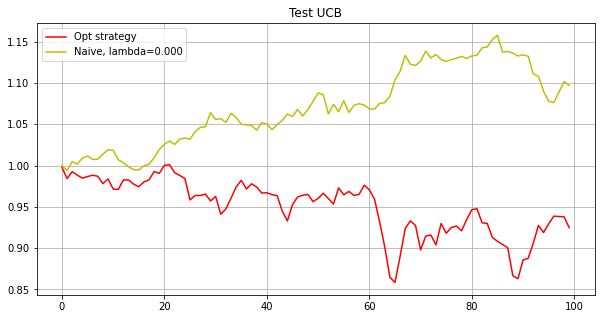

Phase 3
Testing...
./tmp2/res_phase03_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0113  0.0079  0.0058  0.0087  0.0079  0.006   0.0105  0.0134  0.0058
  0.0131  0.0086  0.0115  0.0096  0.0044  0.0106  0.0098  0.0095  0.0104
  0.0104  0.0071  0.0139  0.0093  0.0095  0.0159  0.0163  0.0102  0.0079
  0.      0.0143  0.0023  0.008   0.0099  0.0114  0.0054  0.0097  0.0068
  0.0083  0.0082  0.0108  0.0147  0.0095  0.0152  0.0108  0.      0.0158
  0.0099  0.0114  0.0035  0.0104 -0.      0.0113  0.013   0.0145  0.01
  0.0093  0.0086  0.0106  0.0115  0.011   0.0132  0.0124  0.0074  0.0088
  0.0095  0.0127  0.0108  0.0116  0.011   0.0087  0.0086  0.0105  0.0091
  0.0104  0.0121  0.0112  0.0132  0.0109  0.0034  0.0088  0.0175  0.0124
  0.0118  0.0117  0.011   0.0102  0.0073  0.0135  0.0108  0.01    0.0107
  0.0105  0.0113  0.01    0.0102  0.0102  0.0101  0.0098  0.0135  0.0096
  0.0124]

[ 0.0144  0.0019 -0.      0.0044  0.0016 -0.      0.013   0.022   0.
  0.0208  0.0044  0.0077  0.0083  0.0006  0.009   0.0122 -0.      0.0071
  0.007   0.      0.0207  0.001  -0.      0.0109  0.0194  0.0104  0.004
  0.0046  0.0189  0.0006  0.0056  0.0114  0.0064  0.      0.0192  0.0104
  0.0033  0.0097  0.011   0.0152  0.0028  0.0188  0.0025  0.      0.0136
  0.0132  0.0166  0.      0.0121  0.      0.0134  0.0188  0.0104  0.0149
  0.      0.0072  0.0109  0.0154  0.0044  0.0122  0.0186  0.0038  0.0137
  0.0104  0.0206  0.0153  0.0116  0.0129  0.0039  0.0038  0.0166  0.0038
  0.0201  0.0158  0.0119  0.0219  0.0106  0.0021  0.0113  0.0238  0.0181
  0.0109  0.0147  0.0131  0.0077  0.0089  0.0082  0.013   0.0093  0.012
  0.013   0.0132  0.0068  0.0104  0.0148  0.0115  0.0098  0.0223  0.0073
  0.0179]
0.00012276452147933715
[ 0.0144  0.0019 -0.      0.0044  0.0016 -0.      0.013   0.022   0.
  0.0208  0.0044  0.0077  0.0083  0.0006  0.009   0.0122 -0.      0.0071
  0.007   0.      0.0208  0.

[ 0.0143  0.0019 -0.      0.0044  0.0016  0.      0.013   0.022   0.
  0.0208  0.0044  0.0077  0.0083  0.0006  0.009   0.0122  0.0001  0.0071
  0.007   0.      0.0207  0.001  -0.      0.0109  0.0194  0.0104  0.004
  0.0046  0.0189  0.0006  0.0057  0.0114  0.0064  0.      0.0192  0.0104
  0.0033  0.0097  0.011   0.0152  0.0028  0.0188  0.0025  0.      0.0136
  0.0132  0.0166  0.      0.0122  0.      0.0134  0.0188  0.0104  0.0149
 -0.      0.0072  0.0109  0.0154  0.0044  0.0122  0.0186  0.0038  0.0136
  0.0104  0.0206  0.0153  0.0116  0.0129  0.0039  0.0038  0.0166  0.0038
  0.0201  0.0158  0.0119  0.0219  0.0106  0.0021  0.0113  0.0238  0.0181
  0.0109  0.0147  0.0131  0.0077  0.0089  0.0082  0.013   0.0093  0.012
  0.013   0.0132  0.0068  0.0104  0.0148  0.0115  0.0098  0.0223  0.0073
  0.0179]
0.00024387083504603737
[ 0.0143  0.0019 -0.      0.0044  0.0016  0.      0.013   0.022   0.
  0.0208  0.0044  0.0077  0.0083  0.0006  0.009   0.0122  0.0001  0.0071
  0.007   0.      0.0207  0.

[ 0.0146  0.0012  0.      0.0039  0.0008 -0.      0.0136  0.023  -0.
  0.0216  0.0039  0.008   0.008   0.      0.01    0.012   0.      0.007
  0.0061 -0.      0.0214 -0.     -0.      0.0113  0.0202  0.0105  0.0041
  0.0065  0.0195 -0.      0.0059  0.0115  0.0063  0.      0.0198  0.0103
  0.0027  0.0091  0.0108  0.0155  0.0016  0.0192  0.0024 -0.      0.0115
  0.0135  0.0167  0.0003  0.013   0.      0.0135  0.0191  0.0088  0.0153
  0.      0.0064  0.0109  0.0143  0.0031  0.0116  0.0192  0.0042  0.0143
  0.0113  0.0214  0.0152  0.0118  0.013   0.0034  0.0037  0.017   0.0031
  0.0202  0.0163  0.0117  0.022   0.0105  0.001   0.0112  0.0243  0.0187
  0.0102  0.0151  0.0133  0.0074  0.0086  0.0074  0.0132  0.0092  0.0121
  0.0135  0.0135  0.0073  0.0102  0.0155  0.0117  0.0097  0.0232  0.0071
  0.0182]
0.02691743858937169
[ 0.0146  0.0012  0.      0.0039  0.0008 -0.      0.0136  0.023  -0.
  0.0216  0.0039  0.008   0.008   0.      0.01    0.012   0.      0.007
  0.0061 -0.      0.0214 -0.   

[ 0.0146  0.0008  0.      0.0037  0.0005  0.      0.0138  0.0233 -0.
  0.0219  0.0036  0.0077  0.0079  0.      0.0102  0.0119 -0.      0.0067
  0.0055 -0.      0.0215  0.0005 -0.      0.011   0.0199  0.0104  0.0045
  0.007   0.0195  0.      0.0063  0.0115  0.0062  0.0002  0.0195  0.01
  0.0023  0.009   0.0107  0.0154  0.0016  0.0191  0.002   0.      0.0103
  0.0137  0.0171 -0.      0.0129 -0.      0.0137  0.0187  0.0094  0.0153
 -0.      0.0061  0.0109  0.0148  0.0038  0.0123  0.0195  0.0039  0.0148
  0.0114  0.0216  0.0161  0.0116  0.013   0.0031  0.0037  0.0176  0.0032
  0.0203  0.0162  0.0118  0.0217  0.0105  0.0008  0.011   0.0244  0.0188
  0.0104  0.0153  0.0134  0.0071  0.0085  0.0072  0.0132  0.0091  0.0121
  0.0138  0.0134  0.0068  0.0101  0.0154  0.012   0.0095  0.0236  0.0069
  0.0182]
3.629784655629712e-05
[ 0.0146  0.0008  0.      0.0037  0.0005  0.      0.0138  0.0233 -0.
  0.0219  0.0036  0.0077  0.0079  0.      0.0102  0.0119  0.      0.0067
  0.0055  0.      0.0215  0.0

[ 0.0147  0.0006 -0.      0.0035  0.0002 -0.      0.014   0.0236  0.
  0.0222  0.0034  0.0077  0.0078 -0.      0.01    0.0122  0.      0.0066
  0.0053  0.      0.0218  0.0003  0.      0.0107  0.0197  0.0104  0.004
  0.0085  0.0197  0.0003  0.006   0.0116  0.0059  0.      0.0197  0.0096
  0.0021  0.0095  0.0107  0.0154  0.0014  0.0192  0.0014  0.0003  0.0098
  0.014   0.0174  0.      0.0129  0.0003  0.0139  0.019   0.0092  0.0153
  0.0003  0.0059  0.0109  0.0149  0.0032  0.0115  0.0197  0.0037  0.0148
  0.0112  0.0219  0.0164  0.0116  0.0131  0.0029  0.0034  0.0179  0.003
  0.0206  0.0163  0.0118  0.0216  0.0105  0.001   0.011   0.0244  0.019
  0.0101  0.0154  0.0134  0.0071  0.0085  0.007   0.0134  0.009   0.0121
  0.014   0.0133  0.0067  0.01    0.0156  0.0121  0.0094  0.0239  0.0068
  0.0182]
2.021721659933045e-05
[ 0.0147  0.0006 -0.      0.0035  0.0002 -0.      0.014   0.0236  0.
  0.0222  0.0034  0.0077  0.0078 -0.      0.01    0.0122  0.      0.0066
  0.0053  0.      0.0218  0.00

[ 0.0153 -0.     -0.      0.0025  0.      0.      0.0153  0.0252 -0.
  0.0239  0.0024  0.0071  0.0072  0.      0.0102  0.0118  0.      0.006
  0.0044  0.      0.0233 -0.     -0.      0.009   0.019   0.0106  0.0019
  0.0123  0.0201  0.      0.0048  0.0116  0.0048 -0.      0.0154  0.0093
  0.0009  0.0085  0.0104  0.012  -0.      0.0219  0.0014 -0.      0.0114
  0.0152  0.0175  0.      0.0127  0.      0.0151  0.0203  0.0084  0.016
  0.0032  0.006   0.0109  0.0157  0.0006  0.0132  0.021   0.0029  0.0156
  0.0117  0.0233  0.017   0.0114  0.0135  0.0018  0.001   0.0183  0.0022
  0.0208  0.0174  0.013   0.021   0.0101  0.0011  0.0115  0.0262  0.0194
  0.0089  0.0163  0.0139  0.0072  0.009   0.0045  0.0137  0.0088  0.0123
  0.0135  0.0126  0.0053  0.0094  0.0156  0.0135  0.0088  0.0259  0.0067
  0.0187]
0.00029368919775040977
[ 0.0152 -0.     -0.      0.0025  0.      0.      0.0153  0.0252 -0.
  0.0239  0.0024  0.0071  0.0072 -0.      0.0102  0.0118 -0.      0.006
  0.0045  0.      0.0233  0. 

[ 0.0152  0.      0.      0.0025  0.      0.      0.0153  0.0252  0.
  0.0239  0.0024  0.0071  0.0072  0.      0.0102  0.0118 -0.      0.006
  0.0045 -0.      0.0233  0.     -0.      0.009   0.019   0.0106  0.0019
  0.0123  0.0201  0.0001  0.0048  0.0116  0.0048  0.      0.0154  0.0093
  0.0009  0.0085  0.0104  0.012   0.      0.0219  0.0014 -0.      0.0114
  0.0152  0.0175  0.      0.0127  0.      0.0151  0.0203  0.0084  0.016
  0.0032  0.006   0.0109  0.0157  0.0006  0.0131  0.021   0.0029  0.0156
  0.0117  0.0233  0.017   0.0114  0.0135  0.0018  0.001   0.0183  0.0021
  0.0208  0.0174  0.0131  0.021   0.0101  0.0011  0.0115  0.0262  0.0194
  0.0089  0.0163  0.0139  0.0073  0.009   0.0045  0.0137  0.0088  0.0123
  0.0135  0.0126  0.0053  0.0094  0.0155  0.0135  0.0088  0.0259  0.0067
  0.0187]
0.0002151684640408073
[ 0.0151 -0.      0.      0.0025  0.      0.      0.0153  0.0252  0.
  0.0239  0.0024  0.0071  0.0072  0.      0.0102  0.0118 -0.      0.006
  0.0045  0.      0.0233  0.  

[ 0.0151  0.      0.      0.0025 -0.     -0.      0.0153  0.0251  0.
  0.0239  0.0024  0.0071  0.0072  0.      0.0102  0.0118  0.      0.006
  0.0045  0.      0.0233  0.      0.      0.009   0.019   0.0106  0.002
  0.0123  0.0202  0.      0.0048  0.0116  0.0048  0.      0.0154  0.0093
  0.0009  0.0085  0.0104  0.012   0.      0.0219  0.0014  0.      0.0114
  0.0152  0.0175  0.      0.0127  0.      0.0151  0.0203  0.0084  0.016
  0.0032  0.006   0.0109  0.0158  0.0006  0.0131  0.021   0.0029  0.0156
  0.0117  0.0234  0.017   0.0115  0.0135  0.0018  0.001   0.0183  0.0022
  0.0208  0.0174  0.0131  0.021   0.0101  0.0011  0.0115  0.0262  0.0194
  0.0089  0.0163  0.0139  0.0072  0.009   0.0045  0.0137  0.0088  0.0123
  0.0135  0.0126  0.0053  0.0094  0.0156  0.0135  0.0088  0.0259  0.0067
  0.0187]
0.00021294024551345685
[ 0.015   0.      0.      0.0025 -0.     -0.      0.0153  0.0251  0.
  0.0239  0.0024  0.0071  0.0072  0.      0.0102  0.0118 -0.      0.006
  0.0045  0.      0.0233  0.  

[ 0.0158 -0.     -0.      0.0015  0.      0.      0.0147  0.0271 -0.
  0.0258  0.0014  0.0067  0.0072 -0.      0.0094  0.0132 -0.      0.0045
  0.0017  0.      0.0257  0.      0.      0.0051  0.0185  0.0109  0.
  0.0104  0.0213 -0.      0.0048  0.0118  0.0032  0.      0.0102  0.0056
  0.      0.0117  0.0111  0.0142  0.      0.0234  0.      0.      0.0067
  0.0158  0.0187  0.      0.0127  0.      0.0163  0.0213  0.0085  0.0153
  0.0038  0.0049  0.0111  0.0168  0.0005  0.0141  0.0224  0.0018  0.0169
  0.0148  0.0249  0.0179  0.0124  0.0142  0.0009 -0.      0.0209  0.0013
  0.0182  0.0185  0.0121  0.02    0.0099  0.0024  0.0112  0.0271  0.02
  0.0072  0.0175  0.0144  0.0072  0.0108  0.0037  0.0145  0.0087  0.0127
  0.0138  0.0121  0.0034  0.0098  0.0181  0.0125  0.0087  0.0281  0.0066
  0.0189]
0.00011933478296148039
[ 0.0158 -0.      0.      0.0015 -0.     -0.      0.0147  0.0272 -0.
  0.0258  0.0014  0.0067  0.0072 -0.      0.0094  0.0132 -0.      0.0045
  0.0017 -0.      0.0257  0.    

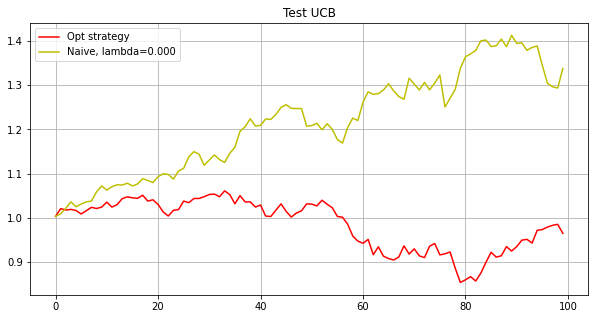

Phase 4
Testing...
./tmp2/res_phase04_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0109 0.0086 0.0005 0.0079 0.0127 0.0099 0.0107 0.0056 0.0129 0.0076
 0.015  0.0075 0.     0.0081 0.0084 0.0108 0.011  0.0032 0.0066 0.0106
 0.0077 0.0134 0.009  0.0077 0.0046 0.0072 0.0091 0.0103 0.0235 0.009
 0.0145 0.0104 0.0089 0.0106 0.0059 0.0086 0.0117 0.0091 0.0111 0.0068
 0.0095 0.0075 0.0104 0.0087 0.0127 0.0151 0.0108 0.0098 0.0092 0.0119
 0.0121 0.0106 0.0078 0.0097 0.0093 0.0086 0.0112 0.0108 0.0125 0.01
 0.01   0.009  0.0092 0.0008 0.0114 0.0092 0.0124 0.0108 0.0088 0.0105
 0.0088 0.0107 0.0098 0.0106 0.0101 0.013  0.0093 0.0121 0.0112 0.0104
 0.0115 0.0092 0.0107 0.0174 0.0121 0.01   0.0115 0.0107 0.0111 0.0098
 0.0123 0.0109 0.0108 0.0105 0.0114 0.011  0.0111 0.0094 0.0131 0.0114]
0.1982379749718065
[0.011  0.0076 0.     0.0053 0.0125 0.0096 0.0107 0.0031 0.014  0.006
 0.018  0.004

[ 0.0131  0.0046  0.      0.0004  0.0185  0.0094  0.0122 -0.      0.0206
 -0.      0.0243 -0.      0.0012  0.0026  0.0038  0.0106  0.0104  0.0107
 -0.      0.012   0.0015  0.0069  0.0063  0.0122 -0.      0.0138  0.0066
  0.0098  0.0068  0.0018  0.0142  0.0149  0.0015  0.0147  0.0049  0.0058
  0.0208  0.0064  0.0067  0.0046  0.0096  0.008   0.0109  0.0034  0.018
  0.0088  0.0078  0.011   0.0068  0.0166  0.0136  0.0105  0.0087  0.0088
  0.008   0.0065  0.0057  0.0177  0.0187  0.0054  0.0097  0.0061  0.006
  0.0089  0.0144  0.0068  0.0185  0.0127  0.0052  0.0148  0.0031  0.0122
  0.009   0.0142  0.0101  0.0268  0.0107  0.0037  0.0143  0.0112  0.0152
  0.0066  0.0072  0.03    0.0163  0.0096  0.0154  0.0081  0.0129  0.0101
  0.012   0.0132  0.0127  0.0075  0.0183  0.0134  0.0137  0.0077  0.0185
  0.0144]
0.00047207463235385196
[ 0.0145  0.0027  0.     -0.      0.0229  0.0095  0.0134 -0.      0.0251
  0.      0.021   0.     -0.      0.      0.0045  0.0103  0.012   0.0014
  0.      0.0131  0.

[ 0.0151  0.0008  0.      0.      0.0222  0.009   0.0137  0.      0.0279
 -0.      0.0181  0.0017 -0.     -0.      0.0027  0.0137  0.0107  0.
 -0.      0.0134  0.      0.0016  0.0027  0.0054 -0.      0.0078  0.0041
  0.0141  0.0017 -0.      0.0179  0.0128 -0.      0.0149  0.      0.008
  0.0229  0.0039  0.0011 -0.      0.0091  0.006   0.0106 -0.      0.0245
  0.0121  0.0044  0.0102  0.0046  0.021   0.0159  0.0113  0.0061  0.0074
  0.0059  0.0047  0.0015  0.0214  0.022   0.0049  0.0097  0.0037  0.0043
  0.      0.0184  0.0046  0.0244  0.0144  0.0018  0.0194 -0.      0.0137
  0.0083  0.0161  0.0102  0.0299  0.0151 -0.      0.017   0.0116  0.0188
  0.0042  0.01    0.0382  0.0198  0.0097  0.0192  0.01    0.0146  0.0106
  0.0156  0.0155  0.0146  0.0077  0.0211  0.0157  0.0164  0.0062  0.0203
  0.0178]
3.184752851974741e-05
[ 0.0151  0.0008  0.     -0.      0.0222  0.009   0.0137  0.      0.0279
  0.      0.0181  0.0017  0.     -0.      0.0027  0.0137  0.0107  0.
 -0.      0.0134  0.      0.

[ 0.0158 -0.     -0.      0.      0.0217  0.0088  0.0143  0.      0.0306
  0.      0.0167  0.      0.     -0.      0.0009  0.0103  0.0102 -0.
 -0.      0.0138 -0.      0.0011  0.0007  0.      0.0019  0.0085  0.0032
  0.0139 -0.      0.      0.0193  0.0137  0.      0.0171  0.      0.0058
  0.0247  0.003   0.0034 -0.      0.0091  0.001   0.0102  0.      0.0246
  0.0113  0.0045  0.0105  0.0038  0.0225  0.0151  0.0116  0.0052  0.0032
  0.0049  0.0032  0.0031  0.021   0.0239  0.0028  0.0097  0.0022  0.
  0.      0.0198  0.0038  0.0266  0.015   0.0006  0.0211  0.      0.0142
  0.0081  0.0184  0.013   0.0303  0.0188 -0.      0.0183  0.0119  0.0201
  0.0033  0.0099  0.0393  0.0218  0.0098  0.0206  0.0086  0.0148  0.0109
  0.0171  0.0163  0.0153  0.0068  0.0229  0.0165  0.0173  0.0055  0.0216
  0.019 ]
0.000374640888078699
[ 0.016  -0.      0.      0.      0.0216  0.0086  0.0144 -0.      0.0321
  0.      0.0173 -0.      0.0028  0.      0.0002  0.011   0.0091  0.0001
  0.      0.014   0.      0.

[ 0.016  -0.      0.      0.      0.0216  0.0086  0.0144  0.      0.0321
  0.      0.0174  0.      0.0028  0.      0.0002  0.011   0.0091  0.0001
  0.      0.014   0.      0.0002 -0.      0.0037  0.      0.0107  0.0024
  0.0133  0.      0.      0.0214  0.0136  0.      0.0174  0.      0.0054
  0.0252  0.0022  0.0014  0.      0.0091  0.      0.0102  0.      0.025
  0.0104  0.0038  0.0102  0.0031  0.0233  0.0135  0.0117  0.005   0.003
  0.0043  0.0019  0.0008  0.022   0.024   0.0013  0.0094  0.0023 -0.
 -0.      0.0206  0.0031  0.0277  0.0152 -0.      0.0225 -0.      0.0144
  0.0077  0.0194  0.0124  0.0314  0.0181  0.      0.0187  0.0118  0.0207
  0.0025  0.0094  0.038   0.0229  0.0094  0.0212  0.01    0.015   0.0108
  0.0155  0.0166  0.0156  0.0068  0.0229  0.0168  0.0177  0.0049  0.022
  0.0196]
4.506341132546897e-05
[ 0.016  -0.      0.     -0.      0.0216  0.0086  0.0144 -0.      0.0321
  0.      0.0174 -0.      0.0028  0.      0.0002  0.011   0.0091  0.0001
  0.      0.014   0.      

[ 0.0164  0.      0.      0.      0.0233  0.0079  0.0145  0.      0.0346
 -0.      0.014   0.      0.     -0.      0.      0.0094  0.009   0.
 -0.      0.0143 -0.      0.     -0.      0.0072 -0.      0.0111  0.001
  0.0143 -0.     -0.      0.0184  0.0178 -0.      0.0118  0.0002  0.0066
  0.0254  0.0007  0.     -0.      0.009   0.      0.0101  0.      0.026
  0.0136  0.0021  0.0097  0.0017  0.0246  0.0125  0.0118  0.0059  0.0035
  0.0031  0.      0.0023  0.0241  0.0222  0.0003  0.0087  0.0022  0.0005
 -0.      0.0214  0.0017  0.0297  0.0155 -0.      0.0232 -0.      0.0145
  0.0071  0.0187  0.0151  0.0318  0.0167 -0.      0.0197  0.0115  0.0217
  0.0011  0.0105  0.0362  0.0243  0.0097  0.0221  0.0106  0.0147  0.0104
  0.0129  0.0171  0.0159  0.007   0.0233  0.0173  0.0183  0.0035  0.0245
  0.0205]
0.09191911936532765
[ 0.0164  0.      0.      0.      0.0233  0.0079  0.0146  0.      0.0346
 -0.      0.014   0.      0.     -0.      0.      0.0094  0.009   0.
 -0.      0.0143 -0.      0.   

[ 0.0164  0.      0.      0.      0.0233  0.0079  0.0146  0.      0.0346
  0.      0.014   0.     -0.      0.      0.      0.0094  0.009  -0.
  0.      0.0143  0.      0.      0.      0.0072 -0.      0.0111  0.001
  0.0143  0.     -0.      0.0184  0.0178 -0.      0.0118  0.0002  0.0066
  0.0254  0.0007 -0.      0.      0.009   0.      0.0101  0.      0.026
  0.0136  0.0021  0.0097  0.0017  0.0246  0.0125  0.0118  0.0059  0.0035
  0.0031  0.      0.0023  0.0241  0.0222  0.0003  0.0087  0.0022  0.0005
  0.      0.0214  0.0017  0.0297  0.0155  0.      0.0232  0.      0.0145
  0.0071  0.0187  0.0151  0.0318  0.0167 -0.      0.0197  0.0115  0.0217
  0.0011  0.0105  0.0362  0.0243  0.0097  0.0221  0.0106  0.0147  0.0104
  0.0129  0.0171  0.0159  0.007   0.0233  0.0173  0.0183  0.0035  0.0245
  0.0205]
2.052569838300873e-05
[ 0.0164 -0.      0.      0.      0.0233  0.0079  0.0146  0.      0.0346
 -0.      0.014   0.     -0.     -0.     -0.      0.0094  0.009  -0.
 -0.      0.0143  0.     -0. 

[ 0.0164 -0.      0.      0.      0.0233  0.0079  0.0146 -0.      0.0346
 -0.      0.014   0.     -0.     -0.      0.      0.0094  0.009   0.
 -0.      0.0143  0.      0.      0.      0.0072  0.      0.0111  0.001
  0.0143  0.     -0.      0.0184  0.0178  0.      0.0118  0.0002  0.0066
  0.0254  0.0007  0.     -0.      0.009   0.      0.0101 -0.      0.026
  0.0136  0.0021  0.0098  0.0017  0.0246  0.0125  0.0118  0.0059  0.0035
  0.0031 -0.      0.0023  0.0241  0.0222  0.0003  0.0087  0.0022  0.0005
 -0.      0.0214  0.0017  0.0297  0.0155 -0.      0.0232 -0.      0.0145
  0.0071  0.0187  0.0151  0.0318  0.0167  0.      0.0197  0.0115  0.0217
  0.0011  0.0105  0.0362  0.0243  0.0097  0.0221  0.0106  0.0147  0.0104
  0.0129  0.0171  0.0159  0.007   0.0233  0.0173  0.0183  0.0035  0.0245
  0.0205]
0.00010508811834049034
[ 0.0164  0.     -0.     -0.      0.0233  0.0079  0.0146 -0.      0.0346
 -0.      0.014  -0.     -0.     -0.      0.      0.0094  0.009  -0.
 -0.      0.0143 -0.      0.

[ 0.0164 -0.     -0.     -0.      0.0233  0.0079  0.0146  0.      0.0346
 -0.      0.014   0.     -0.      0.     -0.      0.0094  0.009   0.
  0.      0.0143  0.     -0.      0.      0.0072 -0.      0.0111  0.001
  0.0143  0.0001  0.      0.0184  0.0178  0.      0.0118  0.0002  0.0066
  0.0254  0.0007 -0.     -0.      0.009   0.      0.0101 -0.      0.026
  0.0136  0.0021  0.0097  0.0017  0.0246  0.0125  0.0118  0.0059  0.0035
  0.0031 -0.      0.0023  0.0241  0.0222  0.0003  0.0087  0.0022  0.0005
 -0.      0.0214  0.0017  0.0297  0.0155  0.      0.0232  0.      0.0145
  0.0071  0.0187  0.0151  0.0318  0.0167  0.      0.0197  0.0115  0.0217
  0.0011  0.0105  0.0362  0.0243  0.0097  0.0221  0.0106  0.0147  0.0104
  0.0129  0.0171  0.0159  0.007   0.0233  0.0173  0.0183  0.0035  0.0245
  0.0205]
5.0675930655186425e-05
[ 0.0164  0.     -0.     -0.      0.0231  0.0078  0.0146 -0.      0.0352
 -0.      0.0124 -0.     -0.     -0.     -0.      0.009   0.0089 -0.
 -0.      0.0144 -0.      0.

[ 0.0166 -0.      0.      0.      0.0232  0.0075  0.0147 -0.      0.0362
 -0.      0.0104 -0.      0.0001  0.      0.      0.0112  0.0078 -0.
 -0.      0.0144  0.      0.     -0.      0.0064  0.      0.0097  0.0001
  0.0155  0.      0.      0.0182  0.0174  0.      0.012   0.      0.0071
  0.023   0.      0.002   0.0017  0.0087 -0.      0.0099 -0.      0.0262
  0.0134  0.0017  0.0101  0.0008  0.0255  0.0117  0.0131  0.005   0.0025
  0.0021  0.      0.0011  0.025   0.0216  0.      0.0084  0.0013  0.
  0.      0.0218  0.0009  0.031   0.0157  0.      0.0243  0.      0.0147
  0.0067  0.0187  0.0151  0.0347  0.0161  0.      0.0201  0.0113  0.0224
  0.0001  0.0104  0.0356  0.0252  0.0094  0.0229  0.0122  0.0143  0.0103
  0.0117  0.0174  0.0161  0.0069  0.0252  0.0176  0.0187  0.0026  0.0251
  0.0211]
6.629327214378086e-05
[ 0.0166 -0.      0.      0.      0.0232  0.0075  0.0147 -0.      0.0362
 -0.      0.0104  0.      0.0001  0.      0.      0.0112  0.0078 -0.
 -0.      0.0144  0.      0.   

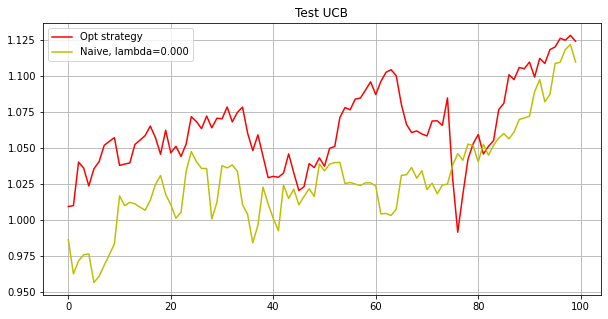

Phase 5
Testing...
./tmp2/res_phase05_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0147 0.0106 0.01   0.0203 0.0063 0.0116 0.0059 0.0095 0.0087 0.0107
 0.0108 0.0176 0.02   0.0058 0.0118 0.0081 0.0059 0.0119 0.015  0.0059
 0.0084 0.0115 0.0088 0.0136 0.0078 0.005  0.0125 0.0077 0.0083 0.0114
 0.0117 0.0124 0.0117 0.0126 0.0062 0.008  0.0105 0.0103 0.0105 0.0115
 0.0091 0.0081 0.0136 0.0099 0.0135 0.0076 0.009  0.0117 0.0004 0.0061
 0.0114 0.01   0.009  0.0093 0.0086 0.0121 0.0085 0.0097 0.0101 0.0086
 0.0109 0.0105 0.008  0.0129 0.0104 0.0091 0.01   0.009  0.0114 0.0114
 0.012  0.0086 0.0078 0.008  0.0085 0.0088 0.0107 0.007  0.0092 0.0099
 0.0103 0.0082 0.0109 0.0116 0.011  0.0082 0.0111 0.007  0.0114 0.0114
 0.0102 0.0104 0.0086 0.0099 0.0102 0.0126 0.0058 0.0086 0.0116 0.0089]
0.20156537666178018
[-0.      0.0154  0.     -0.      0.      0.0197  0.0032  0.0205  0.0076
  0.00

[ 0.0048  0.0216 -0.      0.0093 -0.      0.0337  0.      0.0169 -0.
  0.0206  0.0239  0.0144  0.0153 -0.     -0.      0.0027 -0.      0.0374
 -0.     -0.     -0.      0.0094 -0.      0.0275  0.0019 -0.     -0.
 -0.     -0.      0.0013  0.0264  0.0185  0.0215  0.0215 -0.     -0.
  0.0007  0.0069  0.0007  0.0073  0.0063 -0.      0.05    0.0129 -0.
  0.0064  0.     -0.     -0.     -0.      0.0074 -0.      0.0021  0.0141
 -0.      0.0019  0.0049  0.0076  0.028  -0.      0.0065 -0.      0.0058
  0.0499  0.0057  0.0003  0.0144  0.0155  0.0159  0.0184  0.0271  0.0033
  0.     -0.      0.0234 -0.      0.0228 -0.      0.0208  0.0102  0.0067
  0.      0.0005  0.0311  0.0402  0.      0.0276 -0.      0.031   0.0315
  0.0169  0.0059 -0.      0.0127  0.019   0.0134 -0.     -0.      0.0287
  0.0088]
0.00012164887309310656
[ 0.0048  0.0216 -0.      0.0093 -0.      0.0337  0.      0.0169 -0.
  0.0206  0.0239  0.0144  0.0153 -0.     -0.      0.0027 -0.      0.0374
 -0.     -0.     -0.      0.0094 -0.  

[-0.      0.0227 -0.     -0.     -0.      0.0367 -0.      0.013  -0.
  0.0272  0.0257  0.0096  0.0085 -0.      0.      0.      0.      0.0409
  0.      0.009   0.      0.0099  0.      0.0317  0.004   0.0002  0.001
  0.      0.      0.      0.0267  0.0131  0.0156  0.0138  0.      0.
  0.      0.0059  0.0007  0.0091  0.0069  0.      0.0545  0.0126  0.
  0.0072  0.0001  0.      0.0069  0.      0.0093  0.      0.0041  0.0156
  0.      0.0025  0.0045  0.006   0.0292  0.      0.0034  0.      0.0048
  0.0554  0.      0.      0.0143  0.0139  0.0182  0.0186  0.0269  0.0006
 -0.      0.      0.0229  0.0002  0.0241 -0.      0.0248  0.0096  0.0053
  0.0006 -0.      0.0341  0.0412  0.      0.0296  0.      0.0336  0.0341
  0.0172  0.0043 -0.      0.0123  0.0196  0.0093  0.      0.      0.0291
  0.0074]
4.538622366150935e-05
[ 0.      0.0233 -0.      0.     -0.      0.038  -0.      0.012   0.
  0.0305  0.0264  0.0046  0.007   0.     -0.     -0.      0.      0.0424
 -0.      0.0099 -0.      0.0076  0.

[-0.      0.0243  0.0003  0.0013  0.      0.0411 -0.      0.0088 -0.
  0.0317  0.0284  0.0013  0.0018 -0.     -0.     -0.      0.      0.0461
 -0.      0.0229  0.      0.0096 -0.      0.0331  0.0022  0.      0.0055
 -0.      0.      0.      0.0309  0.0085  0.0202  0.0015 -0.      0.
  0.      0.0036  0.0025  0.009   0.0068 -0.      0.0568  0.0123 -0.
  0.0043  0.0044 -0.     -0.     -0.      0.0081 -0.      0.0033  0.0169
 -0.      0.0031  0.001   0.0054  0.0268 -0.     -0.      0.0024  0.0022
  0.0634  0.0003  0.      0.0144  0.0106  0.0216  0.015   0.026  -0.
 -0.     -0.      0.0259 -0.      0.026   0.      0.023   0.0116  0.0018
 -0.     -0.      0.0386  0.0426 -0.      0.0326 -0.      0.0374  0.038
  0.0178  0.0015  0.      0.012   0.0208  0.0051 -0.     -0.      0.0225
  0.0031]
0.00036024381447938227
[ 0.      0.0243  0.0009  0.0003  0.      0.0414  0.0009  0.0074 -0.
  0.033   0.0286 -0.      0.0046 -0.     -0.      0.0011 -0.      0.0465
  0.      0.024  -0.      0.0099 -0.   

[ 0.      0.0242  0.001   0.0003  0.      0.0414  0.0009  0.0074 -0.
  0.033   0.0286 -0.      0.0046  0.     -0.      0.0011 -0.      0.0465
 -0.      0.024  -0.      0.0099 -0.      0.0336  0.0019 -0.      0.0055
 -0.     -0.      0.      0.0311  0.0077  0.0184  0.     -0.      0.
 -0.      0.003   0.003   0.0082  0.0062 -0.      0.0558  0.0122 -0.
  0.0044  0.0061 -0.      0.003   0.001   0.0079 -0.      0.0028  0.0172
 -0.      0.001  -0.      0.0049  0.0265 -0.     -0.      0.0024  0.0027
  0.0641 -0.      0.0018  0.0142  0.0105  0.0218  0.0142  0.0252 -0.
 -0.      0.      0.0271 -0.      0.0261 -0.      0.0231  0.011   0.0015
 -0.      0.      0.0389  0.0414  0.      0.0328 -0.      0.0376  0.0383
  0.0178  0.0013  0.      0.0118  0.0207  0.0036  0.      0.      0.0231
  0.0029]
0.0003637537383285704
[ 0.      0.0242  0.001   0.0003  0.      0.0414  0.0009  0.0074  0.
  0.033   0.0286  0.      0.0046  0.      0.      0.0011  0.      0.0465
  0.      0.024   0.      0.0099  0.   

[-0.      0.0246  0.0008  0.     -0.      0.0421 -0.      0.0038 -0.
  0.0332  0.0292  0.0002  0.003   0.      0.      0.      0.      0.0474
  0.0005  0.0233  0.      0.0098  0.      0.0329  0.0022 -0.      0.006
 -0.     -0.      0.      0.0316  0.0079  0.0193  0.0005 -0.     -0.
 -0.      0.0026  0.0029  0.0082  0.0061  0.      0.056   0.0121  0.
  0.0056  0.0041  0.      0.001   0.0003  0.0075  0.      0.0027  0.0173
  0.      0.0007  0.0001  0.0047  0.026   0.      0.      0.0017  0.0036
  0.0654  0.      0.0012  0.0142  0.011   0.0224  0.014   0.0244 -0.
  0.      0.0002  0.0285  0.      0.0264  0.      0.0238  0.0107  0.0014
  0.      0.      0.0396  0.0417  0.      0.0333  0.0005  0.0382  0.0389
  0.0179  0.0011 -0.      0.0117  0.0209  0.0031  0.      0.      0.0246
  0.0031]
0.018798908336198725
[-0.      0.0246  0.0008  0.     -0.      0.0421 -0.      0.0038 -0.
  0.0332  0.0292  0.0002  0.003   0.      0.      0.      0.      0.0474
  0.0005  0.0233  0.      0.0098  0.     

[-0.      0.0251 -0.     -0.     -0.      0.0436 -0.      0.0021  0.
  0.0337  0.0295  0.0007 -0.      0.     -0.      0.      0.      0.0491
  0.0026  0.0226 -0.      0.0096 -0.      0.0281  0.      0.      0.008
 -0.      0.      0.      0.0342  0.0071  0.0183  0.006   0.      0.
 -0.      0.0029  0.0025  0.0038  0.0044 -0.      0.0583  0.0119  0.
  0.0044  0.0037 -0.      0.0012 -0.      0.0053 -0.      0.0014  0.0187
 -0.      0.0003  0.0001  0.0045  0.0277 -0.      0.0015  0.0029  0.0021
  0.0681  0.      0.      0.0141  0.0117  0.0234  0.0131  0.0216 -0.
 -0.     -0.      0.0236 -0.      0.027   0.      0.0252  0.0109  0.
 -0.      0.0011  0.0411  0.0386 -0.      0.0343  0.      0.0395  0.0402
  0.018   0.0021 -0.      0.0115  0.021   0.0023 -0.     -0.      0.0309
  0.0033]
0.0002543189222995253
[-0.      0.0251  0.      0.      0.      0.0436  0.      0.0021  0.
  0.0337  0.0295  0.0007 -0.      0.     -0.      0.     -0.      0.0492
  0.0026  0.0226  0.      0.0096 -0.      0.

[ 0.      0.0255  0.0004  0.0011  0.      0.0448  0.      0.0002  0.
  0.033   0.0297  0.0001  0.0012 -0.      0.0001 -0.      0.      0.0507
 -0.      0.021  -0.      0.0084 -0.      0.0283  0.0001 -0.      0.0091
 -0.     -0.      0.      0.0354  0.0082  0.0146  0.0084 -0.      0.
  0.      0.002   0.0025  0.0026  0.0029 -0.      0.0594  0.0116  0.0001
  0.0041  0.0035 -0.      0.0006  0.      0.0051 -0.      0.0001  0.0175
 -0.      0.002  -0.      0.003   0.0263 -0.      0.      0.002   0.0028
  0.0706  0.      0.001   0.0139  0.0121  0.0242  0.0131  0.0212  0.
  0.     -0.      0.0212 -0.      0.0274  0.      0.0255  0.0092  0.
  0.0013  0.0006  0.0424  0.038  -0.      0.0351 -0.      0.0405  0.0413
  0.018   0.001  -0.      0.0112  0.021   0.0035  0.0032  0.      0.033
  0.0019]
0.01470201469546769
[ 0.      0.0256  0.0004  0.0011  0.      0.0448  0.      0.0002  0.
  0.033   0.0297  0.0001  0.0012 -0.      0.0001 -0.      0.      0.0507
 -0.      0.021   0.      0.0084 -0.      

[ 0.      0.0255  0.0004  0.0011 -0.      0.0449  0.0001  0.0002 -0.
  0.033   0.0297  0.0001  0.0012 -0.      0.0001 -0.     -0.      0.0507
 -0.      0.021   0.      0.0084  0.      0.0283  0.0001  0.      0.0091
 -0.     -0.      0.      0.0354  0.0082  0.0147  0.0084 -0.      0.
 -0.      0.002   0.0025  0.0025  0.0029 -0.      0.0594  0.0116  0.0001
  0.0041  0.0034 -0.      0.0006  0.      0.0051 -0.      0.0001  0.0175
 -0.      0.002   0.      0.003   0.0263 -0.     -0.      0.002   0.0028
  0.0706  0.      0.001   0.0139  0.0121  0.0242  0.0131  0.0212 -0.
 -0.     -0.      0.0212 -0.      0.0274 -0.      0.0255  0.0091 -0.
  0.0013  0.0006  0.0424  0.038  -0.      0.0351 -0.      0.0405  0.0413
  0.018   0.001   0.0001  0.0112  0.021   0.0035  0.0032  0.      0.033
  0.0019]
6.342996335773292e-05
[-0.      0.0255  0.0004  0.0011  0.      0.0449  0.0001  0.0002 -0.
  0.033   0.0297  0.0001  0.0012 -0.      0.0001 -0.     -0.      0.0507
 -0.      0.021   0.      0.0084  0.    

[ 0.      0.0261  0.      0.0015  0.      0.0463  0.     -0.      0.
  0.0317  0.0303 -0.      0.     -0.      0.     -0.      0.      0.0523
  0.      0.0195 -0.      0.0061 -0.      0.0308  0.      0.      0.0062
 -0.      0.      0.0011  0.0356  0.0059  0.016   0.019   0.     -0.
  0.002   0.0006  0.0034  0.0032  0.0033 -0.      0.0608  0.0115 -0.
  0.0025 -0.      0.0002  0.0052  0.0023  0.0036 -0.      0.0005  0.017
 -0.      0.0008  0.0028  0.0027  0.0253 -0.     -0.     -0.     -0.
  0.0732  0.     -0.      0.0139  0.0102  0.0252  0.0106  0.0193  0.
  0.      0.      0.0149 -0.      0.028   0.      0.0267  0.0087 -0.
  0.0043  0.0014  0.0438  0.0361  0.      0.036  -0.      0.0417  0.0425
  0.0181 -0.      0.0001  0.0111  0.0212  0.0012  0.0026 -0.      0.0324
  0.0002]
0.0002458516896580011
[-0.      0.0261 -0.      0.0015 -0.      0.0463  0.     -0.      0.
  0.0317  0.0303  0.     -0.     -0.     -0.     -0.     -0.      0.0523
 -0.      0.0195 -0.      0.0061  0.      0.0308

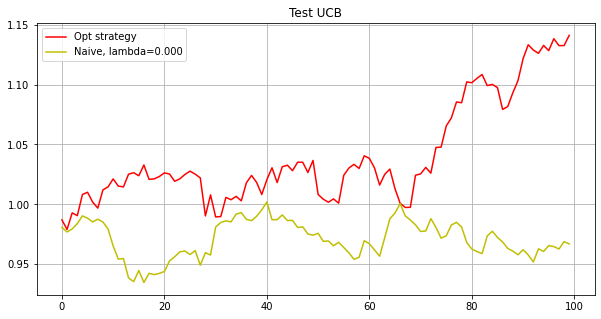

Phase 6
Testing...
./tmp2/res_phase06_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0076 0.0104 0.0092 0.0088 0.0121 0.011  0.0099 0.0113 0.0119 0.0094
 0.0096 0.0098 0.0106 0.0097 0.0111 0.013  0.0055 0.0089 0.0114 0.0093
 0.0101 0.0096 0.0094 0.0105 0.0083 0.0106 0.0096 0.0112 0.0107 0.0095
 0.0093 0.0107 0.0101 0.01   0.0108 0.0107 0.0119 0.013  0.0111 0.0104
 0.0109 0.0097 0.0094 0.0096 0.0096 0.0096 0.01   0.0085 0.0116 0.0094
 0.0102 0.009  0.0096 0.0099 0.0096 0.0093 0.0096 0.0091 0.0105 0.0097
 0.0114 0.0094 0.0095 0.0126 0.0097 0.0103 0.0095 0.0095 0.0102 0.0115
 0.0111 0.0096 0.0113 0.0117 0.0103 0.0081 0.0093 0.0104 0.0094 0.0098
 0.0091 0.0088 0.0112 0.0093 0.0101 0.0104 0.0089 0.0107 0.0084 0.007
 0.011  0.0102 0.01   0.0096 0.0094 0.01   0.0088 0.0095 0.0101 0.0099]
0.084698746739898
[0.0015 0.0127 0.     0.0114 0.0196 0.0121 0.0091 0.0141 0.0141 0.0082
 0.0059 0.0

[ 0.      0.0186 -0.      0.0212  0.039   0.001   0.0037  0.0201  0.0246
  0.0053  0.     -0.      0.0209  0.0101  0.0249  0.0175  0.      0.0018
  0.0284  0.004   0.      0.008   0.0061  0.02   -0.      0.0112  0.0059
  0.0093  0.021   0.      0.      0.0125  0.0163  0.      0.0197 -0.
 -0.      0.0225  0.0131  0.0046  0.0098  0.0087  0.0075  0.0071  0.0157
  0.0088  0.0131  0.0017  0.0199  0.0072  0.0111  0.0042  0.0034  0.0128
  0.006   0.0051  0.0116  0.0091  0.0082  0.0087  0.0028 -0.      0.0067
  0.0148  0.0088  0.0112  0.008   0.0064  0.0138  0.0203  0.0069  0.0082
  0.0197  0.034   0.0214  0.0111  0.0081  0.0089  0.0066  0.011   0.002
  0.0131  0.0177  0.0046  0.0136  0.0178  0.0004  0.0217 -0.     -0.
  0.0091  0.0098  0.0131  0.0078  0.0026  0.0128  0.0051  0.0034  0.0106
  0.0151]
6.705306212639117e-05
[-0.      0.0188  0.0009  0.022   0.0401  0.0009  0.0029  0.021   0.024
  0.0051  0.      0.      0.0213  0.0101  0.0252  0.016   0.      0.0014
  0.0285  0.0037  0.      0.0

[ 0.      0.0201  0.0028  0.0109  0.0446  0.      0.0051  0.0236  0.0221
  0.0042  0.     -0.      0.0227  0.01    0.028   0.0169  0.     -0.
  0.0275  0.0026  0.      0.0074  0.0052  0.0219  0.0024  0.0103  0.0062
  0.0094  0.0231  0.0014  0.0029  0.0137  0.0195  0.0023  0.0208  0.
  0.      0.0224  0.0094  0.0034  0.011   0.0077  0.0072  0.006   0.0158
  0.0078  0.0138 -0.      0.0262  0.0064  0.0143  0.0026  0.0032  0.0131
  0.0055  0.004   0.0117  0.0088  0.0066  0.008   0.0019 -0.      0.0058
  0.0108  0.0084  0.0093  0.0075  0.0039  0.0153  0.014   0.0093  0.0079
  0.0201  0.0386  0.024   0.0136  0.0069  0.007   0.0057  0.0111  0.0003
  0.0107  0.0167  0.0034  0.0155  0.0192  0.      0.0241  0.0013  0.0038
  0.0074  0.0083  0.0135  0.0072  0.0022  0.0132  0.0024  0.      0.011
  0.0165]
0.0003002493828282843
[ 0.      0.0201  0.0028  0.0109  0.0446  0.      0.0051  0.0236  0.0221
  0.0042  0.     -0.      0.0227  0.01    0.028   0.0169  0.      0.
  0.0275  0.0026  0.      0.0074

[ 0.      0.0206  0.0017  0.0117  0.0468  0.      0.0047  0.0235  0.0218
  0.0038 -0.     -0.      0.0235  0.01    0.0297  0.0144  0.     -0.
  0.0269  0.0021  0.0006  0.0072  0.0049  0.0226  0.003   0.0104  0.0059
  0.0108  0.0239  0.0014  0.0028  0.0137  0.0182  0.0023  0.0216  0.
  0.0022  0.0242  0.0094  0.0022  0.0107  0.0076  0.0073  0.0058  0.0161
  0.0076  0.014   0.0003  0.0249  0.0061  0.0131  0.0021  0.0038  0.0132
  0.005   0.0036  0.012   0.0079  0.0063  0.0079  0.0015 -0.      0.0054
  0.0111  0.0083  0.0096  0.0072  0.0034  0.0159  0.0119  0.0104  0.0079
  0.0205  0.0404  0.0252  0.0154  0.0076  0.0068  0.0053  0.0111  0.
  0.0112  0.0155  0.0029  0.0163  0.0197  0.0003  0.0248 -0.      0.0004
  0.0061  0.0085  0.0137  0.007   0.0022  0.0134  0.0018  0.      0.0109
  0.0168]
9.963355809077914e-05
[ 0.      0.0206  0.0017  0.0117  0.0468  0.      0.0047  0.0235  0.0218
  0.0038 -0.     -0.      0.0235  0.01    0.0297  0.0144  0.     -0.
  0.0269  0.0021  0.0006  0.0072  0

[ 0.      0.0209  0.0012  0.0117  0.0477  0.0003  0.0049  0.024   0.0214
  0.0037  0.0002  0.      0.0238  0.01    0.0299  0.0145  0.      0.
  0.0273  0.0019 -0.      0.0071  0.0048  0.0229  0.0036  0.0106  0.0057
  0.0101  0.0243  0.0003  0.0025  0.0136  0.0183  0.0019  0.022  -0.
  0.0014  0.0243  0.0085  0.0017  0.0109  0.0076  0.0073  0.0058  0.016
  0.0076  0.014   0.0002  0.0244  0.006   0.0132  0.0019  0.0041  0.0133
  0.0048  0.0034  0.0121  0.0077  0.0057  0.0078  0.0014  0.      0.0053
  0.0107  0.0083  0.0092  0.0072  0.0032  0.0158  0.0114  0.0104  0.0078
  0.0211  0.0412  0.0258  0.0153  0.0085  0.0066  0.0052  0.0111  0.
  0.0116  0.0158  0.0027  0.0165  0.02    0.      0.0252 -0.      0.0009
  0.0062  0.0085  0.0138  0.0069  0.0022  0.0135  0.0016 -0.      0.011
  0.0171]
6.771157603061793e-05
[ 0.      0.0209  0.0012  0.0117  0.0477  0.0003  0.0049  0.024   0.0214
  0.0037  0.0002  0.      0.0238  0.01    0.0299  0.0145  0.      0.
  0.0273  0.0019 -0.      0.0071  0.0

[ 0.      0.022  -0.      0.0136  0.0511  0.      0.0054  0.0246  0.0272
  0.0032  0.      0.      0.0251  0.01    0.0301  0.0128 -0.      0.
  0.0267  0.0012  0.      0.0069  0.0043  0.0236  0.0021  0.0108  0.0053
  0.0079  0.0257  0.0003  0.0025  0.0133  0.0172  0.0041  0.0244 -0.
 -0.      0.0239  0.0089  0.0003  0.0115  0.0075  0.0078  0.0055  0.015
  0.0081  0.0142  0.0011  0.0232  0.0058  0.0134  0.0011  0.0025  0.0136
  0.0045  0.0029  0.0122  0.0065  0.0034  0.0073  0.0046 -0.      0.005
  0.0084  0.0081  0.0077  0.0069  0.0026  0.0165  0.0102  0.0107  0.0075
  0.0211  0.044   0.0273  0.0122  0.0087  0.0061  0.0047  0.0103  0.
  0.01    0.0178  0.0021  0.0161  0.0209 -0.      0.0266 -0.      0.0005
  0.0055  0.0087  0.0142  0.0067  0.0021  0.0139  0.0014  0.0008  0.0104
  0.0181]
0.0002520158544245514
[ 0.      0.022   0.      0.0136  0.0511  0.      0.0054  0.0246  0.0272
  0.0032  0.      0.      0.0251  0.01    0.0301  0.0128  0.      0.
  0.0267  0.0012  0.      0.0069  0.0

[ 0.      0.0219  0.      0.0136  0.0511  0.      0.0054  0.0246  0.0272
  0.0032 -0.     -0.      0.0251  0.01    0.0301  0.0128 -0.     -0.
  0.0267  0.0012 -0.      0.0069  0.0043  0.0236  0.0021  0.0108  0.0053
  0.0079  0.0257  0.0003  0.0025  0.0133  0.0172  0.0041  0.0244 -0.
 -0.      0.0239  0.0089  0.0003  0.0115  0.0075  0.0078  0.0055  0.015
  0.0081  0.0142  0.0011  0.0232  0.0058  0.0134  0.0011  0.0025  0.0136
  0.0045  0.0029  0.0122  0.0065  0.0034  0.0073  0.0046  0.      0.005
  0.0084  0.0081  0.0077  0.0069  0.0026  0.0165  0.0102  0.0107  0.0075
  0.0211  0.044   0.0273  0.0122  0.0087  0.0061  0.0047  0.0103  0.
  0.01    0.0178  0.0021  0.0161  0.0209 -0.      0.0266  0.      0.0005
  0.0055  0.0087  0.0142  0.0067  0.0021  0.0139  0.0014  0.0008  0.0104
  0.0181]
2.751853567283482e-05
[ 0.      0.0219  0.      0.0136  0.0511  0.      0.0054  0.0246  0.0272
  0.0032 -0.     -0.      0.0251  0.01    0.0301  0.0128 -0.     -0.
  0.0267  0.0012 -0.      0.0069  0.0

[-0.      0.0219 -0.      0.0136  0.0511  0.      0.0054  0.0246  0.0272
  0.0032  0.      0.      0.0252  0.01    0.0301  0.0128 -0.     -0.
  0.0267  0.0012 -0.      0.0069  0.0043  0.0236  0.0021  0.0108  0.0053
  0.0079  0.0257  0.0004  0.0025  0.0133  0.0172  0.0041  0.0244 -0.
 -0.      0.0239  0.0089  0.0003  0.0115  0.0075  0.0078  0.0055  0.015
  0.0081  0.0142  0.0011  0.0232  0.0058  0.0134  0.0011  0.0025  0.0136
  0.0045  0.0029  0.0122  0.0065  0.0034  0.0073  0.0046  0.      0.005
  0.0084  0.0081  0.0077  0.0069  0.0026  0.0165  0.0102  0.0107  0.0075
  0.0211  0.044   0.0273  0.0122  0.0087  0.0061  0.0047  0.0103  0.
  0.01    0.0178  0.0021  0.0161  0.0209  0.      0.0266 -0.      0.0005
  0.0055  0.0087  0.0142  0.0067  0.0021  0.0139  0.0014  0.0008  0.0104
  0.0181]
4.260374808235588e-05
[-0.      0.0219 -0.      0.0136  0.0511 -0.      0.0054  0.0246  0.0272
  0.0032 -0.     -0.      0.0252  0.01    0.0301  0.0128  0.     -0.
  0.0267  0.0012 -0.      0.0069  0.0

[-0.      0.0225 -0.      0.015   0.0533  0.      0.0047  0.0254  0.0268
  0.0028 -0.      0.0033  0.026   0.0101  0.0305  0.0128  0.      0.
  0.0265  0.0008  0.      0.0068  0.004   0.0244  0.0018  0.0106  0.005
  0.007   0.0265 -0.      0.0044  0.013   0.0182  0.0049  0.0253 -0.
  0.      0.0239  0.0069  0.0001  0.0107  0.0074  0.0076  0.0053  0.0151
  0.008   0.0146  0.0009  0.0221  0.0056  0.0137  0.0005  0.0002  0.0138
  0.0042  0.0025  0.0121  0.0068  0.0024  0.0072  0.0048 -0.      0.0048
  0.0069  0.008   0.0074  0.0068  0.0022  0.0171  0.0095  0.0115  0.0075
  0.0209  0.0459  0.028   0.0118  0.0081  0.006   0.0043  0.0103  0.
  0.01    0.0184  0.0017  0.0161  0.0215 -0.      0.0274  0.      0.
  0.0045  0.0086  0.0144  0.0065  0.0014  0.0141  0.0003  0.      0.0102
  0.0185]
0.00010016867969059148
[ 0.      0.0225  0.      0.015   0.0533  0.      0.0047  0.0254  0.0268
  0.0028 -0.      0.0033  0.026   0.01    0.0305  0.0128  0.      0.
  0.0265  0.0008  0.      0.0068  0.004

[ 0.      0.0226 -0.      0.0151  0.0534  0.      0.0047  0.0254  0.0267
  0.0028 -0.      0.0033  0.026   0.01    0.0305  0.0128  0.      0.
  0.0265  0.0008  0.      0.0068  0.004   0.0244  0.0018  0.0106  0.005
  0.007   0.0265 -0.      0.0045  0.013   0.0182  0.0049  0.0253 -0.
 -0.      0.0239  0.0069  0.0001  0.0107  0.0075  0.0076  0.0053  0.0151
  0.008   0.0146  0.0009  0.0221  0.0056  0.0137  0.0005  0.0002  0.0138
  0.0042  0.0025  0.0121  0.0068  0.0024  0.0073  0.0048 -0.      0.0048
  0.0069  0.008   0.0074  0.0068  0.0022  0.0171  0.0095  0.0115  0.0075
  0.0209  0.0459  0.028   0.0118  0.0081  0.006   0.0043  0.0103  0.
  0.01    0.0184  0.0017  0.0161  0.0215  0.      0.0275  0.      0.
  0.0045  0.0086  0.0144  0.0065  0.0013  0.0141  0.0003 -0.      0.0102
  0.0185]
7.061987467958458e-05
[ 0.      0.0226 -0.      0.0151  0.0534  0.      0.0047  0.0254  0.0267
  0.0028 -0.      0.0033  0.026   0.01    0.0305  0.0128  0.      0.
  0.0265  0.0008  0.      0.0068  0.004 

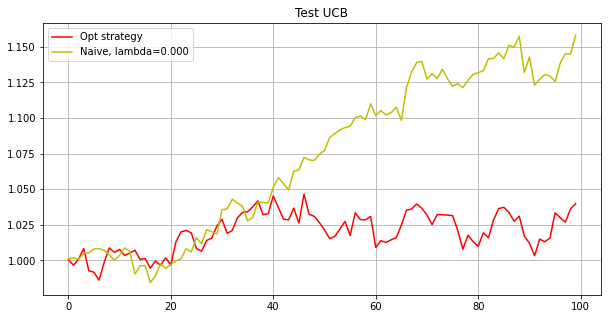

Phase 7
Testing...
./tmp2/res_phase07_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0107 0.0102 0.011  0.0053 0.0157 0.0089 0.0127 0.0129 0.0093 0.011
 0.012  0.0149 0.0085 0.0122 0.0085 0.0133 0.0123 0.0108 0.0114 0.0121
 0.0147 0.0107 0.0098 0.0074 0.0099 0.0141 0.0122 0.0062 0.0107 0.0121
 0.0044 0.01   0.01   0.0106 0.011  0.0095 0.0121 0.0075 0.0104 0.0113
 0.0102 0.0087 0.0063 0.0123 0.0098 0.01   0.0102 0.0106 0.0099 0.0065
 0.0079 0.0105 0.0067 0.0091 0.0081 0.0094 0.0088 0.0118 0.0131 0.0102
 0.0106 0.0088 0.0085 0.0103 0.0101 0.0104 0.0085 0.0094 0.0084 0.0099
 0.0094 0.0082 0.01   0.0083 0.0081 0.0062 0.0104 0.0097 0.0096 0.0096
 0.0086 0.0076 0.0095 0.0069 0.0094 0.0103 0.0117 0.0111 0.0101 0.0065
 0.0127 0.0071 0.0097 0.0134 0.015  0.0086 0.011  0.0117 0.0102 0.0067]
0.16084507941739898
[0.0106 0.0102 0.011  0.0053 0.0157 0.0089 0.0127 0.0129 0.0093 0.011
 0.012  0.

[0.0106 0.0102 0.0111 0.0046 0.0164 0.0092 0.0131 0.013  0.0091 0.0111
 0.0123 0.0156 0.0089 0.0125 0.0081 0.0138 0.0126 0.0109 0.0116 0.0123
 0.0144 0.0107 0.0097 0.0076 0.0104 0.0147 0.0109 0.0057 0.0109 0.0107
 0.0041 0.01   0.01   0.0106 0.0106 0.0095 0.0119 0.0076 0.0105 0.0112
 0.0101 0.0086 0.0063 0.012  0.0097 0.01   0.0103 0.0106 0.0102 0.0064
 0.0075 0.0101 0.0075 0.0095 0.0078 0.0093 0.0087 0.0118 0.013  0.0104
 0.0108 0.0087 0.0087 0.0104 0.01   0.0105 0.0084 0.0092 0.0081 0.0099
 0.0099 0.0083 0.01   0.0088 0.0078 0.0061 0.0105 0.0097 0.0092 0.0095
 0.0084 0.0072 0.0095 0.0062 0.0092 0.0102 0.012  0.0112 0.0101 0.0063
 0.0124 0.007  0.0097 0.0135 0.0159 0.0082 0.0117 0.0119 0.0102 0.0064]
2.9774208993771714e-05
[0.0106 0.0102 0.0111 0.0046 0.0164 0.0092 0.0131 0.013  0.0091 0.0111
 0.0123 0.0156 0.0089 0.0125 0.0081 0.0138 0.0126 0.0109 0.0116 0.0123
 0.0144 0.0107 0.0097 0.0076 0.0104 0.0147 0.0109 0.0057 0.0109 0.0107
 0.0041 0.01   0.01   0.0106 0.0106 0.0095 0.0119 0.0

[0.0109 0.0103 0.0114 0.0029 0.0184 0.0091 0.0134 0.0126 0.0087 0.0114
 0.0129 0.0173 0.0092 0.0132 0.0075 0.0146 0.0118 0.0112 0.012  0.0115
 0.0134 0.0111 0.0096 0.008  0.0113 0.0162 0.0093 0.005  0.012  0.0116
 0.0025 0.01   0.01   0.0108 0.0097 0.0088 0.011  0.0089 0.0103 0.0117
 0.0099 0.0084 0.006  0.0112 0.0096 0.01   0.0106 0.0108 0.0092 0.0053
 0.0068 0.0104 0.0084 0.0106 0.0072 0.009  0.0082 0.0122 0.0141 0.009
 0.0115 0.0082 0.0084 0.0108 0.01   0.0106 0.0083 0.009  0.0075 0.0103
 0.0097 0.0091 0.01   0.0106 0.007  0.0059 0.0106 0.0093 0.0086 0.0093
 0.0077 0.007  0.0093 0.0047 0.0092 0.01   0.0128 0.0116 0.0101 0.0067
 0.0121 0.0053 0.0095 0.014  0.0173 0.008  0.0125 0.0124 0.0102 0.0061]
0.00015567604902934741
[0.0109 0.0103 0.0114 0.0029 0.0184 0.0091 0.0134 0.0126 0.0087 0.0114
 0.0129 0.0172 0.0092 0.0132 0.0075 0.0146 0.0118 0.0112 0.012  0.0116
 0.0134 0.0111 0.0096 0.008  0.0113 0.0162 0.0093 0.005  0.012  0.0117
 0.0025 0.01   0.01   0.0108 0.0097 0.0088 0.011  0.00

[ 0.0095  0.0106  0.0127 -0.      0.0258  0.0017  0.0158  0.0138  0.0062
  0.0128  0.0114  0.0236  0.0057  0.0162  0.0053  0.0173  0.0052  0.0124
  0.014   0.0143  0.0097  0.0119  0.0077  0.0096  0.0098  0.0216  0.0043
  0.0027  0.0121  0.0141 -0.      0.0103  0.0102  0.0117  0.0069  0.005
  0.0095  0.0077  0.0091  0.0128  0.0089  0.0064  0.0048  0.0085  0.0094
  0.0105  0.0121  0.0117  0.0088  0.0065  0.0044  0.0113  0.0091  0.0095
  0.0076  0.0084  0.007   0.013   0.0155  0.0082  0.0154  0.0083  0.0096
  0.0043  0.0102  0.0116  0.0091  0.0082  0.0057  0.0098  0.0115  0.0087
  0.0102  0.0135  0.0048  0.0032  0.0114  0.0097  0.0068  0.009   0.0066
  0.0092  0.0092  0.0102  0.0089  0.0088  0.0156  0.0132  0.0103  0.0073
  0.0138  0.0053  0.0096  0.0145  0.0203  0.0078  0.0153  0.0147  0.0105
  0.0056]
4.186123635757137e-05
[ 0.0095  0.0106  0.0127 -0.      0.0258  0.0017  0.0158  0.0138  0.0062
  0.0128  0.0114  0.0236  0.0057  0.0162  0.0053  0.0173  0.0052  0.0124
  0.014   0.0143  0.

[0.0095 0.0106 0.0128 0.     0.0258 0.0017 0.0158 0.0138 0.0062 0.0128
 0.0114 0.0236 0.0057 0.0162 0.0053 0.0173 0.0052 0.0124 0.014  0.0143
 0.0098 0.0119 0.0077 0.0096 0.0098 0.0216 0.0043 0.0027 0.0121 0.0141
 0.     0.0103 0.0102 0.0117 0.0069 0.005  0.0095 0.0077 0.0091 0.0128
 0.0089 0.0064 0.0048 0.0085 0.0094 0.0105 0.0121 0.0117 0.0088 0.0065
 0.0044 0.0113 0.0091 0.0095 0.0076 0.0084 0.007  0.013  0.0155 0.0082
 0.0154 0.0083 0.0096 0.0043 0.0102 0.0116 0.0091 0.0082 0.0057 0.0098
 0.0115 0.0087 0.0102 0.0135 0.0048 0.0032 0.0114 0.0097 0.0068 0.009
 0.0066 0.0092 0.0092 0.0102 0.0089 0.0087 0.0156 0.0132 0.0103 0.0073
 0.0138 0.0053 0.0096 0.0145 0.0203 0.0078 0.0153 0.0147 0.0105 0.0055]
7.548017886718667e-06
[0.0095 0.0106 0.0128 0.     0.0258 0.0017 0.0157 0.0138 0.0062 0.0128
 0.0114 0.0236 0.0057 0.0162 0.0053 0.0173 0.0052 0.0124 0.014  0.0143
 0.0098 0.0119 0.0077 0.0096 0.0098 0.0216 0.0043 0.0027 0.0121 0.0141
 0.     0.0103 0.0102 0.0117 0.0069 0.005  0.0095 0.007

[0.0095 0.0107 0.0128 0.     0.0258 0.0017 0.0157 0.0138 0.0062 0.0128
 0.0114 0.0236 0.0057 0.0162 0.0053 0.0173 0.0052 0.0124 0.014  0.0143
 0.0098 0.0119 0.0077 0.0096 0.0098 0.0216 0.0043 0.0027 0.0121 0.0141
 0.     0.0103 0.0102 0.0118 0.0069 0.005  0.0095 0.0077 0.0091 0.0128
 0.0089 0.0064 0.0048 0.0085 0.0094 0.0105 0.0121 0.0117 0.0088 0.0065
 0.0044 0.0113 0.0091 0.0095 0.0076 0.0084 0.007  0.013  0.0155 0.0082
 0.0154 0.0083 0.0096 0.0043 0.0102 0.0116 0.0091 0.0082 0.0057 0.0098
 0.0115 0.0087 0.0102 0.0134 0.0047 0.0031 0.0114 0.0097 0.0068 0.009
 0.0066 0.0092 0.0092 0.0101 0.0089 0.0087 0.0156 0.0132 0.0103 0.0073
 0.0138 0.0053 0.0096 0.0145 0.0203 0.0078 0.0153 0.0147 0.0105 0.0055]
3.739214897817238e-05
[0.0095 0.0107 0.0128 0.     0.0258 0.0017 0.0157 0.0138 0.0062 0.0128
 0.0114 0.0236 0.0057 0.0162 0.0053 0.0173 0.0052 0.0124 0.014  0.0143
 0.0098 0.0119 0.0077 0.0096 0.0098 0.0216 0.0043 0.0027 0.0121 0.0141
 0.     0.0103 0.0102 0.0118 0.0069 0.005  0.0095 0.007

[0.0095 0.0107 0.0128 0.     0.0258 0.0017 0.0157 0.0138 0.0062 0.0128
 0.0114 0.0236 0.0057 0.0162 0.0053 0.0173 0.0052 0.0124 0.014  0.0143
 0.0098 0.0118 0.0077 0.0096 0.0098 0.0216 0.0043 0.0027 0.0121 0.0141
 0.     0.0103 0.0102 0.0118 0.0069 0.005  0.0095 0.0077 0.0091 0.0128
 0.0089 0.0064 0.0048 0.0085 0.0094 0.0105 0.0121 0.0117 0.0088 0.0065
 0.0044 0.0113 0.0091 0.0095 0.0076 0.0084 0.007  0.013  0.0155 0.0082
 0.0154 0.0083 0.0096 0.0043 0.0102 0.0116 0.0091 0.0082 0.0057 0.0098
 0.0115 0.0087 0.0102 0.0134 0.0047 0.0032 0.0114 0.0097 0.0068 0.009
 0.0066 0.0092 0.0092 0.0101 0.0089 0.0087 0.0156 0.0132 0.0103 0.0073
 0.0138 0.0053 0.0096 0.0145 0.0203 0.0078 0.0153 0.0147 0.0105 0.0055]
1.6390304006119646e-05
[0.0096 0.0107 0.0128 0.     0.0258 0.0017 0.0157 0.0138 0.0062 0.0128
 0.0114 0.0236 0.0057 0.0162 0.0053 0.0173 0.0052 0.0124 0.014  0.0143
 0.0098 0.0118 0.0077 0.0096 0.0098 0.0216 0.0043 0.0027 0.0121 0.0141
 0.     0.0103 0.0102 0.0118 0.0069 0.005  0.0095 0.00

[0.0096 0.0106 0.0128 0.     0.0257 0.0017 0.0157 0.0138 0.0062 0.0128
 0.0114 0.0236 0.0057 0.0162 0.0053 0.0173 0.0052 0.0124 0.014  0.0143
 0.0098 0.0119 0.0077 0.0096 0.0098 0.0216 0.0043 0.0027 0.0121 0.0141
 0.     0.0103 0.0102 0.0118 0.0069 0.005  0.0095 0.0077 0.0091 0.0128
 0.0089 0.0064 0.0048 0.0085 0.0094 0.0105 0.0121 0.0117 0.0088 0.0065
 0.0044 0.0113 0.0091 0.0095 0.0076 0.0084 0.007  0.0129 0.0155 0.0082
 0.0154 0.0083 0.0096 0.0043 0.0101 0.0116 0.0091 0.0082 0.0057 0.0098
 0.0115 0.0087 0.0102 0.0134 0.0048 0.0032 0.0114 0.0097 0.0068 0.009
 0.0066 0.0092 0.0092 0.0101 0.0089 0.0087 0.0156 0.0132 0.0104 0.0073
 0.0138 0.0052 0.0096 0.0145 0.0203 0.0078 0.0153 0.0147 0.0105 0.0055]
2.212074247960718e-06
[0.0096 0.0106 0.0128 0.     0.0257 0.0017 0.0157 0.0138 0.0062 0.0128
 0.0114 0.0236 0.0057 0.0162 0.0053 0.0173 0.0052 0.0124 0.014  0.0143
 0.0098 0.0119 0.0077 0.0096 0.0098 0.0216 0.0043 0.0027 0.0121 0.0141
 0.     0.0103 0.0102 0.0118 0.0069 0.005  0.0095 0.007

[ 0.0096  0.0106  0.0128 -0.      0.0257  0.0017  0.0157  0.0138  0.0062
  0.0128  0.0114  0.0237  0.0057  0.0162  0.0053  0.0173  0.0052  0.0124
  0.014   0.0143  0.0098  0.0119  0.0077  0.0096  0.0098  0.0216  0.0043
  0.0027  0.0121  0.0141 -0.      0.0103  0.0102  0.0118  0.0069  0.005
  0.0095  0.0077  0.0091  0.0128  0.0089  0.0064  0.0048  0.0085  0.0094
  0.0105  0.0121  0.0117  0.0088  0.0065  0.0044  0.0113  0.0091  0.0095
  0.0076  0.0084  0.007   0.0129  0.0155  0.0082  0.0154  0.0083  0.0096
  0.0043  0.0101  0.0116  0.0091  0.0082  0.0057  0.0098  0.0115  0.0087
  0.0102  0.0134  0.0048  0.0032  0.0114  0.0097  0.0068  0.009   0.0066
  0.0092  0.0092  0.0101  0.0088  0.0087  0.0156  0.0132  0.0104  0.0073
  0.0138  0.0052  0.0096  0.0145  0.0203  0.0078  0.0153  0.0147  0.0105
  0.0055]
8.703332915791667e-05
[ 0.0096  0.0106  0.0128 -0.      0.0257  0.0017  0.0157  0.0138  0.0062
  0.0128  0.0114  0.0237  0.0057  0.0162  0.0053  0.0173  0.0052  0.0124
  0.014   0.0143  0.

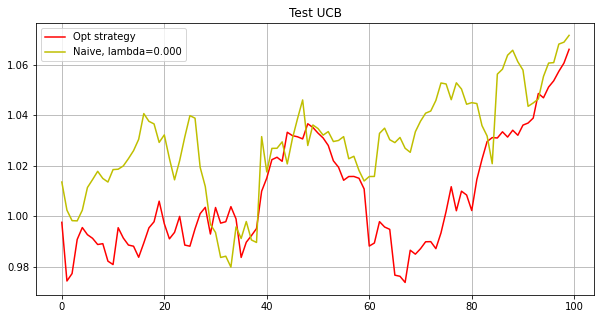

Phase 8
Testing...
./tmp2/res_phase08_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0127  0.0084  0.0109  0.0093  0.0106  0.0137  0.0086  0.0115  0.0086
  0.0107  0.0093  0.0074  0.0088  0.0099  0.0099  0.0105  0.0109  0.0098
  0.0041  0.0075  0.0112  0.0115  0.0117  0.0124  0.0107  0.0089  0.0082
 -0.      0.0118  0.0088  0.0101  0.0118  0.0106  0.0085  0.0106  0.0105
  0.0095  0.0119  0.0087  0.008   0.0092  0.009   0.0105  0.0098  0.0099
  0.008   0.0095  0.0108  0.0086  0.0095  0.0067  0.0061  0.0111  0.0086
  0.0099  0.0089  0.0105  0.0093  0.0088  0.0102  0.0101  0.014   0.0122
  0.0119  0.009   0.0083  0.0104  0.0088  0.0095  0.0091  0.0123  0.0126
  0.0117  0.0108  0.0087  0.0124  0.0108  0.0084  0.0105  0.014   0.0084
  0.0105  0.0129  0.0099  0.0093  0.0143  0.0099  0.0092  0.0085  0.0109
  0.0117  0.0113  0.0118  0.0103  0.0111  0.0108  0.0127  0.0104  0.009
  0.0081

[ 0.0194  0.0034  0.0129  0.0078  0.0055  0.023   0.0034  0.0154  0.005
  0.0126  0.0071  0.0017  0.0094  0.0105  0.0062  0.0132  0.0133  0.008
 -0.      0.0083  0.0135  0.0148  0.0161  0.0185  0.0132  0.0053  0.0084
  0.0003  0.0163  0.0069  0.0124  0.0127  0.0142  0.0038  0.0125  0.0115
  0.0089  0.0165  0.0077  0.0043  0.0065  0.0094  0.0112  0.0104  0.0141
  0.0033  0.0036  0.0129  0.0077  0.0079  0.001   0.0004  0.0134  0.0107
  0.0097  0.0062  0.0107  0.0059  0.0073  0.0131  0.0083  0.0136  0.0175
  0.0116  0.0074  0.0074  0.0115  0.007   0.0083  0.0071  0.0103  0.0132
  0.0157  0.0134  0.0054  0.0153  0.0073  0.006   0.0138  0.0148  0.0042
  0.0119  0.016   0.0038  0.0071  0.0118  0.0097  0.0098  0.0092  0.0114
  0.0145  0.0146  0.0135  0.0047  0.0136  0.0105  0.0196  0.0098  0.0101
  0.0101]
0.06949597792200427
[0.0194 0.0034 0.0129 0.0078 0.0055 0.023  0.0034 0.0154 0.005  0.0126
 0.007  0.0017 0.0094 0.0105 0.0062 0.0132 0.0133 0.008  0.     0.0083
 0.0136 0.0148 0.0161 0.018

[ 0.0208  0.0024  0.0136  0.0076  0.0048  0.0249  0.0025  0.0163  0.0037
  0.013   0.0066  0.0006  0.0095  0.0099  0.0056  0.0133  0.0138  0.0084
  0.      0.0077  0.0136  0.0153  0.0172  0.0198  0.014   0.0047  0.0077
  0.      0.0173  0.0069  0.0134  0.0133  0.015   0.0038  0.0132  0.0118
  0.0091  0.0176  0.0065  0.0041  0.0058  0.0097  0.0116  0.0104  0.0149
  0.0025  0.0019  0.0134  0.0071  0.0079 -0.     -0.      0.0141  0.0111
  0.0098  0.0058  0.0108  0.0052  0.0071  0.0141  0.0079  0.0132  0.0187
  0.0118  0.007   0.0067  0.0118  0.0066  0.0082  0.0064  0.0104  0.0136
  0.0167  0.0101  0.005   0.0157  0.0068  0.0072  0.0127  0.014   0.0033
  0.0123  0.0158  0.0017  0.0068  0.012   0.0092  0.01    0.008   0.012
  0.0153  0.0153  0.0138  0.0051  0.0141  0.0105  0.021   0.0097  0.0108
  0.0104]
6.722502175978457e-05
[ 0.0208  0.0024  0.0136  0.0076  0.0048  0.0249  0.0025  0.0163  0.0037
  0.013   0.0066  0.0006  0.0095  0.0099  0.0056  0.0133  0.0138  0.0084
  0.      0.0077  0.

[ 0.0208  0.0024  0.0136  0.0076  0.0048  0.0249  0.0025  0.0163  0.0037
  0.013   0.0066  0.0006  0.0095  0.0099  0.0056  0.0133  0.0138  0.0084
  0.      0.0076  0.0136  0.0153  0.0172  0.0198  0.014   0.0047  0.0077
  0.      0.0173  0.0069  0.0134  0.0133  0.015   0.0038  0.0132  0.0118
  0.0091  0.0176  0.0065  0.0041  0.0058  0.0097  0.0116  0.0104  0.0149
  0.0025  0.0019  0.0134  0.0071  0.0079 -0.     -0.      0.0141  0.0111
  0.0098  0.0058  0.0108  0.0052  0.0071  0.0141  0.0079  0.0132  0.0187
  0.0118  0.007   0.0067  0.0118  0.0066  0.0082  0.0064  0.0104  0.0136
  0.0167  0.0101  0.005   0.0157  0.0068  0.0072  0.0127  0.014   0.0033
  0.0123  0.0158  0.0017  0.0068  0.012   0.0092  0.01    0.008   0.012
  0.0153  0.0153  0.0138  0.0051  0.0141  0.0105  0.021   0.0097  0.0108
  0.0104]
6.48046923860338e-05
[ 0.0208  0.0024  0.0136  0.0076  0.0048  0.0249  0.0025  0.0163  0.0037
  0.013   0.0066  0.0006  0.0095  0.0099  0.0056  0.0133  0.0138  0.0084
  0.      0.0076  0.0

[ 0.022   0.0016  0.0141  0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064 -0.      0.0095  0.0102  0.0067  0.0136  0.0143  0.0072
 -0.      0.0081  0.0141  0.0157  0.0179  0.0209  0.0148  0.0034  0.0073
 -0.      0.0182  0.0068  0.0142  0.0132  0.0155  0.0029  0.0137  0.0122
  0.0092  0.0184  0.0067  0.0031  0.0053  0.01    0.0118  0.0107  0.0152
  0.0018  0.0007  0.0139  0.0069  0.0064 -0.      0.      0.0145  0.0123
  0.0099  0.0055  0.0109  0.0046  0.0056  0.0145  0.0075  0.0129  0.0197
  0.0111  0.0068  0.0065  0.0121  0.0064  0.0081  0.0059  0.0101  0.0131
  0.0174  0.0081  0.0045  0.0167  0.0064  0.0071  0.0118  0.0137  0.0023
  0.0126  0.0161  0.      0.0067  0.0113  0.0095  0.0103  0.0081  0.0112
  0.0164  0.016   0.0139  0.0038  0.0143  0.0104  0.0223  0.0096  0.0119
  0.0111]
0.00010773406904529523
[ 0.022   0.0016  0.0141  0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064 -0.      0.0095  0.0102  0.0067  0.0136  0.0143  0.0072
  0.      0.0081  

[ 0.022   0.0016  0.0141  0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064 -0.      0.0095  0.0103  0.0067  0.0136  0.0143  0.0072
  0.      0.0081  0.0141  0.0157  0.0179  0.0209  0.0148  0.0034  0.0073
  0.      0.0182  0.0068  0.0142  0.0132  0.0155  0.0029  0.0137  0.0122
  0.0092  0.0184  0.0067  0.0031  0.0053  0.01    0.0118  0.0107  0.0152
  0.0018  0.0007  0.0139  0.0069  0.0064  0.0001 -0.      0.0145  0.0123
  0.0099  0.0055  0.0109  0.0046  0.0056  0.0145  0.0075  0.0129  0.0197
  0.0111  0.0068  0.0065  0.0121  0.0064  0.0081  0.0059  0.0101  0.0131
  0.0174  0.0081  0.0045  0.0167  0.0064  0.0071  0.0118  0.0137  0.0023
  0.0126  0.0161  0.      0.0067  0.0113  0.0095  0.0103  0.0081  0.0112
  0.0164  0.016   0.0139  0.0038  0.0143  0.0104  0.0223  0.0096  0.0119
  0.0111]
0.00021611822142132104
[ 0.022   0.0016  0.0141  0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064 -0.      0.0095  0.0103  0.0067  0.0136  0.0143  0.0072
  0.      0.0081  

[ 0.0221  0.0016  0.014   0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064  0.      0.0095  0.0103  0.0067  0.0136  0.0143  0.0072
  0.      0.0081  0.0141  0.0157  0.0179  0.0209  0.0148  0.0034  0.0073
 -0.      0.0182  0.0068  0.0142  0.0132  0.0155  0.0029  0.0137  0.0122
  0.0092  0.0184  0.0067  0.0031  0.0053  0.01    0.0118  0.0107  0.0152
  0.0018  0.0007  0.0139  0.0069  0.0064  0.0001  0.      0.0145  0.0123
  0.0099  0.0055  0.0109  0.0046  0.0056  0.0145  0.0075  0.0129  0.0197
  0.0111  0.0068  0.0065  0.0121  0.0064  0.0081  0.0059  0.0101  0.0131
  0.0174  0.0081  0.0045  0.0167  0.0064  0.0071  0.0118  0.0137  0.0023
  0.0126  0.0161  0.      0.0067  0.0113  0.0095  0.0103  0.0081  0.0112
  0.0164  0.016   0.0139  0.0038  0.0143  0.0104  0.0223  0.0096  0.0119
  0.0111]
2.0277764721216007e-05
[ 0.0221  0.0016  0.014   0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064 -0.      0.0095  0.0103  0.0067  0.0136  0.0143  0.0072
 -0.      0.0081  

[ 0.0221  0.0016  0.014   0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064  0.      0.0095  0.0103  0.0067  0.0136  0.0143  0.0072
 -0.      0.0081  0.0141  0.0157  0.0179  0.0209  0.0148  0.0034  0.0073
 -0.      0.0182  0.0068  0.0142  0.0132  0.0155  0.0029  0.0137  0.0122
  0.0092  0.0184  0.0067  0.0031  0.0053  0.01    0.0118  0.0107  0.0152
  0.0018  0.0007  0.0139  0.0069  0.0064 -0.     -0.      0.0145  0.0123
  0.0099  0.0055  0.0109  0.0046  0.0056  0.0145  0.0075  0.0129  0.0198
  0.0111  0.0068  0.0065  0.0121  0.0064  0.0081  0.0059  0.0101  0.0131
  0.0174  0.008   0.0045  0.0167  0.0064  0.0071  0.0118  0.0137  0.0023
  0.0126  0.0161  0.      0.0067  0.0113  0.0095  0.0103  0.0081  0.0112
  0.0164  0.016   0.0139  0.0038  0.0143  0.0104  0.0223  0.0096  0.0119
  0.0111]
1.1647091074282605e-05
[ 0.022   0.0016  0.014   0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064  0.      0.0095  0.0103  0.0067  0.0136  0.0143  0.0072
  0.      0.0081  

[ 0.022   0.0016  0.0141  0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064  0.0001  0.0095  0.0103  0.0067  0.0136  0.0143  0.0072
  0.0001  0.0081  0.0141  0.0157  0.0179  0.0209  0.0148  0.0034  0.0073
 -0.      0.0182  0.0068  0.0142  0.0132  0.0155  0.0029  0.0137  0.0122
  0.0092  0.0184  0.0067  0.0031  0.0053  0.01    0.0118  0.0107  0.0152
  0.0018  0.0007  0.0139  0.0069  0.0064 -0.      0.      0.0145  0.0123
  0.0099  0.0055  0.0109  0.0046  0.0056  0.0145  0.0075  0.0129  0.0197
  0.0111  0.0068  0.0065  0.0121  0.0064  0.0081  0.0059  0.0101  0.0131
  0.0174  0.008   0.0045  0.0167  0.0064  0.0071  0.0118  0.0137  0.0023
  0.0126  0.0161  0.      0.0067  0.0113  0.0095  0.0103  0.0081  0.0112
  0.0164  0.016   0.0139  0.0038  0.0143  0.0104  0.0223  0.0096  0.0119
  0.0111]
4.0021621008962754e-05
[ 0.022   0.0016  0.0141  0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064  0.0001  0.0095  0.0103  0.0067  0.0136  0.0143  0.0072
  0.0001  0.0081  

[ 0.022   0.0016  0.014   0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064  0.      0.0095  0.0103  0.0067  0.0136  0.0143  0.0072
  0.      0.0081  0.0141  0.0157  0.0179  0.0209  0.0148  0.0034  0.0073
  0.      0.0182  0.0068  0.0142  0.0132  0.0155  0.0029  0.0137  0.0122
  0.0092  0.0184  0.0067  0.0031  0.0053  0.01    0.0118  0.0107  0.0152
  0.0018  0.0007  0.0139  0.0069  0.0064 -0.     -0.      0.0145  0.0123
  0.0099  0.0055  0.0109  0.0046  0.0056  0.0145  0.0075  0.0129  0.0197
  0.0111  0.0068  0.0065  0.0121  0.0064  0.0081  0.0059  0.0101  0.0131
  0.0174  0.008   0.0045  0.0167  0.0064  0.0071  0.0118  0.0137  0.0023
  0.0126  0.0161  0.      0.0067  0.0113  0.0095  0.0103  0.0081  0.0112
  0.0164  0.016   0.0139  0.0038  0.0143  0.0104  0.0223  0.0096  0.0119
  0.0111]
0.00018397305393100775
[ 0.022   0.0016  0.014   0.0075  0.0041  0.0265  0.002   0.0171  0.0029
  0.0135  0.0064  0.      0.0095  0.0103  0.0067  0.0136  0.0143  0.0072
  0.      0.0081  

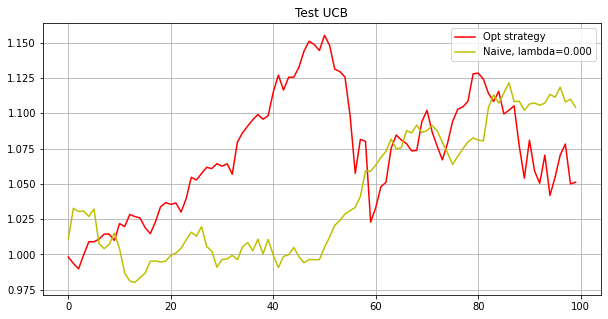

Phase 9
Testing...
./tmp2/res_phase09_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
7.400132613510045e-05
[0.0099 0.0112 0.0092 0.0118 0.0047 0.0078 0.0077 0.0078 0.0076 0.0099
 0.0087 0.0016 0.0092 0.0095 0.0135 0.0072 0.0101 0.0117 0.011  0.0118
 0.0107 0.0094 0.0116 0.0129 0.0107 0.0095 0.0079 0.0116 0.0076 0.0082
 0.011  0.0103 0.0103 0.0103 0.005  0.0103 0.0103 0.0103 0.0113 0.

[0.0099 0.0113 0.0094 0.012  0.0043 0.0074 0.0072 0.0076 0.0073 0.01
 0.0087 0.0012 0.009  0.0093 0.0138 0.0072 0.0101 0.0119 0.0111 0.012
 0.0108 0.0093 0.0116 0.0132 0.0107 0.0095 0.008  0.0117 0.0078 0.0083
 0.011  0.0103 0.0104 0.0104 0.0047 0.0103 0.0102 0.0102 0.0114 0.0148
 0.0135 0.0097 0.0114 0.0099 0.0099 0.0106 0.0105 0.008  0.0124 0.0087
 0.0117 0.0094 0.0104 0.0108 0.0118 0.0102 0.0133 0.0064 0.0099 0.0114
 0.011  0.0078 0.0092 0.0111 0.0091 0.0103 0.0112 0.0161 0.01   0.007
 0.0136 0.0089 0.008  0.0095 0.012  0.0133 0.0139 0.0119 0.0083 0.0133
 0.0093 0.0086 0.008  0.0098 0.0027 0.0099 0.01   0.0091 0.0099 0.0064
 0.0101 0.0098 0.011  0.0075 0.0094 0.0115 0.0113 0.0123 0.0119 0.0106]
1.7579932904375484e-09
[0.0099 0.0113 0.0094 0.012  0.0043 0.0074 0.0072 0.0076 0.0073 0.01
 0.0087 0.0012 0.009  0.0093 0.0138 0.0072 0.0101 0.0119 0.0111 0.012
 0.0108 0.0093 0.0116 0.0132 0.0107 0.0095 0.008  0.0117 0.0078 0.0083
 0.011  0.0103 0.0104 0.0104 0.0047 0.0103 0.0102 0.0102 0.0

[0.0099 0.0113 0.0094 0.012  0.0043 0.0074 0.0072 0.0076 0.0073 0.01
 0.0087 0.0012 0.009  0.0093 0.0138 0.0072 0.0101 0.0119 0.0111 0.012
 0.0108 0.0093 0.0116 0.0132 0.0107 0.0095 0.008  0.0117 0.0078 0.0083
 0.011  0.0103 0.0104 0.0104 0.0047 0.0103 0.0102 0.0102 0.0114 0.0148
 0.0135 0.0097 0.0114 0.0099 0.0099 0.0106 0.0105 0.008  0.0124 0.0087
 0.0117 0.0094 0.0104 0.0108 0.0118 0.0102 0.0133 0.0064 0.0099 0.0114
 0.011  0.0078 0.0092 0.0111 0.0091 0.0103 0.0112 0.0161 0.01   0.007
 0.0136 0.0089 0.008  0.0095 0.012  0.0133 0.0139 0.0119 0.0083 0.0133
 0.0093 0.0086 0.008  0.0098 0.0027 0.0099 0.01   0.0091 0.0099 0.0064
 0.0101 0.0098 0.011  0.0075 0.0094 0.0115 0.0113 0.0123 0.0119 0.0106]
2.4450693941312912e-09
[0.0099 0.0115 0.0099 0.0124 0.0025 0.0068 0.0068 0.0071 0.0068 0.0102
 0.0087 0.001  0.0086 0.0091 0.0145 0.0072 0.0102 0.0123 0.0113 0.0121
 0.0107 0.0094 0.0116 0.0138 0.0108 0.0094 0.0077 0.0114 0.0069 0.009
 0.0111 0.0103 0.0106 0.0105 0.0034 0.01   0.0099 0.0103 0

[0.0099 0.0115 0.0099 0.0124 0.0025 0.0068 0.0068 0.0071 0.0068 0.0102
 0.0087 0.001  0.0086 0.0091 0.0145 0.0072 0.0102 0.0123 0.0113 0.0121
 0.0107 0.0094 0.0116 0.0138 0.0108 0.0094 0.0077 0.0114 0.0069 0.009
 0.0111 0.0103 0.0106 0.0105 0.0034 0.01   0.0099 0.0103 0.0116 0.0159
 0.0138 0.0087 0.0112 0.0099 0.0099 0.0111 0.0106 0.0067 0.0127 0.0085
 0.012  0.0091 0.0111 0.0109 0.0115 0.0102 0.0132 0.0063 0.0098 0.0117
 0.0111 0.0074 0.0091 0.0111 0.0079 0.0104 0.0125 0.0165 0.01   0.0078
 0.0143 0.0093 0.008  0.0092 0.0124 0.014  0.014  0.0124 0.0085 0.0124
 0.0093 0.0089 0.0075 0.0096 0.0029 0.0097 0.0104 0.0092 0.0099 0.0065
 0.0101 0.0102 0.0112 0.007  0.0095 0.0112 0.0116 0.0123 0.0121 0.0106]
1.9448783787233068e-08
[0.0099 0.0115 0.0099 0.0124 0.0025 0.0068 0.0068 0.0071 0.0068 0.0102
 0.0087 0.001  0.0086 0.0091 0.0145 0.0072 0.0102 0.0123 0.0113 0.0121
 0.0107 0.0094 0.0116 0.0138 0.0108 0.0094 0.0077 0.0114 0.0069 0.009
 0.0111 0.0103 0.0106 0.0105 0.0034 0.01   0.0099 0.010

[0.0098 0.0116 0.01   0.0124 0.0017 0.0067 0.0065 0.0069 0.0065 0.0102
 0.0086 0.     0.0086 0.009  0.0148 0.0072 0.01   0.0125 0.0114 0.0123
 0.0107 0.0095 0.0118 0.0141 0.0109 0.0093 0.0076 0.0112 0.0067 0.0094
 0.0112 0.0104 0.0109 0.0106 0.0032 0.01   0.0099 0.0103 0.0117 0.0156
 0.0138 0.0083 0.0114 0.0099 0.0098 0.0113 0.0106 0.0066 0.013  0.0083
 0.0122 0.009  0.0113 0.011  0.0117 0.0102 0.0132 0.0063 0.0098 0.0118
 0.0111 0.0077 0.009  0.0112 0.0077 0.0104 0.0129 0.0166 0.01   0.0078
 0.0146 0.0095 0.0082 0.0085 0.0125 0.0143 0.0141 0.013  0.0085 0.0123
 0.0094 0.0088 0.0075 0.0093 0.0027 0.0097 0.0105 0.0091 0.0099 0.006
 0.0101 0.0102 0.0113 0.0069 0.0094 0.0112 0.0117 0.0122 0.0123 0.0106]
3.616995330509115e-06
[0.0098 0.0116 0.01   0.0124 0.0017 0.0067 0.0065 0.0069 0.0065 0.0102
 0.0086 0.     0.0086 0.009  0.0148 0.0072 0.01   0.0125 0.0114 0.0123
 0.0107 0.0095 0.0118 0.0141 0.0109 0.0093 0.0076 0.0112 0.0067 0.0094
 0.0112 0.0104 0.0109 0.0106 0.0032 0.01   0.0099 0.010

[0.0099 0.0116 0.01   0.0124 0.0017 0.0067 0.0065 0.0069 0.0065 0.0102
 0.0086 0.     0.0086 0.009  0.0148 0.0072 0.01   0.0125 0.0114 0.0123
 0.0107 0.0095 0.0118 0.0141 0.0109 0.0093 0.0076 0.0112 0.0067 0.0094
 0.0112 0.0104 0.0109 0.0106 0.0032 0.01   0.0099 0.0103 0.0117 0.0156
 0.0138 0.0083 0.0114 0.0099 0.0098 0.0113 0.0106 0.0066 0.013  0.0083
 0.0122 0.009  0.0113 0.011  0.0117 0.0102 0.0132 0.0063 0.0098 0.0118
 0.0111 0.0077 0.009  0.0112 0.0077 0.0104 0.0129 0.0166 0.01   0.0078
 0.0146 0.0095 0.0082 0.0085 0.0125 0.0143 0.0141 0.013  0.0085 0.0123
 0.0094 0.0088 0.0075 0.0093 0.0027 0.0097 0.0105 0.0091 0.0099 0.006
 0.0101 0.0102 0.0113 0.0069 0.0094 0.0112 0.0117 0.0122 0.0123 0.0106]
1.1197009928070757e-07
[0.0099 0.0116 0.01   0.0124 0.0017 0.0067 0.0065 0.0069 0.0065 0.0102
 0.0086 0.     0.0086 0.009  0.0148 0.0072 0.01   0.0125 0.0114 0.0123
 0.0107 0.0095 0.0118 0.0141 0.0109 0.0093 0.0076 0.0112 0.0067 0.0094
 0.0112 0.0104 0.0109 0.0106 0.0032 0.01   0.0099 0.01

[0.0099 0.0116 0.01   0.0124 0.0017 0.0067 0.0064 0.0069 0.0065 0.0103
 0.0086 0.0001 0.0086 0.009  0.0148 0.0072 0.01   0.0125 0.0114 0.0123
 0.0107 0.0095 0.0118 0.0141 0.0109 0.0093 0.0076 0.0112 0.0067 0.0094
 0.0112 0.0104 0.0109 0.0106 0.0032 0.01   0.0099 0.0103 0.0117 0.0156
 0.0138 0.0083 0.0114 0.0099 0.0098 0.0113 0.0106 0.0066 0.013  0.0083
 0.0122 0.009  0.0113 0.011  0.0117 0.0102 0.0132 0.0063 0.0098 0.0118
 0.0111 0.0077 0.009  0.0112 0.0077 0.0104 0.0129 0.0166 0.01   0.0078
 0.0146 0.0095 0.0082 0.0085 0.0125 0.0143 0.0141 0.013  0.0085 0.0123
 0.0094 0.0088 0.0075 0.0093 0.0027 0.0097 0.0105 0.0091 0.0099 0.006
 0.0101 0.0102 0.0113 0.0069 0.0094 0.0112 0.0117 0.0122 0.0123 0.0106]
1.1765837528722848e-05
[0.0099 0.0116 0.01   0.0124 0.0017 0.0067 0.0064 0.0069 0.0065 0.0103
 0.0086 0.0001 0.0086 0.009  0.0148 0.0072 0.01   0.0125 0.0114 0.0123
 0.0107 0.0095 0.0118 0.0141 0.0109 0.0093 0.0076 0.0112 0.0067 0.0094
 0.0112 0.0104 0.0109 0.0106 0.0032 0.01   0.0099 0.01

[0.0099 0.0116 0.01   0.0124 0.0017 0.0067 0.0064 0.0069 0.0065 0.0103
 0.0086 0.0001 0.0086 0.009  0.0148 0.0072 0.01   0.0125 0.0114 0.0123
 0.0107 0.0095 0.0118 0.0141 0.0109 0.0093 0.0076 0.0112 0.0067 0.0094
 0.0112 0.0104 0.0109 0.0106 0.0032 0.01   0.0099 0.0103 0.0117 0.0156
 0.0138 0.0083 0.0114 0.0099 0.0098 0.0113 0.0106 0.0066 0.013  0.0083
 0.0122 0.009  0.0113 0.011  0.0117 0.0102 0.0132 0.0063 0.0098 0.0118
 0.0111 0.0077 0.009  0.0112 0.0077 0.0104 0.0129 0.0166 0.01   0.0078
 0.0146 0.0095 0.0082 0.0085 0.0125 0.0143 0.0141 0.013  0.0085 0.0123
 0.0094 0.0088 0.0075 0.0093 0.0027 0.0097 0.0105 0.0091 0.0099 0.006
 0.0101 0.0102 0.0113 0.0069 0.0094 0.0112 0.0117 0.0122 0.0123 0.0106]
1.0751274192169016e-05
[0.0099 0.0116 0.01   0.0124 0.0017 0.0067 0.0064 0.0069 0.0065 0.0103
 0.0086 0.0001 0.0086 0.009  0.0148 0.0072 0.01   0.0125 0.0114 0.0123
 0.0107 0.0095 0.0118 0.0141 0.0109 0.0093 0.0076 0.0112 0.0067 0.0094
 0.0112 0.0104 0.0109 0.0106 0.0032 0.01   0.0099 0.01

[0.0099 0.0116 0.01   0.0124 0.0017 0.0067 0.0064 0.0069 0.0065 0.0103
 0.0086 0.     0.0086 0.009  0.0148 0.0072 0.01   0.0125 0.0114 0.0123
 0.0107 0.0095 0.0118 0.0141 0.0109 0.0093 0.0076 0.0112 0.0067 0.0094
 0.0112 0.0104 0.0109 0.0106 0.0032 0.01   0.0099 0.0103 0.0117 0.0156
 0.0138 0.0083 0.0114 0.0099 0.0098 0.0113 0.0106 0.0066 0.013  0.0083
 0.0122 0.009  0.0113 0.011  0.0117 0.0102 0.0132 0.0063 0.0098 0.0118
 0.0111 0.0077 0.009  0.0112 0.0077 0.0104 0.0129 0.0166 0.01   0.0078
 0.0146 0.0095 0.0082 0.0085 0.0125 0.0143 0.0141 0.013  0.0085 0.0123
 0.0094 0.0088 0.0075 0.0093 0.0027 0.0097 0.0105 0.0091 0.0099 0.006
 0.0101 0.0102 0.0113 0.0069 0.0094 0.0112 0.0117 0.0122 0.0123 0.0106]
2.746586809448617e-06
[ 0.0099  0.0117  0.0102  0.0126  0.001   0.0064  0.0063  0.0067  0.0063
  0.0102  0.0085 -0.      0.0087  0.0088  0.0151  0.0072  0.0099  0.0126
  0.0115  0.0123  0.0108  0.0096  0.0118  0.0143  0.011   0.0092  0.0071
  0.0111  0.0071  0.0096  0.0112  0.0104  0.0109 

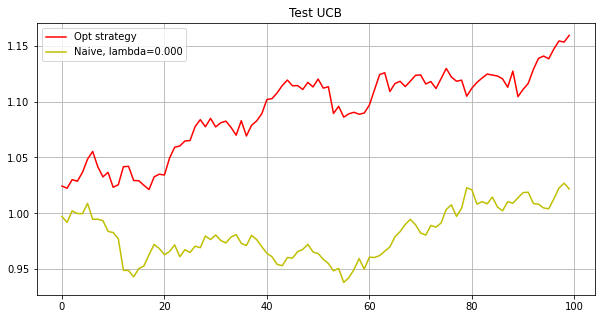

Phase 10
Testing...
./tmp2/res_phase10_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.5503226095947564e-07
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.0

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.7679977412643488e-08
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0

[0.0103 0.0099 0.0106 0.0102 0.0103 0.0099 0.0104 0.0109 0.0087 0.0103
 0.0097 0.0095 0.0097 0.0111 0.0112 0.0093 0.0094 0.01   0.01   0.0102
 0.0111 0.01   0.0111 0.01   0.0106 0.0097 0.0072 0.0114 0.0103 0.0102
 0.0112 0.0081 0.0109 0.0098 0.0103 0.0097 0.0104 0.0099 0.0111 0.0093
 0.0107 0.0107 0.0096 0.012  0.0105 0.0096 0.0103 0.0108 0.0113 0.0098
 0.0115 0.0112 0.0099 0.0126 0.0095 0.011  0.0101 0.0107 0.0078 0.011
 0.0099 0.0099 0.0103 0.0101 0.0091 0.0111 0.0096 0.01   0.0105 0.0092
 0.0118 0.0098 0.0093 0.0106 0.0096 0.009  0.0098 0.0073 0.0102 0.0099
 0.0096 0.0015 0.01   0.0115 0.0101 0.0098 0.01   0.009  0.0094 0.0097
 0.0103 0.0082 0.0105 0.0104 0.0099 0.0086 0.0087 0.0105 0.0105 0.0101]
3.3414298518017437e-07
[0.0103 0.0099 0.0106 0.0102 0.0103 0.0099 0.0104 0.0109 0.0087 0.0103
 0.0097 0.0095 0.0097 0.0111 0.0112 0.0093 0.0094 0.01   0.01   0.0102
 0.0111 0.01   0.0111 0.01   0.0106 0.0097 0.0072 0.0114 0.0103 0.0102
 0.0112 0.0081 0.0109 0.0098 0.0103 0.0097 0.0104 0.00

[0.0103 0.0099 0.0106 0.0102 0.0103 0.0099 0.0104 0.0109 0.0087 0.0103
 0.0097 0.0095 0.0097 0.0111 0.0112 0.0093 0.0094 0.01   0.01   0.0102
 0.0111 0.01   0.0111 0.01   0.0106 0.0097 0.0072 0.0114 0.0103 0.0102
 0.0112 0.0081 0.0109 0.0098 0.0103 0.0097 0.0104 0.0099 0.0111 0.0093
 0.0107 0.0107 0.0096 0.012  0.0105 0.0096 0.0103 0.0108 0.0113 0.0098
 0.0115 0.0112 0.0099 0.0126 0.0095 0.011  0.0101 0.0107 0.0078 0.011
 0.0099 0.0099 0.0103 0.0101 0.0091 0.0111 0.0096 0.01   0.0105 0.0092
 0.0118 0.0098 0.0093 0.0106 0.0096 0.009  0.0098 0.0073 0.0102 0.0099
 0.0096 0.0015 0.01   0.0115 0.0101 0.0098 0.01   0.009  0.0094 0.0097
 0.0103 0.0082 0.0105 0.0104 0.0099 0.0086 0.0087 0.0105 0.0105 0.0101]
4.205890413266737e-08
[0.0103 0.0099 0.0106 0.0102 0.0103 0.0099 0.0104 0.0109 0.0087 0.0103
 0.0097 0.0095 0.0097 0.0111 0.0112 0.0093 0.0094 0.01   0.01   0.0102
 0.0111 0.01   0.0111 0.01   0.0106 0.0097 0.0072 0.0114 0.0103 0.0102
 0.0112 0.0081 0.0109 0.0098 0.0103 0.0097 0.0104 0.009

[0.0093 0.0094 0.0106 0.0102 0.0096 0.0091 0.0105 0.0121 0.0073 0.0107
 0.0086 0.011  0.0093 0.0084 0.0098 0.0084 0.0084 0.0097 0.01   0.0091
 0.0126 0.0093 0.0119 0.0097 0.0094 0.0099 0.0085 0.0133 0.0104 0.0104
 0.01   0.0072 0.0088 0.0103 0.0098 0.0088 0.0103 0.0098 0.0085 0.0082
 0.0096 0.0112 0.0092 0.0107 0.0106 0.0089 0.0113 0.0094 0.0111 0.0102
 0.0135 0.015  0.0095 0.0151 0.0095 0.011  0.0125 0.0115 0.0064 0.0123
 0.0097 0.0091 0.0096 0.0101 0.0094 0.0124 0.0117 0.0104 0.0109 0.011
 0.0131 0.0108 0.0094 0.0105 0.0092 0.0073 0.0097 0.0067 0.0096 0.0095
 0.0105 0.0016 0.0109 0.0125 0.0101 0.0095 0.0104 0.0083 0.0102 0.0092
 0.0094 0.0115 0.0117 0.0097 0.0101 0.009  0.0051 0.0111 0.0119 0.0102]
4.0253969096925614e-07
[0.0093 0.0094 0.0106 0.0102 0.0096 0.0091 0.0105 0.0121 0.0073 0.0107
 0.0086 0.011  0.0093 0.0084 0.0098 0.0084 0.0084 0.0097 0.01   0.0091
 0.0126 0.0093 0.0119 0.0097 0.0094 0.0099 0.0085 0.0133 0.0104 0.0104
 0.01   0.0072 0.0088 0.0103 0.0098 0.0088 0.0103 0.00

[0.0093 0.0094 0.0106 0.0102 0.0096 0.0091 0.0105 0.0121 0.0073 0.0107
 0.0086 0.011  0.0093 0.0084 0.0098 0.0084 0.0084 0.0097 0.01   0.0091
 0.0126 0.0093 0.0119 0.0097 0.0094 0.0099 0.0085 0.0133 0.0104 0.0104
 0.01   0.0072 0.0088 0.0103 0.0098 0.0088 0.0103 0.0098 0.0085 0.0082
 0.0096 0.0112 0.0092 0.0107 0.0106 0.0089 0.0113 0.0094 0.0111 0.0102
 0.0135 0.015  0.0095 0.0151 0.0095 0.011  0.0125 0.0115 0.0064 0.0123
 0.0097 0.0091 0.0096 0.0101 0.0094 0.0124 0.0117 0.0104 0.0109 0.011
 0.0131 0.0108 0.0094 0.0105 0.0092 0.0073 0.0097 0.0067 0.0096 0.0095
 0.0105 0.0016 0.0109 0.0125 0.0101 0.0095 0.0104 0.0083 0.0102 0.0092
 0.0094 0.0115 0.0117 0.0097 0.0101 0.009  0.0051 0.0111 0.0119 0.0102]
3.2604711288296805e-07
[0.0093 0.0094 0.0106 0.0102 0.0096 0.0091 0.0105 0.0121 0.0073 0.0107
 0.0086 0.011  0.0093 0.0084 0.0098 0.0084 0.0084 0.0097 0.01   0.0091
 0.0126 0.0093 0.0119 0.0097 0.0094 0.0099 0.0085 0.0133 0.0104 0.0104
 0.01   0.0072 0.0088 0.0103 0.0098 0.0088 0.0103 0.00

[0.0093 0.0094 0.0106 0.0102 0.0096 0.0091 0.0105 0.0121 0.0073 0.0107
 0.0086 0.011  0.0093 0.0084 0.0098 0.0084 0.0084 0.0097 0.01   0.0091
 0.0126 0.0093 0.0119 0.0097 0.0094 0.0099 0.0085 0.0133 0.0104 0.0104
 0.01   0.0072 0.0088 0.0103 0.0098 0.0088 0.0103 0.0098 0.0085 0.0082
 0.0096 0.0112 0.0092 0.0107 0.0106 0.0089 0.0113 0.0094 0.0111 0.0102
 0.0135 0.015  0.0095 0.0151 0.0095 0.011  0.0125 0.0115 0.0064 0.0123
 0.0097 0.0091 0.0096 0.0101 0.0094 0.0124 0.0117 0.0104 0.0109 0.011
 0.0131 0.0108 0.0094 0.0105 0.0092 0.0073 0.0097 0.0067 0.0096 0.0095
 0.0105 0.0016 0.0109 0.0125 0.0101 0.0095 0.0104 0.0083 0.0102 0.0092
 0.0094 0.0115 0.0117 0.0097 0.0101 0.009  0.0051 0.0111 0.0119 0.0102]
1.4282322083032997e-07
[0.0093 0.0094 0.0106 0.0102 0.0096 0.0091 0.0105 0.0121 0.0073 0.0107
 0.0086 0.011  0.0093 0.0084 0.0098 0.0084 0.0084 0.0097 0.01   0.0091
 0.0126 0.0093 0.0119 0.0097 0.0094 0.0099 0.0085 0.0133 0.0104 0.0104
 0.01   0.0072 0.0088 0.0103 0.0098 0.0088 0.0103 0.00

[0.0095 0.0093 0.0105 0.0103 0.0096 0.009  0.0107 0.0123 0.0069 0.0108
 0.0083 0.0109 0.0092 0.0075 0.0097 0.0081 0.0082 0.0097 0.01   0.0081
 0.0131 0.0094 0.0125 0.0097 0.0095 0.0098 0.0073 0.0139 0.0105 0.0105
 0.0107 0.0071 0.0084 0.0104 0.0095 0.0085 0.0105 0.0098 0.0091 0.0079
 0.0097 0.0115 0.0092 0.0113 0.0101 0.0087 0.0115 0.0096 0.0111 0.0105
 0.0142 0.0164 0.0088 0.0156 0.0097 0.0112 0.0128 0.0118 0.0053 0.0127
 0.0096 0.0087 0.0097 0.0101 0.0094 0.0129 0.0126 0.0105 0.0111 0.011
 0.0133 0.0106 0.0092 0.0106 0.009  0.0069 0.0096 0.0071 0.0092 0.0095
 0.0115 0.     0.0107 0.0126 0.0103 0.0096 0.0104 0.0077 0.0106 0.0091
 0.0092 0.0118 0.0114 0.0089 0.0101 0.009  0.005  0.0113 0.0118 0.0103]
5.403125788417932e-07
[0.0095 0.0093 0.0105 0.0103 0.0096 0.009  0.0107 0.0123 0.0069 0.0108
 0.0083 0.0109 0.0092 0.0075 0.0097 0.0081 0.0082 0.0097 0.01   0.0081
 0.0131 0.0094 0.0125 0.0097 0.0095 0.0098 0.0073 0.0139 0.0105 0.0105
 0.0107 0.0071 0.0084 0.0104 0.0095 0.0085 0.0105 0.009

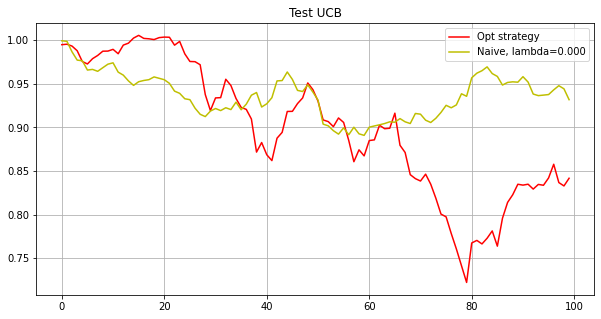

Phase 11
Testing...
./tmp2/res_phase11_iter5000_subn100_lb5_M10_matcnt47_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
7.86009194862769e-06
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 

[0.0109 0.0103 0.0075 0.0106 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0086 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123 0.0129 0.01
 0.0094 0.0099 0.0081 0.0091 0.0118 0.0035 0.005  0.011  0.0103 0.0056
 0.0103 0.0102 0.015  0.0112 0.0117 0.0114 0.011  0.0128 0.0123 0.0095
 0.0071 0.0108 0.0119 0.0077 0.0104 0.013  0.0122 0.0109 0.0111 0.0093
 0.005  0.0128 0.0078 0.0103 0.0066 0.0112 0.0101 0.0119 0.0128 0.0087
 0.0105 0.0101 0.0061 0.01   0.0117 0.0083 0.01   0.0103 0.0089 0.0082
 0.0111 0.0096 0.008  0.0125 0.0111 0.0079 0.0086 0.0043 0.0106 0.0076]
0.049899649668179676
[0.0109 0.0103 0.0075 0.0106 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0086 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123 

[0.0109 0.0103 0.0075 0.0106 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0086 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123 0.0129 0.01
 0.0094 0.0099 0.0081 0.0091 0.0118 0.0035 0.005  0.011  0.0103 0.0056
 0.0103 0.0102 0.015  0.0112 0.0117 0.0114 0.011  0.0128 0.0123 0.0095
 0.0071 0.0108 0.0119 0.0077 0.0104 0.013  0.0122 0.0109 0.0111 0.0093
 0.005  0.0128 0.0078 0.0103 0.0066 0.0112 0.0101 0.0119 0.0128 0.0087
 0.0105 0.0101 0.0061 0.01   0.0117 0.0083 0.01   0.0103 0.0089 0.0082
 0.0111 0.0096 0.008  0.0125 0.0111 0.0079 0.0086 0.0043 0.0105 0.0076]
1.344022231838677e-05
[0.0109 0.0103 0.0075 0.0106 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0086 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123

[0.0109 0.0103 0.0075 0.0106 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0086 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123 0.0129 0.01
 0.0094 0.0099 0.0081 0.0091 0.0118 0.0035 0.005  0.011  0.0103 0.0056
 0.0103 0.0102 0.015  0.0112 0.0117 0.0114 0.011  0.0128 0.0123 0.0095
 0.0071 0.0108 0.0119 0.0077 0.0104 0.013  0.0122 0.0109 0.0111 0.0093
 0.005  0.0128 0.0078 0.0103 0.0066 0.0112 0.0101 0.0119 0.0128 0.0087
 0.0105 0.0101 0.0061 0.01   0.0117 0.0083 0.01   0.0103 0.0089 0.0082
 0.0111 0.0096 0.008  0.0125 0.0111 0.0079 0.0086 0.0043 0.0105 0.0076]
1.631165087803135e-05
[0.0109 0.0103 0.0075 0.0106 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0086 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123

[0.0109 0.0103 0.0075 0.0106 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0086 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123 0.0129 0.01
 0.0094 0.0099 0.0081 0.0091 0.0118 0.0035 0.005  0.011  0.0103 0.0056
 0.0103 0.0102 0.015  0.0113 0.0117 0.0114 0.011  0.0128 0.0123 0.0095
 0.0071 0.0108 0.0119 0.0077 0.0104 0.013  0.0122 0.0109 0.0111 0.0093
 0.005  0.0128 0.0078 0.0103 0.0066 0.0112 0.0101 0.0119 0.0128 0.0087
 0.0105 0.0101 0.0061 0.01   0.0117 0.0083 0.01   0.0103 0.0089 0.0082
 0.0111 0.0096 0.008  0.0125 0.0111 0.0079 0.0086 0.0043 0.0105 0.0076]
1.4168023544738808e-05
[0.0109 0.0103 0.0075 0.0106 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0086 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.012

[0.0109 0.0103 0.0075 0.0105 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0085 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123 0.0129 0.01
 0.0094 0.0099 0.0081 0.0091 0.0118 0.0035 0.005  0.011  0.0103 0.0056
 0.0103 0.0102 0.015  0.0113 0.0117 0.0114 0.011  0.0128 0.0123 0.0095
 0.0071 0.0108 0.0119 0.0077 0.0104 0.013  0.0122 0.0109 0.0111 0.0093
 0.005  0.0128 0.0078 0.0103 0.0066 0.0112 0.0101 0.0119 0.0128 0.0087
 0.0105 0.0101 0.0061 0.01   0.0117 0.0083 0.01   0.0103 0.0089 0.0082
 0.0111 0.0096 0.008  0.0125 0.0111 0.0079 0.0086 0.0043 0.0105 0.0076]
3.5837230270251152e-06
[0.0109 0.0103 0.0075 0.0105 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0085 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.012

[0.0109 0.0103 0.0075 0.0105 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0085 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123 0.0129 0.01
 0.0094 0.0099 0.0081 0.0091 0.0118 0.0035 0.005  0.011  0.0103 0.0056
 0.0103 0.0102 0.015  0.0113 0.0117 0.0114 0.011  0.0128 0.0123 0.0095
 0.0071 0.0108 0.0119 0.0077 0.0104 0.013  0.0122 0.0109 0.0111 0.0093
 0.005  0.0128 0.0078 0.0103 0.0066 0.0112 0.0101 0.0119 0.0128 0.0087
 0.0105 0.0101 0.0061 0.01   0.0117 0.0083 0.01   0.0103 0.0089 0.0082
 0.0111 0.0096 0.008  0.0125 0.0111 0.0079 0.0086 0.0043 0.0105 0.0076]
7.926587097611092e-07
[0.0109 0.0103 0.0075 0.0105 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0085 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123

[0.0109 0.0103 0.0075 0.0105 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0085 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123 0.0129 0.01
 0.0094 0.0099 0.0081 0.0091 0.0118 0.0035 0.005  0.011  0.0103 0.0056
 0.0103 0.0102 0.015  0.0113 0.0117 0.0114 0.011  0.0128 0.0123 0.0095
 0.0071 0.0108 0.0119 0.0077 0.0104 0.013  0.0122 0.0109 0.0111 0.0093
 0.005  0.0128 0.0078 0.0103 0.0066 0.0112 0.0101 0.0119 0.0128 0.0087
 0.0105 0.0101 0.0061 0.01   0.0117 0.0083 0.01   0.0103 0.0089 0.0082
 0.0111 0.0096 0.008  0.0125 0.0111 0.0079 0.0086 0.0043 0.0106 0.0076]
9.713561351321065e-06
[0.0109 0.0103 0.0075 0.0105 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0085 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123

[0.0109 0.0103 0.0075 0.0105 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0085 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.0123 0.0129 0.01
 0.0094 0.0099 0.0081 0.0091 0.0118 0.0035 0.005  0.011  0.0103 0.0056
 0.0103 0.0102 0.015  0.0113 0.0117 0.0114 0.011  0.0128 0.0123 0.0095
 0.0071 0.0108 0.0119 0.0077 0.0104 0.013  0.0122 0.0109 0.0111 0.0093
 0.005  0.0128 0.0078 0.0103 0.0066 0.0112 0.0101 0.0119 0.0128 0.0087
 0.0105 0.0101 0.0061 0.01   0.0117 0.0083 0.01   0.0103 0.0089 0.0082
 0.0111 0.0096 0.008  0.0125 0.0111 0.0079 0.0086 0.0043 0.0106 0.0076]
1.2770332356274935e-05
[0.0109 0.0103 0.0075 0.0105 0.0097 0.0072 0.0104 0.0104 0.012  0.0121
 0.0101 0.0131 0.0077 0.0106 0.0118 0.008  0.0115 0.0086 0.011  0.0123
 0.0109 0.0099 0.0115 0.0109 0.0073 0.0106 0.0115 0.0085 0.0112 0.0102
 0.0054 0.0087 0.0107 0.0135 0.0113 0.0096 0.0115 0.012

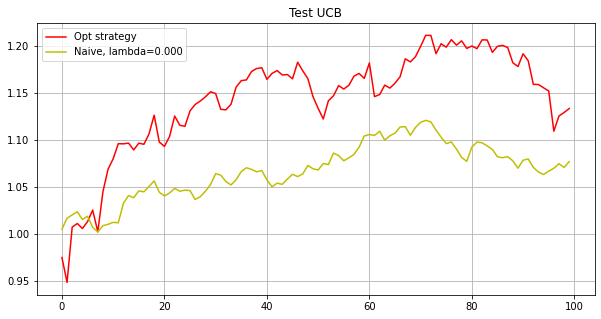

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.77079887
Mean return: 1.00047631
Naive strategy
Total return: 2.42965660
Mean return: 1.00074007


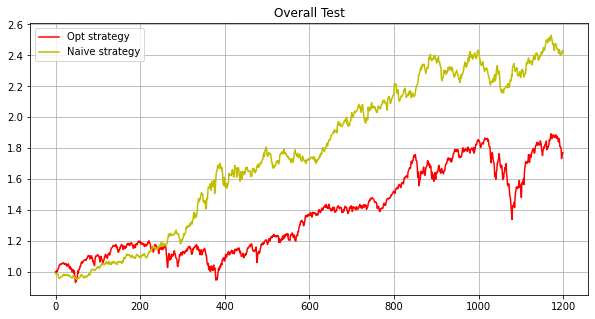

In [16]:
paras={'maxiter':5000, 'subn':100, 'lb':5, 'M':10, 'inverse':'True', 'ggd':'True', 'matcnt':47}

eps = 1.0005
delta = 0.01
run(paras, c=0.001, eps=eps, delta=delta, testv=np.arange(-0.02, 0.0100001, 0.002))

Phase 0
Testing...
./tmp2/res_phase00_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.4568467491399284e-09
[0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.0101 0.01
 0.01   0.01   0.0099 0.01   0.01   0.0101 0.01   0.0101 0.01   0.0099
 0.01   0.01   0.0101 0.01   0.0101 0.0099 0.0099 0.01   0.01   0.01
 0.01   0.0101 0.01   0.01   0.01   0.01   0.01   0.01   0.01   0.01


[ 0.0015  0.0029  0.0145  0.0156  0.0172  0.0052  0.0135 -0.      0.0154
  0.0056  0.0068  0.0072  0.0077  0.0156  0.0041  0.0146  0.0074  0.0192
  0.0068  0.0094  0.013   0.0078  0.0213  0.0146  0.0066  0.0114 -0.
  0.0144  0.0067  0.0073  0.0037  0.0086  0.0107  0.0158  0.0078  0.0106
  0.013   0.0079  0.0248  0.0034  0.0177  0.0061  0.0078  0.0093  0.0192
  0.0106  0.0169  0.0067  0.0085  0.      0.0098  0.0027  0.0042  0.0104
  0.0174  0.0107  0.0084  0.0132  0.0189  0.0095 -0.      0.0165  0.008
  0.0049  0.0092  0.0173  0.0076  0.01    0.0103  0.0096  0.0003  0.0087
  0.0057  0.008   0.0112  0.0121  0.0064  0.0078  0.0119  0.0105  0.0158
  0.0117  0.0142  0.0063  0.0102  0.0101  0.0081  0.0011  0.0134  0.0092
  0.017   0.0142  0.0116  0.0101  0.0111  0.0103  0.0126  0.0078  0.0129
  0.0084]
5.0659359310441207e-05
[ 0.0015  0.0029  0.0145  0.0156  0.0172  0.0052  0.0135 -0.      0.0154
  0.0056  0.0068  0.0072  0.0077  0.0156  0.0041  0.0146  0.0074  0.0192
  0.0068  0.0094  0.013

[ 0.0015  0.0029  0.0145  0.0155  0.0172  0.0052  0.0135  0.      0.0154
  0.0056  0.0068  0.0072  0.0077  0.0156  0.0041  0.0146  0.0074  0.0192
  0.0068  0.0094  0.013   0.0078  0.0213  0.0146  0.0066  0.0114  0.
  0.0144  0.0067  0.0073  0.0037  0.0086  0.0107  0.0158  0.0078  0.0106
  0.013   0.0079  0.0248  0.0034  0.0177  0.0061  0.0078  0.0093  0.0192
  0.0106  0.0169  0.0067  0.0085 -0.      0.0098  0.0027  0.0042  0.0104
  0.0174  0.0107  0.0084  0.0132  0.0189  0.0095 -0.      0.0165  0.008
  0.0049  0.0092  0.0173  0.0076  0.01    0.0103  0.0096  0.0004  0.0087
  0.0057  0.008   0.0112  0.0121  0.0064  0.0078  0.0119  0.0105  0.0158
  0.0117  0.0142  0.0063  0.0102  0.0101  0.0081  0.0011  0.0134  0.0092
  0.017   0.0142  0.0116  0.0101  0.0111  0.0103  0.0126  0.0078  0.0129
  0.0084]
0.00029998871726107036
[ 0.0015  0.0029  0.0145  0.0156  0.0172  0.0052  0.0135 -0.      0.0154
  0.0056  0.0068  0.0072  0.0077  0.0156  0.0041  0.0146  0.0074  0.0192
  0.0068  0.0094  0.013

[ 0.0016  0.0029  0.0145  0.0156  0.0172  0.0052  0.0135  0.      0.0154
  0.0056  0.0068  0.0072  0.0077  0.0156  0.0041  0.0146  0.0074  0.0192
  0.0068  0.0094  0.013   0.0078  0.0213  0.0146  0.0066  0.0114  0.
  0.0144  0.0067  0.0073  0.0037  0.0086  0.0107  0.0158  0.0078  0.0106
  0.013   0.0079  0.0248  0.0034  0.0177  0.0061  0.0078  0.0093  0.0192
  0.0105  0.0169  0.0067  0.0085 -0.      0.0098  0.0027  0.0042  0.0104
  0.0174  0.0107  0.0084  0.0132  0.0189  0.0095 -0.      0.0165  0.008
  0.0049  0.0092  0.0173  0.0076  0.01    0.0103  0.0096  0.0004  0.0087
  0.0057  0.008   0.0112  0.0121  0.0064  0.0078  0.0119  0.0105  0.0158
  0.0117  0.0142  0.0063  0.0102  0.0101  0.0081  0.0011  0.0134  0.0092
  0.017   0.0142  0.0116  0.0101  0.0111  0.0103  0.0126  0.0078  0.0129
  0.0084]
0.0001772617540320603
[ 0.0016  0.0029  0.0145  0.0156  0.0172  0.0052  0.0135 -0.      0.0154
  0.0056  0.0068  0.0072  0.0077  0.0156  0.0041  0.0146  0.0074  0.0192
  0.0068  0.0094  0.013 

[ 0.0016  0.0029  0.0145  0.0156  0.0172  0.0052  0.0135 -0.      0.0154
  0.0056  0.0068  0.0072  0.0077  0.0156  0.0041  0.0146  0.0074  0.0192
  0.0068  0.0095  0.013   0.0078  0.0213  0.0146  0.0066  0.0114  0.
  0.0144  0.0067  0.0073  0.0037  0.0086  0.0107  0.0158  0.0078  0.0106
  0.013   0.0078  0.0248  0.0034  0.0177  0.0061  0.0078  0.0093  0.0192
  0.0105  0.0169  0.0067  0.0085  0.      0.0098  0.0027  0.0042  0.0104
  0.0174  0.0107  0.0084  0.0132  0.0189  0.0095  0.      0.0165  0.008
  0.0049  0.0092  0.0173  0.0076  0.0099  0.0103  0.0096  0.0003  0.0087
  0.0057  0.008   0.0111  0.0121  0.0064  0.0078  0.0119  0.0105  0.0158
  0.0117  0.0142  0.0063  0.0102  0.0101  0.0081  0.0011  0.0134  0.0092
  0.017   0.0142  0.0116  0.0101  0.0111  0.0103  0.0126  0.0078  0.0129
  0.0084]
0.00023924104470557828
[0.0016 0.0029 0.0145 0.0156 0.0172 0.0052 0.0135 0.     0.0154 0.0056
 0.0068 0.0072 0.0077 0.0156 0.0041 0.0146 0.0074 0.0192 0.0068 0.0095
 0.013  0.0078 0.0213 0.014

[ 0.0024  0.      0.0149  0.0136  0.0184  0.0052  0.0176  0.      0.0129
  0.006   0.006   0.004   0.0059  0.0198  0.0023  0.0204  0.0054  0.0158
  0.0072  0.0111  0.0131  0.0025  0.0225  0.0201  0.      0.0112  0.
  0.0151  0.0049  0.007   0.0013  0.0065  0.0115  0.0157  0.0076  0.0092
  0.0138  0.0035  0.0333  0.001   0.0209  0.0052  0.0072  0.0074  0.0225
  0.0112  0.0197  0.0057  0.0065  0.005   0.0116  0.0047  0.0074  0.0052
  0.0147  0.0097  0.0096  0.0136  0.0217  0.0094 -0.      0.0165  0.0077
  0.0021  0.0082  0.0196  0.0073  0.0068  0.0114  0.0099  0.0015  0.0113
  0.      0.      0.0095  0.0132  0.0055  0.0083  0.0149  0.0124  0.0183
  0.0126  0.0132  0.0052  0.0116  0.0102  0.0087  0.      0.014   0.0048
  0.0162  0.0165  0.0132  0.011   0.0124  0.0115  0.015   0.0109  0.0128
  0.0081]
0.19077063993160834
[ 0.0011  0.0009  0.0133  0.0098  0.0204  0.0081  0.0189  0.0063  0.0148
  0.0067  0.0051  0.0038  0.0078  0.021   0.0005  0.0227  0.0018  0.0166
  0.0085  0.0105  0.0136 

[ 0.      0.0017  0.013   0.0108  0.0218  0.0064  0.0189  0.0031  0.0138
  0.0056  0.0046  0.0037  0.0075  0.0214  0.      0.0233  0.0018  0.0181
  0.0075  0.0111  0.0136  0.0001  0.0144  0.0212  0.      0.0052  0.0001
  0.0197  0.0075  0.0056  0.0011  0.0063  0.0124  0.0167  0.0071  0.0098
  0.015   0.0007  0.0318  0.0034  0.0207  0.004   0.0063  0.0055  0.022
  0.013   0.0213  0.0062  0.0048  0.0045  0.0127  0.005   0.0068  0.0106
  0.0144  0.0115  0.0096  0.0133  0.025   0.009   0.0032  0.0195  0.0067
  0.0052  0.0065  0.0207  0.0055  0.0046  0.0108  0.0094  0.      0.0051
  0.     -0.      0.011   0.014   0.0033  0.0082  0.017   0.0132  0.0206
  0.0101  0.0059  0.0054  0.0117  0.0106  0.0093  0.0007  0.0152  0.0016
  0.0174  0.0182  0.0132  0.0102  0.0126  0.0116  0.0149  0.011   0.0126
  0.0111]
4.0206863992089164e-05
[ 0.      0.0017  0.0136  0.008   0.0215  0.008   0.0208  0.0006  0.014
  0.0034  0.0037  0.0044  0.0086  0.0233 -0.      0.0258  0.0019  0.0163
  0.0089  0.0119  0.

[ 0.      0.0017  0.0135  0.008   0.0215  0.008   0.0208  0.0006  0.014
  0.0034  0.0037  0.0044  0.0086  0.0233 -0.      0.0258  0.0019  0.0164
  0.0089  0.0119  0.0132  0.0018  0.0118  0.0221 -0.      0.0087  0.
  0.019   0.0062  0.0038  0.0035  0.0103  0.0132  0.0169  0.0053  0.0122
  0.0151  0.003   0.0298  0.0035  0.0204  0.004   0.0057  0.0052  0.024
  0.0128  0.0212  0.0039  0.0035  0.0077  0.0135  0.0032  0.0039  0.0036
  0.008   0.0112  0.0079  0.0135  0.0269  0.0088  0.      0.0213  0.0056
  0.0095  0.0066  0.0217  0.005   0.0038  0.0094  0.0104  0.      0.0023
 -0.     -0.      0.0122  0.013   0.003   0.0084  0.0169  0.014   0.0224
  0.0105  0.0097  0.004   0.0119  0.0107  0.0079  0.0028  0.0131 -0.
  0.015   0.0192  0.0123  0.0119  0.0159  0.0116  0.0161  0.011   0.0135
  0.0128]
4.139553681350633e-05
[ 0.      0.0017  0.0135  0.008   0.0215  0.008   0.0208  0.0006  0.014
  0.0034  0.0037  0.0044  0.0086  0.0233  0.      0.0258  0.0019  0.0164
  0.0089  0.0119  0.0132  0.00

[ 0.      0.0017  0.0137  0.0093  0.0215  0.0087  0.0213 -0.      0.0131
  0.0028  0.0034  0.0047  0.0073  0.0235 -0.      0.0259  0.0018  0.0165
  0.0081  0.0106  0.0132  0.0035  0.0123  0.0226  0.0012  0.0102 -0.
  0.0191  0.0065  0.0036  0.0018  0.0111  0.0127  0.0171  0.0048  0.0122
  0.0153  0.003   0.0293  0.0028  0.0206  0.0038  0.0055  0.0049  0.0247
  0.0128  0.022   0.0034  0.0036  0.0075  0.0132  0.0035  0.004   0.003
  0.0086  0.0108  0.0081  0.0142  0.0275  0.0087 -0.      0.0222  0.0054
  0.0085  0.0071  0.0217  0.0049  0.004   0.0096  0.0101 -0.      0.0024
 -0.     -0.      0.0115  0.0127  0.0025  0.0078  0.0167  0.0142  0.0228
  0.0093  0.0095  0.004   0.0121  0.0106  0.0073  0.0033  0.0121  0.0002
  0.0158  0.0195  0.0125  0.0117  0.0168  0.0117  0.0161  0.0113  0.0137
  0.0124]
4.449584803421615e-05
[ 0.      0.0017  0.0137  0.0093  0.0215  0.0087  0.0213 -0.      0.0131
  0.0028  0.0034  0.0047  0.0073  0.0235 -0.      0.0259  0.0018  0.0165
  0.0081  0.0106  0.0132

[ 0.      0.0017  0.0137  0.0093  0.0216  0.0087  0.0213  0.      0.0131
  0.0028  0.0034  0.0047  0.0073  0.0235  0.      0.0259  0.0018  0.0165
  0.0081  0.0106  0.0132  0.0035  0.0124  0.0226  0.0012  0.0102  0.0001
  0.0191  0.0065  0.0036  0.0018  0.0111  0.0127  0.0171  0.0047  0.0122
  0.0153  0.003   0.0293  0.0028  0.0206  0.0038  0.0055  0.0049  0.0247
  0.0128  0.022   0.0034  0.0036  0.0075  0.0132  0.0035  0.004   0.003
  0.0086  0.0108  0.0081  0.0142  0.0275  0.0087  0.      0.0222  0.0054
  0.0085  0.0071  0.0217  0.0049  0.004   0.0096  0.0101 -0.      0.0024
 -0.      0.      0.0115  0.0127  0.0025  0.0078  0.0167  0.0142  0.0228
  0.0093  0.0095  0.004   0.0121  0.0106  0.0073  0.0033  0.0121  0.0002
  0.0158  0.0195  0.0125  0.0117  0.0168  0.0117  0.0161  0.0113  0.0137
  0.0124]
0.00013782727043169053
[-0.      0.0017  0.0137  0.0093  0.0216  0.0087  0.0213  0.      0.0131
  0.0028  0.0034  0.0047  0.0073  0.0235  0.      0.0259  0.0018  0.0165
  0.0081  0.0106  0

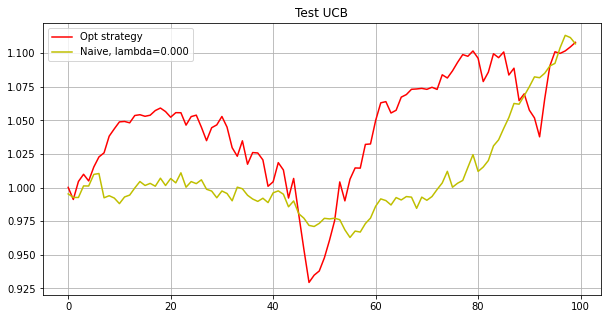

Phase 1
Testing...
./tmp2/res_phase01_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0094 0.0099 0.0108 0.0116 0.0093 0.0086 0.0088 0.0094 0.0107 0.0103
 0.0098 0.0113 0.0107 0.0113 0.0095 0.01   0.0137 0.0099 0.0098 0.0096
 0.0112 0.0095 0.01   0.0104 0.0095 0.0107 0.0096 0.0098 0.0104 0.01
 0.0103 0.0109 0.0101 0.0098 0.0102 0.0101 0.0101 0.0103 0.0097 0.0086
 0.01   0.0104 0.0104 0.0096 0.0101 0.0099 0.0104 0.0098 0.012  0.0095
 0.01   0.0101 0.0096 0.0093 0.0096 0.01   0.0096 0.0098 0.0103 0.0101
 0.0092 0.0099 0.0102 0.0092 0.0095 0.0111 0.0092 0.0103 0.0099 0.0095
 0.0094 0.01   0.0098 0.0091 0.0097 0.0099 0.0101 0.011  0.0106 0.0106
 0.0097 0.0099 0.0095 0.0091 0.0096 0.0094 0.01   0.0103 0.01   0.0107
 0.0102 0.01   0.0092 0.0085 0.01   0.01   0.0098 0.0102 0.0105 0.0095]
0.04926192942827259
[0.0079 0.0111 0.0115 0.0166 0.0043 0.0075 0.0093 0.0072 0.0138 0.017
 0.0067 0.0

[ 0.0057  0.0117  0.0121  0.009   0.0013  0.0089  0.0058  0.0049  0.0133
  0.0151  0.007   0.0119  0.0087  0.0058  0.0064  0.0114  0.0037  0.0077
  0.0081  0.0096  0.0156  0.0088  0.0118  0.0138  0.0102  0.0206  0.0084
  0.0115  0.0173  0.0154  0.0091  0.0138  0.0055  0.0166  0.0164  0.0115
  0.0128  0.0109  0.0077  0.0058  0.0106  0.0218  0.013   0.008   0.0105
  0.0073  0.0086  0.0103  0.0061  0.0112  0.0128  0.0108  0.0049  0.0103
  0.005   0.01    0.0118  0.0095  0.0045  0.0134  0.0086  0.0101  0.0083
  0.0102  0.0095 -0.      0.0133  0.0079  0.01    0.008   0.0067  0.0105
  0.0096  0.006   0.0122  0.0105  0.0116  0.0116  0.0114  0.0111  0.0096
  0.0092  0.0075  0.0026  0.0068  0.007   0.009   0.0105  0.0133  0.0117
  0.013   0.0133  0.0048  0.0124  0.0102  0.013   0.0087  0.0129  0.0098
  0.0159]
0.07583037887806167
[ 0.0057  0.0117  0.0121  0.009   0.0013  0.0089  0.0058  0.0049  0.0133
  0.0151  0.007   0.0119  0.0087  0.0058  0.0064  0.0114  0.0037  0.0077
  0.0081  0.0096  0.0

[ 0.0019  0.0093  0.0122  0.0002  0.0029  0.0071 -0.      0.0032  0.0081
  0.0206  0.0049  0.0083  0.0078  0.0123  0.0044  0.0123  0.0006  0.0071
  0.0091  0.023   0.012   0.006   0.0128  0.0169  0.0092  0.0143  0.0072
  0.0128  0.0224  0.0158  0.011   0.0169  0.0042  0.0223  0.0151  0.011
  0.0116  0.0126  0.0063  0.0057  0.0135  0.0227  0.0142  0.0079  0.0134
  0.0101  0.0045  0.0115  0.0025  0.0135  0.0117  0.0115  0.0022  0.0096
  0.0021  0.0097  0.0126  0.0089  0.0003  0.019   0.0102  0.0126  0.0103
  0.0124  0.0072  0.      0.0156  0.0091  0.0113  0.004   0.0035  0.0112
  0.0096  0.0052  0.0133  0.0112  0.0124  0.0143  0.0045  0.013   0.0097
  0.0081  0.0062  0.0051  0.0051  0.0147  0.0047  0.0128  0.0168  0.0118
  0.0146  0.0148  0.0008  0.0133  0.009   0.0099  0.0081  0.0135  0.0118
  0.0156]
3.0642098884823326e-05
[ 0.0019  0.0093  0.0122  0.0002  0.0029  0.0071 -0.      0.0032  0.0081
  0.0206  0.0049  0.0083  0.0078  0.0123  0.0044  0.0123  0.0006  0.0071
  0.0091  0.023   0

[ 0.0012  0.0082  0.0112  0.004   0.0005  0.0068  0.0009  0.0026  0.0088
  0.0203  0.0047  0.0056  0.0084  0.0144  0.003   0.012  -0.      0.0066
  0.0083  0.0233  0.0097  0.0061  0.0133  0.0178  0.0089  0.0169  0.0066
  0.0133  0.0239  0.0157  0.013   0.0184  0.0049  0.0218  0.0155  0.0118
  0.0112  0.0127  0.0059  0.003   0.0136  0.022   0.0146  0.0083  0.0126
  0.0115  0.0036  0.0123  0.0016  0.0143  0.0117  0.0116  0.0011  0.01
  0.0009  0.0092  0.0133  0.0092 -0.      0.0199  0.0115  0.0125  0.0101
  0.0155  0.0056 -0.      0.015   0.0095  0.0113  0.0029  0.0028  0.0115
  0.0098  0.0049  0.0132  0.0113  0.0125  0.0143  0.0014  0.0131  0.0104
  0.0074  0.0063  0.0037  0.0047  0.0179  0.0051  0.0126  0.0165  0.0127
  0.015   0.0139  0.      0.0123  0.0087  0.0095  0.008   0.0134  0.0114
  0.0189]
2.756208915519911e-05
[ 0.0012  0.0082  0.0112  0.004   0.0005  0.0068  0.0009  0.0026  0.0088
  0.0203  0.0047  0.0056  0.0084  0.0144  0.003   0.012   0.      0.0066
  0.0083  0.0233  0.0

[ 0.      0.0087  0.0137 -0.     -0.      0.0106  0.0001 -0.      0.0093
  0.0199  0.0048  0.003   0.0106  0.0144 -0.      0.0117  0.0032  0.0045
  0.0068  0.0238  0.0041  0.0058  0.0145  0.0202  0.0065  0.0163  0.0052
  0.0158  0.0258  0.0154  0.0145  0.0214  0.0018  0.0239  0.0174  0.0146
  0.0115  0.0148  0.0042  0.0038  0.0187  0.0225  0.016   0.0095  0.0123
  0.0144  0.0033  0.0127  0.0047  0.0152  0.0111  0.0125 -0.      0.0102
 -0.      0.0091  0.0148  0.0089  0.      0.0227  0.0108  0.0138  0.0116
  0.0163  0.0058 -0.      0.0149  0.0087  0.0114 -0.     -0.      0.0117
  0.009   0.0012  0.0133  0.0115  0.0124  0.0139  0.      0.0158  0.0101
  0.0076  0.0049  0.0042  0.0027  0.0181  0.0048  0.0086  0.019   0.0107
  0.017   0.0146 -0.      0.0093  0.0076  0.0089  0.0071  0.013   0.0083
  0.0208]
0.00022747903074290667
[ 0.      0.0087  0.0137 -0.     -0.      0.0106  0.0001 -0.      0.0093
  0.0199  0.0048  0.003   0.0106  0.0144 -0.      0.0117  0.0032  0.0045
  0.0068  0.0238  

[-0.      0.0087  0.0137 -0.      0.0001  0.0106  0.0001 -0.      0.0093
  0.0199  0.0047  0.003   0.0106  0.0144  0.      0.0117  0.0032  0.0045
  0.0068  0.0238  0.0041  0.0058  0.0145  0.0202  0.0065  0.0163  0.0052
  0.0158  0.0258  0.0154  0.0145  0.0214  0.0018  0.0239  0.0174  0.0146
  0.0115  0.0148  0.0042  0.0038  0.0187  0.0225  0.016   0.0095  0.0123
  0.0144  0.0033  0.0127  0.0047  0.0152  0.0111  0.0125 -0.      0.0102
  0.      0.0091  0.0148  0.0089 -0.      0.0227  0.0108  0.0138  0.0116
  0.0163  0.0058 -0.      0.0149  0.0087  0.0114  0.      0.      0.0117
  0.009   0.0012  0.0133  0.0115  0.0124  0.0139 -0.      0.0158  0.0101
  0.0076  0.0049  0.0042  0.0027  0.0181  0.0048  0.0085  0.019   0.0107
  0.017   0.0146 -0.      0.0093  0.0076  0.0089  0.0071  0.013   0.0083
  0.0208]
0.00013984857628543266
[-0.      0.0087  0.0137 -0.      0.0001  0.0106  0.0001  0.      0.0093
  0.0199  0.0047  0.003   0.0106  0.0144  0.      0.0117  0.0032  0.0045
  0.0068  0.0238  

[-0.      0.0071  0.0138  0.     -0.      0.0099 -0.     -0.      0.008
  0.0165  0.0039  0.0022  0.0107  0.0208  0.      0.0123  0.0001  0.0028
  0.0061  0.0266  0.0007  0.0002  0.0153  0.0217  0.0057  0.013   0.0046
  0.0177  0.0278  0.0133  0.0145  0.0203 -0.      0.0246  0.0161  0.0132
  0.0123  0.0128  0.0038  0.      0.0225  0.0198  0.0174  0.009   0.0133
  0.0148  0.0009  0.0144  0.0046  0.0169  0.0101  0.0136 -0.      0.0111
 -0.      0.0096  0.0164  0.0087 -0.      0.0233  0.014   0.0151  0.0128
  0.0229  0.0042  0.001   0.0148  0.0057  0.0131  0.0029 -0.      0.0125
  0.0093 -0.      0.0143  0.0118  0.0128  0.0152  0.0004  0.0168  0.0106
  0.0076  0.0036  0.0028  0.0018  0.0229  0.0003  0.0081  0.0192  0.011
  0.0179  0.0159  0.0001  0.0104  0.0062  0.009   0.007   0.0131  0.0098
  0.0184]
5.370707165949797e-05
[-0.      0.0071  0.0138  0.     -0.      0.0099  0.      0.      0.008
  0.0165  0.0039  0.0022  0.0107  0.0208  0.      0.0123  0.0001  0.0028
  0.0061  0.0266  0.00

[ 0.      0.0077  0.0134  0.0006  0.0031  0.0099  0.     -0.      0.01
  0.0153  0.0024  0.0033  0.0113  0.0223  0.      0.0114  0.      0.0013
  0.0056  0.0264  0.0002 -0.      0.0153  0.0227  0.0043  0.0116  0.0041
  0.0186  0.0275  0.014   0.0137  0.0217  0.      0.0226  0.0178  0.0149
  0.0114  0.0134  0.003  -0.      0.0257  0.0181  0.0182  0.0094  0.0136
  0.0143  0.0003  0.0148  0.0059  0.0178  0.0105  0.0136  0.      0.0101
  0.      0.0091  0.0174  0.0084  0.      0.0242  0.0156  0.015   0.0122
  0.026   0.002   0.0012  0.0146  0.0076  0.0129  0.0012 -0.      0.0127
  0.0092  0.      0.0154  0.0119  0.0132  0.0164 -0.      0.0176  0.0111
  0.0071  0.0036  0.0004  0.0007  0.022  -0.      0.005   0.0194  0.0121
  0.0185  0.0163  0.      0.0076  0.006   0.0092  0.0066  0.0123  0.0076
  0.0181]
0.08158438391713145
[ 0.      0.0077  0.0134  0.0006  0.0031  0.0099 -0.     -0.      0.01
  0.0153  0.0024  0.0033  0.0113  0.0223  0.      0.0114  0.      0.0013
  0.0056  0.0264  0.0002 

[-0.      0.0074  0.0179 -0.      0.0024  0.0093  0.0001  0.      0.0098
  0.0144  0.0007  0.003   0.0105  0.0203  0.      0.0123  0.      0.
  0.005   0.0277 -0.      0.0005  0.0156  0.0238  0.0029  0.0135  0.0035
  0.0196  0.0289  0.0135  0.0143  0.0222  0.      0.0206  0.0182  0.0164
  0.0111  0.0113  0.0023  0.0005  0.0249  0.016   0.0186  0.0083  0.0151
  0.0129  0.      0.0154  0.004   0.0181  0.0109  0.014  -0.      0.0105
  0.      0.0082  0.0178  0.0082  0.      0.0256  0.0157  0.015   0.0123
  0.0295  0.0007  0.0019  0.0149  0.0052  0.0129  0.0001  0.0006  0.0128
  0.0088  0.      0.0153  0.012   0.0131  0.0161  0.0001  0.0177  0.0114
  0.0072  0.0027  0.0018 -0.      0.0198  0.0001  0.0027  0.0212  0.0135
  0.0189  0.0163  0.0039  0.0072  0.0048  0.0089  0.0063  0.0139  0.0076
  0.0196]
0.016850960495597898
[-0.      0.0074  0.0179  0.      0.0024  0.0093  0.0001  0.      0.0098
  0.0144  0.0007  0.003   0.0105  0.0203  0.      0.0123  0.      0.
  0.005   0.0277  0.      0.

[ 0.      0.0074  0.0179  0.      0.0024  0.0093  0.      0.      0.0098
  0.0144  0.0007  0.003   0.0105  0.0203  0.      0.0123  0.      0.
  0.005   0.0278  0.      0.0005  0.0156  0.0238  0.0029  0.0135  0.0035
  0.0196  0.0289  0.0135  0.0143  0.0221  0.      0.0206  0.0181  0.0164
  0.0112  0.0113  0.0024  0.0005  0.0249  0.016   0.0186  0.0084  0.0152
  0.0129  0.      0.0154  0.004   0.0181  0.0109  0.014   0.      0.0105
 -0.      0.0082  0.0177  0.0082 -0.      0.0256  0.0157  0.015   0.0123
  0.0295  0.0007  0.0019  0.0149  0.0052  0.013   0.      0.0006  0.0128
  0.0088 -0.      0.0153  0.012   0.0131  0.0161  0.      0.0177  0.0114
  0.0072  0.0027  0.0018 -0.      0.0198  0.      0.0027  0.0212  0.0136
  0.0189  0.0163  0.0039  0.0072  0.0048  0.0089  0.0063  0.0139  0.0076
  0.0196]
5.013156135620629e-05
[ 0.      0.0074  0.0179  0.      0.0024  0.0093  0.      0.      0.0098
  0.0144  0.0007  0.003   0.0105  0.0203  0.      0.0123 -0.      0.
  0.005   0.0278  0.      0

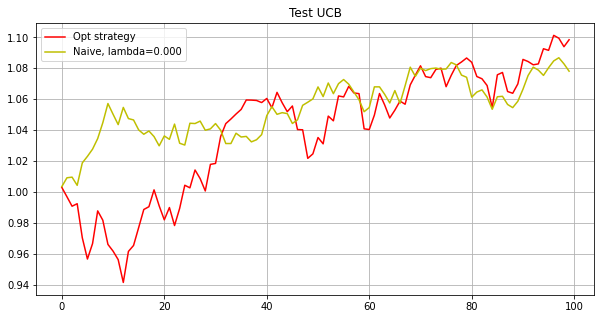

Phase 2
Testing...
./tmp2/res_phase02_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0038 0.0108 0.0114 0.0111 0.0137 0.     0.0095 0.003  0.0098 0.012
 0.0208 0.0115 0.0063 0.0071 0.0093 0.0053 0.01   0.0131 0.0048 0.0097
 0.0086 0.0096 0.0106 0.0061 0.0111 0.0047 0.0168 0.0132 0.0108 0.0058
 0.011  0.0151 0.0088 0.0067 0.0114 0.0084 0.0125 0.0148 0.008  0.0157
 0.0151 0.0102 0.0076 0.0075 0.0124 0.0181 0.0115 0.0104 0.0135 0.0077
 0.0093 0.0114 0.0096 0.0076 0.0109 0.0117 0.0145 0.0037 0.0102 0.009
 0.0018 0.0103 0.0057 0.0129 0.0119 0.008  0.0123 0.0117 0.0092 0.0106
 0.011  0.015  0.0118 0.014  0.0084 0.0104 0.0115 0.0105 0.0098 0.0113
 0.0123 0.0086 0.0085 0.0094 0.0051 0.0134 0.011  0.0124 0.0061 0.011
 0.0106 0.0115 0.0061 0.0079 0.0074 0.0115 0.0079 0.0094 0.0077 0.0097]
0.25205530708117196
[ 0.0026  0.0111  0.0115  0.0074  0.0132 -0.      0.0103  0.0033  0.0096
  0.0117 

[ 0.      0.0136  0.0138 -0.      0.0173  0.0005  0.0114  0.      0.0086
  0.0085  0.0132  0.0134  0.0069  0.0106  0.0027 -0.      0.0105  0.0111
  0.0053  0.015   0.0117  0.0099  0.0123  0.0032  0.0134 -0.      0.018
  0.0185  0.0103  0.0056  0.0103  0.0102  0.0065  0.0021  0.0046  0.0073
  0.0169  0.0208  0.0065  0.0185  0.0173  0.0124  0.0053  0.0048  0.0157
  0.0243  0.0159  0.0127  0.0103  0.01    0.0122  0.0126  0.0084  0.008
  0.0123  0.0162  0.0162  0.0023  0.0099  0.0075 -0.      0.0119  0.0016
  0.018   0.0148  0.0074  0.0132  0.0125  0.0079  0.0112  0.0125  0.0252
  0.0148  0.0177  0.0161  0.008   0.0137  0.0081  0.0078  0.0105  0.0152
  0.0034  0.0065  0.0079 -0.      0.0161  0.0129  0.0161  0.0072  0.0115
  0.0066  0.0123  0.001   0.0052  0.0049  0.0142  0.0019  0.0064  0.0069
  0.0073]
2.7005827641225234e-05
[ 0.      0.0136  0.0138 -0.      0.0173  0.0005  0.0114  0.      0.0086
  0.0085  0.0132  0.0134  0.0069  0.0106  0.0027 -0.      0.0105  0.0111
  0.0053  0.015   0.

[ 0.      0.0155  0.0154 -0.      0.0196  0.0016  0.0105 -0.      0.0067
  0.0063  0.0102  0.0142  0.0048  0.0064  0.0022 -0.      0.0127  0.0083
  0.0097  0.0173  0.0131  0.0062  0.0135  0.0018  0.0131 -0.      0.0167
  0.0227  0.0101  0.0048  0.0056  0.0083  0.0088  0.      0.      0.007
  0.014   0.0268  0.0069  0.0095  0.0223  0.0151  0.0047  0.0017  0.0181
  0.0304  0.0173  0.0159  0.0101  0.0049  0.0114  0.0112  0.0071  0.0104
  0.0146  0.0191  0.0181  0.0036  0.0098  0.      0.      0.0112  0.0036
  0.0213  0.016   0.007   0.0159  0.0131  0.0061  0.0115  0.0154  0.0257
  0.0182  0.017   0.0138  0.0064  0.0158  0.0062  0.0065  0.0115  0.0179
 -0.      0.0043  0.0067 -0.      0.0178  0.0133  0.0188  0.0069  0.0126
  0.0061  0.0131  0.      0.0009  0.0033  0.0185 -0.      0.0043  0.0081
  0.0091]
0.0006485345309410543
[ 0.      0.0155  0.0154 -0.      0.0196  0.0016  0.0105 -0.      0.0067
  0.0063  0.0102  0.0142  0.0048  0.0064  0.0022 -0.      0.0127  0.0083
  0.0097  0.0173  0.

[-0.      0.016   0.0164  0.      0.0213  0.      0.0053  0.0001  0.006
  0.0027  0.003   0.0145  0.0054  0.0062  0.0035 -0.      0.0129  0.0082
  0.0055  0.0189  0.0134  0.0044  0.014  -0.      0.0138 -0.      0.0173
  0.0246  0.01    0.0036  0.0023  0.0059  0.0082  0.      0.      0.0068
  0.0153  0.0289  0.0091  0.0113  0.0196  0.0161  0.0039  0.001   0.0187
  0.0341  0.0185  0.0169  0.0096  0.0059  0.0112  0.0099  0.0056  0.0075
  0.0133  0.0176  0.0189  0.0018  0.01    0.001  -0.      0.0115  0.0036
  0.0221  0.0198  0.0084  0.0165  0.0123  0.0054  0.0122  0.0157  0.0299
  0.0201  0.0177  0.0159  0.0078  0.0165  0.0064  0.0074  0.0112  0.0193
  0.      0.0047  0.0063  0.001   0.0182  0.0152  0.0198  0.0066  0.0126
  0.0065  0.0133 -0.      0.      0.0028  0.0186 -0.      0.0028  0.0076
  0.0084]
1.026224477317114e-05
[-0.      0.016   0.0164  0.      0.0213  0.      0.0053  0.0001  0.006
  0.0027  0.003   0.0145  0.0054  0.0062  0.0035 -0.      0.0129  0.0082
  0.0055  0.0189  0.0

[ 0.      0.0171  0.0176  0.      0.0251  0.0011  0.0062 -0.      0.0047
  0.0026  0.0065  0.0149  0.0074  0.0048  0.0053 -0.      0.0129  0.01
  0.0055  0.0197  0.012   0.004   0.0117 -0.      0.0146 -0.      0.0168
  0.0272  0.0085  0.0002 -0.      0.0109  0.007   0.0016 -0.      0.0069
  0.0132  0.0311  0.0081  0.0128  0.0193  0.0162  0.0032 -0.      0.0189
  0.0315  0.0194  0.0158  0.0118  0.0041  0.0049  0.0101  0.0078  0.005
  0.0106  0.0169  0.0201 -0.      0.0097  0.0016 -0.      0.0086  0.0033
  0.0241  0.0248  0.0058  0.0177  0.0114  0.0085  0.0124  0.0178  0.0287
  0.0183  0.0186  0.0134  0.0066  0.0175  0.0054  0.007   0.0099  0.0201
  0.0029  0.0034  0.0051  0.0023  0.0179  0.0174  0.0216  0.0058  0.0139
  0.0056  0.0139 -0.      0.      0.0025  0.0202 -0.      0.0009  0.0054
  0.0066]
0.029748037051377744
[-0.      0.0171  0.0176 -0.      0.0251  0.0011  0.0062  0.      0.0047
  0.0026  0.0065  0.0149  0.0074  0.0048  0.0053 -0.      0.0129  0.01
  0.0055  0.0197  0.012  

[-0.      0.0173  0.0179  0.      0.0247  0.0004  0.0089  0.      0.0041
  0.0027  0.0037  0.0149  0.008   0.0038  0.0049 -0.      0.0129  0.0105
  0.0046  0.0197  0.0123  0.0046  0.0116 -0.      0.0146 -0.      0.0161
  0.0277  0.0084  0.     -0.      0.0087  0.0082  0.0017  0.0013  0.0067
  0.0134  0.0306  0.0082  0.0104  0.0191  0.0162  0.003   0.0008  0.0193
  0.0327  0.0193  0.0158  0.012   0.004   0.0046  0.0104  0.0068  0.0062
  0.0095  0.0175  0.02    0.0003  0.0098  0.0016  0.      0.0089  0.0046
  0.0247  0.0249  0.0057  0.0176  0.0112  0.0084  0.0126  0.0181  0.0296
  0.0188  0.0179  0.0146  0.0066  0.0177  0.005   0.0065  0.0099  0.0199
  0.0017  0.0029  0.0049  0.0033  0.0184  0.0175  0.0218  0.0055  0.0141
  0.0053  0.0138 -0.      0.0001  0.0021  0.0201  0.0002  0.0009  0.0054
  0.0062]
0.0003084558521881808
[-0.      0.0173  0.0179 -0.      0.0247  0.0004  0.0089  0.      0.0041
  0.0027  0.0037  0.0149  0.008   0.0038  0.0049 -0.      0.0129  0.0105
  0.0046  0.0197  0

[-0.      0.019   0.0186  0.      0.0249 -0.      0.0095 -0.      0.0032
  0.0017  0.006   0.0153  0.0072  0.0029  0.0068  0.      0.0133  0.0101
  0.0026  0.0191  0.012   0.0046  0.011   0.      0.0147  0.      0.0154
  0.0287  0.0088  0.      0.0005  0.0087  0.0071  0.0028  0.      0.0059
  0.0135  0.0306  0.0086  0.0094  0.0201  0.0165  0.003  -0.      0.0201
  0.0323  0.02    0.0155  0.0119  0.0032  0.0042  0.0099  0.0058  0.006
  0.0079  0.0172  0.0205 -0.      0.0097  0.0023  0.0026  0.0092  0.0039
  0.0247  0.0247  0.005   0.018   0.011   0.0092  0.0126  0.0143  0.0314
  0.0197  0.0174  0.0166  0.0064  0.0179  0.0051  0.0067  0.0107  0.0205
  0.      0.0026  0.0044  0.0026  0.0186  0.0181  0.0224  0.005   0.0147
  0.0042  0.014  -0.      0.0004  0.0012  0.0203  0.0026  0.0008  0.0052
  0.0065]
3.435249514768727e-05
[-0.      0.019   0.0186  0.      0.0249 -0.      0.0095 -0.      0.0032
  0.0017  0.006   0.0153  0.0072  0.0029  0.0068 -0.      0.0133  0.0101
  0.0026  0.0191  0.

[-0.      0.0204  0.0208 -0.      0.0262 -0.      0.0105 -0.     -0.
  0.0023  0.0007  0.0162  0.0046  0.0019  0.0041 -0.      0.0132  0.0099
  0.0007  0.0194  0.0087  0.0054  0.0094 -0.      0.0149 -0.      0.0169
  0.0308  0.0084  0.0008 -0.      0.0067  0.0104  0.0079  0.0013  0.0047
  0.0135  0.0278  0.0103 -0.      0.0143  0.0173  0.0035 -0.      0.0204
  0.0293  0.0205  0.0146  0.0137  0.0038  0.0045  0.0112  0.0042  0.0064
  0.0045  0.0168  0.0202  0.0005  0.0101  0.0003 -0.      0.0085  0.0033
  0.0275  0.0248  0.0011  0.0186  0.0111  0.0056  0.0133  0.0188  0.0358
  0.0224  0.02    0.0185  0.0084  0.019   0.0043  0.0047  0.0119  0.0221
 -0.      0.0015  0.0041  0.0009  0.0205  0.0202  0.0234  0.0047  0.0163
  0.0028  0.0141  0.0007  0.0066  0.0002  0.0212  0.0047  0.0013  0.0052
  0.007 ]
0.012488660008581426
[-0.      0.0204  0.0208  0.      0.0262 -0.      0.0105 -0.     -0.
  0.0023  0.0007  0.0162  0.0046  0.0019  0.0041 -0.      0.0132  0.0099
  0.0007  0.0194  0.0087  0.

[-0.      0.0223  0.0231  0.      0.0274  0.0055  0.      0.      0.
  0.004   0.0055  0.0164  0.0032  0.0028  0.0025  0.      0.0131  0.0093
  0.0012  0.022   0.0025  0.      0.0136  0.      0.0146  0.      0.0178
  0.0343  0.0077 -0.      0.      0.006   0.0129  0.0132 -0.      0.0036
  0.0024  0.0273  0.0039  0.      0.018   0.0224  0.0036 -0.      0.0233
  0.0276  0.0208  0.0145  0.016   0.0036  0.005   0.0127  0.0058  0.003
  0.003   0.0156  0.0171 -0.      0.0107 -0.      0.0044  0.0043  0.0055
  0.0276  0.0222  0.0003  0.019   0.0107  0.0094  0.0142  0.0248  0.0336
  0.0207  0.0128  0.0219  0.0004  0.0204  0.0021  0.0055  0.0119  0.0258
  0.0064 -0.      0.0027 -0.      0.0203  0.0219  0.0254  0.0041  0.0189
  0.0041  0.015  -0.      0.     -0.      0.02    0.004  -0.      0.0043
  0.0143]
0.00028680715609820254
[ 0.      0.0227  0.0234  0.0002  0.0271  0.0037 -0.     -0.     -0.
  0.0047  0.0092  0.0164  0.0025  0.0029  0.0022 -0.      0.0133  0.0091
  0.0008  0.0221  0.0024 -0

[ 0.      0.0228  0.0238 -0.      0.0279  0.0032 -0.      0.     -0.
  0.0047  0.008   0.0165  0.002   0.0027  0.0018 -0.      0.0136  0.0095
  0.0003  0.0232  0.0022  0.0007  0.0136  0.0001  0.015   0.      0.0186
  0.0356  0.0071  0.      0.      0.0038  0.0121  0.0121  0.      0.0028
 -0.      0.0299  0.0045  0.0019  0.0167  0.0225  0.0025 -0.      0.0239
  0.0279  0.021   0.0157  0.0169  0.003   0.0034  0.0139  0.005   0.003
  0.0034  0.0152  0.0177  0.0003  0.0108  0.0011  0.0061  0.0033  0.0036
  0.0285  0.0211 -0.      0.0193  0.0106  0.0083  0.0144  0.0239  0.0336
  0.0218  0.0115  0.0246  0.0011  0.021   0.0013  0.0058  0.0119  0.0262
  0.0059 -0.      0.0023  0.0001  0.0207  0.0215  0.0262  0.0035  0.0189
  0.0039  0.0152 -0.     -0.     -0.      0.02    0.0024  0.      0.003
  0.0145]
0.00020301392135611503
[ 0.      0.0229  0.0238  0.      0.0279  0.0032  0.     -0.     -0.
  0.0047  0.008   0.0165  0.002   0.0027  0.0018 -0.      0.0136  0.0095
  0.0003  0.0232  0.0022  0.

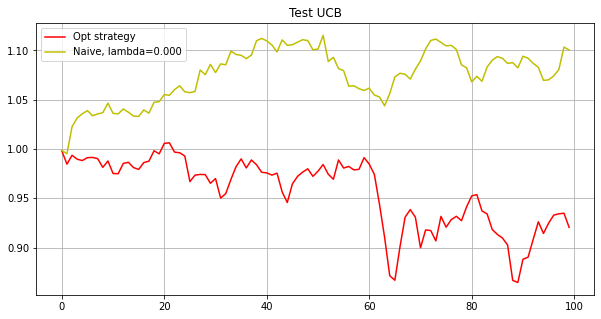

Phase 3
Testing...
./tmp2/res_phase03_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.013   0.0109  0.0048 -0.      0.      0.0073  0.0173  0.0022  0.0175
  0.0033  0.0073  0.0292  0.0159  0.0128  0.0096  0.0154  0.0093  0.0128
  0.0065  0.0109  0.0004  0.      0.0044 -0.      0.      0.      0.0207
  0.0036  0.0015  0.0153  0.0266  0.      0.01    0.0172  0.0002  0.011
  0.004   0.002   0.0113  0.0039  0.0067  0.0068  0.0095  0.0082  0.0261
  0.0059  0.0072  0.0054  0.0115  0.01    0.01    0.0107  0.0096  0.0069
  0.0045  0.0034  0.0197  0.0082  0.0082  0.0114  0.012   0.0171  0.0121
  0.0148  0.0113  0.0088  0.0144  0.0123  0.0116  0.009   0.007   0.0116
  0.0196  0.008   0.0074  0.0103  0.0027  0.0155  0.014   0.0078  0.0079
  0.0096  0.0129  0.0094  0.0109 -0.      0.0366  0.0098  0.0137  0.0187
  0.0081  0.0103  0.0098  0.014   0.0163  0.0082  0.0099  0.0133  0.0121
  0.0128

[ 0.0175  0.0067 -0.      0.0037  0.     -0.      0.0265  0.0012  0.0267
 -0.      0.0001  0.      0.0007 -0.     -0.     -0.     -0.      0.007
  0.026  -0.      0.0014  0.0111  0.     -0.      0.      0.0005  0.0204
 -0.      0.0018  0.0283  0.0378 -0.     -0.      0.0018  0.0031  0.
  0.0029  0.      0.0262  0.0013 -0.      0.0139  0.0077 -0.      0.0033
 -0.      0.0001  0.0001  0.0144  0.0127  0.0129  0.0033  0.0087  0.0057
  0.0006 -0.      0.0211  0.0132  0.021   0.0083  0.0229  0.0295  0.0016
  0.0238  0.0151  0.0195  0.0075  0.011   0.0104  0.0108  0.      0.0104
  0.035   0.012  -0.      0.0008  0.0143  0.0278  0.0071  0.0063  0.0013
  0.0199  0.0205  0.0002  0.008  -0.      0.067   0.0108  0.0163  0.0178
  0.0068  0.0044  0.0089  0.0232  0.027   0.026   0.0118  0.0048  0.0348
  0.0248]
0.0978621655852614
[ 0.0173  0.0052 -0.     -0.      0.      0.      0.026  -0.      0.0241
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.003
  0.0222 -0.      0.0009 -0.

[ 0.0179  0.0016  0.      0.      0.004   0.      0.0342  0.0011  0.0175
 -0.      0.0004  0.0017 -0.     -0.     -0.     -0.     -0.     -0.
  0.0327 -0.     -0.     -0.     -0.      0.      0.      0.0042  0.0259
 -0.     -0.      0.0316  0.0312 -0.      0.     -0.     -0.     -0.
  0.0065  0.0001  0.0232  0.001  -0.      0.0211  0.0018 -0.     -0.
  0.     -0.      0.      0.0197  0.0094  0.0094  0.      0.0071  0.0124
  0.0133  0.0075  0.0265  0.009   0.0218  0.0006  0.0418  0.0384  0.0024
  0.025   0.0166  0.0156 -0.      0.0048  0.0072  0.0069  0.      0.0119
  0.0324 -0.      0.      0.0126  0.0281  0.0345  0.0009  0.0127  0.0064
  0.0226  0.0227 -0.      0.0045  0.      0.0758  0.0003  0.0179  0.0172
  0.0066  0.      0.0027  0.0258  0.0266  0.0157  0.0046  0.      0.0367
  0.0279]
0.0001259084327456223
[ 0.0178  0.0016  0.      0.      0.004  -0.      0.0341  0.0011  0.0175
  0.      0.0004  0.0017  0.     -0.     -0.     -0.      0.      0.
  0.0327  0.      0.      0.      0

[ 0.0168 -0.      0.      0.0111  0.      0.      0.04    0.      0.0049
 -0.      0.      0.      0.0024 -0.     -0.      0.     -0.     -0.
  0.0324 -0.     -0.     -0.     -0.      0.002  -0.      0.0184  0.0159
 -0.      0.0014  0.0339  0.0351  0.      0.     -0.      0.015  -0.
  0.     -0.      0.0283  0.      0.0013  0.0107 -0.     -0.      0.0078
 -0.     -0.     -0.      0.0205  0.0067  0.0142 -0.      0.0031  0.0252
 -0.      0.014   0.0386  0.014   0.0218  0.      0.0422  0.0453  0.
  0.0233  0.0228  0.0049 -0.     -0.      0.0036  0.0071 -0.      0.0126
  0.029   0.     -0.      0.0115  0.0226  0.0397  0.      0.0208  0.0036
  0.0235  0.0259 -0.      0.      0.      0.0655  0.      0.0116  0.0144
  0.0025 -0.      0.0015  0.0281  0.0251  0.0004  0.0115 -0.      0.0332
  0.0324]
0.270327229170081
[ 0.0166 -0.      0.      0.0043  0.      0.      0.0397 -0.      0.0046
  0.      0.      0.0084 -0.      0.      0.      0.      0.      0.0006
  0.0344 -0.      0.      0.0011 -0

[ 0.0161 -0.     -0.     -0.     -0.     -0.      0.0403 -0.      0.0064
  0.      0.      0.0018 -0.      0.     -0.      0.     -0.      0.
  0.0349  0.      0.      0.0011 -0.      0.0027  0.0016  0.0151  0.0142
  0.0004  0.      0.0356  0.0349 -0.      0.     -0.      0.0104  0.
  0.0001  0.      0.0277  0.0073 -0.      0.0085  0.      0.      0.0047
  0.      0.      0.0042  0.0211  0.0051  0.0168 -0.      0.0033  0.0252
  0.0006  0.0135  0.036   0.016   0.0213  0.0009  0.0492  0.0478  0.0013
  0.0248  0.0223  0.0093  0.      0.      0.0024  0.0054  0.0003  0.0147
  0.0295  0.     -0.      0.0108  0.0213  0.0412  0.      0.0201  0.0023
  0.0231  0.0259  0.      0.      0.0021  0.0654  0.      0.0115  0.0136
  0.      0.      0.0007  0.0285  0.0242  0.      0.0114  0.      0.0316
  0.0316]
0.07681829278547195
[ 0.0161 -0.     -0.     -0.     -0.      0.      0.0403 -0.      0.0064
  0.      0.      0.0018  0.      0.      0.      0.      0.      0.
  0.0349  0.     -0.      0.0011 

[ 0.0155  0.      0.      0.0147  0.      0.      0.0406 -0.      0.0084
 -0.      0.002   0.      0.0016  0.      0.      0.      0.      0.002
  0.0287 -0.      0.     -0.      0.      0.      0.      0.0067  0.0152
 -0.      0.0041  0.0365  0.0344 -0.     -0.     -0.      0.0038  0.0019
 -0.     -0.      0.0288  0.0077 -0.      0.0149  0.      0.0001  0.0033
  0.     -0.      0.0044  0.0215  0.0066  0.0178 -0.      0.001   0.0256
 -0.      0.0069  0.0365  0.015   0.0204  0.      0.053   0.0488  0.
  0.0262  0.0215  0.0097 -0.      0.0005  0.0009  0.0049  0.      0.0134
  0.0343  0.      0.      0.0156  0.0183  0.0425  0.      0.0091 -0.
  0.0246  0.0253 -0.      0.      0.      0.0647  0.      0.0117  0.0125
 -0.     -0.      0.      0.0293  0.0328 -0.      0.0111  0.      0.0313
  0.0313]
0.0002939356256712605
[ 0.0155  0.      0.      0.0147  0.      0.      0.0406 -0.      0.0084
 -0.      0.002  -0.      0.0016  0.      0.      0.      0.      0.002
  0.0287 -0.      0.     -0. 

[ 0.017   0.      0.      0.0177  0.      0.      0.0425 -0.      0.0125
 -0.      0.0001 -0.      0.0011 -0.     -0.     -0.     -0.      0.0024
  0.0447 -0.     -0.     -0.     -0.      0.     -0.      0.      0.0138
 -0.      0.0173  0.0381  0.0256  0.      0.      0.0032  0.0104 -0.
 -0.     -0.      0.0081  0.      0.      0.0019 -0.      0.0047  0.
 -0.      0.0056 -0.      0.0189  0.0075  0.0204 -0.     -0.      0.0335
  0.0101 -0.      0.0483  0.0039  0.0117  0.      0.0406  0.0561 -0.
  0.0265  0.0172  0.0261  0.      0.0026  0.      0.0047 -0.      0.0203
  0.0267  0.     -0.      0.0065  0.0178  0.047  -0.     -0.      0.
  0.0226  0.0249 -0.     -0.     -0.      0.0807  0.0101  0.0166  0.0039
  0.0018  0.      0.      0.0361  0.0353  0.      0.0009 -0.      0.0294
  0.0245]
0.0001679057727710402
[ 0.017   0.      0.      0.0176  0.      0.      0.0425  0.      0.0125
  0.      0.0001  0.      0.0011  0.     -0.      0.     -0.      0.0024
  0.0447  0.     -0.      0.     -0

[ 0.017   0.      0.      0.0137  0.      0.      0.0429  0.      0.0134
 -0.      0.      0.      0.0014  0.      0.      0.     -0.      0.0013
  0.043   0.      0.0001  0.0047  0.     -0.     -0.     -0.      0.0149
  0.      0.0162  0.0389  0.0271  0.      0.      0.003   0.0076  0.0002
  0.      0.0007  0.009   0.0001  0.      0.0015  0.      0.0032  0.
  0.      0.      0.0013  0.0195  0.0069  0.02    0.0008  0.      0.0349
  0.0095  0.      0.0471  0.0046  0.0113  0.0016  0.0413  0.0565  0.0006
  0.0266  0.0163  0.026   0.      0.001   0.      0.0044 -0.      0.0199
  0.029  -0.      0.      0.0071  0.0179  0.0475  0.      0.0008  0.
  0.0233  0.0246  0.      0.      0.      0.0808  0.01    0.0163  0.0041
  0.0013 -0.     -0.      0.0359  0.0371  0.      0.001   0.      0.0287
  0.0245]
8.49269716022006e-05
[ 0.0169  0.      0.      0.0137 -0.     -0.      0.0429  0.      0.0134
 -0.     -0.     -0.      0.0014 -0.      0.      0.      0.      0.0013
  0.043   0.      0.0001  0.

[ 0.017   0.     -0.      0.0137 -0.     -0.      0.0429 -0.      0.0134
 -0.      0.      0.      0.0014 -0.     -0.     -0.     -0.      0.0013
  0.043  -0.      0.0001  0.0047  0.     -0.     -0.      0.      0.0149
  0.      0.0162  0.0389  0.0271 -0.      0.      0.003   0.0076  0.0002
  0.      0.0007  0.009   0.0001 -0.      0.0015  0.      0.0032 -0.
 -0.      0.      0.0013  0.0195  0.0069  0.02    0.0008 -0.      0.0349
  0.0095  0.      0.0471  0.0046  0.0113  0.0016  0.0413  0.0565  0.0006
  0.0266  0.0163  0.026   0.      0.001  -0.      0.0044 -0.      0.0199
  0.029  -0.     -0.      0.0071  0.0179  0.0475  0.      0.0008 -0.
  0.0233  0.0246 -0.     -0.      0.      0.0808  0.01    0.0163  0.0041
  0.0013 -0.      0.      0.0359  0.0371  0.      0.001   0.      0.0287
  0.0245]
0.00014141270506578586
[ 0.017   0.     -0.      0.0137 -0.     -0.      0.0429  0.      0.0134
 -0.      0.      0.      0.0014  0.      0.      0.     -0.      0.0013
  0.043   0.      0.0001  

[ 0.0163 -0.     -0.     -0.      0.      0.      0.045   0.0009  0.0087
 -0.     -0.      0.0004  0.      0.     -0.     -0.     -0.     -0.
  0.0438 -0.      0.     -0.     -0.      0.0044 -0.      0.006   0.0126
  0.0005  0.0222  0.042   0.0292  0.0001  0.0121 -0.     -0.     -0.
  0.0029  0.      0.0006  0.     -0.      0.0032 -0.     -0.     -0.
 -0.     -0.      0.0034  0.0218  0.0055  0.0172  0.0021  0.0003  0.0364
  0.0063 -0.      0.0459  0.0108  0.0094  0.0084  0.0393  0.0592 -0.
  0.0279  0.0128  0.0253 -0.      0.      0.      0.0081  0.      0.0179
  0.0315 -0.     -0.      0.0021  0.018   0.049   0.      0.0095  0.0005
  0.0254  0.0248  0.     -0.      0.0015  0.0771  0.0068  0.0155  0.0031
  0.     -0.     -0.      0.0356  0.0346  0.0036  0.0011 -0.      0.0252
  0.0263]
0.06873706110798457
[ 0.0162  0.      0.      0.0017 -0.     -0.      0.0449  0.0013  0.01
 -0.      0.      0.      0.0006  0.      0.      0.      0.      0.0007
  0.0446  0.      0.      0.     -0.   

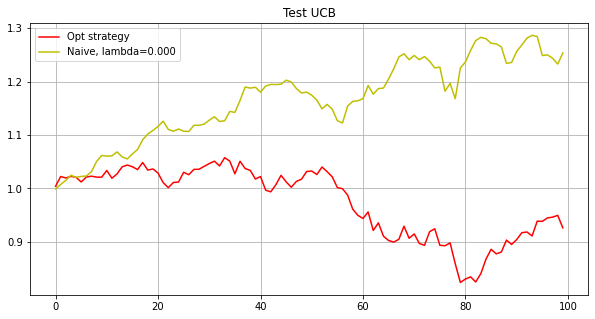

Phase 4
Testing...
./tmp2/res_phase04_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.0115  0.0117  0.0169  0.      0.0146  0.0039  0.0113  0.0043
  0.0089  0.0076  0.0069  0.0096  0.0042  0.0021 -0.      0.0073  0.0095
  0.011   0.0138  0.0017  0.0084  0.0085  0.0126  0.004   0.      0.0097
  0.0166  0.0076  0.0216  0.0085  0.004   0.0091  0.0119  0.011   0.0072
  0.0147  0.0054  0.0092  0.0128  0.0086  0.0072  0.039   0.0042  0.0128
  0.0116  0.0075  0.0214  0.0052  0.0129  0.0071  0.0093  0.0143  0.0232
  0.0113  0.0164  0.0125  0.0098  0.0089  0.0109  0.014   0.0009  0.0022
  0.0157  0.0075  0.0049  0.0126  0.0157  0.0063  0.0092  0.0166  0.0051
 -0.      0.0115  0.0042  0.0215  0.0138  0.017   0.0138  0.0116  0.0135
  0.0092  0.0119  0.0173  0.0079  0.      0.0159  0.0088  0.0102  0.0063
  0.0104  0.0112  0.0162  0.0158  0.0055  0.01    0.0044  0.0017  0.0145
  0.011

[-0.      0.0136  0.0133  0.0052  0.0016  0.0265 -0.      0.004  -0.
 -0.      0.      0.      0.0004  0.      0.0199  0.0406 -0.      0.
  0.      0.0098  0.0015 -0.     -0.      0.0195  0.008   0.0078  0.0085
  0.0114  0.      0.0348  0.     -0.      0.0143  0.0016  0.0027 -0.
  0.0232  0.0009  0.0008  0.      0.0045  0.0171  0.0529  0.0098  0.0181
  0.008   0.004   0.0021  0.      0.0095 -0.      0.0066  0.0239  0.0459
  0.0095  0.0018  0.004   0.0002  0.0011  0.0025  0.0225  0.0018 -0.
  0.0123  0.0088  0.      0.0358  0.0337  0.0018  0.0183  0.0169  0.0006
  0.004   0.0122  0.0005  0.0365  0.0175  0.0327  0.0189  0.0142  0.0135
  0.0076  0.01    0.0211 -0.      0.0019  0.0327  0.      0.0053  0.019
  0.0157  0.0127  0.0128  0.0132  0.      0.0148  0.0045 -0.      0.0321
  0.0027]
0.0520496355604526
[ 0.      0.0141  0.0138  0.004  -0.      0.0288 -0.      0.004   0.
  0.      0.0019 -0.     -0.     -0.      0.0048  0.0521 -0.     -0.
 -0.      0.0106  0.0027 -0.     -0.      0.017

[ 0.0009  0.0112  0.0103  0.      0.0027  0.0278  0.      0.0083  0.
  0.     -0.      0.0054  0.0022 -0.      0.0018  0.0091  0.      0.
  0.0091  0.0037  0.0041  0.      0.      0.0404  0.      0.0011  0.0071
  0.      0.0035  0.0095  0.      0.      0.0116  0.      0.      0.
  0.0539  0.      0.0034  0.      0.0316  0.0016  0.0272  0.0131  0.0161
  0.0026  0.      0.      0.      0.      0.0006  0.0008  0.0346  0.0385
  0.      0.      0.004  -0.     -0.      0.      0.0311  0.0009  0.
  0.001   0.0237  0.      0.0295  0.0494  0.0118  0.0286  0.007   0.
  0.0202  0.0022  0.      0.0552  0.0215  0.0396  0.016   0.012   0.
  0.0103  0.0044  0.0504  0.      0.0042  0.0534  0.      0.      0.0291
  0.0158  0.0067  0.0065  0.0161  0.      0.019   0.      0.0052  0.029
  0.0027]
0.09632913203009527
[ 0.0008  0.0112  0.0103  0.      0.0027  0.0278  0.      0.0083  0.
  0.     -0.      0.0054  0.0022 -0.      0.0018  0.0091  0.     -0.
  0.0091  0.0037  0.0041 -0.      0.      0.0404  0.  

[ 0.      0.0067  0.0037  0.0015  0.0073  0.0208 -0.      0.0009  0.
 -0.      0.      0.     -0.     -0.      0.0043 -0.      0.0079 -0.
 -0.      0.0068 -0.     -0.     -0.     -0.     -0.     -0.      0.0069
  0.0008  0.0101 -0.     -0.      0.0129  0.0079  0.0009 -0.     -0.
  0.0647  0.0016  0.0014  0.0276  0.0402  0.0025  0.0015  0.0197  0.0113
 -0.      0.0016  0.013   0.      0.     -0.     -0.      0.0301  0.0627
  0.0203  0.      0.0095 -0.     -0.      0.0019  0.0301  0.0108 -0.
  0.0004  0.0422 -0.      0.0241  0.0665  0.0114  0.027   0.0026 -0.
  0.0174 -0.      0.001   0.0323  0.0177  0.044   0.0162  0.0076 -0.
  0.0115  0.0027  0.043  -0.      0.0016  0.0643  0.     -0.      0.0139
  0.0024  0.0007  0.01    0.0161 -0.      0.0056  0.      0.0195  0.046
  0.0025]
0.09997042136828202
[-0.      0.0062  0.0031 -0.      0.      0.0205 -0.      0.     -0.
  0.      0.     -0.     -0.     -0.      0.0107  0.0036  0.0097  0.
  0.0035  0.0143  0.0062 -0.     -0.      0.     -0.  

[-0.      0.0037  0.0006  0.0008  0.0028  0.0245  0.     -0.      0.
  0.      0.      0.     -0.     -0.      0.      0.0064  0.0043  0.0038
  0.0005  0.0136  0.0091  0.      0.      0.0179  0.0115  0.      0.0003
 -0.      0.0009  0.0004 -0.      0.0128  0.0163 -0.      0.     -0.
  0.0634  0.     -0.      0.0003  0.0346  0.0132  0.0146  0.0204  0.0101
  0.0122 -0.      0.0032 -0.      0.0045 -0.     -0.      0.0329  0.0495
  0.0075  0.0039  0.0008 -0.     -0.      0.0006  0.0307  0.0004 -0.
  0.0006  0.0529 -0.      0.0276  0.0754  0.0095  0.0289  0.0099  0.0001
  0.0098 -0.      0.      0.0257  0.0177  0.0431  0.0138  0.0056  0.0003
  0.0107  0.0007  0.0355 -0.     -0.      0.0823 -0.      0.      0.0121
  0.0034 -0.      0.0132  0.011  -0.      0.0027  0.0004  0.0176  0.0562
  0.    ]
0.04215778180543187
[-0.      0.0037  0.0006  0.0008  0.0028  0.0245  0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.0064  0.0043  0.0038
  0.0005  0.0136  0.0091 -0.      0. 

[ 0.      0.0004  0.0003  0.013   0.0014  0.03   -0.      0.0125 -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0209 -0.     -0.
  0.0003  0.0111  0.0056  0.      0.      0.0018  0.     -0.      0.0054
  0.      0.0114  0.     -0.      0.      0.0192  0.0018  0.     -0.
  0.0651 -0.      0.0092 -0.      0.0458  0.004   0.0031  0.0423  0.0084
  0.0091 -0.      0.0081 -0.      0.0065  0.     -0.      0.0373  0.0245
  0.0066  0.     -0.      0.     -0.     -0.      0.0312  0.0023 -0.
  0.      0.0379 -0.      0.0211  0.0853  0.0068  0.0377  0.0059 -0.
  0.0116  0.0175  0.0001  0.0128  0.018   0.0524  0.022   0.0026  0.0006
  0.01    0.0005  0.0177 -0.      0.      0.0951  0.0002 -0.      0.0055
  0.002   0.0005  0.0318  0.0029 -0.      0.0063  0.0006 -0.      0.0557
  0.0003]
0.0004098467903554268
[ 0.0055  0.0004  0.      0.012  -0.      0.0305 -0.      0.0153 -0.
 -0.     -0.     -0.      0.      0.      0.0148  0.025   0.     -0.
 -0.      0.0126  0.001  -0.     -0.     -0.   

[ 0.0105  0.     -0.     -0.      0.011   0.0283 -0.      0.0111 -0.
 -0.      0.     -0.     -0.     -0.      0.0201  0.0216  0.      0.0025
  0.0002  0.0049 -0.     -0.     -0.      0.0183 -0.     -0.      0.0062
 -0.      0.0117  0.0065 -0.     -0.      0.0197 -0.     -0.     -0.
  0.0747  0.      0.0068 -0.      0.0284  0.023  -0.      0.0423  0.0089
  0.0022  0.002  -0.     -0.     -0.     -0.     -0.      0.0329  0.0362
  0.     -0.      0.0048 -0.     -0.      0.0002  0.0339  0.0017 -0.
 -0.      0.0285 -0.      0.01    0.0955  0.0219  0.0279 -0.     -0.
  0.015   0.0206 -0.      0.0088  0.012   0.0522  0.0105  0.     -0.
  0.0088 -0.     -0.     -0.      0.0004  0.1073 -0.     -0.      0.0179
  0.0001  0.0003  0.031  -0.      0.0019 -0.      0.      0.      0.0589
 -0.    ]
0.09623074626564741
[ 0.0013  0.0002  0.      0.      0.0061  0.0287 -0.      0.0111 -0.
 -0.      0.      0.      0.      0.      0.0176  0.0225  0.0003  0.0022
  0.0001  0.0051  0.      0.     -0.      0.0

[ 0.      0.0017  0.0011  0.      0.013   0.0285  0.      0.0076  0.
 -0.      0.      0.0011 -0.     -0.     -0.      0.0058  0.0045 -0.
 -0.      0.0068 -0.     -0.     -0.      0.0154 -0.      0.0212  0.0039
  0.0005 -0.      0.0026  0.      0.0022  0.0265  0.0033  0.     -0.
  0.0707  0.0002  0.0029  0.0061  0.0266  0.0152  0.0077  0.0526  0.007
  0.009   0.      0.0006 -0.      0.0018 -0.      0.0012  0.0384  0.0258
  0.0048 -0.      0.     -0.     -0.      0.0025  0.0375  0.0058  0.0018
  0.0016  0.0184  0.0014  0.0184  0.1015  0.0225  0.0268  0.0084 -0.
 -0.      0.0037 -0.      0.0022  0.0146  0.053   0.0088  0.0002 -0.
  0.0094  0.0007  0.002  -0.     -0.      0.1079 -0.     -0.      0.023
  0.0111  0.0002  0.0362  0.0007 -0.     -0.     -0.     -0.      0.0634
 -0.    ]
0.12514431946312646
[ 0.0001  0.0017  0.0012  0.      0.0129  0.0284  0.      0.0076  0.
  0.      0.      0.0011  0.      0.      0.      0.0058  0.0045  0.
  0.      0.0068  0.      0.      0.      0.0154  0

[ 0.      0.0022  0.0001  0.0182  0.0143  0.0185 -0.      0.0149  0.
 -0.      0.      0.      0.      0.      0.0284  0.0086 -0.      0.
 -0.      0.0071  0.0027 -0.     -0.      0.0069 -0.      0.0061 -0.
  0.     -0.     -0.     -0.      0.0001  0.0372 -0.     -0.     -0.
  0.0573  0.     -0.     -0.     -0.      0.0174  0.0182  0.0253  0.003
  0.      0.0099  0.0043 -0.      0.     -0.     -0.      0.0351  0.0034
  0.0283 -0.      0.0175 -0.      0.0017 -0.      0.0403  0.0094  0.0002
 -0.      0.0135  0.0006  0.03    0.1099  0.0397  0.0245 -0.      0.0003
 -0.     -0.     -0.     -0.      0.0162  0.0609  0.0094 -0.      0.0029
  0.0086 -0.      0.     -0.     -0.      0.1157  0.0048 -0.      0.0341
  0.      0.0017  0.0219  0.0005 -0.     -0.     -0.      0.0013  0.0601
  0.0066]
0.2939037641332531
[ 0.0047  0.0013 -0.      0.0176  0.0159  0.0191 -0.      0.0163 -0.
 -0.     -0.     -0.     -0.     -0.      0.0203  0.0125  0.0002  0.
  0.      0.0044 -0.     -0.      0.      0.005

[-0.      0.0016  0.     -0.      0.      0.0299 -0.      0.0143  0.
  0.     -0.     -0.      0.0004  0.     -0.      0.0003  0.0041  0.0028
 -0.      0.0057  0.0057  0.     -0.      0.      0.0006 -0.      0.0024
 -0.      0.0016  0.0003 -0.      0.0013  0.0437  0.0007 -0.      0.
  0.0613 -0.      0.0026  0.0145  0.0008  0.0182  0.0085  0.0479  0.002
  0.004   0.0069  0.0011  0.     -0.     -0.     -0.      0.0344  0.0117
  0.0404 -0.      0.0188  0.      0.0006 -0.      0.0451  0.0041  0.0028
  0.0029  0.      0.0009  0.0243  0.1167  0.0279  0.0237 -0.     -0.
  0.0051  0.0001  0.      0.017   0.0168  0.0679  0.0074  0.     -0.
  0.0052 -0.      0.0057  0.      0.      0.1206  0.     -0.      0.0414
  0.005  -0.      0.0238  0.0004 -0.      0.     -0.     -0.      0.0461
 -0.    ]
0.05815603850349231
[-0.      0.002   0.0005  0.      0.      0.0312  0.      0.0134  0.
  0.     -0.      0.      0.      0.      0.      0.      0.003   0.0008
  0.      0.0056  0.0092  0.      0.      

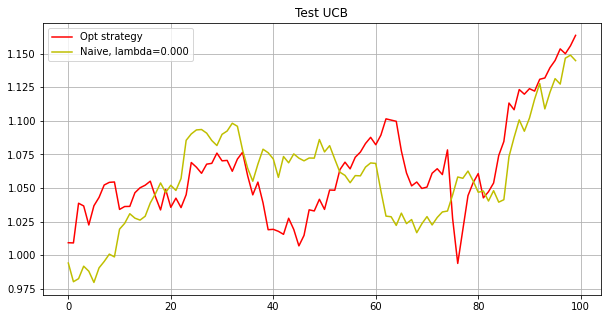

Phase 5
Testing...
./tmp2/res_phase05_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0156  0.011   0.011   0.0102  0.019   0.0104  0.0111  0.0082  0.0076
  0.014   0.01    0.006   0.0082  0.022   0.0111  0.0067  0.011   0.0167
  0.0109  0.0091  0.0069  0.0041  0.0127  0.01    0.0082  0.0096  0.0127
  0.0131  0.0069  0.0089  0.0003  0.0111  0.01    0.0088  0.0094  0.0109
  0.0085  0.011   0.0106  0.0036  0.0112  0.0057  0.0101  0.0125  0.0174
  0.016   0.0102  0.0088  0.0118  0.0096  0.0059 -0.      0.0093  0.0136
  0.0106  0.0122  0.0094  0.0099  0.0071  0.0085  0.0103  0.011   0.0097
  0.0116  0.0079  0.0095  0.0122  0.011   0.0114  0.0092  0.0096  0.0112
  0.0111  0.0118  0.0092  0.0118  0.0092  0.008   0.0096  0.0092  0.0088
  0.0097  0.0102  0.0095  0.0097  0.0094  0.01    0.0088  0.0106  0.0104
  0.0089  0.0088  0.0092  0.0101  0.0083  0.0117  0.0099  0.0083  0.0094
  0.007

[-0.      0.0382  0.0392 -0.      0.0002  0.0164  0.005   0.      0.
  0.0193  0.0142  0.0006 -0.      0.0207  0.0269  0.0054  0.038  -0.
  0.     -0.      0.0007  0.     -0.      0.0164  0.      0.      0.0154
  0.     -0.     -0.      0.0133  0.0363  0.0039  0.      0.0055  0.
  0.      0.0404  0.0128  0.0023  0.0544  0.      0.009   0.0059 -0.
  0.      0.      0.0005  0.0235  0.0322  0.      0.      0.      0.
  0.0054  0.005   0.0107  0.0275  0.0031  0.      0.0026  0.0332 -0.
  0.0121 -0.      0.0046 -0.     -0.      0.011   0.      0.      0.0273
  0.0014  0.0642  0.      0.0413 -0.      0.     -0.     -0.      0.0109
  0.0055  0.0169  0.      0.0176  0.0455  0.0082  0.      0.      0.0009
  0.0361  0.      0.0039  0.0054  0.0021  0.0535  0.0273  0.0207  0.
 -0.    ]
0.1568744714759423
[-0.      0.0397  0.0403  0.     -0.      0.0166  0.0189 -0.      0.0003
  0.0158  0.0139 -0.      0.      0.0112  0.0293  0.0021  0.0413  0.
  0.     -0.      0.0027 -0.      0.      0.0164 -0.  

[ 0.      0.0436  0.0433  0.      0.0101  0.0168  0.0156 -0.     -0.
  0.0146  0.0126 -0.      0.      0.0077  0.0325  0.      0.0549  0.
 -0.     -0.     -0.      0.0066 -0.      0.015  -0.     -0.      0.0097
  0.     -0.     -0.      0.      0.0408  0.0048  0.      0.0003 -0.
 -0.      0.0463  0.0151  0.0062  0.0435  0.0011  0.007   0.0003  0.
  0.      0.      0.0002  0.0241  0.0345 -0.      0.0026 -0.      0.
  0.0073  0.0029  0.009   0.02    0.003   0.0073  0.0017  0.0303 -0.
 -0.     -0.      0.0022  0.0005  0.      0.0182 -0.     -0.      0.0315
  0.0024  0.0818  0.      0.0423  0.0005  0.0079  0.     -0.      0.0002
  0.0005  0.0133  0.      0.013   0.0501  0.0028 -0.      0.      0.
  0.0441  0.0005  0.      0.0033 -0.      0.0571  0.0241  0.0124 -0.
 -0.    ]
0.04171946182444398
[ 0.      0.0436  0.0433  0.      0.0101  0.0168  0.0156 -0.     -0.
  0.0146  0.0126 -0.      0.      0.0077  0.0325  0.      0.0549 -0.
 -0.     -0.     -0.      0.0066 -0.      0.015  -0.     -0. 

[ 0.      0.0444  0.0441  0.0007  0.0057  0.0167  0.0183  0.      0.
  0.0082  0.0121 -0.     -0.      0.0133  0.0331  0.0003  0.0589  0.
 -0.     -0.      0.0018  0.0076 -0.      0.0146  0.      0.      0.0082
 -0.     -0.      0.     -0.      0.0417  0.003   0.     -0.      0.0028
 -0.      0.0475  0.017   0.0042  0.0406  0.      0.0062  0.0013 -0.
 -0.      0.      0.      0.0263  0.0366  0.0002  0.0023 -0.     -0.
  0.0075  0.0042  0.0083  0.0193  0.0025  0.0027 -0.      0.0307 -0.
 -0.     -0.      0.0007  0.     -0.      0.0166  0.     -0.      0.0317
  0.0043  0.0839 -0.      0.0422  0.0003  0.0076  0.     -0.     -0.
  0.      0.0129 -0.      0.0126  0.0508  0.0037  0.0003  0.0004 -0.
  0.0442  0.0008  0.      0.0029 -0.      0.0589  0.0231  0.0092 -0.
 -0.    ]
0.04130572558986259
[ 0.0008  0.0441  0.044   0.0005  0.0056  0.0165  0.0177  0.     -0.
  0.0079  0.0118  0.      0.0005  0.0154  0.0332  0.0002  0.0584  0.0015
 -0.     -0.      0.0017  0.0069  0.0001  0.0144  0.0001 

[ 0.0011  0.0463  0.0459  0.      0.      0.0163  0.011   0.      0.
  0.      0.0104 -0.     -0.      0.0058  0.0364  0.0012  0.0719  0.0102
 -0.      0.     -0.      0.0005  0.0001  0.0132  0.0027 -0.      0.017
  0.0002 -0.     -0.     -0.      0.0448  0.0023  0.0008  0.004   0.0006
 -0.      0.0517  0.0122  0.0008  0.032   0.0003  0.0051  0.008  -0.
  0.0002  0.0007 -0.      0.0266  0.0385 -0.      0.0158 -0.     -0.
  0.0089  0.0046  0.0054  0.0225  0.0026  0.0044  0.0049  0.0255 -0.
  0.0001 -0.      0.0023  0.      0.0005  0.0115 -0.     -0.      0.0283
  0.0006  0.0946 -0.      0.0429  0.     -0.      0.     -0.      0.0007
  0.0002  0.0103 -0.      0.0188  0.0382  0.0015 -0.      0.0002 -0.
  0.0472 -0.     -0.      0.      0.0053  0.0601  0.0214  0.0016 -0.
 -0.    ]
0.023574617622184844
[-0.      0.0455  0.0451  0.0051  0.0001  0.0157  0.007  -0.     -0.
 -0.      0.0103 -0.     -0.     -0.      0.0387 -0.      0.0687  0.0035
 -0.     -0.      0.0058 -0.     -0.      0.013  

[ 0.0008  0.0437  0.0442  0.      0.      0.0154  0.0087  0.      0.
  0.0026  0.0101  0.      0.0001  0.0037  0.0393  0.0026  0.0687  0.0107
  0.      0.      0.0067  0.      0.0012  0.0124  0.0006  0.      0.0082
  0.0012  0.     -0.      0.      0.0469  0.0012  0.0125  0.003   0.0006
  0.      0.0519  0.0125  0.0079  0.0284  0.      0.0056  0.0096  0.
  0.      0.     -0.      0.0296  0.0337  0.      0.0034  0.      0.
  0.0086  0.0109  0.0043  0.0187  0.0004  0.0029  0.0012  0.0217 -0.
  0.      0.      0.0012 -0.      0.      0.0199  0.      0.      0.0224
  0.0021  0.1012  0.      0.0432 -0.     -0.     -0.      0.0002  0.0002
  0.0006  0.0086  0.      0.011   0.042   0.      0.      0.      0.
  0.0515 -0.      0.0033  0.0027  0.      0.062   0.022   0.003  -0.
  0.006 ]
0.0008186575439283556
[ 0.0008  0.0438  0.0442  0.      0.      0.0154  0.0087 -0.      0.
  0.0026  0.0101  0.      0.0001  0.0037  0.0393  0.0026  0.0687  0.0107
  0.      0.      0.0067  0.      0.0012  0.012

[ 0.      0.0427  0.0435  0.      0.      0.0151  0.0055  0.      0.
  0.      0.0102  0.      0.      0.0054  0.0405  0.      0.069   0.0088
  0.      0.0005  0.0074  0.      0.0007  0.0123  0.      0.      0.0111
  0.      0.      0.      0.0001  0.0475  0.0031  0.0065  0.0033  0.
  0.      0.0525  0.0109  0.0047  0.0288  0.0022  0.0056  0.0116  0.001
  0.0008  0.0008  0.      0.031   0.0335  0.      0.0033  0.      0.
  0.0086  0.0132  0.0043  0.0201  0.      0.0049  0.0006  0.0241 -0.
  0.0027  0.      0.0005  0.0003  0.      0.0209  0.     -0.      0.0209
  0.001   0.1022  0.      0.0439 -0.     -0.     -0.      0.0001  0.0005
  0.0006  0.009   0.      0.0098  0.0424  0.      0.      0.     -0.
  0.0518  0.0017  0.0032  0.0015  0.0012  0.0613  0.0216  0.0011  0.
  0.0055]
0.00013500162308041253
[ 0.0009  0.0425  0.0433 -0.     -0.      0.015   0.0055 -0.     -0.
 -0.      0.0102 -0.     -0.      0.0055  0.0405 -0.      0.0696  0.0085
 -0.      0.0005  0.0074 -0.      0.      0.012

[-0.      0.04    0.0416  0.0036  0.0005  0.0131  0.0282 -0.     -0.
  0.0049  0.0104  0.     -0.     -0.      0.0388 -0.      0.065   0.0081
 -0.     -0.      0.0023  0.0166  0.0017  0.0121  0.0005 -0.      0.009
  0.0015  0.0002 -0.     -0.      0.0511  0.0004  0.0087  0.0019 -0.
 -0.      0.0543  0.0084  0.0013  0.023   0.0088  0.0044  0.012  -0.
 -0.     -0.      0.0001  0.0287  0.0335 -0.      0.0006 -0.     -0.
  0.0081  0.0332  0.0015  0.0193 -0.      0.0003 -0.      0.0125 -0.
 -0.     -0.      0.      0.     -0.      0.0195  0.      0.      0.0033
  0.0002  0.112  -0.      0.0335 -0.      0.0096  0.     -0.     -0.
  0.0004  0.0072 -0.      0.0072  0.0377  0.0016 -0.      0.      0.
  0.0565  0.0081  0.0046  0.0038  0.0056  0.0606  0.0173  0.0012  0.
  0.    ]
9.626104044184317e-05
[-0.      0.04    0.0419  0.0026  0.      0.013   0.0279  0.     -0.
  0.0027  0.0101 -0.     -0.     -0.      0.0386 -0.      0.0644  0.0074
 -0.      0.      0.0022  0.018   0.0021  0.012   0.0003

[ 0.      0.0387  0.0407  0.      0.      0.0121  0.0244  0.      0.
  0.      0.0092  0.      0.0028  0.      0.0385  0.0096  0.0642  0.0056
  0.      0.0001  0.      0.0127  0.      0.0108  0.      0.      0.0065
  0.      0.      0.      0.0021  0.0524  0.0021  0.      0.      0.017
  0.      0.054   0.011   0.0026  0.0117  0.0148  0.0039  0.0173  0.0008
  0.      0.     -0.      0.0323  0.0346  0.      0.0058  0.      0.
  0.0081  0.0181  0.      0.0189  0.      0.0023  0.0012  0.01    0.
  0.0004  0.      0.0004 -0.      0.      0.0236  0.      0.      0.0015
  0.      0.1174  0.      0.0338 -0.      0.0122 -0.      0.      0.0049
  0.      0.0052  0.      0.0071  0.0387  0.0004  0.      0.      0.
  0.0546  0.0055  0.0048  0.0041  0.0037  0.0598  0.0177  0.0019  0.
  0.0052]
0.002317188425295263
[ 0.      0.0374  0.0395  0.      0.0034  0.0123  0.0266  0.     -0.
  0.0036  0.0099  0.     -0.      0.      0.0394  0.0036  0.064  -0.
 -0.      0.0005  0.      0.0072  0.      0.0109 

[ 0.      0.0362  0.0388 -0.      0.0059  0.0124  0.0187  0.      0.
  0.      0.0104  0.      0.      0.      0.0418  0.0123  0.0615  0.
 -0.      0.0001  0.      0.0039  0.      0.0113  0.0012  0.      0.0069
  0.      0.      0.      0.0015  0.0563  0.0022  0.0001  0.005   0.0005
  0.      0.0571  0.0105  0.0087  0.0071  0.      0.0069  0.0125 -0.
 -0.     -0.      0.      0.039   0.0291  0.      0.0017 -0.      0.0018
  0.0101  0.0165  0.0006  0.0209  0.0031  0.0036  0.0018  0.0091  0.
 -0.     -0.     -0.      0.0002 -0.      0.0202  0.      0.      0.0007
 -0.      0.1247  0.      0.0437  0.      0.0142  0.      0.      0.008
 -0.      0.0055  0.      0.0106  0.0356  0.002  -0.      0.      0.
  0.0625  0.0011  0.0096  0.0018  0.0069  0.0609  0.018   0.0063  0.
  0.0003]
0.0002019821324457774
[ 0.      0.0362  0.0388 -0.      0.0059  0.0124  0.0187  0.      0.
 -0.      0.0104  0.      0.      0.      0.0418  0.0123  0.0615  0.
 -0.      0.0001  0.      0.0039 -0.      0.0113  0.

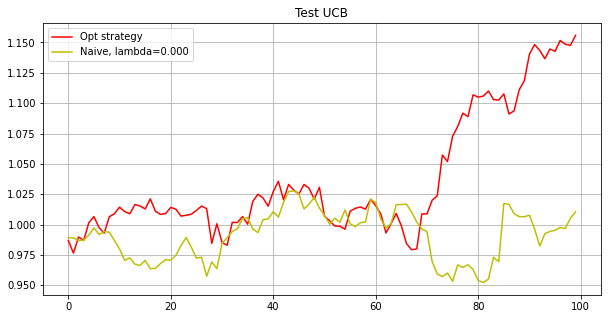

Phase 6
Testing...
./tmp2/res_phase06_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0098 0.0102 0.0097 0.0098 0.0104 0.0102 0.0097 0.0103 0.0101 0.0107
 0.0103 0.0092 0.0102 0.0101 0.0094 0.0102 0.0105 0.0106 0.0104 0.0101
 0.0094 0.0105 0.0101 0.0099 0.0101 0.0095 0.0105 0.01   0.0097 0.0094
 0.0097 0.0102 0.0103 0.0091 0.01   0.0103 0.0092 0.0104 0.0094 0.0104
 0.0106 0.0102 0.0103 0.0099 0.0096 0.0106 0.0098 0.0095 0.0104 0.0097
 0.0101 0.0106 0.0099 0.0097 0.0099 0.0097 0.0103 0.0101 0.0099 0.0102
 0.0095 0.0099 0.0108 0.01   0.01   0.0096 0.0098 0.0101 0.0098 0.0096
 0.0099 0.0101 0.0103 0.0097 0.0106 0.01   0.0098 0.0102 0.0097 0.0103
 0.0101 0.0095 0.0098 0.01   0.0101 0.0096 0.0098 0.0104 0.0108 0.0097
 0.0104 0.0101 0.0088 0.0101 0.01   0.0102 0.01   0.01   0.0099 0.0102]
0.03023289550470331
[ 0.      0.0161  0.008   0.0031  0.0175 -0.      0.0022  0.013   0.0135
  0.02

[ 0.0006  0.0217  0.0037  0.001   0.0219 -0.     -0.      0.0112  0.0141
  0.0276  0.0289 -0.      0.0235  0.0097 -0.      0.0188  0.0163 -0.
  0.0238 -0.      0.0001  0.0183  0.0076  0.0019  0.0087 -0.      0.0005
  0.0138  0.0045  0.      0.0011  0.0001 -0.      0.0052  0.0068  0.0055
  0.0164  0.0301  0.      0.0209  0.      0.      0.0224  0.0182  0.0024
  0.0074  0.0059 -0.      0.02    0.0087  0.0158  0.0177  0.0112  0.003
  0.0091  0.0034  0.0093  0.0185  0.0129  0.0154  0.      0.0263  0.0062
  0.0073  0.0113  0.0007  0.0141  0.013   0.0113 -0.      0.0127  0.0158
  0.0103  0.0037 -0.      0.0153  0.0126  0.0098  0.0088  0.007   0.0213
  0.0043  0.004   0.0043  0.0142  0.0198  0.0076  0.0021  0.0058  0.007
  0.0195  0.0121  0.02    0.012  -0.      0.0214  0.0139  0.0184  0.0184
  0.022 ]
0.00023790616661647221
[ 0.0006  0.0217  0.0037  0.001   0.0219 -0.      0.      0.0112  0.0141
  0.0276  0.0289 -0.      0.0235  0.0097 -0.      0.0188  0.0163 -0.
  0.0238 -0.      0.0001  0.

[ 0.      0.0233  0.0013 -0.      0.025   0.     -0.      0.0081  0.0131
  0.0263  0.0318 -0.      0.0249  0.0096 -0.      0.0193  0.0162 -0.
  0.0261  0.0002  0.0003  0.0191  0.0056  0.      0.0084  0.      0.
  0.014   0.0044 -0.     -0.      0.      0.      0.0019  0.0048  0.0041
  0.0155  0.0326  0.      0.0225  0.      0.      0.0243  0.0195  0.0028
  0.007   0.0049  0.      0.0181  0.0096  0.0167  0.0139  0.011  -0.
  0.0051  0.0021  0.0074  0.0197  0.0131  0.0154 -0.      0.0272  0.0038
  0.0081  0.01    0.002   0.0135  0.0126  0.011   0.      0.0129  0.0154
  0.0102  0.012  -0.      0.0162  0.0125  0.0129  0.0069  0.007   0.0227
  0.0015  0.0049  0.0061  0.0116  0.0184  0.006   0.      0.0113  0.0074
  0.0211  0.0116  0.0235  0.0107 -0.      0.0229  0.0148  0.0194  0.0189
  0.0237]
0.00023125389833111588
[-0.      0.0232  0.0013 -0.      0.025   0.     -0.      0.0081  0.0131
  0.0263  0.0318  0.      0.0249  0.0096  0.      0.0193  0.0162  0.
  0.0261  0.0002  0.0003  0.0191  

[ 0.      0.0231  0.0013 -0.      0.025  -0.     -0.      0.0081  0.0131
  0.0263  0.0318 -0.      0.0249  0.0096  0.      0.0193  0.0162  0.
  0.0261  0.0002  0.0004  0.0191  0.0056  0.      0.0085  0.      0.
  0.014   0.0044 -0.     -0.      0.      0.      0.0019  0.0048  0.0041
  0.0155  0.0326  0.      0.0225 -0.     -0.      0.0243  0.0195  0.0028
  0.0069  0.0048  0.      0.0181  0.0096  0.0167  0.0139  0.011  -0.
  0.0051  0.0021  0.0074  0.0197  0.0131  0.0154  0.      0.0272  0.0038
  0.0081  0.01    0.002   0.0135  0.0126  0.011  -0.      0.0129  0.0154
  0.0102  0.012   0.      0.0162  0.0125  0.0129  0.0069  0.007   0.0227
  0.0015  0.0049  0.0062  0.0116  0.0184  0.006   0.      0.0113  0.0074
  0.0211  0.0116  0.0235  0.0107 -0.      0.0229  0.0148  0.0194  0.0189
  0.0237]
0.0001200610656334431
[-0.      0.0231  0.0013 -0.      0.025  -0.     -0.      0.0081  0.0131
  0.0263  0.0318 -0.      0.0249  0.0096  0.      0.0193  0.0162  0.
  0.0261  0.0002  0.0004  0.0191  0

[ 0.0002  0.0239  0.0003  0.0011  0.0279 -0.      0.      0.0066  0.0124
  0.0266  0.0329  0.      0.0254  0.01    0.0003  0.0191  0.0151 -0.
  0.0278 -0.     -0.      0.0178  0.0044 -0.      0.0071  0.0006  0.
  0.0145  0.0041 -0.      0.      0.      0.0003  0.0008  0.0042  0.0052
  0.0176  0.035   0.      0.0232  0.      0.0002  0.0253  0.0197  0.0031
  0.0056  0.0044 -0.      0.0201  0.0089  0.0164  0.011   0.0111  0.
  0.0037  0.0018  0.0079  0.0195  0.0132  0.0132  0.      0.0279  0.0001
  0.0077  0.0093  0.0029  0.0132  0.0125  0.011   0.      0.0129  0.0153
  0.0091  0.0135 -0.      0.0168  0.0123  0.0134  0.0068  0.0067  0.0235
  0.0005  0.0038  0.0054  0.011   0.0191  0.0053 -0.      0.0106  0.0079
  0.0218  0.0117  0.0253  0.0096 -0.      0.0235  0.0153  0.02    0.0191
  0.0256]
9.872612489146954e-05
[ 0.0002  0.0239  0.0003  0.0011  0.0279  0.      0.      0.0066  0.0124
  0.0266  0.0329  0.      0.0254  0.01    0.0003  0.0191  0.0151 -0.
  0.0278 -0.     -0.      0.0178  0

[ 0.0002  0.0238  0.0003  0.0011  0.0278 -0.      0.      0.0066  0.0124
  0.0265  0.0329  0.      0.0254  0.01    0.0003  0.0191  0.0151  0.
  0.0278  0.     -0.      0.0178  0.0044  0.      0.0071  0.0006  0.
  0.0145  0.0041  0.      0.     -0.      0.0004  0.0008  0.0042  0.0052
  0.0176  0.035   0.      0.0232  0.      0.0002  0.0253  0.0197  0.0031
  0.0056  0.0045  0.      0.0201  0.0089  0.0164  0.011   0.0111  0.
  0.0037  0.0018  0.0079  0.0195  0.0132  0.0132 -0.      0.0279  0.
  0.0077  0.0093  0.0029  0.0132  0.0125  0.011   0.      0.0129  0.0154
  0.0091  0.0135 -0.      0.0168  0.0123  0.0134  0.0068  0.0067  0.0235
  0.0005  0.0038  0.0054  0.011   0.0191  0.0053 -0.      0.0106  0.0079
  0.0218  0.0117  0.0253  0.0096 -0.      0.0235  0.0153  0.02    0.0191
  0.0256]
0.00022866525783180695
[ 0.0002  0.0238  0.0003  0.0011  0.0278 -0.      0.      0.0066  0.0124
  0.0265  0.0329  0.      0.0254  0.01    0.0003  0.0191  0.0151  0.
  0.0278  0.     -0.      0.0178  0.00

[-0.      0.025   0.      0.0008  0.0289 -0.      0.      0.0025  0.0141
  0.0273  0.0351  0.0005  0.0261  0.0102  0.      0.0194  0.0176  0.0003
  0.0282  0.0003  0.0002  0.0187  0.0071  0.0001  0.0072  0.0042  0.
  0.0146  0.0031  0.0003  0.      0.      0.0002  0.0033  0.0041  0.0051
  0.017   0.0364  0.0013  0.0235  0.0002  0.0014  0.0268  0.0207  0.0018
  0.001   0.0037  0.      0.0214  0.0088  0.0184  0.0109  0.011  -0.
  0.0016  0.0011  0.0068  0.0203  0.0133  0.0146  0.      0.0276  0.0001
  0.0066  0.0088  0.0014  0.0135  0.0117  0.0109  0.      0.0131  0.015
  0.0079  0.0121  0.      0.0141  0.0121  0.0133  0.0062  0.0031  0.0245
  0.0001  0.0036  0.0022  0.0114  0.0182  0.0043 -0.      0.0087  0.0073
  0.0218  0.0119  0.0267  0.0086 -0.      0.024   0.016   0.0207  0.0194
  0.0267]
3.4416811146175676e-05
[ 0.      0.0249  0.      0.0008  0.0289 -0.     -0.      0.0025  0.0141
  0.0273  0.0351  0.0005  0.0261  0.0102  0.      0.0194  0.0176  0.0003
  0.0282  0.0003  0.0002  0

[ 0.      0.025  -0.      0.0008  0.0289  0.     -0.      0.0025  0.0141
  0.0273  0.0351  0.0005  0.0261  0.0102 -0.      0.0194  0.0176  0.0003
  0.0282  0.0003  0.0002  0.0187  0.007   0.0001  0.0072  0.0042  0.
  0.0146  0.0031  0.0003  0.      0.      0.0002  0.0033  0.0041  0.0051
  0.017   0.0364  0.0013  0.0235  0.0002  0.0014  0.0268  0.0207  0.0018
  0.001   0.0037  0.      0.0214  0.0088  0.0184  0.0109  0.011   0.
  0.0016  0.0011  0.0068  0.0203  0.0133  0.0146 -0.      0.0276  0.0001
  0.0066  0.0088  0.0014  0.0135  0.0117  0.0109  0.      0.0131  0.015
  0.0079  0.0121 -0.      0.0141  0.0121  0.0133  0.0062  0.0031  0.0245
  0.0001  0.0036  0.0022  0.0114  0.0182  0.0043 -0.      0.0087  0.0073
  0.0218  0.0119  0.0267  0.0086  0.      0.024   0.016   0.0207  0.0194
  0.0267]
0.0002537647276586953
[ 0.      0.025  -0.      0.0008  0.0289  0.     -0.      0.0025  0.0141
  0.0273  0.0351  0.0005  0.0261  0.0102 -0.      0.0194  0.0176  0.0003
  0.0282  0.0003  0.0002  0.

[ 0.      0.025  -0.      0.0008  0.0288  0.      0.      0.0025  0.0141
  0.0273  0.0351  0.0006  0.0261  0.0102 -0.      0.0194  0.0176  0.0003
  0.0282  0.0003  0.0002  0.0187  0.0071  0.0001  0.0072  0.0042  0.
  0.0146  0.0031  0.0003  0.     -0.      0.0001  0.0033  0.0041  0.0051
  0.017   0.0364  0.0013  0.0235  0.0002  0.0014  0.0268  0.0207  0.0018
  0.001   0.0037 -0.      0.0214  0.0088  0.0184  0.0109  0.011  -0.
  0.0016  0.0011  0.0068  0.0203  0.0133  0.0146 -0.      0.0276  0.
  0.0066  0.0088  0.0014  0.0135  0.0117  0.0109 -0.      0.0131  0.015
  0.0079  0.0121  0.      0.0141  0.0121  0.0133  0.0062  0.0031  0.0245
  0.0001  0.0036  0.0022  0.0114  0.0182  0.0043  0.      0.0087  0.0073
  0.0218  0.0119  0.0267  0.0086  0.      0.024   0.016   0.0207  0.0194
  0.0267]
0.00011699355510999592
[-0.      0.025   0.      0.0008  0.0288  0.      0.      0.0025  0.0141
  0.0273  0.0351  0.0006  0.0261  0.0102  0.      0.0194  0.0176  0.0003
  0.0282  0.0003  0.0002  0.018

[ 0.0018  0.0261 -0.      0.0028  0.0292  0.     -0.     -0.      0.0189
  0.0271  0.037   0.      0.0269  0.0074 -0.      0.0185  0.0145  0.0067
  0.0321 -0.      0.      0.0158  0.0088 -0.      0.0066  0.0107  0.003
  0.0147  0.0022  0.      0.     -0.      0.      0.001   0.0033  0.0044
  0.015   0.0368 -0.      0.0233  0.      0.      0.0282  0.0211  0.0014
 -0.      0.0028 -0.      0.0211  0.0112  0.0184  0.0072  0.0107  0.0013
  0.0006  0.0003  0.0053  0.0198  0.0133  0.0144 -0.      0.0266  0.
  0.0057  0.008  -0.      0.0131  0.0139  0.0106 -0.      0.0129  0.0144
  0.0101  0.0115  0.      0.0137  0.0118  0.0134  0.0063  0.0007  0.0254
 -0.      0.0032  0.      0.0117  0.0159  0.0031 -0.      0.0134  0.0093
  0.0219  0.0117  0.0272  0.0074  0.      0.0242  0.017   0.0213  0.0197
  0.023 ]
0.00015022157712797692
[ 0.0018  0.0261 -0.      0.0028  0.0292  0.      0.      0.      0.0189
  0.0271  0.037  -0.      0.0269  0.0074 -0.      0.0185  0.0145  0.0067
  0.0321 -0.     -0.   

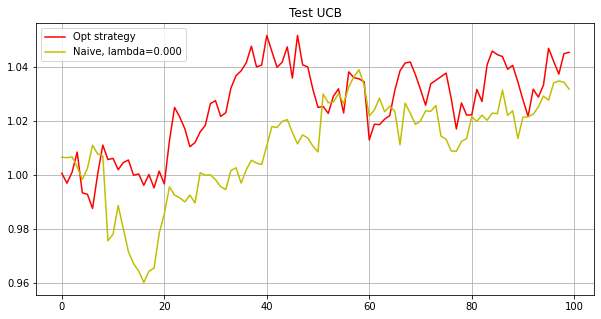

Phase 7
Testing...
./tmp2/res_phase07_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0147  0.0085  0.0064  0.      0.017   0.0189  0.0034  0.016   0.0001
  0.0141  0.0274  0.0111  0.0068  0.0045  0.0191  0.0118  0.0139  0.0129
  0.0227  0.021   0.0134  0.0031  0.0008  0.0163  0.0039  0.0162 -0.
  0.0159  0.0025  0.014   0.0074  0.0132  0.0095  0.0087  0.      0.0129
  0.0155  0.0136  0.0058  0.0063  0.0148  0.0056  0.0099  0.0166  0.
  0.0039  0.0063  0.0067  0.0136  0.0096 -0.      0.0124  0.0162  0.012
  0.0185  0.      0.      0.0062  0.0099  0.0125  0.      0.009   0.0122
  0.      0.0086  0.012   0.0016  0.0097  0.0124  0.0158  0.0123  0.0033
  0.0111  0.0073  0.0053  0.006   0.0104 -0.      0.0077  0.0301  0.0231
  0.0177  0.0134  0.0088  0.006   0.008   0.0111  0.0047  0.0198  0.0078
  0.0148  0.0035  0.009   0.0087  0.0107  0.0118  0.0116  0.0139  0.0045
  0.013 ]
0.5100

[ 0.0185 -0.      0.0203  0.      0.0181  0.0287  0.      0.0178  0.
  0.0116  0.0436  0.0031  0.      0.0087  0.0283  0.019   0.0314  0.0055
  0.0068  0.0261  0.016   0.      0.001   0.0191 -0.      0.0202  0.
  0.0138  0.0009  0.009  -0.      0.0128  0.0066  0.0033 -0.      0.0125
  0.0142  0.0155 -0.      0.0092  0.0102  0.0088  0.0038  0.0223  0.0014
 -0.      0.0027  0.0067  0.0137  0.0046  0.0012  0.0078  0.0212  0.0219
  0.0236  0.0075  0.      0.0062  0.0073  0.0063  0.      0.0097  0.0173
  0.0063  0.0228  0.0089  0.0046  0.0039  0.013   0.0202  0.0123  0.0031
  0.0113  0.0027  0.0026  0.0026  0.0102  0.0042  0.004   0.0295  0.0121
  0.0257  0.0057  0.0031  0.0123  0.0055  0.0147  0.0041  0.0166 -0.
  0.0134  0.0004  0.0087  0.0057  0.0074  0.0108  0.012   0.0129  0.0046
  0.0163]
0.00010419972624690982
[ 0.0185 -0.      0.0203 -0.      0.0181  0.0287  0.      0.0178  0.
  0.0116  0.0436  0.0031 -0.      0.0087  0.0283  0.019   0.0314  0.0055
  0.0068  0.0261  0.016  -0.      

[ 0.022  -0.      0.024   0.      0.0201  0.0376  0.      0.0204 -0.
  0.0157  0.0547  0.     -0.      0.0075  0.0364  0.0177  0.0272  0.0044
  0.0032  0.0277  0.0165  0.     -0.      0.025   0.0064  0.0197  0.0013
  0.0197  0.0059  0.0047  0.      0.0053  0.0049  0.      0.0083  0.0121
  0.0072  0.0176  0.0021  0.02    0.0115  0.006   0.      0.028   0.
  0.0016  0.      0.0041  0.0058  0.      0.0045  0.0041  0.0244  0.0255
  0.0288  0.0001 -0.      0.0001  0.0061  0.0008  0.      0.0082  0.0182
  0.011   0.0174  0.0038  0.0034  0.0014  0.0099  0.0048  0.0158  0.0124
  0.0089  0.0003  0.0003  0.0024  0.0085  0.0054  0.      0.0259  0.0046
  0.0318  0.      0.0012  0.014   0.0031  0.0164  0.009   0.013  -0.
  0.0047  0.001   0.0154  0.0089  0.0037  0.0109  0.014   0.0139  0.0096
  0.0202]
0.00015869418600704808
[ 0.022  -0.      0.024  -0.      0.0201  0.0376  0.      0.0204 -0.
  0.0157  0.0547  0.     -0.      0.0074  0.0364  0.0177  0.0272  0.0044
  0.0032  0.0277  0.0165  0.     -

[ 0.0231 -0.      0.025  -0.      0.0217  0.0401  0.      0.02    0.
  0.0163  0.0568  0.0005 -0.      0.0108  0.0386  0.021   0.0282  0.0031
  0.008   0.0279  0.0181  0.     -0.      0.0252  0.006   0.0216  0.
  0.0204  0.0039  0.0033 -0.      0.0018  0.0044 -0.      0.0124  0.0111
  0.0069  0.0181  0.0008  0.0237  0.0113  0.0059  0.0006  0.0297  0.
  0.0001  0.001   0.004   0.      0.      0.0006  0.0026  0.0267  0.0252
  0.0304  0.     -0.     -0.      0.0063  0.      0.      0.008   0.0147
  0.012   0.0178  0.0036  0.0026  0.      0.0125  0.0045  0.0158  0.0105
  0.0081  0.0008  0.0024  0.0013  0.0092  0.0057  0.      0.0221  0.0051
  0.0324  0.      0.0015  0.0125  0.0028  0.0164  0.0091  0.0116  0.
  0.0017  0.0012  0.0152  0.0066  0.0024  0.0108  0.0138  0.0148  0.0068
  0.0203]
8.904021762609805e-05
[ 0.0247  0.      0.0296  0.0011  0.0214  0.0435 -0.      0.0192  0.
  0.0131  0.0622  0.      0.      0.0049  0.0413  0.0278  0.0209  0.0004
  0.0024  0.0289  0.0177  0.      0.   

[ 0.0261 -0.      0.0207  0.      0.0218  0.0463 -0.      0.0203 -0.
  0.0142  0.0681  0.001  -0.      0.0061  0.0428  0.0309  0.0265  0.0007
  0.002   0.0284  0.0177  0.0003  0.      0.0279  0.0037  0.0256  0.0008
  0.0183  0.0032 -0.      0.      0.005   0.0016  0.     -0.      0.0129
  0.0072  0.0203  0.0009  0.0367  0.012   0.0032  0.0019  0.0336  0.
 -0.     -0.      0.0012  0.0012  0.0003 -0.      0.001   0.0307  0.0223
  0.0348  0.0057  0.     -0.      0.0052 -0.     -0.      0.0083  0.0112
  0.0105  0.0188  0.0007  0.0041 -0.      0.0109  0.0005  0.0219  0.0002
  0.009   0.      0.0049 -0.      0.0075  0.      0.0018  0.0244  0.0053
  0.0347  0.     -0.      0.0142  0.0026  0.0179  0.009   0.0102  0.
  0.0007  0.002   0.0151  0.0007  0.0004  0.0115  0.0142  0.0121  0.0016
  0.0221]
0.00011604954971614203
[ 0.0262  0.      0.0197  0.0012  0.0219  0.0466 -0.      0.0205  0.0002
  0.0137  0.0685  0.0005 -0.      0.0055  0.0428  0.0312  0.0271  0.0002
  0.0024  0.0283  0.0174  0.  

[ 0.0265 -0.      0.0168 -0.      0.0207  0.0472  0.      0.0189  0.0006
  0.0129  0.0691  0.      0.      0.0042  0.0439  0.0262  0.0265 -0.
  0.0031  0.0291  0.0151  0.      0.      0.0271  0.0021  0.0266  0.0033
  0.0175  0.      0.0006  0.      0.0002  0.0006  0.      0.0003  0.0127
  0.0053  0.0205 -0.      0.0354  0.0123  0.0036  0.0029  0.0337  0.
  0.      0.0004  0.0016  0.      0.      0.0005  0.0001  0.0316  0.0256
  0.0359  0.0133  0.0025  0.      0.0042  0.      0.      0.0089  0.012
  0.0085  0.0215  0.      0.0056  0.      0.0134  0.      0.0217  0.0032
  0.0092 -0.      0.0057  0.0027  0.0074  0.      0.0001  0.0248  0.0071
  0.0346  0.      0.0009  0.0152  0.0008  0.0181  0.01    0.0091  0.
  0.0008  0.      0.0146  0.0004 -0.      0.0112  0.0143  0.0122  0.0023
  0.0225]
0.00023995633969204865
[ 0.0269  0.      0.0163 -0.      0.0194  0.0482 -0.      0.0188  0.0012
  0.0123  0.0698  0.0009 -0.      0.0042  0.0446  0.0273  0.0246  0.
  0.0046  0.0306  0.014  -0.     -0

[ 0.0269  0.0001  0.0177  0.      0.0198  0.0481  0.      0.0189  0.0014
  0.0117  0.0702  0.0015 -0.      0.0038  0.0449  0.0273  0.0241  0.
  0.0035  0.0307  0.0147  0.     -0.      0.0274  0.002   0.0273  0.0038
  0.0191 -0.      0.      0.     -0.     -0.     -0.     -0.      0.0124
  0.0041  0.0208 -0.      0.0379  0.0126  0.0038  0.0037  0.0332  0.
  0.0006  0.0001  0.0012  0.0016 -0.      0.0018  0.      0.0321  0.0293
  0.036   0.0093  0.0029 -0.      0.0035 -0.     -0.      0.0064  0.0131
  0.0093  0.0196 -0.      0.0037 -0.      0.0127  0.0003  0.0219 -0.
  0.0096  0.0001  0.0059  0.0025  0.0066  0.002   0.0014  0.0233  0.0068
  0.0348 -0.      0.0011  0.0147  0.0002  0.0187  0.0098  0.0069  0.
  0.0015  0.0001  0.0148 -0.      0.      0.0109  0.0146  0.0121  0.0004
  0.0227]
9.647224943387894e-05
[ 0.0269  0.0001  0.0177  0.      0.0198  0.0481 -0.      0.0189  0.0014
  0.0117  0.0702  0.0015 -0.      0.0038  0.0449  0.0273  0.0241 -0.
  0.0035  0.0307  0.0147 -0.     -0.   

[ 0.027   0.0001  0.0179  0.0001  0.0195  0.0483 -0.      0.0191  0.0015
  0.0114  0.0705  0.002  -0.      0.0037  0.0451  0.0274  0.0237  0.
  0.0038  0.0308  0.0146 -0.      0.0002  0.0276  0.0021  0.0275  0.003
  0.0193  0.0012 -0.     -0.      0.     -0.     -0.      0.0005  0.0124
  0.0038  0.0208  0.      0.0386  0.0125  0.0039  0.0039  0.0334 -0.
  0.0005  0.      0.0014  0.0013  0.      0.0019  0.      0.0321  0.0292
  0.036   0.0087  0.0027  0.      0.0034 -0.      0.      0.006   0.0132
  0.0088  0.0193  0.      0.0035 -0.      0.0127  0.      0.0219 -0.
  0.0096  0.0002  0.0058  0.0024  0.0066  0.0021  0.001   0.023   0.0062
  0.035   0.      0.0014  0.0147  0.0001  0.0187  0.0096  0.007   0.
  0.0016  0.0002  0.0145  0.     -0.      0.0109  0.0146  0.0118  0.0004
  0.0228]
0.015765962122440434
[ 0.0269  0.0001  0.0179  0.0001  0.0195  0.0483 -0.      0.0191  0.0015
  0.0114  0.0705  0.002  -0.      0.0037  0.0451  0.0274  0.0237  0.
  0.0038  0.0308  0.0146 -0.      0.0002 

[ 0.031  -0.      0.0144 -0.      0.0308  0.0579  0.      0.0137 -0.
  0.0062  0.0779 -0.     -0.      0.0065  0.0508  0.0403  0.      0.
  0.      0.0319  0.0081  0.0012  0.0033  0.0302  0.0039  0.0298 -0.
  0.0304  0.0134 -0.     -0.      0.      0.001  -0.      0.      0.0129
  0.0002  0.0234 -0.      0.0315  0.0091  0.0048  0.0036  0.038  -0.
  0.0005  0.      0.0055 -0.      0.      0.     -0.      0.0345  0.0195
  0.0404  0.0004  0.     -0.      0.0022 -0.     -0.      0.0011  0.0074
  0.0119  0.0222  0.0021  0.0045  0.      0.0169  0.      0.0268 -0.
  0.0106 -0.     -0.      0.      0.0077 -0.      0.0012  0.0139  0.0031
  0.0412 -0.     -0.      0.0141  0.003   0.0192 -0.      0.0059  0.
  0.      0.0056  0.0169  0.     -0.      0.0101  0.0144  0.0076  0.
  0.0236]
0.00012858828485939287
[ 0.031  -0.      0.0144 -0.      0.0308  0.0579  0.      0.0137 -0.
  0.0062  0.0779  0.     -0.      0.0065  0.0508  0.0403  0.      0.
 -0.      0.0319  0.0081  0.0012  0.0033  0.0302  0.00

[ 0.0312  0.0001  0.0143  0.0001  0.0293  0.059  -0.      0.0137  0.0001
  0.0055  0.0796  0.      0.      0.0067  0.0518  0.0408 -0.     -0.
 -0.      0.0318  0.0086  0.0009  0.0022  0.0302  0.0046  0.0301 -0.
  0.0295  0.0108  0.     -0.      0.0018  0.0009  0.      0.0009  0.0128
  0.0007  0.0236  0.      0.0303  0.0078  0.0061  0.004   0.0388  0.
 -0.     -0.      0.0055  0.      0.      0.     -0.      0.0351  0.0191
  0.0407  0.      0.      0.      0.0015 -0.      0.      0.      0.0085
  0.0115  0.0207  0.0022  0.0048 -0.      0.0169  0.0004  0.0277 -0.
  0.0103  0.      0.      0.      0.0069 -0.      0.      0.0132  0.0034
  0.0418 -0.     -0.      0.0147  0.0035  0.0191  0.0008  0.0047  0.
  0.      0.0058  0.017   0.      0.      0.0099  0.0145  0.0069  0.0009
  0.0235]
0.0003097553013898075
[ 0.0312  0.0001  0.0143  0.0001  0.0293  0.059  -0.      0.0137  0.0001
  0.0055  0.0796  0.      0.      0.0067  0.0518  0.0408 -0.     -0.
 -0.      0.0318  0.0086  0.0009  0.0022  0

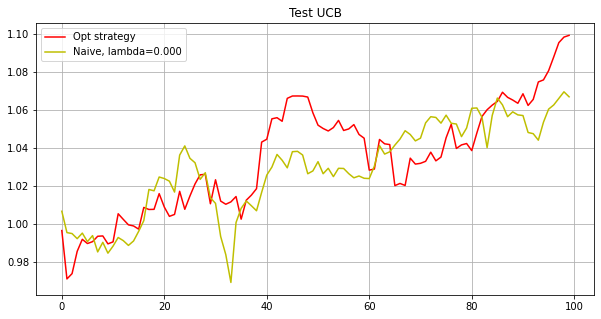

Phase 8
Testing...
./tmp2/res_phase08_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0111  0.008   0.0129  0.0037  0.013   0.0019  0.0085  0.0141  0.0057
  0.0089  0.0131  0.0119  0.0111  0.0088  0.0085  0.      0.0129  0.0116
  0.0084  0.0072  0.011   0.0116  0.0094  0.0121  0.0134  0.0034  0.0094
  0.002   0.0155  0.0122  0.0134  0.0105 -0.      0.0102  0.0091  0.0103
  0.0112  0.0117  0.0098  0.0102  0.0127  0.0105  0.0067  0.009   0.0076
  0.0239  0.0147  0.0105  0.0058  0.0135  0.0087  0.0065  0.0074  0.0046
  0.006   0.011   0.0139  0.0086  0.0148  0.0059  0.0111  0.0096  0.0116
  0.0091  0.0143  0.0127  0.0116  0.0145  0.0098  0.0126  0.0136  0.007
  0.0089  0.02    0.0157  0.0104  0.0055  0.0113  0.0081  0.0057  0.0115
  0.0192  0.0085  0.016   0.0091  0.0093  0.006   0.004   0.0054  0.0122
  0.0061  0.0135  0.0072  0.0083  0.0109  0.0118  0.0058  0.0128  0.0089
  0.0101

[ 0.0255 -0.      0.0142 -0.      0.0278 -0.     -0.      0.023   0.0075
 -0.      0.0137 -0.      0.0147  0.0035 -0.     -0.      0.0072  0.0083
  0.0062  0.0047  0.0122  0.0153  0.008   0.0133  0.0201  0.0003  0.0139
  0.0203  0.0245  0.0195  0.023   0.0095  0.      0.0113  0.      0.0077
  0.0148  0.02    0.0114 -0.      0.0152  0.0075  0.0056  0.      0.0101
  0.0237  0.0088  0.0142 -0.      0.0255  0.      0.0045  0.0071 -0.
 -0.      0.0047  0.002   0.0096  0.0095  0.0035  0.0117  0.0061  0.0087
  0.0123  0.0065  0.0024 -0.      0.0143  0.011   0.0205  0.0337  0.0003
  0.0108  0.0258  0.0146  0.0084  0.0022  0.015   0.0133  0.0002  0.0114
  0.0221  0.0083  0.0172  0.0109  0.0047  0.      0.0035  0.0051  0.0244
  0.0013  0.0175  0.0028  0.0077  0.0154  0.0205  0.0029  0.0238  0.0056
  0.0238]
7.271544381396209e-05
[ 0.0255 -0.      0.0142  0.      0.0278 -0.     -0.      0.0231  0.0075
 -0.      0.0137 -0.      0.0147  0.0035 -0.     -0.      0.0072  0.0083
  0.0062  0.0047  0.012

[ 0.0255 -0.      0.0141  0.      0.028   0.      0.      0.0235  0.0076
  0.      0.0139 -0.      0.0147  0.0034  0.      0.      0.0069  0.0087
  0.0062  0.0044  0.0122  0.0153  0.0078  0.0133  0.0201 -0.      0.0139
  0.0211  0.0246  0.0202  0.0231  0.0093  0.0002  0.0114  0.      0.0077
  0.0149  0.0201  0.0112  0.      0.0152  0.0082  0.005  -0.      0.0096
  0.023   0.0094  0.0148  0.      0.0259 -0.      0.0035  0.0073 -0.
 -0.      0.0046  0.0019  0.0091  0.0095  0.0045  0.0117  0.0059  0.0087
  0.0118  0.0061  0.0024  0.0003  0.0147  0.0112  0.0207  0.0342 -0.
  0.0108  0.0253  0.0145  0.0083  0.0019  0.0142  0.0138  0.      0.011
  0.0224  0.0082  0.0169  0.0107  0.0041  0.0001  0.0038  0.0047  0.0246
  0.0021  0.0186  0.0031  0.0081  0.0155  0.0205  0.0022  0.0234  0.0052
  0.0238]
0.00010424129188332686
[ 0.0255 -0.      0.0141  0.      0.028   0.      0.      0.0235  0.0076
 -0.      0.0139 -0.      0.0147  0.0034  0.     -0.      0.0069  0.0087
  0.0062  0.0044  0.0122  0

[ 0.0233  0.      0.0123 -0.      0.0331  0.      0.      0.0264  0.009
 -0.      0.0131  0.0017  0.013   0.0017  0.0002  0.0056  0.0058  0.0059
  0.0033  0.0018  0.0122  0.0162  0.0067  0.0165  0.0204  0.      0.0133
  0.0241  0.0141  0.0251  0.0259  0.0091 -0.      0.0124  0.      0.0082
  0.0166  0.0205  0.0113 -0.      0.0162  0.0093  0.0036  0.      0.0075
  0.0172  0.0033  0.0071 -0.      0.0277  0.0001  0.0021  0.0049  0.0007
 -0.      0.0034  0.0026  0.0158  0.0073  0.0003  0.0112  0.0056  0.0101
  0.0124  0.0094  0.0028  0.0002  0.0176  0.0115  0.0226  0.0395  0.0001
  0.0113  0.0245  0.0114  0.0076  0.0017  0.0124  0.0156  0.0004  0.0129
  0.0229  0.0049  0.0186  0.0086  0.0008  0.0002  0.0001  0.0068  0.0271
  0.0086  0.0185  0.0019  0.0086  0.0164  0.0168  0.004   0.0275  0.0043
  0.0245]
2.6735272528472754e-05
[ 0.0233  0.      0.0123 -0.      0.0331  0.      0.      0.0264  0.009
 -0.      0.0131  0.0017  0.013   0.0017  0.0002  0.0056  0.0058  0.0059
  0.0033  0.0018  0.

[ 0.023  -0.      0.0164  0.      0.054   0.     -0.      0.0325  0.0083
 -0.      0.0122  0.0007  0.0135  0.0019  0.0012  0.0029  0.0004  0.003
  0.      0.0022  0.0145  0.0217  0.0123  0.0005  0.019   0.0001  0.0203
  0.0315  0.0013  0.0319  0.0285  0.0094  0.      0.0157  0.      0.0094
  0.0223  0.0263  0.0134  0.      0.0145  0.0252  0.0041 -0.      0.009
  0.0092  0.      0.      0.      0.0408  0.0013 -0.      0.0039  0.
 -0.      0.      0.      0.0122 -0.      0.0012  0.0095  0.003   0.008
  0.0062 -0.      0.0102  0.      0.0166  0.0077  0.0293  0.0373  0.0024
  0.0071  0.0166 -0.      0.0067  0.0002  0.0106  0.015  -0.      0.0123
  0.0238 -0.      0.0083  0.0076  0.      0.002   0.0002  0.006   0.0358
  0.0163  0.0273  0.0038  0.0071  0.0221  0.0116  0.0005  0.0339 -0.
  0.023 ]
0.0001866650052529456
[ 0.023  -0.      0.0164 -0.      0.054   0.     -0.      0.0325  0.0083
 -0.      0.0122  0.0007  0.0135  0.0019  0.0012  0.0029  0.0004  0.003
 -0.      0.0022  0.0145  0.021

[ 0.0269  0.      0.0137  0.      0.0574  0.     -0.      0.0324  0.0059
 -0.      0.0132  0.0013  0.0143  0.0009  0.0004 -0.      0.0012  0.0009
  0.      0.0028  0.0148  0.0222  0.0107  0.0005  0.0204  0.      0.0229
  0.0353  0.003   0.0356  0.0283  0.0094  0.0011  0.0178  0.      0.0097
  0.0227  0.0272  0.0137  0.      0.0141  0.0252  0.004  -0.      0.008
  0.0093  0.0035  0.     -0.      0.0411 -0.     -0.      0.0035 -0.
 -0.     -0.      0.0013  0.0125  0.0031 -0.      0.0093  0.0027  0.0056
  0.0018 -0.      0.0107 -0.      0.0186  0.0109  0.0304  0.0333  0.0055
  0.0079  0.0164  0.      0.0061  0.      0.0051  0.0128  0.0005  0.0091
  0.022   0.001   0.0087  0.0091  0.     -0.     -0.      0.0041  0.0379
  0.011   0.0282  0.0048  0.0085  0.023   0.0055 -0.      0.034   0.0007
  0.0225]
8.977799027748259e-05
[ 0.027   0.      0.0137  0.      0.0574  0.      0.      0.0325  0.0058
  0.      0.0132  0.0013  0.0143  0.0009  0.0003 -0.      0.0012  0.0009
  0.      0.0028  0.0148

[ 0.0238  0.      0.0142  0.      0.0566  0.      0.0001  0.033   0.0056
  0.      0.0135  0.0003  0.0144  0.0007  0.      0.0013  0.0007  0.0025
  0.001   0.0025  0.0148  0.0223  0.0111  0.0004  0.0208 -0.      0.0227
  0.0363  0.0028  0.0355  0.0293  0.0093  0.0014  0.0171  0.      0.0096
  0.0223  0.0276  0.0136 -0.      0.0145  0.0256  0.0034  0.      0.0076
  0.008   0.0039  0.0002  0.      0.0412  0.     -0.      0.0028 -0.
  0.0002  0.0003  0.0001  0.0108  0.0032  0.0012  0.0094  0.0024  0.0064
  0.0018  0.0001  0.0095  0.0001  0.0173  0.0104  0.0306  0.0349  0.0049
  0.008   0.0162  0.0005  0.0059  0.      0.0061  0.0129  0.0005  0.0103
  0.0225  0.0014  0.0085  0.0092  0.0003  0.      0.0004  0.0028  0.038
  0.0125  0.0284  0.0049  0.0076  0.023   0.0039 -0.      0.0345  0.0006
  0.0225]
8.106424135927898e-05
[ 0.0238 -0.      0.0142 -0.      0.0566 -0.      0.0001  0.033   0.0056
 -0.      0.0135  0.0003  0.0144  0.0007  0.      0.0013  0.0007  0.0025
  0.001   0.0025  0.0148

[ 0.0244  0.      0.0119  0.      0.0572  0.      0.      0.0343  0.0045
 -0.      0.0135 -0.      0.0148  0.     -0.      0.0044  0.0028  0.0011
 -0.      0.003   0.015   0.0229  0.0098  0.0016  0.0211  0.      0.0228
  0.0361  0.0017  0.0398  0.031   0.0087  0.      0.0159  0.      0.0091
  0.0231  0.029   0.0137 -0.      0.0158  0.0262  0.004  -0.      0.006
  0.0066  0.0051  0.     -0.      0.0428  0.0009 -0.      0.0009 -0.
  0.     -0.      0.      0.0104  0.0022  0.      0.0088  0.0019  0.0056
  0.     -0.      0.0092  0.      0.0191  0.0095  0.0317  0.0329  0.0032
  0.0082  0.0189 -0.      0.0055  0.      0.0035  0.0114  0.      0.0082
  0.0225  0.0021  0.0084  0.0103 -0.     -0.      0.0004  0.0015  0.0402
  0.0116  0.0295  0.0049  0.0078  0.0235  0.0051  0.0021  0.0358  0.
  0.0226]
0.0004349614341139345
[ 0.0244  0.      0.0119 -0.      0.0572  0.      0.      0.0343  0.0045
 -0.      0.0135 -0.      0.0148  0.     -0.      0.0044  0.0028  0.0011
 -0.      0.003   0.015   0.

[ 0.0214 -0.      0.0124  0.      0.059   0.     -0.      0.0347  0.0038
  0.      0.0135  0.      0.0141  0.     -0.      0.0002  0.      0.
 -0.      0.0032  0.015   0.0232  0.0115  0.0022  0.0209  0.0002  0.0228
  0.0371  0.0007  0.0405  0.031   0.0089  0.0009  0.0168 -0.      0.0084
  0.0237  0.0301  0.0138  0.      0.0155  0.0277  0.0031 -0.      0.0059
  0.0075  0.0055 -0.      0.      0.0428  0.0014  0.      0.0004  0.
  0.     -0.      0.0003  0.0141  0.001   0.      0.0084  0.0019  0.0052
 -0.     -0.      0.009  -0.      0.0188  0.0103  0.0323  0.0333  0.0009
  0.008   0.0191 -0.      0.0055  0.      0.0031  0.0117 -0.      0.0083
  0.0232  0.0006  0.0093  0.0095  0.0009 -0.      0.      0.0016  0.0412
  0.0103  0.0294  0.0054  0.0088  0.024   0.0049  0.0005  0.0363  0.
  0.0234]
0.05496208355090032
[ 0.0214 -0.      0.0124  0.      0.059   0.     -0.      0.0347  0.0038
  0.      0.0135  0.      0.0141  0.     -0.      0.0002  0.      0.
 -0.      0.0032  0.015   0.0232  0.0

[ 0.0214  0.      0.0124  0.      0.059  -0.      0.      0.0347  0.0038
  0.      0.0135  0.      0.0141 -0.      0.      0.0002  0.0001 -0.
 -0.      0.0032  0.015   0.0232  0.0115  0.0022  0.0209  0.0002  0.0228
  0.0371  0.0007  0.0405  0.031   0.0089  0.0009  0.0168 -0.      0.0084
  0.0237  0.0301  0.0138 -0.      0.0155  0.0277  0.0031  0.      0.0059
  0.0075  0.0055 -0.      0.      0.0428  0.0014 -0.      0.0004 -0.
  0.      0.      0.0003  0.0141  0.0009 -0.      0.0084  0.0019  0.0052
 -0.      0.      0.009  -0.      0.0188  0.0103  0.0323  0.0333  0.0009
  0.008   0.0191  0.      0.0055  0.      0.0031  0.0117  0.      0.0083
  0.0232  0.0006  0.0093  0.0095  0.0009 -0.      0.      0.0016  0.0411
  0.0103  0.0294  0.0054  0.0087  0.024   0.0049  0.0005  0.0363  0.
  0.0234]
0.00016907316165406066
[ 0.0256  0.      0.0103  0.      0.0604  0.     -0.      0.037   0.004
  0.      0.0132  0.      0.0147 -0.      0.0024 -0.     -0.      0.0011
  0.      0.0017  0.0153  0.023

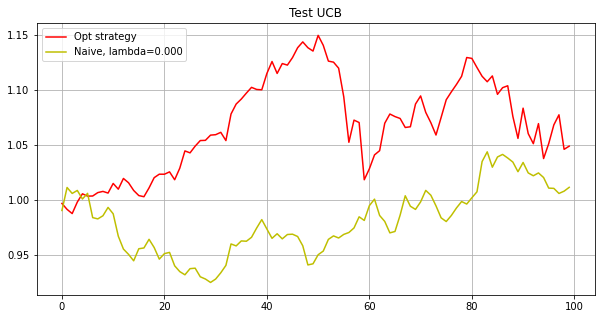

Phase 9
Testing...
./tmp2/res_phase09_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0111  0.0123  0.012   0.0089  0.01    0.0083  0.0107 -0.      0.0119
  0.0037  0.0074  0.0111  0.0066  0.0064  0.0083  0.0041  0.0079  0.0094
  0.0093  0.0081  0.0109  0.0093  0.0087  0.0096  0.0058  0.0102  0.013
  0.0145  0.0104  0.0099  0.0066  0.0144  0.0091  0.0107  0.0123  0.0101
  0.0065  0.0092  0.0129  0.0139  0.0119  0.011   0.009   0.0044  0.0104
  0.0143  0.0131  0.009   0.0102  0.0133  0.0065  0.013   0.0104  0.0107
  0.0105  0.0079  0.0086  0.0103  0.0113  0.0137  0.0106  0.0106  0.0107
  0.0119  0.0107  0.0084  0.0101  0.0091  0.0143  0.0102  0.0112  0.0135
  0.0122  0.0105  0.0098  0.0095  0.0098  0.0085  0.0127  0.0088  0.0095
  0.0066  0.0089  0.0101  0.0096  0.01    0.0074  0.0118  0.009   0.0102
  0.0101  0.0121  0.0083  0.014   0.0129  0.0104  0.009   0.0117  0.0091
  0.0111

[ 0.0119  0.0188  0.0004  0.0056  0.0111  0.0009  0.0123  0.0075  0.0226
  0.0002  0.0001  0.0069  0.      0.0004  0.0015  0.0023  0.      0.0071
 -0.     -0.      0.0157  0.0078 -0.      0.0221  0.0076  0.0137  0.0205
  0.0148  0.0115  0.011   0.0157  0.0094  0.0143  0.0168  0.0073  0.008
  0.0016  0.      0.0135  0.0131  0.0243  0.     -0.      0.      0.0128
  0.0084  0.0183  0.0104  0.0125  0.0209  0.0124  0.0244  0.007   0.0076
  0.0127  0.0103  0.0066  0.0231  0.0148  0.03    0.0099  0.0076  0.0118
  0.0166  0.0117  0.0125  0.0151  0.0124  0.0163  0.0189  0.0085  0.0269
  0.0209  0.012   0.0175  0.0168  0.0087  0.      0.0014  0.0073  0.0058
 -0.      0.0075  0.0038  0.0171  0.0186  0.0112  0.006   0.001   0.
  0.0048  0.0072  0.0084  0.0115  0.0085  0.0138  0.0095  0.0055  0.0093
  0.007 ]
0.0469199689622307
[ 0.0119  0.0189  0.0004  0.0056  0.0111  0.0009  0.0123  0.0074  0.0226
  0.0002  0.0001  0.0069  0.      0.0004  0.0015  0.0023 -0.      0.0071
  0.      0.      0.0157  0

[ 0.013   0.0193  0.0001  0.005   0.0112  0.0001  0.0127  0.0089  0.0235
  0.      0.0007  0.0052  0.      0.0009  0.0016  0.      0.0002  0.0067
 -0.      0.0021  0.0141  0.0053 -0.      0.0248  0.0056  0.0139  0.0236
  0.0155  0.0113  0.0113  0.0106  0.006   0.013   0.018   0.0057  0.007
  0.0001 -0.      0.0141  0.0105  0.0259 -0.      0.0026  0.      0.0132
  0.0102  0.0155  0.0083  0.0125  0.0211  0.0128  0.0282  0.0071  0.0058
  0.0134  0.0123  0.0074  0.0226  0.0162  0.0294  0.011   0.0073  0.0114
  0.0191  0.0123  0.0152  0.0169  0.013   0.0205  0.0188  0.0062  0.0306
  0.0219  0.011   0.0136  0.0184  0.0051 -0.     -0.      0.0071  0.0054
 -0.      0.0077  0.002   0.017   0.0189  0.0148  0.0028  0.005   0.0004
  0.0098  0.0057  0.0087  0.0121  0.0042  0.0127  0.0071  0.0054  0.0081
  0.0062]
7.371093575024069e-05
[ 0.013   0.0193  0.0001  0.005   0.0112  0.0001  0.0127  0.0089  0.0235
 -0.      0.0007  0.0052  0.      0.0009  0.0016  0.      0.0002  0.0067
 -0.      0.0021  0.

[ 0.0141  0.0203  0.      0.0039  0.0115  0.      0.0128  0.      0.0259
 -0.      0.      0.006   0.     -0.      0.002   0.      0.      0.0066
 -0.      0.      0.0128  0.0058  0.      0.026   0.0039  0.0139  0.024
  0.0167  0.0109  0.0134  0.0128  0.0072  0.0107  0.0191  0.0078  0.0052
 -0.      0.      0.0159  0.0071  0.0284  0.      0.0016  0.      0.0136
  0.0063  0.0133  0.0082  0.0132  0.0231  0.016   0.032   0.005   0.0059
  0.0138  0.0131  0.004   0.0262  0.0145  0.032   0.0122  0.0057  0.0122
  0.0205  0.0119  0.0181  0.0185  0.0132  0.0194  0.0181  0.0062  0.0322
  0.024   0.0121  0.0117  0.0189  0.007   0.      0.      0.0061  0.0048
  0.      0.0081  0.0027  0.0195  0.0235  0.0129  0.0002  0.0031  0.
  0.008   0.0045  0.0063  0.0123  0.0013  0.013   0.0111  0.0054  0.0052
  0.0035]
3.348339308718815e-05
[ 0.0141  0.0203  0.      0.0039  0.0115  0.      0.0128  0.      0.0259
 -0.      0.      0.006   0.     -0.      0.002   0.      0.      0.0066
 -0.      0.      0.0128

[ 0.0145  0.0207 -0.      0.0023  0.0114  0.      0.0129  0.0031  0.0262
 -0.      0.0001  0.0078 -0.      0.     -0.      0.      0.0005  0.0065
 -0.      0.      0.0115  0.0071  0.      0.0242  0.0015  0.0135  0.0239
  0.0166  0.0115  0.0133  0.0137  0.0046  0.0102  0.0191  0.0081  0.0049
 -0.     -0.      0.0148  0.0045  0.0293 -0.      0.0021  0.      0.0138
  0.0065  0.0109  0.0091  0.0133  0.0242  0.0164  0.0331  0.0053  0.0046
  0.0141  0.0141  0.0026  0.0261  0.0124  0.0322  0.0093  0.0048  0.0126
  0.0217  0.0117  0.0204  0.02    0.0137  0.0197  0.0226  0.0047  0.0339
  0.0242  0.011   0.0098  0.0205  0.0068  0.     -0.      0.0051  0.0051
 -0.      0.0077  0.0028  0.019   0.0243  0.0113  0.0001  0.0037  0.0001
  0.0076  0.0058  0.0034  0.0134  0.      0.015   0.0098  0.0066  0.0085
  0.0041]
0.00023046339723263828
[ 0.0145  0.0207 -0.      0.0023  0.0114  0.      0.0129  0.0031  0.0262
 -0.      0.0001  0.0078 -0.      0.     -0.      0.      0.0005  0.0065
 -0.     -0.      

[ 0.0139  0.0216 -0.      0.0009  0.0113  0.      0.013  -0.      0.0264
 -0.     -0.      0.0084 -0.     -0.      0.      0.0013  0.      0.0057
 -0.     -0.      0.008   0.0069 -0.      0.0231  0.0011  0.0126  0.0235
  0.0157  0.0133  0.0129  0.0134  0.0051  0.0095  0.0211  0.0085  0.0016
  0.     -0.      0.0158  0.0031  0.0315  0.      0.      0.0001  0.0139
  0.0054  0.0115  0.0085  0.0126  0.0266  0.0187  0.0297  0.0059  0.0039
  0.0143  0.0149  0.0003  0.0259  0.0098  0.031   0.0089  0.0063  0.0139
  0.0221  0.0115  0.0203  0.0203  0.0159  0.0184  0.0249  0.0063  0.0386
  0.0235  0.0115  0.0093  0.0215  0.0072  0.0007  0.      0.0041  0.0043
  0.0036  0.0096  0.0035  0.019   0.0264  0.0079  0.      0.0031 -0.
  0.0093  0.0053  0.0011  0.0136 -0.      0.0152  0.0099  0.0059  0.0083
  0.0063]
0.00022828748603877556
[ 0.0139  0.0216 -0.      0.0009  0.0113 -0.      0.013  -0.      0.0264
 -0.     -0.      0.0084 -0.     -0.      0.      0.0013  0.      0.0057
 -0.     -0.      0.00

[ 0.0139  0.0217 -0.      0.0009  0.0113  0.      0.013  -0.      0.0264
 -0.     -0.      0.0084 -0.     -0.      0.      0.0013  0.      0.0057
  0.     -0.      0.008   0.0069 -0.      0.0231  0.0011  0.0126  0.0235
  0.0157  0.0133  0.0129  0.0134  0.0051  0.0095  0.0211  0.0085  0.0016
  0.     -0.      0.0158  0.0031  0.0315  0.      0.      0.      0.0139
  0.0054  0.0115  0.0085  0.0126  0.0266  0.0187  0.0297  0.0059  0.0039
  0.0143  0.0149  0.0003  0.0259  0.0098  0.031   0.0089  0.0063  0.0139
  0.0221  0.0115  0.0203  0.0203  0.0159  0.0184  0.025   0.0063  0.0386
  0.0235  0.0115  0.0093  0.0215  0.0072  0.0007 -0.      0.0041  0.0043
  0.0036  0.0096  0.0035  0.019   0.0264  0.0079  0.      0.0031 -0.
  0.0093  0.0053  0.0011  0.0136 -0.      0.0152  0.0099  0.0059  0.0083
  0.0063]
0.00013840511503197545
[ 0.0139  0.0216  0.      0.0009  0.0113  0.      0.013  -0.      0.0264
 -0.     -0.      0.0084 -0.     -0.     -0.      0.0013 -0.      0.0057
  0.      0.      0.00

[ 0.0139  0.0217 -0.      0.0009  0.0113 -0.      0.013   0.      0.0265
  0.     -0.      0.0084  0.      0.      0.      0.0013  0.      0.0058
  0.      0.      0.008   0.0069  0.      0.0231  0.0011  0.0126  0.0235
  0.0157  0.0133  0.0129  0.0134  0.0051  0.0095  0.0211  0.0085  0.0016
  0.      0.      0.0158  0.0031  0.0315  0.      0.      0.      0.0139
  0.0054  0.0115  0.0085  0.0126  0.0266  0.0187  0.0297  0.0059  0.0039
  0.0143  0.0149  0.0003  0.0259  0.0098  0.031   0.0089  0.0063  0.0139
  0.0221  0.0115  0.0203  0.0203  0.0159  0.0184  0.0249  0.0063  0.0386
  0.0235  0.0115  0.0093  0.0215  0.0072  0.0006  0.      0.0041  0.0043
  0.0036  0.0096  0.0035  0.019   0.0264  0.0079  0.      0.0031 -0.
  0.0093  0.0053  0.0011  0.0136 -0.      0.0152  0.0099  0.0059  0.0083
  0.0063]
9.101097338934687e-05
[ 0.0139  0.0217  0.      0.0009  0.0113 -0.      0.013  -0.      0.0265
  0.     -0.      0.0084 -0.      0.      0.      0.0013  0.      0.0058
  0.      0.      0.008

[ 0.0139  0.0217  0.      0.0009  0.0113  0.      0.013  -0.      0.0264
  0.     -0.      0.0084  0.      0.      0.      0.0013  0.      0.0058
  0.      0.0001  0.008   0.0069  0.      0.0231  0.0011  0.0126  0.0235
  0.0157  0.0133  0.0129  0.0134  0.0051  0.0095  0.0211  0.0085  0.0016
  0.      0.      0.0158  0.0031  0.0315 -0.     -0.      0.      0.0139
  0.0054  0.0115  0.0085  0.0126  0.0266  0.0187  0.0297  0.0059  0.0039
  0.0143  0.0149  0.0003  0.0259  0.0098  0.031   0.0089  0.0063  0.0139
  0.0221  0.0114  0.0203  0.0203  0.0159  0.0184  0.0249  0.0063  0.0386
  0.0235  0.0115  0.0093  0.0215  0.0072  0.0007  0.      0.0041  0.0043
  0.0036  0.0096  0.0035  0.019   0.0264  0.0079  0.      0.0031  0.
  0.0093  0.0053  0.0011  0.0136  0.      0.0152  0.0099  0.0059  0.0083
  0.0063]
0.00010800019038359657
[ 0.0139  0.0217  0.      0.0009  0.0113  0.      0.013   0.      0.0264
 -0.     -0.      0.0084  0.      0.      0.      0.0013  0.      0.0058
  0.      0.      0.00

[ 0.0142  0.0222  0.      0.0004  0.0113 -0.      0.0129  0.      0.027
  0.      0.      0.0091  0.      0.      0.      0.0009  0.      0.0056
  0.     -0.      0.0076  0.007   0.      0.0232  0.0003  0.0128  0.0231
  0.0157  0.0136  0.0131  0.0136  0.0053  0.009   0.0209  0.0105  0.0002
  0.     -0.      0.0169  0.0028  0.0317 -0.      0.0001 -0.      0.014
  0.004   0.0117  0.0089  0.0125  0.0272  0.019   0.0292  0.006   0.0033
  0.0144  0.0147  0.0011  0.0261  0.0091  0.0306  0.0088  0.0049  0.014
  0.0225  0.0112  0.0203  0.0215  0.0172  0.0177  0.0248  0.0064  0.0393
  0.0244  0.011   0.0085  0.0211  0.0069  0.0002  0.0007  0.0037  0.004
  0.0025  0.0082  0.0036  0.0193  0.0275  0.0086 -0.      0.0035 -0.
  0.0079  0.0051  0.0019  0.0127 -0.      0.0161  0.0113  0.005   0.0084
  0.0067]
0.0003021093058555417
[ 0.0142  0.0222  0.      0.0004  0.0113 -0.      0.0129  0.      0.027
 -0.      0.      0.0091  0.     -0.     -0.      0.0009  0.      0.0056
 -0.     -0.      0.0076  0.

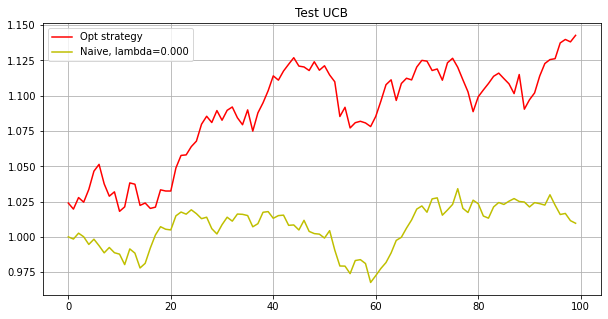

Phase 10
Testing...
./tmp2/res_phase10_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
4.857566113236622e-09
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01

[0.0105 0.01   0.0097 0.0099 0.0101 0.0099 0.0101 0.0103 0.0097 0.0095
 0.0105 0.0097 0.0098 0.0097 0.0103 0.0096 0.0093 0.0095 0.0097 0.01
 0.0102 0.011  0.0104 0.0104 0.011  0.0102 0.0104 0.0096 0.0102 0.0095
 0.0099 0.0099 0.0103 0.0107 0.0102 0.0095 0.0104 0.0102 0.0106 0.0115
 0.0101 0.01   0.0104 0.0109 0.0095 0.0102 0.0094 0.0109 0.009  0.0099
 0.0088 0.011  0.0096 0.0108 0.0096 0.0096 0.0102 0.0094 0.0109 0.011
 0.0098 0.0098 0.01   0.0109 0.0104 0.0098 0.0096 0.0104 0.0093 0.01
 0.0099 0.0102 0.01   0.0096 0.0103 0.0101 0.0115 0.0087 0.0082 0.0102
 0.0098 0.0103 0.0096 0.0096 0.01   0.0101 0.0087 0.0086 0.0107 0.0094
 0.0102 0.0098 0.0097 0.0098 0.0099 0.0097 0.0103 0.0101 0.0098 0.0104]
0.0002707572968299581
[0.0105 0.01   0.0096 0.0099 0.01   0.0099 0.0101 0.0103 0.0097 0.0095
 0.0105 0.0097 0.0098 0.0097 0.0103 0.0096 0.0093 0.0095 0.0097 0.01
 0.0102 0.011  0.0104 0.0104 0.011  0.0102 0.0104 0.0096 0.0102 0.0095
 0.0099 0.0099 0.0103 0.0107 0.0102 0.0095 0.0104 0.0102 0.01

[0.0112 0.0101 0.0089 0.0098 0.0101 0.0098 0.0102 0.0106 0.009  0.0089
 0.0113 0.0095 0.0087 0.0097 0.0082 0.0102 0.0092 0.0087 0.0085 0.01
 0.0104 0.0108 0.0107 0.011  0.0109 0.0105 0.0098 0.0088 0.0103 0.0105
 0.01   0.0085 0.0111 0.013  0.011  0.0095 0.0106 0.0113 0.0109 0.0111
 0.0103 0.0101 0.0118 0.0109 0.009  0.0102 0.0088 0.01   0.0091 0.0102
 0.008  0.0109 0.0112 0.0114 0.0089 0.009  0.0096 0.0088 0.0119 0.0105
 0.0096 0.0096 0.0107 0.0119 0.01   0.0102 0.0096 0.0085 0.0086 0.01
 0.0099 0.0102 0.0099 0.0091 0.0111 0.0097 0.0108 0.0096 0.0081 0.0104
 0.0093 0.0097 0.01   0.0094 0.01   0.0105 0.0092 0.0075 0.0101 0.0091
 0.0099 0.01   0.0112 0.0097 0.01   0.0095 0.0107 0.0109 0.0098 0.0122]
7.63555597592478e-06
[0.0112 0.0101 0.0089 0.0098 0.0101 0.0098 0.0102 0.0106 0.009  0.0089
 0.0113 0.0095 0.0087 0.0097 0.0082 0.0102 0.0092 0.0087 0.0085 0.01
 0.0104 0.0108 0.0107 0.011  0.0109 0.0105 0.0098 0.0088 0.0103 0.0105
 0.01   0.0085 0.0111 0.013  0.011  0.0095 0.0106 0.0113 0.01

[0.0129 0.0103 0.0083 0.0099 0.0102 0.0092 0.0106 0.0132 0.0086 0.008
 0.0126 0.0077 0.0088 0.0125 0.0096 0.0095 0.0085 0.0059 0.0113 0.0104
 0.0108 0.0107 0.0117 0.0124 0.011  0.0115 0.0094 0.0091 0.0106 0.0094
 0.0107 0.0093 0.0099 0.0143 0.0135 0.0107 0.0113 0.0107 0.013  0.0183
 0.0123 0.01   0.0109 0.012  0.0077 0.0101 0.0079 0.0068 0.0087 0.011
 0.008  0.0091 0.0161 0.0113 0.0078 0.0065 0.0094 0.0056 0.014  0.0106
 0.0075 0.0125 0.0134 0.014  0.0095 0.0101 0.009  0.0088 0.0045 0.0102
 0.0089 0.0106 0.0106 0.0085 0.01   0.0105 0.0093 0.0016 0.0028 0.0102
 0.0085 0.0102 0.0099 0.009  0.0105 0.0109 0.0102 0.0043 0.0092 0.008
 0.0091 0.0102 0.0116 0.0099 0.01   0.0078 0.0129 0.0117 0.0097 0.0114]
3.2486864102033823e-07
[0.0129 0.0103 0.0083 0.0099 0.0102 0.0092 0.0106 0.0132 0.0086 0.008
 0.0126 0.0077 0.0088 0.0125 0.0096 0.0095 0.0085 0.0059 0.0113 0.0104
 0.0108 0.0107 0.0117 0.0124 0.011  0.0115 0.0094 0.0091 0.0106 0.0094
 0.0107 0.0093 0.0099 0.0143 0.0135 0.0107 0.0113 0.0107 

[ 0.011   0.011   0.0049  0.01    0.0108  0.0083  0.0106  0.0163  0.0064
  0.0072  0.015   0.0081  0.0062  0.0114  0.0119  0.0085  0.0074  0.0065
  0.0075  0.0107  0.012   0.0127  0.0134  0.0146  0.0116  0.0117  0.0093
  0.0076  0.0104  0.0092  0.0103  0.0097  0.0047  0.0173  0.0173  0.0099
  0.0138  0.0138  0.0164  0.0171  0.0133  0.0092  0.0093  0.0144  0.006
  0.0107  0.0073  0.0024  0.0041  0.0122  0.006   0.011   0.0225  0.0127
  0.0081  0.004   0.0109 -0.      0.0196  0.0093  0.0039  0.0126  0.0121
  0.0163  0.0086  0.0099  0.0077  0.0058  0.0034  0.0102  0.0111  0.0116
  0.0142  0.0069  0.0101  0.0102  0.0106  0.0021  0.0024  0.0077  0.0086
  0.0103  0.0128  0.0102  0.0103  0.0101  0.01   -0.      0.009   0.0127
  0.01    0.0096  0.0143  0.0105  0.01    0.0013  0.013   0.013   0.0096
  0.0116]
0.0003826656333043491
[ 0.011   0.011   0.0049  0.01    0.0108  0.0083  0.0106  0.0163  0.0064
  0.0072  0.015   0.0081  0.0062  0.0114  0.0119  0.0085  0.0074  0.0065
  0.0075  0.0107  0.

[ 0.011   0.0111  0.0049  0.01    0.0108  0.0083  0.0106  0.0163  0.0064
  0.0072  0.0151  0.0081  0.0062  0.0114  0.0119  0.0085  0.0074  0.0065
  0.0075  0.0107  0.012   0.0127  0.0134  0.0146  0.0116  0.0117  0.0093
  0.0076  0.0104  0.0092  0.0103  0.0097  0.0047  0.0173  0.0173  0.0099
  0.0138  0.0138  0.0164  0.0171  0.0133  0.0092  0.0093  0.0144  0.006
  0.0107  0.0073  0.0024  0.0041  0.0122  0.006   0.011   0.0225  0.0127
  0.0081  0.004   0.0109 -0.      0.0196  0.0093  0.0039  0.0126  0.0121
  0.0163  0.0086  0.0099  0.0077  0.0059  0.0034  0.0102  0.0111  0.0116
  0.0142  0.0069  0.0101  0.0102  0.0106  0.0021  0.0024  0.0077  0.0086
  0.0103  0.0128  0.0102  0.0103  0.0101  0.01    0.      0.009   0.0127
  0.01    0.0096  0.0143  0.0105  0.01    0.0013  0.013   0.013   0.0096
  0.0116]
1.463403485664386e-05
[0.011  0.0111 0.0049 0.01   0.0108 0.0083 0.0106 0.0163 0.0064 0.0072
 0.0151 0.0081 0.0062 0.0114 0.0119 0.0085 0.0074 0.0065 0.0075 0.0107
 0.012  0.0127 0.0134 0.

[ 0.0109  0.0115  0.0046  0.0103  0.0112  0.0078  0.0112  0.0176  0.0066
  0.0076  0.0155  0.0067  0.0044  0.0091  0.0138  0.0093  0.0058  0.0026
  0.0055  0.0111  0.0126  0.0147  0.0146  0.0155  0.0119  0.0125  0.0079
  0.0065  0.0119  0.0102  0.009   0.0108  0.0068  0.0205  0.0203  0.0075
  0.0156  0.0112  0.0165  0.0153  0.0149  0.0085  0.0112  0.0169  0.0042
  0.0108  0.0086  0.0033  0.0036  0.0125  0.0051  0.0131  0.0214  0.0129
  0.0078  0.003   0.0107  0.      0.0203  0.0088  0.      0.0153  0.0122
  0.0191  0.0089  0.011   0.0066  0.0021  0.0029  0.0104  0.0115  0.0118
  0.0157  0.0059  0.0122  0.0114  0.0052 -0.      0.0004  0.0099  0.0077
  0.0102  0.0133  0.0101  0.011   0.0088  0.0078  0.0035  0.0084  0.011
  0.0123  0.0076  0.0108  0.0097  0.0104  0.001   0.0116  0.0148  0.01
  0.015 ]
2.4189290005317437e-05
[ 0.0109  0.0115  0.0046  0.0103  0.0112  0.0078  0.0112  0.0176  0.0066
  0.0075  0.0155  0.0067  0.0044  0.0091  0.0138  0.0093  0.0058  0.0026
  0.0055  0.0111  0.0

[ 0.0109  0.0115  0.0046  0.0103  0.0112  0.0078  0.0112  0.0176  0.0066
  0.0075  0.0155  0.0067  0.0044  0.0091  0.0138  0.0093  0.0058  0.0026
  0.0056  0.0111  0.0126  0.0147  0.0146  0.0155  0.0119  0.0125  0.0079
  0.0065  0.0119  0.0102  0.009   0.0108  0.0068  0.0205  0.0203  0.0075
  0.0156  0.0112  0.0165  0.0153  0.015   0.0085  0.0112  0.0169  0.0042
  0.0108  0.0086  0.0033  0.0036  0.0125  0.0051  0.0132  0.0214  0.0129
  0.0078  0.003   0.0107 -0.      0.0203  0.0088  0.      0.0153  0.0122
  0.0191  0.0089  0.011   0.0066  0.0021  0.0029  0.0104  0.0115  0.0118
  0.0157  0.0059  0.0122  0.0114  0.0052  0.      0.0004  0.0099  0.0077
  0.0102  0.0133  0.0101  0.011   0.0088  0.0078  0.0035  0.0084  0.011
  0.0123  0.0076  0.0108  0.0097  0.0104  0.001   0.0117  0.0148  0.01
  0.015 ]
4.750062090819018e-05
[0.0109 0.0115 0.0046 0.0103 0.0112 0.0078 0.0112 0.0176 0.0066 0.0075
 0.0155 0.0067 0.0044 0.0091 0.0138 0.0093 0.0058 0.0026 0.0056 0.0111
 0.0126 0.0147 0.0146 0.01

[ 0.0135  0.0119  0.0033  0.0104  0.0116  0.0059  0.0112  0.0185  0.0063
  0.0068  0.0172  0.0053  0.0004  0.0087  0.0142  0.0098  0.0048 -0.
  0.0052  0.0114  0.0134  0.0187  0.0162  0.0173  0.0105  0.0139  0.0065
  0.0056  0.0128  0.0111  0.0096  0.011   0.0065  0.0237  0.0206  0.0088
  0.0175  0.0137  0.0186  0.015   0.0185  0.0084  0.0094  0.0179  0.0039
  0.0105  0.0085  0.0051  0.003   0.0133  0.0041  0.0126  0.0217  0.0141
  0.0079  0.0015  0.0096 -0.      0.0219  0.0102 -0.      0.0151  0.0106
  0.0212  0.0085  0.0116  0.0061  0.      0.      0.0109  0.0129  0.0121
  0.0181  0.0051  0.0115  0.0132  0.003  -0.     -0.      0.0088  0.0078
  0.0095  0.0143  0.0108  0.0096  0.0072  0.0048  0.      0.0093  0.0123
  0.011   0.0062  0.0136  0.0086  0.011   0.      0.0109  0.0158  0.01
  0.0093]
0.0006195751186359425
[ 0.0135  0.0119  0.0033  0.0104  0.0116  0.0059  0.0112  0.0185  0.0063
  0.0068  0.0172  0.0053  0.0004  0.0087  0.0142  0.0098  0.0048 -0.
  0.0052  0.0114  0.0134  0.0

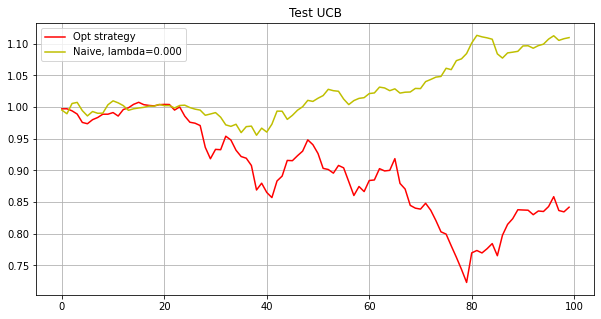

Phase 11
Testing...
./tmp2/res_phase11_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
1.705610431189386e-08
[0.0101 0.0104 0.0092 0.0101 0.0103 0.0109 0.0065 0.0143 0.0083 0.0091
 0.0107 0.0127 0.0104 0.0111 0.0104 0.0091 0.0081 0.0096 0.0179 0.0091
 0.0102 0.0084 0.0095 0.011  0.0096 0.0112 0.0093 0.0089 0.0098 0.0076
 0.0149 0.0172 0.0099 0.0095 0.0095 0.0095 0.0075 0.01   0.0083 0

[ 0.0139  0.0137  0.      0.0135  0.0082  0.0161  0.0102  0.0162 -0.
  0.0093 -0.      0.02    0.0119  0.0207  0.0237  0.0019  0.0084  0.0316
  0.0032 -0.      0.0192  0.      0.0101  0.0228  0.0128  0.013   0.0074
  0.0035 -0.      0.0241  0.0124  0.0096  0.01    0.0043  0.0056  0.0077
 -0.      0.0001  0.0059  0.      0.      0.0231  0.0004 -0.      0.0054
  0.      0.0184 -0.      0.      0.0019  0.0066  0.0051  0.      0.
  0.0181  0.0267  0.0187  0.0157  0.0147  0.0279  0.0164  0.0267  0.0072
  0.0121  0.0205  0.0257 -0.      0.0073  0.015   0.0013  0.0013 -0.
  0.0155  0.0122  0.0136  0.0164  0.0046  0.0113  0.0037  0.0114  0.0129
  0.0028  0.0098  0.0193  0.0116  0.0162  0.0149  0.0342  0.0055  0.0006
  0.0095  0.0003  0.0229  0.0093  0.     -0.      0.0056  0.0002  0.0231
  0.0052]
0.12497991908697875
[ 0.0139  0.0137  0.      0.0135  0.0082  0.0161  0.0102  0.0162 -0.
  0.0093 -0.      0.02    0.0119  0.0207  0.0237  0.0019  0.0084  0.0316
  0.0032 -0.      0.0192  0.      0.0

[ 0.0158  0.0135 -0.      0.0136  0.0079  0.0164  0.0069  0.0141 -0.
 -0.      0.      0.0204  0.0122  0.02    0.0266  0.0008  0.0125  0.0245
  0.0002  0.0001  0.0159  0.      0.0101  0.025   0.0136  0.0167  0.0056
  0.     -0.      0.0234  0.0218  0.0044  0.0063  0.0026  0.0075  0.004
 -0.      0.      0.0018  0.     -0.      0.0167  0.      0.0022  0.0051
  0.      0.0251  0.0011  0.008   0.      0.0059  0.0006  0.      0.0078
  0.0194  0.0291  0.0223  0.0159  0.0166  0.0333  0.0186  0.024   0.013
  0.0113  0.0213  0.0277  0.0033  0.0042  0.0168  0.0032  0.009   0.
  0.0132  0.0122  0.0085  0.0209  0.0054  0.0059  0.0014  0.0122  0.0138
  0.0032  0.0111  0.0184  0.0072  0.0208  0.0136  0.032   0.0048  0.
  0.0103  0.      0.0196  0.0084  0.0013 -0.      0.0031 -0.      0.0204
  0.0063]
0.00021665994685350756
[ 0.0165  0.0135 -0.      0.0137  0.0078  0.0165  0.0057  0.015   0.
  0.0007  0.0001  0.0207  0.0121  0.0209  0.0267  0.0011  0.0128  0.0246
  0.      0.      0.015   0.      0.

[ 0.0168  0.0135  0.      0.0135  0.008   0.0168  0.0058  0.013  -0.
 -0.     -0.      0.0206  0.0121  0.0204  0.0272  0.      0.0138  0.0259
  0.      0.      0.0139 -0.      0.0096  0.0278  0.0146  0.0143  0.0073
  0.0008 -0.      0.0227  0.0198  0.0037  0.0065  0.0011  0.0071  0.0044
 -0.      0.      0.0037  0.      0.0017  0.0179  0.0007  0.0004  0.0081
 -0.      0.0226  0.      0.0082  0.      0.0053 -0.     -0.      0.0027
  0.0201  0.0308  0.0262  0.0186  0.0182  0.0371  0.0188  0.0221  0.0118
  0.0103  0.0222  0.0259  0.      0.0038  0.0171  0.      0.0106  0.0008
  0.0114  0.0119  0.0046  0.0176  0.0039  0.0054  0.0021  0.0111  0.0139
  0.0048  0.0122  0.0222  0.0062  0.0211  0.0182  0.0339  0.0043  0.
  0.0104  0.0006  0.0172  0.0076  0.0021 -0.      0.003  -0.      0.0215
  0.0062]
4.478505123292952e-05
[ 0.0168  0.0135 -0.      0.0135  0.008   0.0168  0.0058  0.013   0.
  0.     -0.      0.0206  0.0121  0.0204  0.0272  0.      0.0138  0.0259
  0.      0.      0.0139 -0.   

[ 0.0172  0.0135  0.      0.0136  0.0081  0.017   0.0057  0.0139 -0.
 -0.      0.      0.0217  0.0119  0.0202  0.0278  0.      0.0153  0.0249
  0.0006  0.      0.0122  0.      0.0097  0.029   0.015   0.0134  0.006
  0.0005 -0.      0.0219  0.0206  0.0031  0.0058  0.0006  0.0072  0.0044
  0.     -0.      0.0044  0.      0.0018  0.0194  0.0011  0.      0.0059
  0.      0.0221  0.0007  0.0056  0.      0.005  -0.      0.0004  0.0004
  0.0205  0.0308  0.0237  0.0198  0.0167  0.0378  0.0186  0.0212  0.0128
  0.0125  0.0226  0.0255 -0.      0.0039  0.0177 -0.      0.0112  0.0011
  0.0105  0.0119  0.0046  0.0194  0.0045  0.0042  0.0019  0.0104  0.0142
  0.0048  0.0126  0.0231  0.0047  0.0213  0.0187  0.0342  0.0039  0.
  0.0108 -0.      0.0191  0.0074  0.0025  0.      0.0026  0.      0.0223
  0.0062]
0.00012010484591544311
[ 0.0172  0.0135  0.      0.0136  0.0081  0.017   0.0057  0.0139 -0.
 -0.      0.      0.0217  0.0119  0.0202  0.0278  0.      0.0153  0.0249
  0.0006  0.      0.0122  0.   

[ 0.0171  0.0135  0.      0.0136  0.0081  0.017   0.0057  0.0139 -0.
 -0.      0.      0.0217  0.0119  0.0202  0.0278 -0.      0.0153  0.0249
  0.0006 -0.      0.0122  0.      0.0097  0.029   0.015   0.0134  0.006
  0.0005 -0.      0.0219  0.0206  0.0031  0.0058  0.0006  0.0071  0.0044
 -0.     -0.      0.0044 -0.      0.0018  0.0194  0.0011 -0.      0.0059
 -0.      0.0221  0.0007  0.0056 -0.      0.005  -0.      0.0004  0.0004
  0.0205  0.0309  0.0238  0.0198  0.0167  0.0378  0.0186  0.0212  0.0128
  0.0125  0.0226  0.0255 -0.      0.0039  0.0177  0.      0.0112  0.0011
  0.0105  0.0119  0.0046  0.0194  0.0045  0.0042  0.0019  0.0104  0.0142
  0.0048  0.0126  0.0231  0.0047  0.0213  0.0187  0.0342  0.0039  0.
  0.0108  0.      0.0191  0.0074  0.0025  0.      0.0026  0.0001  0.0223
  0.0061]
0.00024462101022041294
[ 0.0171  0.0135  0.      0.0136  0.0081  0.017   0.0057  0.0139 -0.
 -0.      0.      0.0217  0.0119  0.0202  0.0278 -0.      0.0153  0.0249
  0.0006 -0.      0.0122  0.   

[ 0.0194  0.0138  0.      0.0143  0.0082  0.0183  0.0037  0.0242  0.
  0.      0.0006  0.0218  0.0122  0.021   0.0282  0.0004  0.0175  0.0231
  0.      0.      0.0064 -0.      0.0088  0.0308  0.0153  0.0141  0.003
  0.0004  0.      0.0201  0.0174  0.0071  0.0045 -0.      0.0093  0.0046
  0.      0.      0.002   0.      0.0049  0.0117 -0.      0.0042  0.0002
 -0.      0.0185  0.      0.0077  0.0011  0.0041  0.0001 -0.      0.0005
  0.0216  0.0244  0.0229  0.0198  0.0204  0.0439  0.0179  0.0268  0.0108
  0.0103  0.0255  0.0253  0.      0.0041  0.0207  0.      0.0098  0.
  0.015   0.0126  0.0002  0.0176  0.0043  0.0002  0.      0.0072  0.0155
  0.0055  0.0118  0.0235  0.0008  0.022   0.0232  0.0389  0.003   0.0047
  0.0088  0.0007  0.0188  0.0061 -0.      0.      0.      0.0025  0.0253
  0.0042]
7.425638181553839e-05
[ 0.0194  0.0138 -0.      0.0143  0.0081  0.0183  0.0037  0.0242  0.
  0.      0.0006  0.0218  0.0122  0.021   0.0282  0.0004  0.0175  0.0231
 -0.      0.      0.0064  0.    

[ 0.0194  0.0138  0.      0.0143  0.0081  0.0183  0.0037  0.0242  0.
 -0.      0.0005  0.0218  0.0122  0.021   0.0282  0.0005  0.0174  0.0231
 -0.      0.      0.0064  0.      0.0088  0.0308  0.0153  0.0141  0.003
  0.0003 -0.      0.0201  0.0174  0.0071  0.0045  0.      0.0093  0.0046
 -0.      0.0001  0.002   0.      0.0049  0.0117  0.      0.0042  0.0002
  0.      0.0185  0.      0.0077  0.0011  0.0041  0.0002  0.      0.0005
  0.0216  0.0244  0.0229  0.0198  0.0204  0.0439  0.0179  0.0268  0.0108
  0.0102  0.0255  0.0253 -0.      0.0041  0.0206 -0.      0.0098 -0.
  0.015   0.0126  0.0002  0.0176  0.0043  0.0002  0.      0.0072  0.0155
  0.0055  0.0118  0.0235  0.0008  0.022   0.0232  0.0389  0.003   0.0047
  0.0088  0.0007  0.0188  0.0061  0.     -0.     -0.      0.0025  0.0253
  0.0042]
0.0001853104620300574
[ 0.0196  0.0138 -0.      0.0143  0.0081  0.0184  0.0034  0.0217 -0.
  0.      0.0003  0.0218  0.0121  0.0209  0.0284  0.0003  0.0178  0.0227
  0.0002  0.      0.0066 -0.    

[ 0.019   0.0137  0.      0.0143  0.008   0.0187  0.0022  0.0238 -0.
  0.0012  0.0006  0.0219  0.012   0.0216  0.0292  0.0001  0.0186  0.0206
 -0.     -0.      0.0049  0.      0.0085  0.0317  0.0158  0.0133  0.002
  0.0013 -0.      0.0196  0.0167  0.0074  0.0039  0.      0.0091  0.004
  0.0001 -0.      0.003  -0.      0.0048  0.0095  0.0004  0.0042  0.0012
 -0.      0.0189  0.0009  0.0076  0.0007  0.0034  0.     -0.      0.0002
  0.0221  0.0237  0.0215  0.0205  0.0192  0.0451  0.0187  0.0277  0.0107
  0.012   0.026   0.025   0.0012  0.0036  0.0203  0.0002  0.0104  0.
  0.015   0.0126  0.0001  0.0185  0.0032  0.     -0.      0.0069  0.016
  0.0056  0.0127  0.0247 -0.      0.0235  0.0245  0.0392  0.0027  0.005
  0.0079 -0.      0.02    0.0059  0.0006  0.      0.0003  0.      0.0257
  0.003 ]
0.018790694562400446
[ 0.019   0.0137  0.      0.0143  0.008   0.0187  0.0022  0.0238 -0.
  0.0012  0.0006  0.0219  0.012   0.0216  0.0292  0.0001  0.0186  0.0206
 -0.     -0.      0.0049  0.      0.

[ 0.0181  0.0138  0.      0.0146  0.0077  0.0191  0.0027  0.0265  0.
  0.0037  0.      0.0221  0.0121  0.0217  0.0292  0.      0.0194  0.0177
  0.     -0.      0.0026 -0.      0.0086  0.0335  0.0158  0.0138  0.0013
  0.0019  0.      0.0221  0.0218  0.0063  0.0026  0.      0.0084  0.0028
  0.      0.      0.0021 -0.      0.0017  0.0078  0.0023  0.0037  0.0031
  0.      0.0205  0.      0.004   0.0012  0.0031  0.0022 -0.     -0.
  0.0222  0.0229  0.0222  0.0198  0.0165  0.0467  0.0187  0.028   0.0076
  0.0073  0.027   0.0257  0.0025  0.0039  0.0207  0.0009  0.0104  0.0003
  0.0142  0.0127  0.      0.0195  0.0022  0.0009  0.      0.0059  0.0162
  0.0043  0.0127  0.0247  0.      0.026   0.0251  0.0376  0.002   0.0037
  0.0078  0.0015  0.0202  0.0055  0.     -0.      0.0011  0.0007  0.0275
  0.0031]
0.00032864759725433995
[ 0.0177  0.0138 -0.      0.0147  0.0078  0.0193  0.0025  0.0225 -0.
  0.003   0.      0.0221  0.0121  0.022   0.0294  0.      0.0203  0.0157
  0.0002  0.      0.0023  0.  

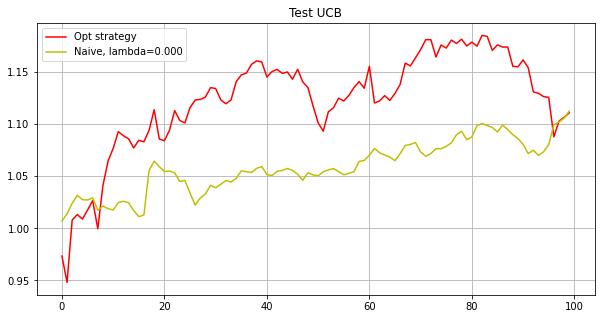

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.79735132
Mean return: 1.00048871
Naive strategy
Total return: 2.64346537
Mean return: 1.00081040


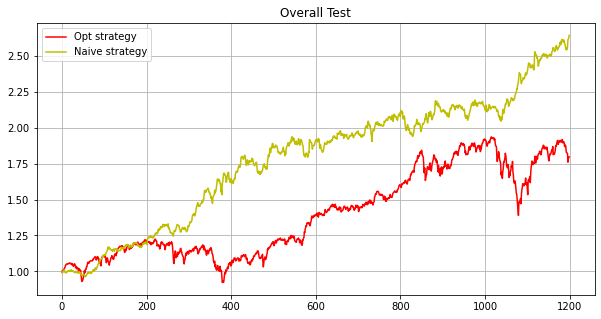

In [17]:
paras={'maxiter':5000, 'subn':100, 'lb':5, 'M':20, 'inverse':'True', 'ggd':'True', 'matcnt':30}

eps = 1.001
delta = 0.01
run(paras, c=0.001, eps=eps, delta=delta, testv=np.arange(-0.02, 0.0100001, 0.002))

## HATS mat 0 + GGD

    #!/bin/bash

    maxiter=5000
    subn=100
    lb=5
    M=20
    inverse='True'
    ggd='True'
    matid=''

    matcnt=$(echo ${matid} | wc -w)
    for i in `seq 0 11`;
    # for i in 10;
    do
        echo "phase $i"
            python main2.py --phase $i --maxiter ${maxiter} --subn ${subn} --lb ${lb} --inverse ${inverse} --matid ${matid} --M ${M} --ggd ${ggd} --gpu 1  > ./log/main2_noval_inv${inverse}_ggd${ggd}_M${M}_iter${maxiter}_mat${matcnt}_subn${subn}_lb5_s5_log${i}.log
    done

Phase 0
Testing...
./tmp2/snp500-12_phase00_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.
  0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.1  0.  -0.
 -0.  -0.  -0.   0.3 -0.   0.   0.   0.  -0.   0.  -0.  -0.  -0.  -0.
  0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.
  0.   0.  -0.   0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.   0.
 -0.  -0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.  -0.   0.   0.3
  0.   0.  -0.   0.3 -0.   0.   0.   0.  -0.   0.   0.  -0.   0.   0.
  0.  -0. ]
[-0.  -0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.  -0.  -0.  -0.  -0.
  0.   0.   0.   0.  -0.  -0.  -0.  -0.   0.3  0.   0.3  0.   0.  -0.
 -0.  -0.   0.   0.3 -0.   0.   0.   0.   0.   0.  -0.  -0.  -0.   0.
  0.   0.  -0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.  -

[ 0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.      0.0002 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1002 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.1729  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.3
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.   

[0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.1113 0.     0.
 0.     0.     0.2675 0.     0.     0.     0.     0.     0.     0.
 0.     0.0212 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.     -0.     -0.      0.081  -0.     -0.     -0.      0.0206 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2964
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1623 -0.     -0.     -0. 

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0716 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.0284 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.      0.     -0.      0.      0.     -0.     -0.      0.2195  0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.0138 -0.      0.      0.1667  0.      0.
 -0.      0.      0.      0.      0.     -0.     -0.      0.     -0.
  0.      0.      0.      0.      0.     -0.     

[-0.     -0.     -0.      0.3    -0.     -0.      0.0985 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0052 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2962 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.
  0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.   0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.  -0.  -0.  -0.  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0669 -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1804 -0.     -0.      0.1527 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.    ]
[0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.2503 0.     0.     

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.   0.   0.  -0.  -0.   0.3 -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.1 -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.   0.  -0.   0.3 -0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.
  0.  -0. ]
[-0.     -0.     -0.      0.1746 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.      0.2254  0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.   

[-0.     -0.     -0.      0.1933 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0569
 -0.     -0.     -0.     -0.      0.3    -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1148 -0.      0.0351 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.1023 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.

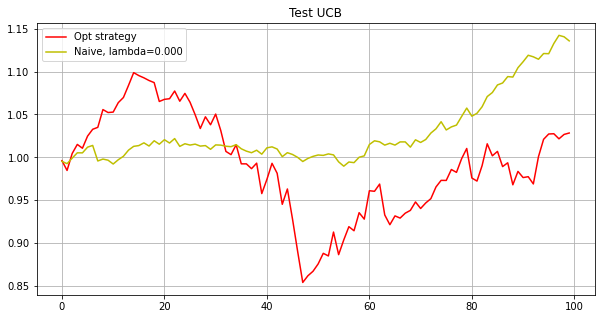

Phase 1
Testing...
./tmp2/snp500-12_phase01_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.     0.     0.     0.2734 0.     0.     0.     0.     0.     0.
 0.     0.0315 0.     0.0952 0.     0.     0.3    0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.2835
 0.     0.     0.     0.     0.     0.     0.     0.     0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1748 -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0545 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1708  0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[0.     0.     0.     0.0329 0.     0.     0.     0.     0.093  0.
 0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.1815
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.  

[0.     0.     0.     0.137  0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.2345 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0285]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1655 -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.3    0.3    0.     0.     0.2293 0.     0.     0.
 0.     0.     0.     0.     0.     0.1354 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0352 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3     0.0283 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0717 -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    

[-0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.3
  0.   0.  -0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3
  0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.3  0.   0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.
  0.   0.  -0.   0.   0.   0.   0.   0.1  0.   0.   0.   0.   0.   0.
  0.   0. ]
[-0.     -0.     -0.      0.0872 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0505 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0. 

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.2631
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1369 0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.0273 0.     0.     0.     0.     0.
 0.     0.     0.2989 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.1783 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0. 

[-0.     -0.     -0.      0.1372 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2628 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.      0.1321 -0.     -0.     -0.      0.      0.
 -0.     -0.      0.      0.      0.065   0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2029 -0.
 -0.     -0.      0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1686 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2314 -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.3   ]
[-0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.
  0.   0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.   0.   0.   0.   0.3  0.  -0.  -0.   0.  -0.   0.   0.   0.3  0.3
  0.   0.   0.  -0. 

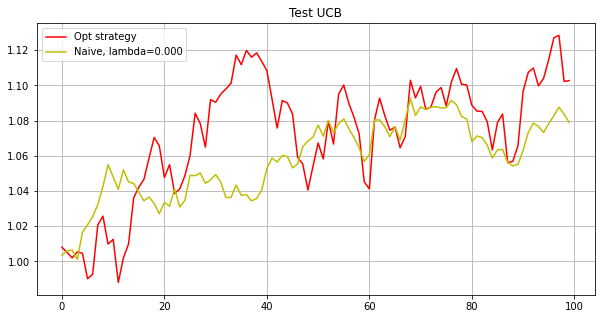

Phase 2
Testing...
./tmp2/snp500-12_phase02_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.
 -0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.
 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.   0.   0.  -0.   0.   0.   0.  -0.   0.
  0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
  0.   0.3  0.   0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
  0.  -0. ]
[ 0.      0.      0.     -0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.0536  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.3     0.      0

[ 0.      0.      0.      0.      0.      0.      0.2784  0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.0551  0.      0.      0.      0.
  0.      0.      0.1286  0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.     -0.     -0.      0.3
 -0.     -0.      0.     -0.     -0.     -0.      0.0553  0.      0.
 -0.      0.     -0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.1827  0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.
 -0.    ]
[ 0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.3  0.   0.   0.
  0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0. 

[-0.     -0.     -0.     -0.     -0.     -0.      0.2713 -0.     -0.
 -0.     -0.     -0.      0.0094 -0.     -0.     -0.     -0.     -0.
  0.      0.3    -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.0208 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.3
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
  0.0985 -0.     -0.      0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.    ]
[-0.      0.      0.     -0.      0.      0.3     0.2065  0.      0.
 -0.      0.      0.      0.     -0.     -0.      0.     -0.      0.
  0.     -0.      0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.      0.   

[-0.  -0.  -0.  -0.   0.1 -0.   0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.
 -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.   0.
  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.
  0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
  0.  -0. ]
[ 0.      0.      0.      0.      0.      0.189   0.      0.      0.
  0.      0.3     0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0727  0.3     0.      0.
  0.     -0.   

[0.     0.0241 0.     0.     0.     0.0881 0.0766 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.0009 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.0477 0.0534 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.1084 0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.0006 0.     0.     0.     0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.      0.3    -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1069 -0.     -0.     -0.     -0.
 -0.      0.023  -0.     -0.     -0.     -0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.1007 -0.     -0.     -0.     -0.     -0.
 -0.      0.0539 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2454
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.    ]
[ 0.      0.      0.     -0.      0.0552 -0.      0.      0.      0.
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.      0.1995  0.      0.     -0.      0.      0.
  0.      0.      0.

[0.     0.     0.     0.     0.     0.     0.0117 0.     0.     0.
 0.     0.     0.     0.     0.0676 0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0207 0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.     -0.     -0.     -0.     -0.      0.0762 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0634 -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.0594 

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.      0.      0.2782  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.1218  0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.      0.     -0.      0.     -0.      0.     -0.      0.      0.
  0.      0.3     0.      0.      0.      0.     -0.      0.     -0.
 -0.      0.3    -0.     -0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.    

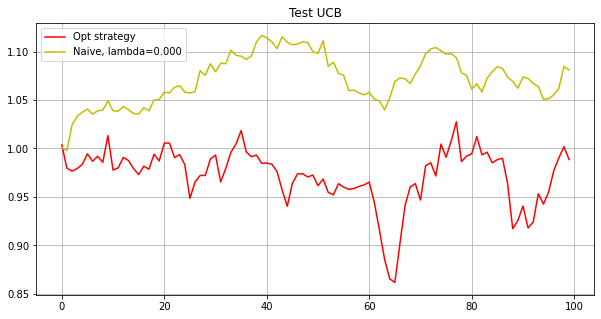

Phase 3
Testing...
./tmp2/snp500-12_phase03_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.      0.2002 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.1998
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
[0.     0.     0.     0.     0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1219 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2781 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.    

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0611 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.2361 0.     0.     0.048  0.     0.
 0.     0.     0.     0.     0.     0.     0.0548 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.1
  0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.

[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.1  0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.
  0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.
  0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.3    -0.     -0.      0.      0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.      0.     -0.      0.0002 -0.     -0.     -0.     -0.      0.051
  0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0488  0.     -0.     -0.      0.      0.      0.
 -0.     -0.

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.
 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.3  0.  -0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.  -0.
  0.   0.  -0.   0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.   0.  -0.  -0.   0.   0.   0.  -0.  -0.   0.1 -0.  -0.  -0.   0.
  0.  -0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.
  0.  -0.   0.3 -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.  -0

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.      0.      0.      0.0627  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.0373  0.      0.      0.      0.      0.      0.      0.3     0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.3     0.      0.      0.      0.
  0.    ]
[-0.     -0.      0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.1863 -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.      0.     -0.      0.3    -0.
 -0.     -0.     -0.    

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.      0.3     0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.      0.      0.1814  0.      0.      0.
 -0.      0.1277  0.      0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.      0.3     0.     -0.     -0.     -0.     -0.
  0.      0.      0.0909  0.     -0.     -0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.     -0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.1676 0.     0.     0.
 0.0971 0.     0.     0.     0

[ 0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.1232 -0.     -0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
  0.      0.0285 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.      0.      0.3     0.3     0.0418  0.     -0.
  0.      0.     -0.     -0.      0.2066  0.      0.      0.      0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.0845  0.
  0.      0.     -0.    

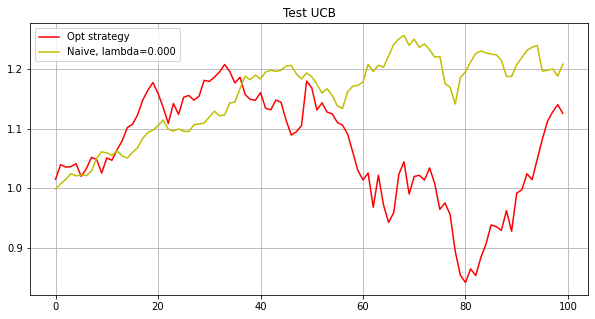

Phase 4
Testing...
./tmp2/snp500-12_phase04_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.      0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.1037 -0.      0.      0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.      0.0978  0.     -0.      0.     -0.     -0.      0.3
 -0.      0.      0.      0.     -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.1985 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.      0

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.3     0.     -0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1199 -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2801 -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0

[ 0.0556 -0.     -0.     -0.      0.0798 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2647 -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.3 -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.3  0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.1103 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.2088 0.     0.     0.     0.2982 0.     0.
 0.     0.     0.0693 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0116 0.     0.     0.     0.     0.     0.     0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.2122  0.3     0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.    

[ 0.1094  0.      0.      0.0094  0.      0.      0.      0.1051  0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.1547  0.      0.      0.      0.      0.      0.
  0.      0.      0.2012 -0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.0481  0.
 -0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.      0.057   0.      0.      0.      0.      0.0152  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.      0.2167 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.1944  0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.      0.0611 -0.      0.
 -0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.0389  0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.      0.      0.3    -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.3     0.      0.     -0.      0.3     0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.3     0.      0.     -0.
 -0.     -0.      0.     -0.      0.      0.1591 -0.     -0.      0.
 -0.      0.1908 -0.    

[-0.     -0.     -0.     -0.      0.2038 -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.2334  0.
  0.     -0.      0.      0.     -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.      0.      0.      0.3     0.2628 -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[ 0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.  -0.   0.  -0.  -0.
  0.   0.3  0.  -0.   0.   0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.
 -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.  -0.   0.3 -0.   0.
 -0.   0.   0.   0.3 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0283 -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0717 -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.0944  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.    

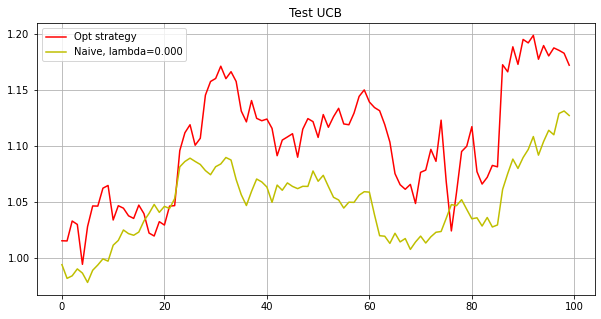

Phase 5
Testing...
./tmp2/snp500-12_phase05_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.     -0.      0.      0.2181  0.     -0.      0.      0.
  0.      0.     -0.      0.      0.3     0.      0.     -0.      0.1473
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.      0.      0.     -0.     -0.      0.      0.3
  0.0346  0.      0.      0.      0.     -0.     -0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
[-0.    -0.    -0.    -0.    -0

[-0.     -0.      0.     -0.     -0.     -0.      0.3    -0.      0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.      0.      0.      0.1499 -0.     -0.      0.
 -0.     -0.      0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.2501 -0.      0.      0.      0.3     0.      0.     -0.
  0.     -0.      0.     -0.     -0.     -0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.1588  0.      0.
  0.      0.      0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.3     0.      0.
  0.      0.     -0.    

[ 0.      0.      0.      0.      0.      0.      0.169   0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.3     0.      0.      0.0237  0.      0.
  0.      0.     -0.      0.1341  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.      0.1994  0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.1597  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0141  0.      0.      0.
  0.    ]
[-0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.      0.3     0.      0.      0.      0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.      0.    

[-0.  -0.  -0.   0.3 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[ 0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.     -0.     -0.      0.      0.2176
  0.     -0.     -0.      0.      0.3    -0.      0.     -0.      0.1306
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.038
 -0.     -0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.

[ 0.      0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
  0.      0.     -0.      0.0662 -0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.     -0.      0.      0.3    -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.      0.2047 -0.     -0.     -0.
  0.      0.3    -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.1291 -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.
  0.   0.   0.   0.  

[ 0.      0.      0.      0.      0.     -0.      0.3    -0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.0642 -0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.0962  0.      0.
  0.      0.     -0.     -0.      0.     -0.      0.2271  0.     -0.
  0.     -0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0282 -0.      0.2843 -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.   0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.   0.3
  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.1 -0.  -0. 

[-0.     -0.     -0.      0.2545 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0053  0.0522  0.3
 -0.     -0.     -0.     -0.     -0.      0.      0.3    -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.0879 -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.    ]
[ 0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.1
  0.   0.   0.   0.

[-0.     -0.     -0.      0.0622 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.3     0.3
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.3    -0.      0.      0.      0.      0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.     -0.      0.      0.      0.0378 -0.      0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.     -0.      0.     -0.      0.      0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.   

[-0.     -0.      0.     -0.     -0.     -0.      0.1486 -0.     -0.
 -0.     -0.     -0.     -0.      0.2514 -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.3    -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.     -0.      0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
 -0.    ]
[ 0.     -0.      0.      0.      0.     -0.      0.3    -0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.3    -0.     -0.      0.      0.      0.
 -0.     -0.     -0.    

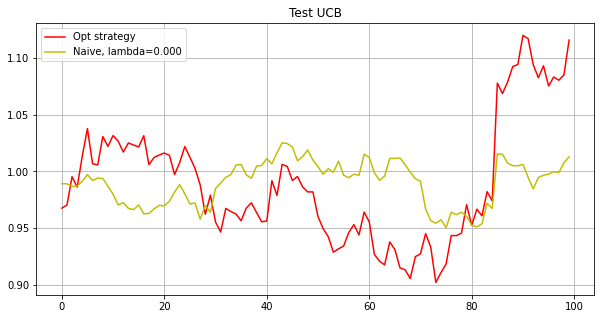

Phase 6
Testing...
./tmp2/snp500-12_phase06_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0724 -0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.1082 -0.      0.     -0.     -0.
  0.0912 -0.     -0.     -0.     -0.     -0.      0.0313 -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.3
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0969 -0.      0.      0.      0.      0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.
  0.      0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0

[0.     0.     0.     0.1036 0.     0.     0.     0.     0.0265 0.
 0.     0.     0.     0.     0.     0.     0.2365 0.     0.     0.
 0.     0.     0.     0.     0.0215 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0118 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.      0.3    -0.     -0.     -0.      0.      0.1766
  0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0. 

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.1 -0.   0.3 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0. ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0032
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.      0.3    -0.      0.0007
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.   

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.2821
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.3     0.      0.3     0.      0.
  0.      0.1179  0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.0099 -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.0702
 -0.      0.    

[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.1045
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.      0.      0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.2955 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.      0.1228 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.     -0

[-0.     -0.     -0.     -0.      0.0044 -0.     -0.     -0.      0.0002
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.1444 -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0683 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1826 -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.     -0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.2342 -0.
  0.      0.      0.

[ 0.      0.      0.     -0.      0.0907 -0.      0.     -0.      0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.0211  0.
  0.     -0.     -0.      0.2389  0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.1928 -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.3     0.     -0.     -0.      0.      0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.      0.      0.1564 -0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[-0.      0.     -0.     -0.      0.0423 -0.     -0.     -0.     -0.
  0.0984  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2593 -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.      0.     -0.      0.      0.1308
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
  0.      0.     -0

[ 0.      0.      0.      0.2583 -0.     -0.     -0.     -0.      0.3
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.1417 -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
[ 0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0689 -0.
 -0.     -0.      0.      0.      0.0243 -0.     -0.      0.3    -0.
  0.     -0.     -0.   

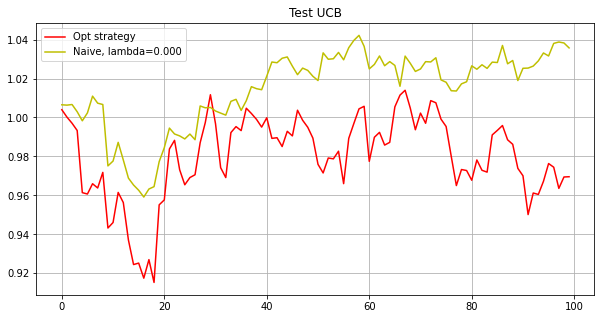

Phase 7
Testing...
./tmp2/snp500-12_phase07_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1327 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.2673
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.      0.0597 -0.    

[-0.   0.  -0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.1
 -0.   0.   0.  -0.  -0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.  -0.  -0.   0.  -0.   0.   0.3 -0.  -0.  -0.   0.  -0.   0.   0.
 -0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.3  0.   0.  -0.   0.   0.   0.3 -0.   0.  -0.  -0.  -0.  -0.
 -0.   0.   0.   0.  -0.  -0.   0.  -0.   0.   0.   0.  -0.  -0.  -0.
 -0.   0.   0.   0.   0.   0.  -0.  -0.   0.   0.  -0.   0.  -0.   0.
  0.   0. ]
[-0.     0.     0.136 -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.     0.    -0.    -0.    -0.    -0.    -0.    -0.     0.3   -0.
  0.264 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.     0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
  0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.   

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.1979 0.     0.     0.2991 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.2015 0.     0.     0.     0.     0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.0615 0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.1825 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.1525
 0.     0.     0.     0.     0.     0.     0.     0. 

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0933 0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.0067 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.09 0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.01 0.   0.   0.   0.   0.
 0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.

[-0.     0.     0.     0.     0.     0.     0.    -0.     0.     0.
  0.     0.     0.    -0.    -0.     0.     0.    -0.    -0.     0.
  0.     0.     0.    -0.     0.    -0.     0.     0.078 -0.     0.
  0.    -0.    -0.     0.     0.3    0.     0.    -0.     0.     0.022
  0.    -0.    -0.     0.     0.    -0.    -0.     0.     0.     0.
  0.     0.     0.     0.     0.    -0.     0.     0.     0.     0.
  0.    -0.    -0.     0.     0.    -0.     0.3   -0.    -0.     0.
  0.     0.     0.     0.    -0.     0.    -0.     0.     0.     0.
  0.     0.     0.     0.3    0.     0.    -0.     0.    -0.     0.
  0.    -0.    -0.     0.    -0.     0.    -0.     0.     0.    -0.   ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
 -0.      0.3     0.      0.     -0.     -0.      0.      0.2109  0.
  0.     -0.      0.      0.      0. 

[-0.     0.    -0.    -0.    -0.     0.    -0.    -0.    -0.    -0.
 -0.     0.     0.    -0.    -0.    -0.     0.185 -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.     0.3   -0.    -0.    -0.    -0.     0.215
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.     0.     0.3   -0.    -0.    -0.    -0.    -0.     0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.     0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.   ]
[ 0.   0.   0.3  0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.1
  0.   0.   0.  -0.  -0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
  0.  -0.  -0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.3  0.   0.
 -0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.3  0.   0.
  0.  -0.   0.   0.  -0.   0.   

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.2621  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.1379  0.
  0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.   0.   0.1  0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.  -0.  -0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.
 -0.   0.  -0.  -0.  -0.   0.   0.3 -0.  -0.  -0.   0.   0.3  0.   0.
 -0.   0.   0.  -0.  

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.1 -0. ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0964 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0036 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.    

[-0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.      0.3     0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.094   0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.      0.2834
  0.      0.0226 -0.     -0.     -0.     -0.      0.      0.      0.3
 -0.      0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.    ]
[ 0.      0.      0.1473 -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0

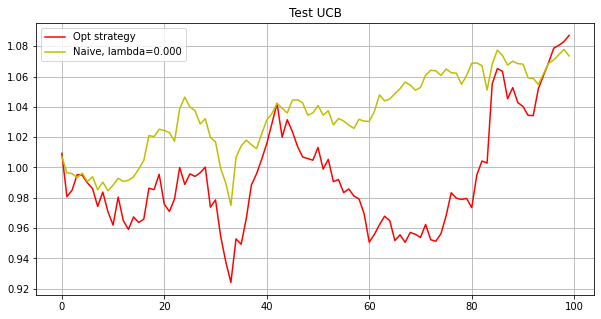

Phase 8
Testing...
./tmp2/snp500-12_phase08_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.
 -0.   0.  -0.   0.3  0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.  -0.   0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.   0.1
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[0.2575 0.     0.     0.     0.     0.     0.     0.2695 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0001
 0.     0.     0.     0.     0.     0.     0.     0.06   0.     0.
 0.     0.     0.     0.     0

[0.1309 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.1976 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.0715 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.  -0.   0.  -0.  -0.
 -0.   0.   0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.   0.  -0.   0.1
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.
  0.  -0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.   0.  -0.  -0.
 -0.   0.3 -0.   0.  -0.   0.   0.  -0.  -0.

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.0659 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.2599 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0742 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.   0.  -0.   0.
  0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.3 -0.  -0.  -0.   0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.3
  0.   0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.   0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.

[0.3    0.     0.     0.     0.097  0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.2952 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0071 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.0531  0.      0.      0.      0.1851  0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.1618  0.3     0.     -0.     -0.      0.      0.      0.      0.
  0.      0.     -0.      0.     -0.     -0.     

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.0594  0.021   0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.3     0.      0.      0.      0.3     0.
  0.      0.      0.0196  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.1677 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0358 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0642 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[0.     0.     0.     0.     0.0679 0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0321
 0.     0.     0.     0.  

[ 0.1374 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2626 -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.    ]
[-0.      0.     -0.     -0.      0.0739  0.      0.      0.3    -0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.0852 -0.    

[ 0.3     0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.      0.     -0.      0.      0.      0.      0.      0.     -0.
 -0.      0.     -0.      0.      0.2051  0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.     -0.
 -0.      0.3     0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.1949  0.      0.      0.     -0.      0.      0.     -0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1604
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.

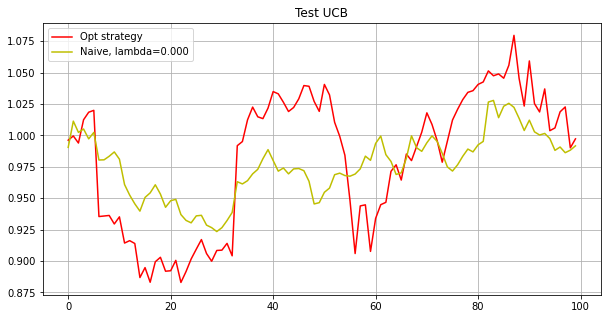

Phase 9
Testing...
./tmp2/snp500-12_phase09_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.2821 -0.      0.      0.      0.2289  0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.2212  0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.2678 -0.      0.      0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.

[-0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.   0.   0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.   0.  -0.  -0.
  0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.
 -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.   0.   0.
  0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0. ]
[0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.1 0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.3 0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.3 0.
 0.3 0.  0.  0.  0.  0.  0.  0.  0.  0. ]
[ 0.     -0.     -0.     -0.     -0.      0.     -0.      0.1999  0.
  0.     -0.     -0.     -0

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0416 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.0584 -0.     -0.      0.3    -0.     -0.     -0.
  0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.
 -0.   0.  -0.   0.  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1566 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.      0.2434 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.0148
 -0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
  0.      0.      0.

[0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0988 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0012 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.0818 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     

[ 0.     -0.     -0.     -0.     -0.      0.     -0.      0.2049  0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.     -0.     -0.      0.      0.     -0.      0.      0.1951 -0.
  0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.      0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.      0.      0.3     0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.199  0

[ 0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.1  0.   0.   0.   0.
  0.   0.  -0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
[ 0.     -0.     -0.     -0.     -0.      0.     -0.      0.1933  0.
  0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.2067  0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.     -0.
  0.     -0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.      0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.   

[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2153 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0923 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1776 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2149 -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

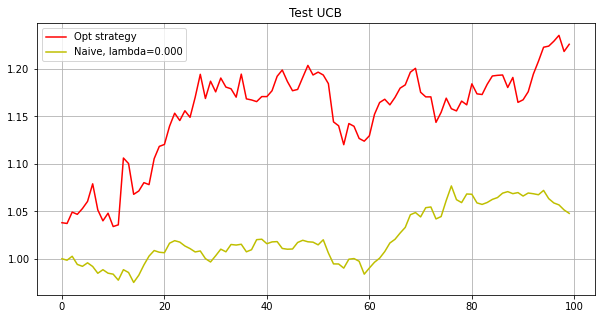

Phase 10
Testing...
./tmp2/snp500-12_phase10_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.0292
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0708 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.    ]
[0.     0.     0.     0.     0.

[-0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.  -0.   0.   0.
  0.1  0.   0.   0.   0.  -0.   0.   0.3  0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0. ]
[-0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.3 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
  0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.3  0.  -0.
 -0.  -0.   0.3 -0.   0.  -0.  -0.  -0.   0.   0.   0.   0.   0.  -0.
  0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.   0.   0.  -0.
 -0.   0

[ 0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.2181  0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.0899  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0919  0.      0.      0.
  0.3   ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.3 -0.  -0.  -0.  

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.   0.1 -0.   0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0017
 -0.     -0.     -0.     -0.      0.0284 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1213 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0

[-0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.  -0.   0.  -0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.
 -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.
 -0.   0.  -0.  -0.  -0.   0.  -0.   0.   0.  -0.   0.3 -0.   0.   0.
 -0.   0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.
  0.  -0.   0.3  0.   0.  -0.  -0.   0.1  0.   0.   0.   0.   0.  -0.
  0.   0.   0.   0.  -0.  -0.  -0.   0.   0.   0.   0.   0.3  0.  -0.
 -0.   0. ]
[ 0.     -0.      0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.      0.      0.      0.     -0.     -0.      0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.     -0.   

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.
 -0.  -0.   0.   0.   0.  -0.   0.  -0.   0.  -0.  -0.   0.  -0.   0.
 -0.  -0.  -0.   0.   0.   0.   0.   0.3 -0.   0.   0.   0.3  0.1 -0.
 -0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.  -0.
  0.  -0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.
  0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.   0.   0.   0.  -0.
 -0.   0. ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.   0.  -0.   0.1 -0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.   0.   0.   0.3 -0.   0.  -0.   0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.   0.   0.   0.   0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.
 -0.  -0.   0.3  0.   0.  -0.  -0.  -0.   0.   0.   0.   0.   0.  -0.
  0.3  0.   0.  -0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.   0.  -0.
 -0.   0

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.3  0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.
 -0.  -0.   0.   0.   0.1 -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.
 -0.  -0.   0.  -0.   0.  -0.  -0.  -0.   0.   0.   0.   0.   0.  -0.
  0.  -0.   0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.   0. ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.2729 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.2687 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     

[-0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.3  0.   0.
  0.1  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.  -0.
 -0.   0. ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.     -0.      0.3    -0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.2103  0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.   

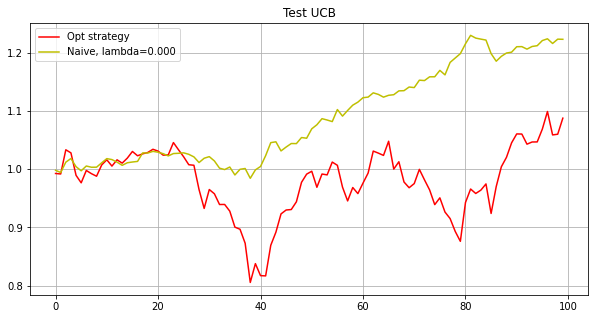

Phase 11
Testing...
./tmp2/snp500-12_phase11_iter5000_subn100_lb5_M20_matcnt0_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.      0.     -0.      0.      0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.2827  0.1173 -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.     -0.      0.      0.3
 -0.      0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.      0.      0.      0.      0.      0.     -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.      0.
  0.    ]
[ 0.  -0.  -0.   0.  -0.   0.  -0.

[-0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.
 -0.  -0.  -0.   0.3 -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.   0.3
  0.  -0.  -0.   0.1  0.   0.   0.  -0.   0.   0.   0.  -0.   0.  -0.
 -0.   0.   0.3  0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.
 -0.  -0.   0.   0.  -0.   0.   0.   0.  -0.  -0.   0.   0.   0.  -0.
 -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.
  0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.   0.   0.  -0.  -0.   0.
 -0.   0. ]
[ 0.     -0.     -0.      0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.3
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.      0.3     0.      0.      0.     -0.
 -0.      0.      0.      0.      0.     -0.     -0.      0.     -0.
  0.     -0.      0.0765 -0.      0.     -0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.     -0.      0.      0.      0.
 -0.     -0. 

[ 0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.     -0.     -0.     -0.
  0.3     0.     -0.      0.      0.      0.     -0.      0.      0.
  0.2633 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.     -0.     -0.      0.      0.      0.     -0.     -0.      0.1367
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.      0.3     0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -

[0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0994
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.2995 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.     -0.      0.      0.      0.      0.      0.      0.1312  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.3    -0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.3     0.0997  0.      0.      0.      0.
  0.      0.      0.      0.      0.     -0. 

[ 0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2209 -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.3     0.     -0.     -0.      0.      0.     -0.      0.      0.
 -0.     -0.     -0.      0.1791 -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0376 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.    

[ 0.   0.  -0.   0.  -0.   0.  -0.   0.3 -0.  -0.   0.   0.   0.   0.
  0.  -0.  -0.   0.   0.1  0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.  -0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.
  0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.
 -0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.   0.  -0.   0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.
 -0.   0. ]
[ 0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.3     0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.246  -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
  0.      0.      0.3    -0.      0.     -0.      0.      0.      0.
  0.     -0.   

[ 0.  -0.  -0.   0.  -0.   0.  -0.   0.3 -0.  -0.   0.   0.   0.   0.
 -0.  -0.  -0.   0.3 -0.  -0.   0.   0.  -0.  -0.   0.   0.  -0.  -0.
  0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.  -0.
 -0.   0.  -0.   0.  -0.  -0.  -0.   0.  -0.   0.1  0.   0.   0.  -0.
 -0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.
  0.   0.   0.3  0.   0.   0.   0.  -0.   0.   0.   0.  -0.  -0.   0.
 -0.   0. ]
[ 0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0602 -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.019  -0.     -0.     -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.2247 -0.      0.1946 -0.
 -0.     -0.   

[0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.0677 0.     0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0323
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.     -0.     -0.      0.     -0.      0.      0.      0.3    -0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.3     0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0. 

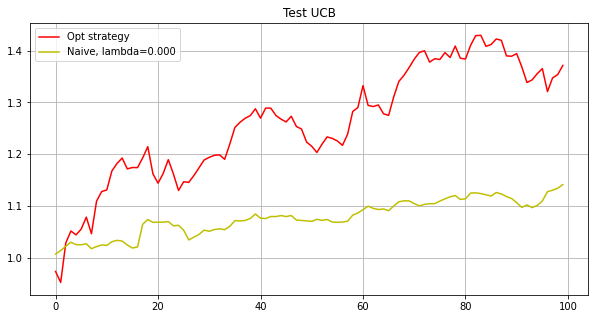

-----------------------------Final result-----------------------------
Opt strategy
Total return: 3.17211122
Mean return: 1.00096246
Naive strategy
Total return: 2.94555769
Mean return: 1.00090065


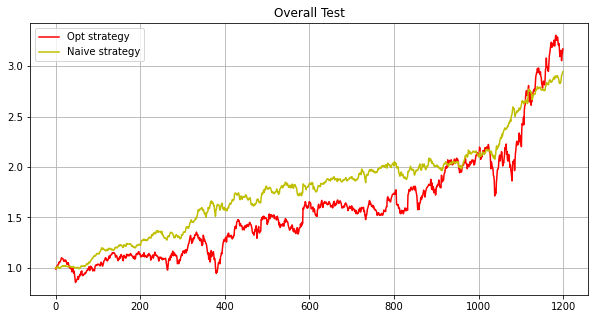

In [32]:
paras={'dataset':'snp500-12', 'maxiter':5000, 'subn':100, 'lb':5, 'M':20, 'inverse':'True', 'ggd':'True', 'matcnt':0}

gamma=3.0
run(paras, c=0.0, gamma=gamma, testv=np.arange(-0.02, 0.0100001, 0.002))

## HATS mat 30 + No GGD

    #!/bin/bash

    maxiter=5000
    subn=100
    lb=5
    M=20
    inverse='True'
    ggd='False'
    matid='48 35 83 25 84 19 21 71 24 68 81 38 51 56 77 43 80 15 30 60 69 37 73 62 34 54 57 70 39 42'

    matcnt=$(echo ${matid} | wc -w)
    for i in `seq 0 11`;
    # for i in 10;
    do
        echo "phase $i"
                python main2.py --phase $i --maxiter ${maxiter} --subn ${subn} --lb ${lb} --inverse ${inverse} --matid ${matid} --M ${M} --ggd ${ggd} --gpu 1  > ./log/main2_noval_inv${inverse}_ggd${ggd}_M${M}_iter${maxiter}_mat${matcnt}_subn${subn}_lb5_s5_log${i}.log
    done

Phase 0
Testing...
./tmp2/snp500-12_phase00_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.3     0.     -0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.3     0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.1416  0.
 -0.      0.      0.      0.      0.088   0.      0.1281 -0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.0423  0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[0.     0.     0.     0.     0.   

[ 0.      0.     -0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.     -0.      0.3
  0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.2091  0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.     -0.      0.      0.1909  0.      0.      0.      0.3     0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.      0.     -0.      0.     -0.     -0.     -0.
 -0.    ]
[ 0.     0.    -0.     0.     0.     0.     0.3   -0.     0.    -0.
  0.     0.     0.     0.    -0.    -0.    -0.    -0.     0.    -0.
  0.     0.     0.    -0.     0.     0.178 -0.    -0.     0.     0.
  0.     0.     0.    -0. 

[-0.     -0.     -0.     -0.     -0.     -0.      0.3     0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.     -0.      0.1276  0.     -0.     -0.     -0.
  0.1334 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.139  -0.     -0.      0.      0.
 -0.    ]
[ 0.      0.     -0.      0.0411  0.      0.      0.1607  0.      0.
  0.      0.      0.      0.      0.      0.      0.0835  0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.    

[ 0.1 -0.  -0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.3 -0.   0.
  0.   0.   0.   0.   0.   0.3 -0.  -0.  -0.   0.   0.   0.   0.  -0.
 -0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.3 -0.   0.
  0.   0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.   0.   0.   0.
  0.   0.   0.   0.  -0.  -0.   0.  -0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.
  0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.
  0.   0. ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.
 -0.   0.3 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.   0.1 -0.  -0.   0.   0.  -0.   0.  -0.   0.3 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
  0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.
 -0.  -0.  -0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.
  0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.3  0.   0.  -0.   0.   0.
  0.  -0

[ 0.0343 -0.     -0.     -0.      0.     -0.     -0.      0.0657 -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.3     0.3    -0.
 -0.      0.3    -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
 -0.    ]
[0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.   0.3
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.
  0.  -0.  -0.  -0.  -0.  -0.   0.   0.3 -0.   0.  -0.  -0.   0.   0.
  0.  -0. ]
[-0.     -0.     -0.      0.0566 -0.     -0.     -0.     -0.     -0.
 -0.      0.0775 -0.     -0.     -0.     -0.     -0.     -0.      0.0974
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -

[0.     0.     0.     0.257  0.     0.     0.0051 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.1313 0.     0.3
 0.     0.0066 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
  0.     0.     0.     0.     0.     0.     0.    -0.     0.     0.
  0.     0.066 -0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.034  0

[0.2199 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.1495 0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0306
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.3 -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.
  0.  -0.   0.   0.3 -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.  -0.
 -0.  -0.   0.   0.  -0.   0.1  0.   0.   0.   0.  -0.  -0.  -0.  -0.
  0.   0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.   0.3  0.
  0.  -0.  -0.   0.  -0.  -0.   0.  -0. 

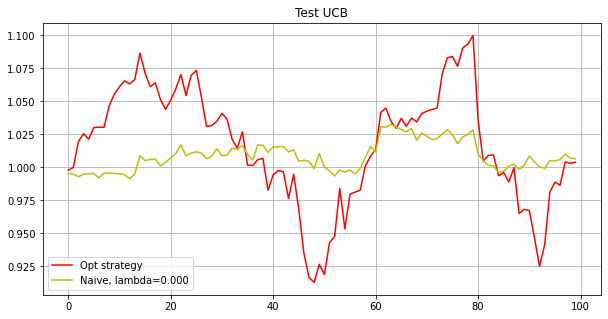

Phase 1
Testing...
./tmp2/snp500-12_phase01_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.   0.   0.   0.1  0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.3
  0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
[-0.     -0.     -0.      0.1562  0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.2438 -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.    

[0.     0.     0.     0.     0.0619 0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.0381 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.   0.   0.  -0.   0.   0.  -0.   0.3  0.   0.   0.3  0.   0.   0.
  0.   0.   0.1  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.
  0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.

[0.     0.     0.     0.1448 0.     0.     0.     0.3    0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.2092 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0461]
[0.3 0.  0.  0.1 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.3 0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.3 0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  

[ 0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0021
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0668 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1812 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1499 -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.   0.  -0.   0.   0.  -0.
  0.   0.  -0.   0.   0.   0.3  0.  -0.   0.  -0.   0.   0.1  0.  -0.
  0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.  -

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1  0.3 -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.2696 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.1304]
[0.     0.     0.     0.3    0.1283 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.3    0.     0.     0.
 0.     0.     0.     0.     0.     0.1075 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     

[-0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.   0.1 -0.   0.   0.  -0.
  0.   0.   0.3  0.   0.   0.   0.  -0.   0.  -0.   0.  -0.   0.  -0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.
  0.3  0.   0.  -0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.  -0.   0.   0.   0.   0.3 -0.   0.   0.   0.  -0.   0.
  0.   0.   0.  -0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
[-0.      0.     -0.     -0.     -0.      0.3    -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.      0.     -0.      0.0121  0.      0.
 -0.     -0.     -0.      0.2275 -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.3    -0.   

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2493 -0.     -0.
 -0.      0.0809 -0.     -0.     -0.     -0.     -0.      0.3    -0.
  0.005  -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.2967 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0685 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[0.2549 0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.0288 0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.0741 0.     0.     0.     0.
 0.     0.     0.     0.     0

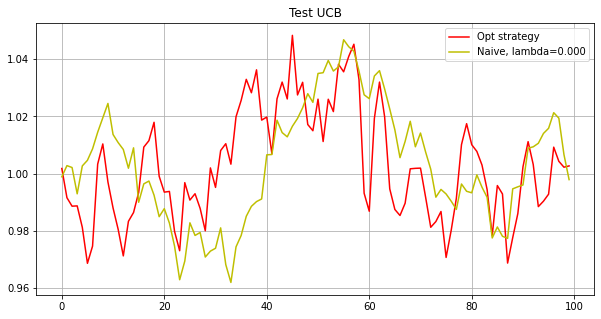

Phase 2
Testing...
./tmp2/snp500-12_phase02_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1943 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.2631 0.     0.     0.     0.     0.3    0.     0.     0.0522 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0798 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.1107 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.24

[ 0.      0.      0.0047 -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
  0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
  0.2715  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.215  -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.      0.2088 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.0374  0.      0.      0.      0.      0.      0.2701  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.0925  0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.    

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.2727
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0946 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.0327 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.   0.3
 -0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.  -0.  -0.  -0.  -0.   0.3 -0.   0.   0.  -0.  -0.   0.   0.
 -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.
  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0. 

[ 0.      0.      0.      0.      0.      0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.2202  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.1798  0.      0.3     0.      0.      0.      0.      0.
 -0.    ]
[-0.     -0.     -0.     -0.      0.1226  0.0574 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[-0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.   0.3
 -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.3  0.
  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
  0.  -0. ]
[ 0.2578  0.      0.      0.      0.      0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.1422  0.      0.3     0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.      0.
 -0.      0.  

[ 0.      0.      0.      0.      0.      0.2193  0.      0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.1807  0.      0.      0.     -0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.3     0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[-0.  -0.   0.  -0.   0.  -0.   0.  -0.  -0.  -0.   0.3 -0.   0.  -0.
 -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.
 -0.   0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.   0.  -0.   0.   0.1
 -0.  -0.  -0.   0.  -0.  -0.   0.   0.  -0.   0.   0.   0.   0.   0.
  0.   0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.
  0.  -0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.3 -0.   0.  -0.   0.
  0.  -0. ]
[ 0.1636  0.      0.      0.      0.      0.1973  0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.0087  0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.     -0.      0.      0.2856
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.3     

[ 0.      0.      0.0719  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.0048  0.      0.3     0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.0233  0.      0.      0.      0.3     0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.122   0.      0.      0.      0.      0.      0.
  0.      0.2141  0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.    

[0.     0.     0.1156 0.     0.     0.     0.     0.     0.     0.159
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0859 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.0395 0.     0.     0.     0.     0.     0.3    0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.  -0.  -0.  -0.   0.1 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.3  0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.
  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  

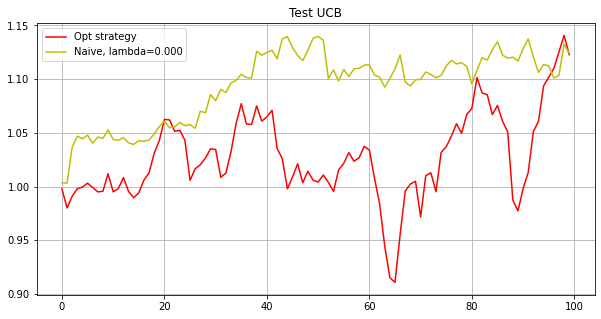

Phase 3
Testing...
./tmp2/snp500-12_phase03_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.      0.     -0.      0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.2356 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.1644
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.  

[-0.     -0.     -0.     -0.     -0.     -0.      0.0619 -0.     -0.
 -0.     -0.      0.0438 -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0016
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2927 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.2459
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.    

[ 0.   0.   0.   0.   0.  -0.   0.3  0.   0.   0.   0.   0.3 -0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.  -0.  -0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.
  0.   0.   0.3  0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.   0.  -0.  -0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
  0.  -0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.   0.  -0.   0.
  0.  -0.   0.   0.1  0.   0.   0.   0.  -0.  -0.  -0.   0.   0.   0.
  0.  -0. ]
[0.     0.     0.     0.2334 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.159  0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.3    0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0076 0.     0.     0.     0.     0.
 0.     0.     0.     0.     

[-0.     -0.     -0.     -0.     -0.     -0.      0.0013 -0.      0.0245
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0656 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3     0.2025 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1062 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[0.     0.     0.     0.     0.     0.     0.0754 0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0. 

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.0942 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.3    0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0058
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.     -0.     -0.     -0.      0.2681 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.1635 -0.     -0.

[ 0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.     -0.      0.3     0.      0.     -0.     -0.      0.     -0.
  0.     -0.     -0.     -0.      0.3     0.     -0.      0.025  -0.
 -0.      0.     -0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.      0.2916  0.      0.      0.     -0.      0.0835
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.     -0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.    ]
[-0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.

[ 0.     -0.      0.      0.3    -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.3     0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.1868 -0.     -0.     -0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.2132 -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.    ]
[-0.   0.  -0.  -0.   0.  -0.   0.   0.   0.  -0.   0.   0.  -0.   0.3
  0.   0.   0.   0.   0.   0.   0.   0.   0.  -0.   0.  -0.   0.   0.
 -0.   0.   0.   0.  -0.   0.   0.  -0.   0.   0.   0.   0.  -0.  -0.
  0.   0.  -0.   0. 

[-0.   0.  -0.  -0.  -0.  -0.   0.3  0.   0.  -0.   0.   0.  -0.   0.
 -0.   0.   0.   0.   0.   0.  -0.   0.  -0.  -0.   0.  -0.   0.   0.
 -0.   0.   0.   0.  -0.  -0.   0.  -0.   0.3  0.   0.   0.  -0.  -0.
 -0.   0.  -0.   0.   0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.   0.  -0.   0.   0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.
  0.  -0.   0.  -0.   0.   0.   0.   0.  -0.  -0.   0.3  0.  -0.   0.
  0.  -0. ]
[ 0.     -0.      0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.2007
 -0.     -0.      0.     -0.      0.1993  0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.      0.3     0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.      0.3     0.      0.     -0.     -0.     -0.
 -0.     -0

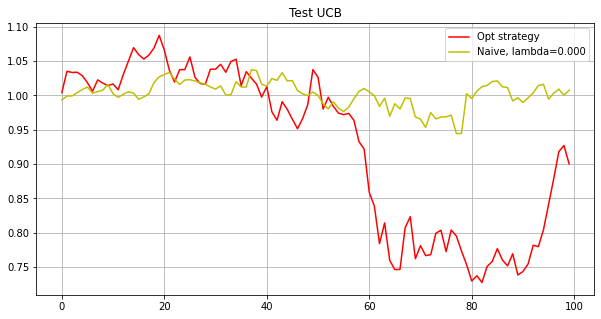

Phase 4
Testing...
./tmp2/snp500-12_phase04_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.      0.0359  0.3    -0.      0.      0.     -0.     -0.
  0.     -0.     -0.      0.      0.      0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.     -0.      0.      0.3     0.
 -0.     -0.     -0.     -0.      0.      0.      0.0641 -0.      0.
  0.     -0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.3
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.    ]
[-0.     -0.     -0.     -0.     

[ 0.      0.      0.      0.      0.      0.3     0.      0.      0.
 -0.     -0.      0.     -0.     -0.      0.      0.      0.1142 -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.02    0.0612
 -0.      0.     -0.      0.     -0.     -0.      0.2045  0.     -0.
 -0.      0.     -0.      0.3     0.     -0.      0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.    ]
[-0.      0.      0.0752 -0.      0.      0.2344 -0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.0904 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.

[ 0.3     0.      0.1749  0.      0.3     0.2251  0.     -0.      0.
  0.      0.     -0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[ 0.3     0.      0.      0.      0.      0.      0.2949  0.0372  0.3
 -0.     -0.      0.     -0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.   

[ 0.3 -0.  -0.   0.3 -0.   0.1  0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[0.     0.     0.     0.     0.     0.2883 0.     0.     0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.081  0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     

[ 0.      0.     -0.      0.     -0.      0.2011  0.      0.1989  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
  0.    ]
[ 0.      0.      0.     -0.      0.3     0.0825  0.      0.039   0.
 -0.     -0.      0.     -0.     -0.     -0.      0.3     0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[-0.     -0.     -0.     -0.     -0.      0.1367 -0.     -0.      0.
  0.      0.     -0.      0.     -0.     -0.      0.3     0.2633  0.
 -0.     -0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.      0.      0.      0.3    -0.      0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.      0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[ 0.      0.      0.      0.      0.      0.2818  0.      0.      0.
 -0.     -0.      0.     -0.     -0.     -0.      0.      0.0374 -0.
 -0.      0.0808  0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.    

[-0.     -0.     -0.     -0.     -0.      0.1522 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
  0.2478 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.    ]
[ 0.0882  0.     -0.     -0.      0.      0.0398  0.     -0.      0.3
 -0.     -0.      0.     -0.     -0.     -0.      0.183  -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.   

[ 0.2191 -0.     -0.     -0.     -0.      0.059  -0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.1407 -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.      0.      0.      0.      0.     -0.
  0.2812 -0.      0.      0.     -0.     -0.      0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.3    -0.
  0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.      0.
 -0.    ]
[ 0.      0.      0.      0.      0.1883  0.0771  0.1892  0.0767  0.
 -0.     -0.      0.     -0.      0.      0.      0.3     0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.     -0.      0.    

[-0.      0.     -0.      0.      0.      0.3    -0.      0.      0.
  0.      0.     -0.      0.      0.      0.     -0.      0.      0.
  0.      0.2321 -0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.     -0.      0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.1679
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.

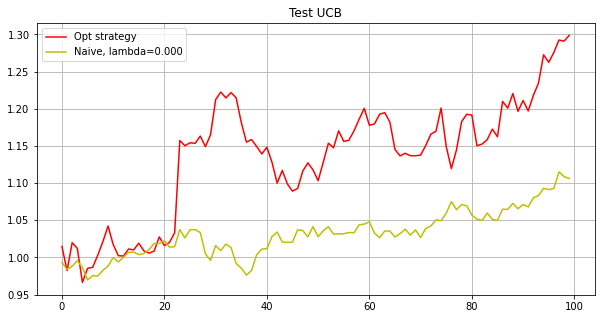

Phase 5
Testing...
./tmp2/snp500-12_phase05_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.1691  0.      0.      0.      0.1047  0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.     -0.      0.2991  0.0082
  0.      0.     -0.      0.      0.2824 -0.      0.      0.      0.
  0.0781  0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.      0.     -0.      0.     -0.     -0.
  0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.0584  0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.      0.     -0.      0.      0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.    ]
[ 0.      0.      0.      0.  

[ 0.1257  0.      0.      0.      0.      0.      0.215   0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
 -0.     -0.      0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.0592  0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.3     0.     -0.      0.      0.      0.      0.0911  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.    

[ 0.     0.     0.     0.     0.     0.     0.261  0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.    -0.
  0.     0.3    0.     0.     0.     0.     0.    -0.    -0.     0.
  0.    -0.     0.     0.    -0.     0.    -0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.109
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
  0.     0.     0.03   0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.   ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0. 

[-0.     -0.     -0.      0.0551 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0307  0.3
 -0.     -0.     -0.     -0.     -0.      0.0826 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.048  -0.     -0.
  0.1836 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.     -0.      0.      0.     -0.      0.0062  0.1119 -0.      0.2472
 -0.      0.      0.      0.     -0.     -0.     -0.      0.1523 -0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.      0.     -0

[ 0.203 -0.     0.    -0.    -0.     0.     0.    -0.     0.    -0.
  0.     0.     0.     0.    -0.     0.     0.197  0.     0.     0.
  0.     0.    -0.     0.    -0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 -0.     0.     0.     0.     0.     0.    -0.     0.     0.    -0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.    -0.
  0.    -0.     0.     0.    -0.     0.     0.     0.     0.3    0.
  0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.    -0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.   ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0181 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.3    -0.    

[-0.  -0.  -0.  -0.  -0.  -0.   0.3  0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[ 0.     -0.      0.      0.     -0.     -0.      0.0285 -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.      0.0923 -0.     -0.
 -0.     -0.     -0.     -0.      0.0845 -0.      0.0548 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.   

[ 0.   0.   0.1  0.   0.  -0.   0.  -0.  -0.  -0.   0.   0.   0.  -0.
  0.   0.3  0.3 -0.  -0.  -0.  -0.  -0.   0.  -0.   0.   0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.  -0.   0.  -0.
  0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.   0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[-0.     -0.      0.     -0.     -0.     -0.      0.215  -0.      0.1162
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.1399 -0.     -0.
 -0.     -0

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0663
 -0.     -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2997 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0343
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.      0.1844 -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
  0.      0.    

[ 0.      0.      0.      0.      0.      0.      0.1129  0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.3     0.
 -0.     -0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.      0.1921  0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.      0.0182  0.      0.     -0.      0.      0.
  0.1898  0.      0.      0.0677  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0285  0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.0908  0.     -0.      0.     -0.      0.      0.     -0.
  0.    ]
[ 0.      0.      0.      0.      0.      0.      0.1449 -0.      0.
 -0.      0.      0.      0.      0.      0.     -0.      0.2888  0.
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.      0.      0.    

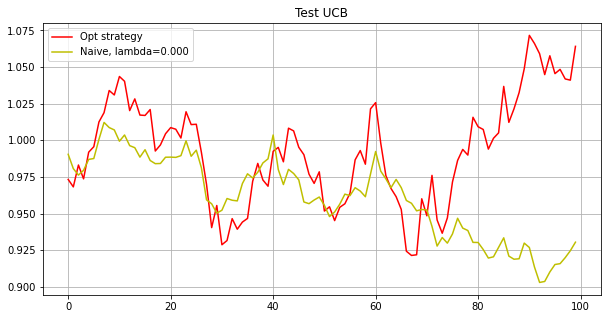

Phase 6
Testing...
./tmp2/snp500-12_phase06_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.      0.      0.3    -0.      0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.1103  0.3     0.0813
  0.      0.      0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.     -0.      0.1193 -0.      0.     -0.      0.
 -0.     -0.     -0.      0.029  -0.     -0.      0.0601 -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.  

[-0.     -0.      0.      0.022   0.134   0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.2613 -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.2827  0.     -0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.3    -0.      0.      0.      0.     -0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.      0.      0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.1872  0.      0.      0.      0.
  0.      0.      0.      0.1097  0.      0.      0.      0.2654  0.
  0.006   0.      0.      0.      0.      0.      0.      0.      0.1115
 -0.      0.      0.

[-0.     -0.     -0.      0.      0.1219 -0.      0.101  -0.     -0.
  0.     -0.      0.      0.      0.     -0.      0.      0.      0.
 -0.      0.     -0.     -0.      0.      0.0092 -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.0026  0.     -0.      0.1323 -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.1763 -0.     -0.      0.1566 -0.      0.
 -0.      0.     -0.     -0.     -0.      0.3    -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.      0.0671  0.      0.      0.      0.
 -0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
  0.2671  0.      0.      0.      0.      0.      0.3     0.      0.
  0.      0.      0.    

[ 0.      0.      0.     -0.     -0.      0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.3     0.2278
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.1722  0.      0.
  0.      0.3    -0.      0.      0.      0.     -0.      0.     -0.
  0.      0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.      0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
[0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.281  0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.  

[ 0.      0.      0.      0.2012  0.     -0.      0.     -0.      0.0232
  0.1331  0.      0.      0.      0.      0.      0.      0.      0.3
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.     -0.      0.      0.2513
  0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
 -0.     -0.      0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.0912  0.      0.     -0.      0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.3    -0.      0.      0.      0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.      0.226   0.      0.
  0.      0.   

[ 0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
  0.2028  0.     -0.      0.      0.      0.      0.0526  0.      0.
 -0.     -0.      0.     -0.     -0.      0.      0.201  -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.0988 -0.      0.      0.      0.     -0.      0.     -0.      0.1448
  0.      0.3    -0.      0.      0.      0.     -0.     -0.      0.
  0.      0.      0.      0.      0.     -0.     -0.      0.     -0.
  0.      0.     -0.      0.      0.     -0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.     -0.      0.      0.     -0.
  0.     -0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.    ]
[ 0.      0.     -0.     -0.      0.0949 -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.2325 -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.2044 -0.
  0.      0.     -0.

[-0.     -0.      0.      0.      0.1457  0.     -0.      0.      0.
 -0.      0.     -0.      0.2543  0.      0.      0.      0.3    -0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.    ]
[-0.     -0.      0.     -0.      0.2897  0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.232  -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.      0.      0.    

[-0.  -0.  -0.   0.   0.3 -0.   0.1 -0.   0.   0.  -0.   0.  -0.   0.
 -0.   0.   0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.   0.   0.3 -0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.  -0.
 -0.  -0. ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0429
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -

[-0.     -0.     -0.      0.2633 -0.     -0.      0.0003 -0.      0.0893
 -0.     -0.     -0.     -0.     -0.     -0.      0.3     0.0414 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.0073 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.0079  0.     -0.      0.      0.3    -0.      0.      0.      0.
  0.01   -0.      0.      0.0768  0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.      0.3     0.
 -0.     -0.      0.

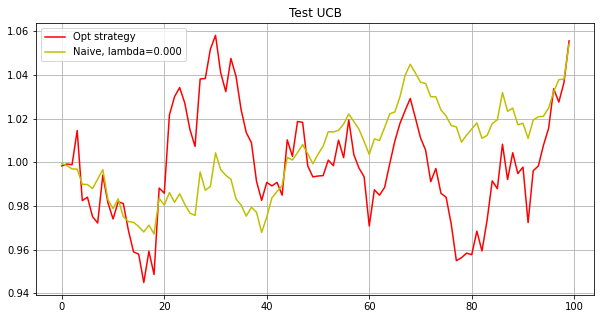

Phase 7
Testing...
./tmp2/snp500-12_phase07_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.      0.      0.      0.      0.      0.      0.1584  0.
  0.0056  0.236   0.      0.      0.     -0.      0.      0.     -0.
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.      0.      0.3     0.
  0.      0.     -0.      0.     -0.     -0.      0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.      0.2759 -0.     -

[-0.   0.1 -0.  -0.   0.   0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.
 -0.   0.  -0.  -0.  -0.   0.   0.  -0.   0.  -0.   0.   0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.   0.   0.3 -0.   0.  -0.   0.   0.   0.  -0.  -0.  -0.   0.  -0.
  0.   0.3  0.  -0.  -0.   0.   0.   0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.   0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.3  0.  -0.  -0.  -0.
 -0.   0.  -0.   0.  -0.   0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.
  0.   0. ]
[0.     0.     0.3    0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.2809 0.
 0.     0.     0.     0.0907 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.0284 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     

[-0.     -0.      0.1773 -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.1076  0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.      0.3     0.     -0.     -0.      0.1151  0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.3     0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0002  0.0348  0.2491 -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.0333  0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.    

[-0.     -0.      0.2405 -0.      0.      0.     -0.     -0.      0.
 -0.      0.1618  0.      0.     -0.     -0.      0.     -0.     -0.
 -0.      0.1243  0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.     -0.      0.      0.
  0.     -0.      0.      0.1734  0.      0.     -0.     -0.      0.3
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
 -0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.    ]
[-0.      0.1144  0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.2856 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.   

[ 0.      0.3     0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.2358  0.      0.      0.      0.      0.      0.
  0.2591  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.0811  0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.1241  0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.1137 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.3   

[ 0.      0.      0.2513  0.      0.      0.      0.     -0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.      0.
  0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.3
  0.     -0.      0.      0.      0.      0.      0.      0.      0.3
  0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.      0.1487  0.     -0.      0.      0.      0.      0.
  0.    ]
[-0.      0.1663  0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0054 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.  

[ 0.      0.1846  0.0139  0.      0.      0.      0.      0.      0.
  0.      0.0959  0.3     0.      0.      0.      0.      0.     -0.
  0.0622  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.3     0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.0435  0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.      0.      0.3     0.      0.      0.      0.      0.      0.
  0.      0.      0.2491  0.      0.     -0.      0.      0.      0.
  0.3     0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.    

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.
  0.3 -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.
 -0.   0.   0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.
  0.  -0.   0.  -0.  -0.   0.   0.   0.  -0.   0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.   0.  -0.  -0.  -0.
 -0.  -0.   0.3 -0.  -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.   0.
  0.  -0. ]
[ 0.      0.      0.122  -0.      0.      0.      0.     -0.      0.
  0.      0.187   0.      0.      0.     -0.     -0.      0.     -0.
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
 -0.     -0.      0.2445  0.     -0.     -0.      0.     -0.      0.
  0.     -0.      0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.1465  0.      0.      0.      0.     -0.      0.      0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.   

[ 0.      0.1201  0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.2799  0.      0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.3   ]
[-0.     -0.      0.1618 -0.     -0.     -0.     -0.     -0.     -0.
  0.0841  0.1443 -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.      0.1591 -0.     -0.     -0.
 -0.     -0.     -0.    

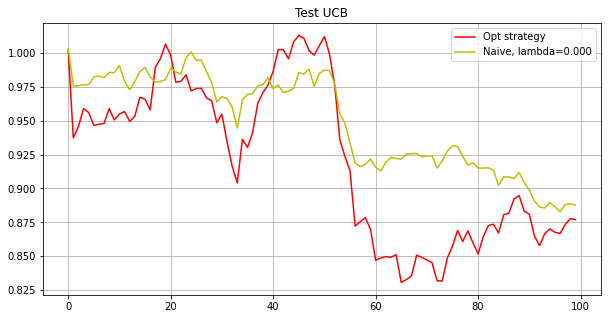

Phase 8
Testing...
./tmp2/snp500-12_phase08_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0593 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0597 -0.     -0.     -0.     -0.
 -0.      0.0184  0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.2627 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.1459  0.      0.      0.     -

[ 0.1529 -0.      0.      0.      0.      0.      0.      0.2163  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.3     0.     -0.      0.      0.      0.
 -0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.2634 -0.
  0.      0.0673 -0.      0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.     -0.     -0.      0.      0.      0.
  0.    ]
[ 0.     -0.      0.      0.     -0.     -0.      0.      0.0724  0.
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.3    -0.     -0.     -0.     -0.     -0.      0.      0.0428 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.3
 -0.      0.     -0.      0.     -0.      0.3     0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.      0.      0.      0.     -0.     -0.      0.0572 -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.2118 0.     0.
 0.     0.     0.     0.     0.     0.0063 0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.1138 0.     

[ 0.3     0.      0.      0.     -0.      0.      0.      0.1182  0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.236  -0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.      0.      0.0458  0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.3     0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
  0.    ]
[0.     0.     0.2037 0.     0.     0.     0.     0.2063 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0

[ 0.    0.    0.    0.   -0.    0.    0.    0.19  0.    0.    0.    0.
  0.   -0.    0.    0.    0.   -0.   -0.    0.   -0.   -0.    0.   -0.
  0.   -0.   -0.   -0.    0.   -0.   -0.   -0.    0.    0.    0.    0.
  0.    0.   -0.   -0.    0.    0.21 -0.    0.    0.   -0.   -0.   -0.
  0.   -0.    0.   -0.    0.   -0.   -0.    0.   -0.    0.    0.3   0.
  0.    0.    0.   -0.   -0.    0.   -0.    0.    0.    0.    0.3  -0.
 -0.   -0.    0.    0.    0.    0.    0.    0.    0.    0.   -0.    0.
  0.   -0.    0.    0.    0.    0.    0.    0.   -0.    0.    0.   -0.
 -0.    0.   -0.    0.  ]
[ 0.      0.      0.      0.     -0.      0.      0.      0.2469  0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.3     0.     -0.     -0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.1531  0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.3    -0.      0.      0.
 -0.      0.     -0.      0.      0.      0.      0.      0. 

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0942 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.     0.0058 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[ 0.1371 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     

[0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.2047 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0175 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.1448 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.3    0.     0.     0.     0.     0.
 0.033  0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[0.2715 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.2458
 0.     0.     0.     0.     0.     0.3    0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0. 

[ 0.3    -0.     -0.     -0.     -0.     -0.     -0.      0.0755 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0335 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.2909 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.      0.      0.      0.     -0.      0.      0.      0.1908  0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.      0.2151 -0.     -0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.    

[ 0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.   0.   0.3 -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0. ]
[ 0.     -0.      0.3     0.     -0.     -0.      0.      0.0742  0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
 -0.     -0.      0.0258  0.      0.      0.     -0.      0.     -0.
  0.      0.      0.3     0.      0.     -0.      0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.   

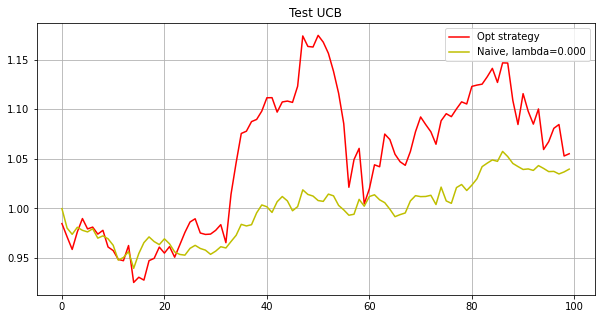

Phase 9
Testing...
./tmp2/snp500-12_phase09_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.2711 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.1267
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.0022 0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.    ]
[ 0.0138 -0.      0.1027 -0.     -0.     -0.      0.3    -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.  

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.      0.1533 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0558 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1908 -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[0.     0.     0.0928 0.     0.     0.     0.     0.     0.     0.
 0.3    0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.2022 0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.    

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1083 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.1746 -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.      0.3
 -0.     -0.     -0.      0.     -0.     -0.      0.     -0.      0.1171
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.      0.3    -0.      0.      0.     -0.
 -0.    ]
[0.  0.  0.  0.  0.  0.  0.3 0.  0.  0.  0.1 0.  0.  0.  0.  0.  0.  0.
 0.3 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 0.  0.  0

[0.     0.     0.     0.     0.0577 0.     0.     0.     0.     0.
 0.     0.2253 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.3    0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.3    0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.117  0.     0.     0.     0.     0.    ]
[0.1824 0.     0.     0.     0.     0.     0.     0.2233 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.1615 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     

[-0.      0.1477 -0.     -0.     -0.      0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.     -0.      0.1112  0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.      0.      0.1411  0.      0.      0.     -0.      0.     -0.
  0.     -0.     -0.     -0.      0.      0.3    -0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.3     0.
  0.      0.     -0.      0.      0.      0.      0.     -0.      0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.      0.      0.     -0.     -0.     -0.      0.      0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.   

[ 0.      0.1853  0.      0.      0.      0.      0.      0.2623  0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.0631  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.3     0.      0.1776  0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.0117
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.    ]
[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1971 0.     0.     0.     0.     0.     0.     0.     0.1626 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.  

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3
  0.  -0.  -0.   0.   0.3 -0.   0.  -0.  -0.  -0.   0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.  -0.   0.  -0.   0.   0.   0.   0.  -0.
  0.   0.  -0.   0.  -0.   0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.
  0.  -0.  -0.   0.3 -0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.
 -0.   0.1  0.   0.  -0.  -0.   0.   0.  -0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.  -0.  -0.   0.   0.   0.   0.  -0.  -0.   0.  -0.
 -0.  -0. ]
[0.0942 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.     0.2952 0.2423 0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0682 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.    

[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.
 -0.   0.  -0.   0.  -0.  -0.   0.  -0.   0.  -0.  -0.   0.   0.  -0.
  0.  -0.  -0.  -0.  -0.   0.   0.3 -0.  -0.   0.   0.  -0.   0.   0.
 -0.  -0.   0.   0.3 -0.  -0.   0.   0.  -0.   0.   0.  -0.   0.   0.
  0.   0.  -0.   0.  -0.  -0.   0.   0.1  0.  -0.  -0.  -0.   0.  -0.
 -0.  -0. ]
[ 0.     -0.     -0.     -0.     -0.     -0.      0.1094 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.2906 -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.3    -0.     -0.     -0.
  0.3    -0.   

[-0.     -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.      0.3     0.1043 -0.     -0.      0.     -0.
  0.      0.      0.     -0.      0.3     0.     -0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.2383 -0.      0.      0.
 -0.     -0.     -0.      0.0575 -0.     -0.      0.     -0.      0.
 -0.      0.      0.     -0.     -0.     -0.      0.      0.      0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.    ]
Opt strategy   Total log return: 0.07232989    Max redraw: 0.12651618
Total return: 1.07500992
Mean return: 1.00072356
Naive lambda: 0.000   Total log return: 0.00787569
Total return: 1.00790678
Mean return: 1.00007876


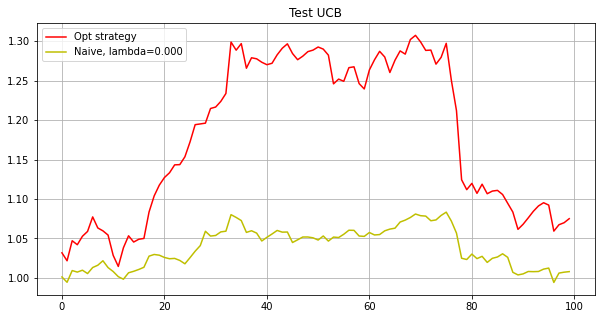

Phase 10
Testing...
./tmp2/snp500-12_phase10_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.   0.   0.   0.   0.  -0.   0.   0.   0.3  0.   0.   0.1  0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 -0.   0.3  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.3  0.   0.   0.   0.   0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0. ]
[-0.      0.     -0.     -0.     -0.     -0.      0.3     0.      0.
  0.      0.0179 -0.      0.      0.      0.      0.      0.1989  0.
  0.      0.      0.1832 -0.     -0.     -0.      0.      0.     -0.
  0.     -0.      0.3     0.      0.      0.      0.      0.      0.
  0.      0.      0.    

[-0.     -0.     -0.      0.2299 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0334 -0.
 -0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.3     0.1367 -0.     -0.     -0.     -0.
 -0.     -0.      0.3    -0.     -0.      0.     -0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.      0.      0.     -0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.    ]
[0.0538 0.0141 0.     0.2956 0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.3    0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.2237  0.      0.      0.      0.      0.      0.2593  0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.029   0.
  0.      0.      0.      0.      0.      0.      0.0674  0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
 -0.      0.      0.      0.     -0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.1206  0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.     -0.
  0.    ]
[ 0.      0.     -0.      0.      0.0149 -0.      0.0979  0.      0.
  0.     -0.      0.      0.      0.      0.0029  0.      0.      0.
  0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
  0.      0.     -0.    

[-0.      0.     -0.      0.0353 -0.     -0.     -0.      0.      0.
  0.     -0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.0647  0.      0.      0.      0.      0.3     0.
 -0.      0.      0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.3     0.      0.      0.     -0.      0.      0.
  0.      0.      0.3     0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0002  0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.2137  0.     -0.     -0.     -0.     -0.     -0.      0.      0.247
  0.     -0.      0.0242 -0.      0.     -0.     -0.      0.      0.
  0.      0.      0.     -0.      0.     -0.      0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.     -0.     -0.      0.
  0.      0.      0.      0.2151  0.      0.     -0.      0.      0.
  0.      0.      0.3    -0.     -0.      0.      0.      0.      0.
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
  0.      0.      0.     -0.      0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.      0.      0.     -0.      0.     -0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.      0.     -0.      0.      0.      0.
 -0.    ]
[ 0.2523 -0.      0.     -0.      0.      0.      0.      0.      0.1539
  0.      0.      0.     -0.      0.      0.      0.      0.     -0.
 -0.      0.      0.3     0.      0.      0.     -0.      0.2938  0.
 -0.      0.     

[ 0.3  0.  -0.  -0.  -0.  -0.   0.3  0.   0.   0.  -0.  -0.   0.  -0.
 -0.  -0.   0.   0.   0.  -0.   0.  -0.   0.  -0.   0.   0.  -0.   0.
 -0.  -0.   0.   0.   0.3  0.   0.  -0.   0.   0.   0.   0.   0.   0.
 -0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.1  0.   0.   0.  -0.   0.   0.
  0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.  -0.   0.   0.   0.   0.   0.   0.   0.  -0.
 -0.   0. ]
[-0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.   0.1 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.
 -0.  -0

[0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.2501
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.3    0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.1499 0.     0.     0.     0.     0.3
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
[-0.      0.1746 -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.      0.0366 -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0518 -0.      0.3    -0.     -0.

[-0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.
 -0.  -0.  -0.  -0.  -0.   0.3 -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.  -0.   0.  -0.   0.1 -0.  -0.
 -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.   0.
 -0.  -0.   0.   0.  -0.   0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.
 -0.  -0.   0.  -0.   0.  -0.  -0.  -0.   0.   0.   0.   0.   0.  -0.
 -0.   0.   0.  -0.  -0.  -0.  -0.   0.   0.  -0.  -0.   0.  -0.  -0.
 -0.   0. ]
[ 0.     -0.      0.      0.2509  0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.      0.2894  0.
 -0.      0.1597  0.     -0.      0.      0.3    -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
  0.     -0.   

[ 0.1544  0.0093 -0.      0.3    -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0106 -0.
 -0.     -0.      0.0359 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.3    -0.      0.0238 -0.
 -0.     -0.     -0.     -0.      0.166  -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1534
 -0.     -0.     -0.     -0.     -0.      0.0899 -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.

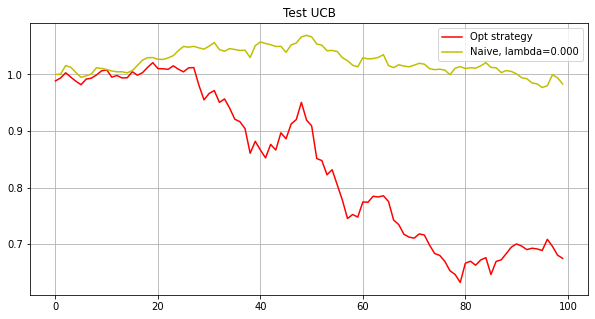

Phase 11
Testing...
./tmp2/snp500-12_phase11_iter5000_subn100_lb5_M20_matcnt30_invTrue_ggdFalse.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.  -0.   0.
  0.3 -0.  -0.   0.  -0.  -0.   0.   0.  -0.  -0.  -0.   0.1 -0.   0.3
  0.  -0.  -0.  -0.   0.   0.   0.  -0.  -0.   0.   0.  -0.   0.  -0.
 -0.   0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.  -0.   0.  -0.
 -0.  -0.   0.   0.   0.  -0.  -0.   0.  -0.  -0.   0.   0.   0.   0.3
 -0.   0.   0.  -0.  -0.   0.  -0.   0.   0.  -0.  -0.  -0.   0.   0.
  0.  -0.  -0.  -0.   0.   0.   0.  -0.   0.   0.   0.  -0.  -0.   0.
 -0.   0. ]
[-0.     -0.     -0.      0.0163 -0.     -0.     -0.      0.0837 -0.
 -0.     -0.      0.3    -0.     -0.      0.     -0.     -0.     -0.
  0.3    -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.      0.  

[ 0.    -0.    -0.    -0.    -0.     0.228 -0.    -0.    -0.    -0.
  0.    -0.    -0.     0.     0.3   -0.    -0.    -0.    -0.    -0.
 -0.    -0.     0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.
  0.    -0.    -0.    -0.    -0.     0.     0.172 -0.    -0.    -0.
  0.    -0.    -0.     0.     0.    -0.    -0.     0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.     0.     0.    -0.     0.
 -0.    -0.    -0.     0.    -0.     0.     0.    -0.     0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.     0.
 -0.    -0.    -0.     0.3   -0.    -0.    -0.    -0.    -0.    -0.
 -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.    -0.   ]
[ 0.     -0.     -0.      0.0413 -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.1671 -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.1402 -0.      0.     -0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.2785 -0.     -0.      0.      0.    

[0.     0.     0.     0.     0.     0.     0.     0.1647 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.3    0.     0.
 0.     0.     0.1513 0.     0.     0.     0.2788 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.1052 0.     0.     0.     0.     0.     0.    ]
[ 0.   0.  -0.   0.  -0.   0.  -0.  -0.  -0.  -0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.3 -0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.  -0.   0.   0.   0.   0.   0.   0.   0.3  0.3  0.   0.   0.  -0.
  0.   0.   0.1  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
  0.   0.   0.   0.   0.   0.   0.   0.   0. 

[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.      0.     -0.     -0.     -0.      0.1682 -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3
 -0.      0.04   -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.1919 -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.    ]
[ 0.     -0.     -0.      0.     -0.     -0.     -0.      0.209  -0.
 -0.      0.     -0.     -0.      0.      0.0312 -0.     -0.      0.
  0.1133 -0.     -0.     -0.      0.      0.     -0.      0.      0.
 -0.      0.     -0.   

[-0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.3    -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.1699  0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.2743 -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.     -0.     -0.     -0.      0.2558 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.    ]
[ 0.0107 -0.     -0.     -0.     -0.     -0.     -0.      0.2952 -0.
 -0.     -0.     -0.     -0.     -0.      0.007  -0.     -0.     -0.
 -0.      0.032  -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.    

[ 0.     -0.      0.1047  0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.0967 -0.      0.      0.1561 -0.     -0.      0.
 -0.     -0.     -0.      0.      0.      0.     -0.      0.     -0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.      0.2802
  0.      0.      0.      0.      0.      0.3     0.      0.      0.
  0.      0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.0622 -0.     -0.      0.      0.      0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.     -0.     -0.      0.     -0.
  0.    ]
[ 0.     -0.      0.     -0.      0.      0.2956  0.      0.3     0.
  0.     -0.     -0.      0.      0.      0.      0.      0.      0.
  0.2046  0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.      0.3    -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.0221 -0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.0779 -0.     -0.     -0.
  0.      0.     -0.     -0.     -0.      0.3     0.     -0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.     -0.     -0.
  0.     -0.      0.3     0.      0.     -0.     -0.      0.     -0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.     -0.
 -0.    ]
[-0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.   0.   0.3 -0.  -0.
 -0.  -0.  -0.   0.  -0.  -0.   0.  -0.  -0.  -0.  -0.  -0.  -0.  -0.
  0.  -0.  -0.  -0.   0.   0.   0.   0.3  0.   0.   0.  -0.   0.  -0.
 -0.   0.  -0.   0.  

[ 0.     -0.     -0.      0.     -0.      0.     -0.      0.3    -0.
  0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.      0.     -0.
  0.0279  0.     -0.      0.      0.      0.2242  0.      0.0709  0.276
  0.      0.1009  0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.      0.
  0.     -0.     -0.      0.      0.      0.     -0.      0.      0.
  0.      0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.     -0.
  0.    ]
[ 0.      0.      0.      0.2675  0.      0.      0.      0.2683  0.
  0.     -0.      0.1642  0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0. 

[ 0.3    -0.     -0.      0.2005 -0.      0.3    -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.      0.1995 -0.      0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.    ]
[0.3    0.     0.     0.     0.     0.     0.     0.0683 0.     0.
 0.     0.0291 0.     0.     0.3    0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0

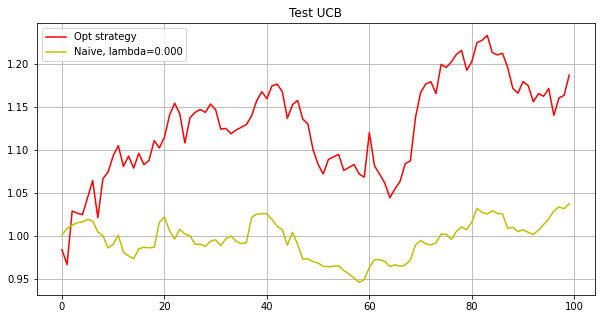

-----------------------------Final result-----------------------------
Opt strategy
Total return: 1.18245267
Mean return: 1.00013967
Naive strategy
Total return: 1.16993731
Mean return: 1.00013080


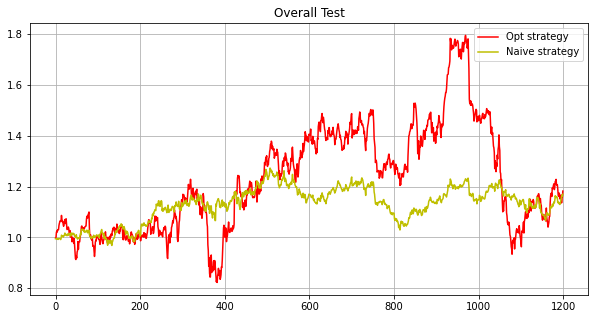

In [36]:
paras={'dataset':'snp500-12', 'maxiter':5000, 'subn':100, 'lb':5, 'M':20, 'inverse':'True', 'ggd':'False', 'matcnt':30}

gamma=3.0
run(paras, c=0.0, gamma=gamma, testv=np.arange(-0.02, 0.0100001, 0.002))

# 24 phases

## HATS mat 30 + GGD

    #!/bin/bash

    dataset='snp500-24'
    maxiter=2000
    subn=100
    lb=5
    M=10
    inverse='True'
    ggd='True'
    matid='48 35 83 25 84 19 21 71 24 68 81 38 51 56 77 43 80 15 30 60 69 37 73 62 34 54 57 70 39 42'

    matcnt=$(echo ${matid} | wc -w)
    for i in `seq 0 24`;
    # for i in 19;
    do
        echo "phase $i"
            python main2.py --phase $i --dataset ${dataset} --maxiter ${maxiter} --subn ${subn} --lb ${lb} --inverse ${inverse} --matid ${matid} --M ${M} --ggd ${ggd} --gpu 1  > ./log/main2_noval_${dataset}_inv${inverse}_ggd${ggd}_M${M}_iter${maxiter}_mat${matcnt}_subn${subn}_lb5_s5_log${i}.log
    done

Phase 0
Testing...
./tmp2/snp500-24_phase00_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0428 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.      0.      0.0536  0.     -0.      0.      0.     -0.      0.1012
 -0.     -0.      0.     -0.      0.0198 -0.      0.0666  0.0263 -0.
  0.0544 -0.      0.04   -0.      0.2358  0.      0.0524 -0.      0.
  0.      0.0048 -0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.      0.0085 -0.      0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.     -0.      0.     -0.      0.     -0.      0.
 -0.     -0.      0.2939 -0.      0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.    ]
[ 0.      0.      0.      0.   

[ 0.     -0.      0.0102  0.      0.     -0.      0.0121  0.      0.
  0.     -0.     -0.     -0.      0.0087  0.     -0.      0.      0.0636
 -0.      0.      0.     -0.     -0.      0.     -0.      0.0011  0.
  0.0775  0.0415  0.0392  0.      0.0041 -0.     -0.     -0.     -0.
  0.0179  0.      0.     -0.     -0.     -0.      0.      0.      0.0237
 -0.      0.0168 -0.      0.     -0.      0.      0.0571  0.      0.
 -0.      0.      0.     -0.      0.078   0.      0.      0.2109 -0.
 -0.      0.     -0.      0.      0.      0.      0.      0.     -0.
 -0.      0.     -0.      0.      0.      0.     -0.      0.0195  0.0094
  0.0217  0.     -0.     -0.      0.      0.      0.      0.      0.
  0.1767  0.007  -0.      0.      0.043  -0.      0.      0.      0.
  0.0603]
[ 0.0452 -0.      0.0109  0.      0.     -0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.0475  0.      0.0047  0.      0.
 -0.      0.     -0.      0.      0.2439  0.      0.0372  0.0005  0.
  0.0444  0.

[-0.     -0.      0.0102  0.      0.0022  0.      0.0141 -0.      0.
  0.      0.      0.     -0.     -0.      0.     -0.     -0.      0.101
  0.     -0.     -0.      0.      0.0956  0.      0.0509  0.0527 -0.
  0.0668  0.      0.0571  0.      0.1484 -0.      0.      0.      0.
  0.0648 -0.      0.1039  0.      0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.0368 -0.      0.     -0.      0.
 -0.      0.      0.      0.      0.0319 -0.     -0.      0.      0.0445
 -0.     -0.     -0.      0.      0.      0.      0.      0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.     -0.      0.
  0.0024 -0.      0.      0.      0.0946 -0.      0.     -0.      0.
  0.0222]
[ 0.0122 -0.      0.0026  0.0222  0.      0.      0.0376  0.     -0.
  0.     -0.      0.     -0.      0.0498  0.      0.0653  0.      0.0533
  0.0173 -0.     -0.      0.      0.1471  0.      0.0767 -0.      0.
  0.0285 -0. 

[ 0.0227  0.0008 -0.      0.0084 -0.      0.     -0.     -0.     -0.
 -0.      0.      0.0146 -0.      0.     -0.     -0.     -0.      0.0277
  0.     -0.      0.     -0.      0.     -0.      0.0636  0.0431 -0.
  0.0382 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.0162  0.      0.0532  0.1951  0.      0.     -0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.      0.1005 -0.     -0.
  0.1366 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.      0.     -0.      0.      0.      0.      0.     -0.
 -0.      0.      0.0012 -0.     -0.     -0.      0.     -0.      0.
  0.      0.      0.11   -0.     -0.      0.     -0.     -0.      0.
  0.1681  0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.    ]
[ 0.     -0.     -0.      0.0089 -0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.      0.      0.      0.0497 -0.      0.0916
 -0.     -0.     -0.     -0.      0.0942  0.      0.1782  0.     -0.
  0.     -0.    

[-0.      0.     -0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.      0.      0.      0.      0.      0.066   0.      0.
  0.      0.0062  0.     -0.      0.      0.      0.2012  0.0818  0.
 -0.      0.1068  0.0238 -0.      0.     -0.      0.0165  0.      0.
 -0.     -0.      0.142   0.      0.      0.     -0.     -0.      0.
  0.     -0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.      0.      0.0301  0.
  0.133   0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.0319  0.      0.     -0.      0.      0.      0.     -0.
  0.      0.0116  0.      0.     -0.      0.      0.      0.      0.0151
  0.1341 -0.      0.     -0.     -0.      0.      0.      0.      0.
  0.    ]
[ 0.0611  0.     -0.      0.0127 -0.      0.     -0.     -0.      0.
 -0.     -0.      0.0169 -0.      0.0471 -0.      0.0043 -0.      0.
  0.     -0.      0.      0.1026  0.0124 -0.      0.1735  0.      0.
 -0.     -0.     -0.

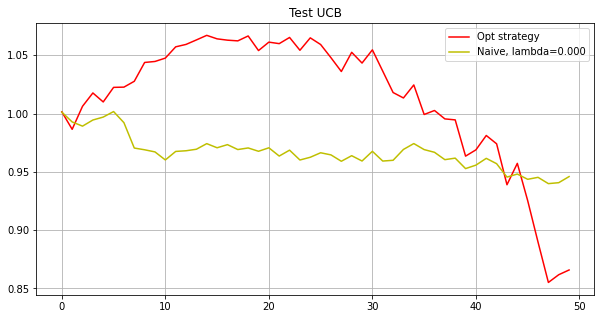

Phase 1
Testing...
./tmp2/snp500-24_phase01_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.0951  0.      0.     -0.      0.0054 -0.     -0.      0.1336
 -0.     -0.     -0.      0.0434 -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.      0.      0.0734  0.     -0.     -0.      0.
 -0.      0.      0.0009  0.0614 -0.      0.      0.      0.      0.
 -0.     -0.      0.      0.1485  0.     -0.      0.     -0.     -0.
  0.     -0.      0.      0.0696  0.     -0.      0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.     -0.      0.0521 -0.
  0.     -0.      0.     -0.      0.      0.0691  0.1102 -0.     -0.
  0.0963  0.     -0.      0.      0.      0.      0.      0.     -0.
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.     -0.
 -0.      0.041  -0.     -0.      0.      0.      0.     -0.      0.
  0.    ]
[ 0.      0.0006 -0.     -0.   

[-0.     -0.      0.015  -0.     -0.     -0.      0.     -0.      0.0425
  0.0713  0.0268  0.0195  0.0219  0.     -0.     -0.      0.      0.
  0.0178  0.013   0.     -0.      0.0163  0.014  -0.      0.0512  0.0177
  0.     -0.      0.0967 -0.      0.     -0.     -0.     -0.      0.0743
  0.      0.     -0.     -0.     -0.      0.      0.0131  0.0063  0.0857
 -0.      0.0074 -0.      0.063   0.     -0.     -0.     -0.      0.
 -0.      0.     -0.      0.     -0.      0.0942 -0.      0.0326 -0.
  0.      0.     -0.      0.     -0.      0.0716  0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.0674 -0.     -0.      0.
  0.      0.      0.0173  0.      0.     -0.     -0.     -0.      0.
  0.      0.0434  0.      0.      0.     -0.      0.      0.      0.
  0.    ]
[-0.     -0.     -0.     -0.     -0.      0.0111  0.      0.1479  0.0034
  0.1425  0.      0.      0.0524  0.      0.2021  0.0279  0.      0.
  0.      0.      0.     -0.     -0.      0.      0.      0.0019 -0.
  0.

[ 0.     -0.     -0.      0.      0.      0.0655  0.      0.     -0.
 -0.      0.     -0.      0.0192 -0.      0.      0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.      0.      0.1565 -0.     -0.      0.      0.      0.      0.0431
 -0.      0.113  -0.      0.2434  0.     -0.      0.     -0.      0.0795
  0.      0.      0.      0.0986  0.     -0.      0.     -0.     -0.
 -0.     -0.      0.0211  0.      0.      0.025  -0.      0.     -0.
 -0.     -0.      0.      0.     -0.      0.0138 -0.      0.     -0.
  0.      0.      0.0577  0.      0.      0.0334  0.      0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.0304  0.     -0.     -0.      0.     -0.      0.      0.
  0.    ]
[ 0.      0.0569  0.0159 -0.     -0.      0.      0.     -0.     -0.
  0.1206  0.0099  0.0109  0.1058 -0.      0.0298 -0.     -0.      0.0219
  0.     -0.      0.     -0.      0.0971 -0.     -0.     -0.      0.0089
  0.    

[-0.      0.0544  0.0462 -0.     -0.     -0.      0.      0.0001 -0.
 -0.      0.     -0.      0.0534  0.     -0.     -0.      0.0039 -0.
  0.     -0.      0.0335 -0.      0.0951 -0.     -0.      0.0034  0.0043
 -0.     -0.      0.0396  0.0611  0.     -0.     -0.      0.0216  0.0285
  0.      0.0621 -0.     -0.     -0.      0.     -0.      0.      0.
 -0.      0.0676 -0.      0.0143 -0.      0.     -0.      0.      0.
 -0.      0.     -0.      0.     -0.      0.0222 -0.      0.0155 -0.
  0.0778  0.     -0.      0.0138 -0.      0.0247  0.0888 -0.      0.
 -0.     -0.      0.     -0.     -0.      0.082  -0.     -0.     -0.
  0.     -0.      0.0309 -0.      0.     -0.     -0.      0.      0.
 -0.      0.0553 -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.    ]
[-0.     -0.     -0.     -0.     -0.     -0.      0.      0.1671 -0.
  0.0169  0.      0.0289  0.      0.     -0.      0.003   0.0278 -0.
  0.0314  0.      0.0714 -0.      0.0603 -0.     -0.     -0.     -0.
  0.     -0.    

[ 0.      0.     -0.      0.0026  0.      0.0681 -0.      0.0677  0.0811
  0.0019 -0.      0.0997  0.      0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.      0.0689 -0.     -0.
  0.      0.011  -0.      0.1919 -0.     -0.      0.      0.024   0.
 -0.      0.0307 -0.      0.0743  0.     -0.     -0.     -0.      0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.      0.      0.1899 -0.      0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
  0.      0.     -0.     -0.     -0.      0.0729  0.      0.      0.
 -0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.      0.0009 -0.      0.0143  0.      0.     -0.      0.      0.
  0.    ]
[ 0.     -0.      0.0005 -0.      0.      0.      0.      0.      0.
  0.      0.0508  0.0471  0.      0.      0.     -0.      0.      0.
 -0.      0.      0.0437 -0.      0.0299  0.      0.0102  0.0131 -0.
  0.     -0.     -0.

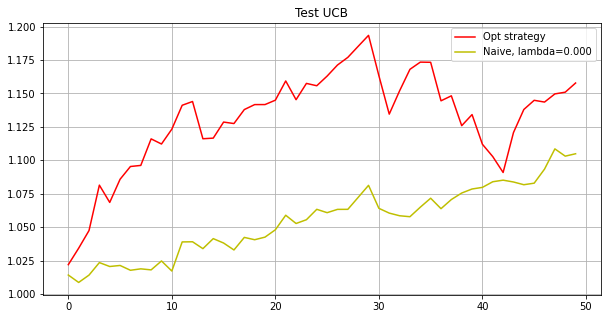

Phase 2
Testing...
./tmp2/snp500-24_phase02_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.      0.      0.0802 -0.      0.     -0.     -0.      0.004
  0.0063  0.      0.0382 -0.      0.1559 -0.      0.      0.3    -0.
  0.     -0.     -0.     -0.      0.      0.0164  0.      0.0534 -0.
  0.     -0.      0.     -0.      0.0075 -0.      0.      0.     -0.
  0.      0.      0.      0.      0.0514 -0.      0.      0.      0.
  0.      0.     -0.      0.1749  0.      0.      0.      0.      0.
  0.      0.     -0.     -0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.      0.      0.     -0.      0.1105 -0.      0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.      0.0013
  0.     -0.      0.      0.      0.     -0.      0.      0.     -0.
  0.    ]
[-0.      0.0032  0.0055  0.

[-0.     -0.      0.     -0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.      0.0827  0.0818 -0.     -0.      0.0064  0.
  0.      0.105  -0.     -0.      0.      0.      0.      0.0727  0.
 -0.     -0.     -0.      0.      0.0386 -0.      0.1201  0.0265  0.
  0.     -0.      0.      0.      0.      0.1072 -0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.0753 -0.     -0.      0.
  0.1653 -0.     -0.      0.      0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.1186 -0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.     -0.      0.
 -0.    ]
[ 0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.0608  0.      0.0133 -0.      0.
  0.      0.2664 -0.     -0.      0.     -0.      0.      0.      0.
 -0.      0.     -0.    

[ 0.      0.     -0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.0424  0.      0.     -0.      0.
  0.      0.3    -0.     -0.     -0.      0.      0.      0.0013  0.
 -0.     -0.     -0.      0.     -0.      0.048  -0.      0.     -0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.      0.0507 -0.     -0.      0.
  0.     -0.      0.      0.      0.1561  0.     -0.     -0.      0.
 -0.      0.      0.     -0.      0.      0.0371  0.      0.      0.
 -0.      0.     -0.      0.     -0.      0.0799  0.0901 -0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.      0.      0.
  0.1943]
[ 0.      0.      0.      0.0829  0.      0.      0.0529  0.     -0.
  0.      0.0463  0.      0.1061 -0.      0.      0.      0.      0.
  0.      0.      0.      0.     -0.      0.      0.0537  0.0651  0.
  0.     -0.      0.    

[-0.     -0.      0.     -0.     -0.      0.      0.     -0.      0.002
  0.0161  0.0278 -0.     -0.     -0.     -0.      0.      0.1205  0.
 -0.      0.1369  0.      0.      0.      0.0041  0.     -0.      0.
  0.     -0.      0.      0.     -0.     -0.      0.      0.0439  0.0323
  0.      0.0405  0.     -0.      0.0805  0.      0.0341  0.      0.
 -0.      0.0376  0.0277  0.0212  0.0478  0.      0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.054   0.     -0.     -0.
  0.2717  0.0012 -0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.     -0.
  0.    ]
[-0.      0.0455  0.     -0.      0.0009  0.     -0.     -0.      0.
 -0.     -0.      0.0123 -0.     -0.     -0.      0.      0.      0.
  0.     -0.      0.      0.      0.      0.0061  0.      0.     -0.
 -0.     -0.     

[-0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.0943 -0.      0.      0.0262  0.
  0.      0.      0.      0.      0.     -0.     -0.      0.0783  0.
 -0.     -0.      0.     -0.      0.0236  0.0293  0.1536  0.     -0.
  0.     -0.     -0.      0.0102  0.0399  0.1628 -0.      0.      0.
 -0.      0.     -0.      0.     -0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.1227  0.     -0.     -0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.      0.     -0.      0.0686  0.0077  0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.0719  0.     -0.
  0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
  0.1108]
Opt strategy   Total log return: -0.00000195    Max redraw: 0.05324245
Total return: 0.99999805
Mean return: 0.99999996
Naive lambda: 0.000   Total log return: 0.02605143
Total return: 1.02639374
Mean return: 1.00052116


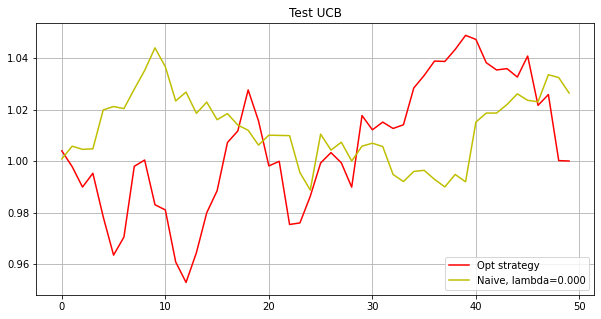

Phase 3
Testing...
./tmp2/snp500-24_phase03_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.      0.     -0.      0.0197 -0.     -0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.0632  0.0943  0.0647  0.0951
  0.      0.     -0.      0.     -0.      0.      0.     -0.      0.0922
  0.      0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0093 -0.     -0.      0.     -0.     -0.      0.     -0.      0.1379
 -0.      0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.      0.2037 -0.     -0.      0.      0.
 -0.      0.     -0.      0.1031  0.     -0.      0.     -0.      0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.1166 -0.      0.     -0.
  0.    ]
[-0.     -0.      0.   

[ 0.      0.0018 -0.      0.0435 -0.      0.     -0.      0.      0.
  0.0033 -0.     -0.     -0.     -0.      0.0506  0.1198  0.      0.
 -0.      0.012  -0.      0.      0.      0.0891  0.     -0.      0.1579
  0.     -0.     -0.      0.      0.      0.      0.      0.      0.
 -0.      0.0179 -0.      0.      0.     -0.      0.      0.0547  0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.0187 -0.      0.     -0.      0.2516  0.      0.      0.      0.
 -0.     -0.      0.0874  0.     -0.      0.     -0.     -0.      0.0918
  0.      0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
 -0.    ]
[-0.     -0.     -0.      0.0448 -0.     -0.      0.      0.     -0.
  0.0124 -0.      0.      0.      0.     -0.      0.0001 -0.      0.0919
  0.      0.0842 -0.     -0.      0.0463  0.      0.008  -0.     -0.
  0.0128 -0.

[ 0.      0.     -0.     -0.      0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.0693  0.      0.     -0.
 -0.     -0.     -0.     -0.      0.0119  0.0944 -0.      0.      0.066
 -0.     -0.     -0.      0.0041 -0.     -0.     -0.     -0.      0.0412
 -0.      0.038  -0.      0.     -0.     -0.     -0.      0.0648 -0.
  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.      0.     -0.      0.      0.0108 -0.      0.      0.1424  0.
  0.      0.     -0.      0.      0.      0.     -0.     -0.      0.0569
  0.      0.      0.      0.     -0.      0.     -0.     -0.      0.1649
 -0.      0.      0.      0.1179  0.0745 -0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.0427 -0.     -0.     -0.
  0.    ]
[-0.      0.      0.      0.      0.     -0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.0902  0.0157  0.     -0.
  0.     -0.      0.     -0.      0.0117  0.0441 -0.     -0.      0.002
 -0.  

[-0.     -0.      0.      0.0424 -0.      0.     -0.      0.      0.0022
 -0.      0.      0.      0.     -0.      0.0875  0.     -0.      0.0211
 -0.      0.0008  0.     -0.      0.      0.0681 -0.      0.      0.0784
 -0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.0392
  0.      0.0098  0.      0.      0.      0.      0.     -0.      0.05
 -0.      0.      0.     -0.     -0.      0.      0.      0.     -0.
  0.      0.     -0.      0.     -0.      0.      0.      0.1782  0.0018
  0.      0.      0.      0.      0.1829 -0.     -0.     -0.     -0.
  0.      0.      0.0682  0.     -0.     -0.      0.      0.      0.088
 -0.      0.0058  0.      0.01   -0.      0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.0655  0.      0.      0.
  0.    ]
[ 0.     -0.      0.      0.0734  0.     -0.     -0.     -0.      0.
 -0.      0.0008  0.     -0.      0.      0.      0.1499  0.0773 -0.
  0.      0.0521 -0.     -0.      0.      0.     -0.     -0.     -0.

[ 0.      0.     -0.      0.     -0.      0.      0.0585 -0.      0.
 -0.      0.     -0.     -0.      0.      0.0727  0.1181  0.0646 -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.0014  0.     -0.     -0.
 -0.      0.0327 -0.      0.0672  0.      0.     -0.      0.0733 -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.0415 -0.     -0.      0.1127  0.1746  0.      0.     -0.     -0.
 -0.     -0.      0.      0.1784 -0.      0.      0.     -0.     -0.
  0.0043  0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.      0.
 -0.    ]
[-0.      0.0039  0.0005 -0.      0.     -0.      0.      0.     -0.
 -0.     -0.     -0.      0.      0.03   -0.     -0.     -0.     -0.
  0.      0.      0.0378 -0.     -0.      0.0118  0.      0.      0.
  0.0332 -0.      0.    

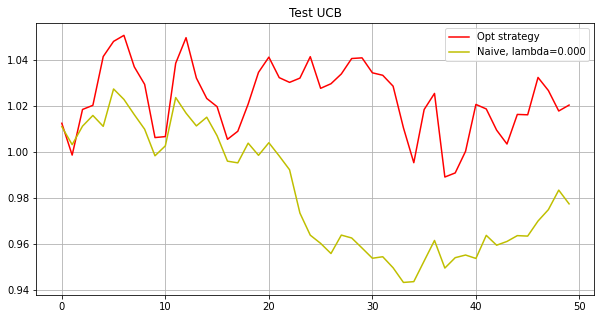

Phase 4
Testing...
./tmp2/snp500-24_phase04_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.      0.0116  0.     -0.      0.0129 -0.      0.     -0.      0.
 -0.      0.102  -0.     -0.      0.     -0.      0.      0.     -0.
  0.      0.0081  0.      0.     -0.     -0.      0.0105 -0.      0.0776
  0.0342 -0.      0.      0.      0.     -0.     -0.     -0.     -0.
  0.      0.0463 -0.      0.0484  0.071   0.      0.      0.      0.0089
  0.0809 -0.     -0.      0.      0.     -0.     -0.      0.      0.
 -0.     -0.      0.0297 -0.      0.0026 -0.      0.      0.      0.
  0.041   0.0134  0.      0.      0.     -0.      0.0119  0.0197  0.1872
 -0.      0.0509  0.      0.     -0.     -0.     -0.      0.      0.0556
 -0.      0.      0.      0.      0.0556  0.      0.0098 -0.     -0.
  0.0102  0.     -0.      0.     -0.      0.     -0.      0.      0.
  0.    ]
[-0.      0.0149  0

[-0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.      0.0142  0.
  0.      0.1196 -0.     -0.     -0.     -0.     -0.      0.      0.
  0.0175 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
  0.0285  0.0221 -0.      0.07   -0.      0.1079 -0.      0.0752  0.
  0.      0.0466 -0.      0.      0.      0.     -0.     -0.      0.
  0.0015 -0.      0.0278  0.     -0.      0.1019 -0.      0.     -0.
  0.0396  0.0847  0.     -0.     -0.      0.      0.0061  0.042   0.0904
 -0.     -0.      0.0997  0.     -0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.003   0.      0.0017  0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.
  0.    ]
[ 0.      0.      0.     -0.     -0.      0.      0.076   0.      0.
  0.      0.0346  0.      0.0082 -0.      0.0797  0.      0.      0.
 -0.      0.0853 -0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.

[-0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
  0.0829 -0.     -0.      0.0623 -0.     -0.      0.      0.     -0.
  0.      0.1123  0.016   0.0109  0.     -0.      0.0163 -0.      0.
  0.0181  0.      0.      0.     -0.      0.     -0.      0.     -0.
  0.      0.0853  0.0021  0.027  -0.     -0.     -0.      0.      0.015
  0.      0.0294 -0.      0.      0.     -0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.0143  0.103  -0.
 -0.      0.0005  0.      0.     -0.      0.      0.0138 -0.      0.1202
 -0.     -0.      0.0109  0.     -0.      0.     -0.      0.0278 -0.
 -0.     -0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.      0.     -0.     -0.     -0.      0.      0.2319 -0.      0.
  0.    ]
[-0.      0.0076  0.     -0.      0.      0.     -0.      0.      0.
  0.056   0.1078 -0.     -0.      0.      0.0045  0.      0.001   0.
  0.      0.0202  0.      0.      0.0131 -0.     -0.      0.      0.0867
  0.018  -0. 

[-0.      0.0272  0.      0.      0.     -0.      0.1375  0.      0.
  0.      0.      0.     -0.     -0.      0.0472 -0.      0.      0.
  0.022  -0.      0.      0.0412  0.     -0.     -0.      0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.0422  0.0265  0.
  0.0549  0.     -0.      0.1238  0.      0.      0.      0.0149  0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.0353
 -0.     -0.      0.014  -0.     -0.     -0.      0.      0.0276 -0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.0906 -0.      0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.0278  0.0411  0.     -0.     -0.
 -0.      0.     -0.      0.2262  0.      0.     -0.      0.      0.
 -0.    ]
[-0.     -0.      0.0046 -0.      0.0198  0.0211  0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
  0.0641 -0.      0.      0.      0.     -0.      0.0046 -0.      0.
  0.0284 -0.      0.

[ 0.     -0.      0.     -0.      0.0003 -0.      0.0258 -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.      0.     -0.
  0.      0.0183 -0.     -0.     -0.     -0.     -0.      0.      0.
  0.0063  0.      0.      0.     -0.     -0.      0.      0.      0.
  0.1849  0.1062 -0.      0.1165 -0.     -0.     -0.     -0.      0.
  0.      0.0532  0.      0.      0.0004  0.     -0.      0.      0.0564
 -0.      0.      0.0194 -0.     -0.     -0.     -0.      0.0548 -0.
  0.0071 -0.      0.0594  0.      0.      0.      0.     -0.      0.
  0.     -0.      0.0617  0.0085  0.      0.     -0.      0.0093 -0.
  0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.     -0.      0.2113 -0.      0.     -0.      0.      0.
  0.    ]
[-0.     -0.      0.     -0.      0.     -0.      0.1388 -0.      0.
 -0.      0.      0.      0.0268 -0.     -0.      0.      0.      0.
  0.     -0.      0.0028  0.0418 -0.     -0.     -0.      0.      0.
  0.0135  0.      0.

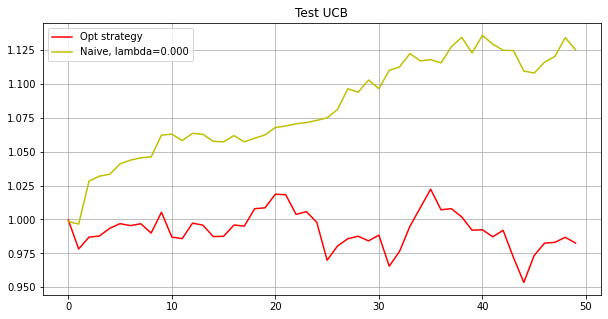

Phase 5
Testing...
./tmp2/snp500-24_phase05_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.      0.      0.      0.     -0.      0.02    0.0109  0.
  0.      0.      0.0316 -0.      0.0028  0.      0.      0.      0.
  0.      0.     -0.     -0.      0.     -0.      0.1604 -0.      0.
  0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
  0.     -0.      0.     -0.      0.      0.      0.0274  0.      0.
  0.      0.0361 -0.     -0.     -0.     -0.      0.      0.      0.0717
  0.      0.      0.      0.116  -0.     -0.      0.      0.0744  0.
  0.1404  0.0402  0.     -0.      0.     -0.      0.      0.0881  0.0465
  0.      0.     -0.     -0.      0.     -0.      0.      0.1025  0.
  0.     -0.      0.      0.     -0.      0.      0.     -0.     -0.
  0.     -0.      0.     -0.      0.      0.     -0.      0.0313 -0.
 -0.    ]
[ 0.      0.     -0.      0

[-0.      0.     -0.     -0.      0.      0.     -0.      0.0071 -0.
  0.0134  0.      0.0052  0.      0.      0.0139  0.     -0.      0.0001
  0.      0.     -0.      0.      0.      0.      0.0849  0.      0.
  0.215   0.0436 -0.      0.     -0.      0.      0.      0.1168  0.
 -0.     -0.     -0.     -0.     -0.      0.0917 -0.      0.0279  0.
 -0.      0.      0.0098  0.      0.      0.      0.      0.      0.
 -0.      0.     -0.      0.0145  0.      0.0137  0.0001  0.      0.
  0.0022  0.0239  0.      0.      0.      0.      0.      0.0396  0.
  0.033   0.      0.      0.      0.      0.     -0.      0.1257  0.
  0.      0.     -0.     -0.      0.      0.      0.      0.      0.
  0.0915 -0.      0.     -0.     -0.      0.0264  0.      0.     -0.
  0.    ]
[-0.     -0.      0.     -0.     -0.      0.     -0.      0.0169  0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.0197  0.
 -0.      0.      0.0247 -0.     -0.      0.1158 -0.     -0.      0.0371
  0.039  -0.    

[ 0.     -0.      0.     -0.     -0.      0.      0.0009  0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1008  0.
 -0.      0.0565  0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.      0.      0.      0.      0.     -0.      0.1057
 -0.     -0.     -0.      0.1588 -0.      0.1643 -0.      0.     -0.
  0.0743 -0.      0.     -0.     -0.     -0.     -0.      0.1382 -0.
  0.0133 -0.      0.     -0.     -0.      0.1604  0.     -0.      0.
 -0.     -0.     -0.     -0.      0.0017 -0.     -0.      0.     -0.
  0.      0.      0.      0.     -0.      0.      0.     -0.     -0.
  0.0251]
[-0.     -0.      0.     -0.      0.      0.      0.0539  0.      0.
  0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.0953  0.0603  0.     -0.
  0.3    -0.     -0.

[ 0.      0.     -0.      0.      0.      0.      0.0323  0.0026 -0.
  0.      0.     -0.      0.      0.1194  0.      0.0351  0.     -0.
  0.     -0.      0.006   0.      0.      0.      0.1382  0.      0.
  0.      0.0038  0.     -0.      0.      0.      0.      0.1081  0.
  0.     -0.      0.      0.0021  0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.      0.      0.     -0.      0.      0.1444  0.      0.      0.
  0.0436  0.0538  0.      0.      0.     -0.      0.     -0.      0.0012
  0.0225  0.      0.      0.0372  0.      0.003  -0.      0.1201  0.
  0.      0.      0.      0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.     -0.     -0.      0.      0.      0.1267  0.
  0.    ]
[-0.      0.     -0.      0.     -0.     -0.      0.0743  0.0101 -0.
 -0.     -0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.

[-0.     -0.     -0.     -0.     -0.      0.     -0.      0.0085 -0.
  0.0067 -0.      0.0073 -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.      0.     -0.     -0.      0.      0.0872 -0.     -0.
 -0.      0.0017 -0.     -0.      0.     -0.      0.      0.      0.
 -0.      0.      0.      0.     -0.      0.0391  0.0011 -0.     -0.
  0.      0.0702  0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.      0.0906  0.0103  0.     -0.
  0.012   0.0291 -0.     -0.     -0.     -0.      0.      0.218  -0.
 -0.      0.0055  0.     -0.     -0.      0.0646 -0.      0.1985  0.
 -0.      0.0078 -0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.1418]
[-0.      0.     -0.     -0.      0.      0.      0.0982  0.0433 -0.
  0.      0.      0.      0.      0.0535  0.     -0.     -0.     -0.
  0.      0.      0.01    0.      0.      0.1289  0.034   0.     -0.
 -0.      0.      0.    

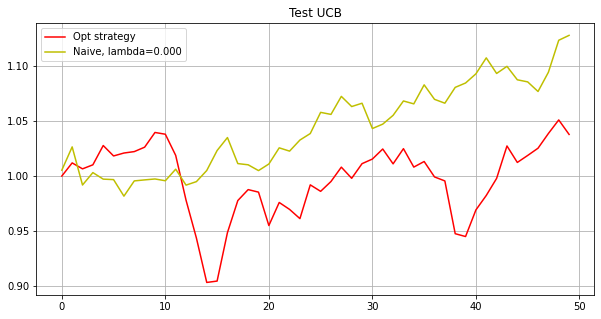

Phase 6
Testing...
./tmp2/snp500-24_phase06_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.      0.      0.      0.      0.      0.016  -0.      0.0039
  0.     -0.      0.1559  0.0607  0.     -0.     -0.      0.      0.
  0.0123 -0.     -0.      0.      0.     -0.     -0.     -0.      0.0791
 -0.      0.      0.0086  0.1281  0.     -0.      0.0507 -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.0043
 -0.      0.      0.      0.     -0.      0.      0.      0.     -0.
 -0.     -0.      0.0814 -0.      0.     -0.     -0.      0.0068 -0.
  0.0179 -0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.0477 -0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.      0.      0.      0.     -0.      0.3    -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0267]
[-0.     -0.     -0.   

[-0.     -0.      0.      0.     -0.      0.     -0.     -0.      0.
  0.      0.     -0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.0674  0.      0.     -0.
  0.0927  0.      0.0037  0.     -0.      0.228  -0.      0.     -0.
  0.1044 -0.      0.      0.      0.      0.     -0.     -0.      0.
  0.      0.      0.      0.0143 -0.      0.     -0.     -0.      0.
  0.0329  0.      0.1327  0.0264  0.      0.      0.     -0.      0.
  0.0137 -0.     -0.      0.     -0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.0138  0.1273  0.     -0.     -0.      0.
  0.0147  0.      0.      0.      0.      0.0327  0.     -0.      0.
  0.061  -0.      0.      0.      0.      0.     -0.      0.      0.0343
  0.    ]
[ 0.      0.      0.      0.0137  0.     -0.      0.0435 -0.     -0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
  0.0069 -0.     -0.      0.      0.0415  0.012   0.0142  0.      0.0303
 -0.      0.    

[ 0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.0387 -0.      0.     -0.     -0.     -0.      0.      0.      0.1008
  0.     -0.      0.      0.0998 -0.      0.2083  0.0489  0.0103  0.
  0.     -0.      0.0075 -0.      0.      0.     -0.      0.0476  0.
 -0.     -0.     -0.      0.0042 -0.     -0.     -0.     -0.      0.
  0.0009  0.     -0.      0.0009 -0.      0.      0.      0.0378  0.
 -0.     -0.      0.1995 -0.     -0.     -0.      0.      0.     -0.
  0.1251 -0.      0.     -0.     -0.      0.0094 -0.     -0.      0.
 -0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
  0.     -0.      0.     -0.     -0.      0.     -0.     -0.      0.0602
 -0.    ]
[ 0.     -0.      0.      0.     -0.      0.     -0.      0.      0.0106
 -0.     -0.      0.0263  0.0418  0.      0.     -0.     -0.     -0.
 -0.      0.      0.      0.      0.      0.0652 -0.      0.0465  0.
  0.     -0.

[-0.      0.     -0.     -0.      0.     -0.      0.0028  0.      0.017
  0.     -0.      0.      0.      0.     -0.      0.      0.      0.
  0.0077 -0.     -0.      0.054  -0.     -0.     -0.      0.0201  0.0253
  0.      0.0225  0.0137  0.      0.      0.      0.      0.      0.
  0.      0.      0.018   0.091   0.     -0.      0.      0.      0.0178
  0.      0.      0.1191  0.     -0.      0.0754 -0.     -0.      0.
 -0.      0.      0.0338  0.     -0.      0.0141  0.      0.0275 -0.
 -0.     -0.      0.069  -0.      0.0864 -0.      0.0047  0.0102 -0.
  0.0177 -0.     -0.      0.      0.0558  0.0228 -0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.1524  0.      0.     -0.
  0.      0.      0.     -0.      0.0118  0.     -0.     -0.      0.0092
 -0.    ]
[-0.      0.      0.     -0.      0.     -0.      0.0321  0.      0.
  0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.     -0.      0.093  -0.     -0.     -0.     -0.      0.0488
  0.0

[ 0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
  0.     -0.     -0.      0.0007  0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.0681 -0.     -0.      0.     -0.     -0.
  0.0973 -0.     -0.      0.0461 -0.      0.1998 -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.      0.      0.      0.     -0.
 -0.     -0.      0.      0.0134 -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0413 -0.     -0.     -0.     -0.     -0.     -0.
  0.1493  0.      0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.0465 -0.      0.     -0.      0.1759 -0.     -0.     -0.
  0.0082  0.     -0.     -0.     -0.     -0.      0.     -0.      0.1533
 -0.    ]
[0.     0.     0.     0.0785 0.     0.     0.     0.     0.     0.
 0.     0.     0.0475 0.     0.     0.     0.     0.0214 0.     0.
 0.0373 0.     0.     0.     0.     0.     0.     0.     0.0345 0.
 0.     0.     0.     0.  

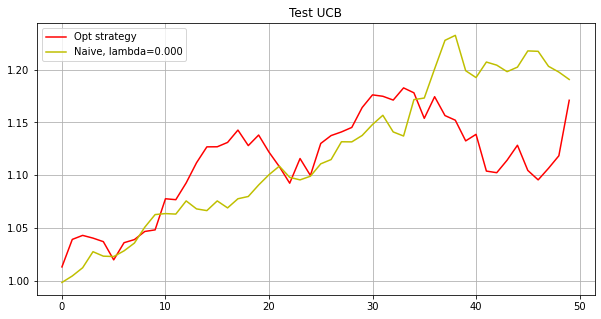

Phase 7
Testing...
./tmp2/snp500-24_phase07_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.      0.     -0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.114  -0.      0.0559 -0.      0.      0.0674  0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.0053  0.      0.
 -0.      0.0354 -0.     -0.      0.0266  0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
  0.      0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.     -0.     -0.      0.1903  0.     -0.     -0.     -0.      0.
 -0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
 -0.     -0.      0.0914  0.0373 -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.      0.      0.1918  0.     -0.
 -0.      0.      0.1846  0.     -0.      0.      0.     -0.      0.
  0.    ]
[ 0.      0.0044  0.      0.      0

[-0.      0.      0.     -0.     -0.      0.     -0.     -0.      0.0222
  0.      0.0195 -0.     -0.      0.     -0.      0.0262 -0.      0.
 -0.      0.     -0.     -0.      0.      0.      0.0118  0.0394 -0.
 -0.     -0.      0.0965 -0.     -0.     -0.      0.      0.0714 -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.     -0.
  0.      0.     -0.      0.012   0.      0.     -0.     -0.      0.
 -0.     -0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.      0.0411  0.0512  0.0833 -0.      0.     -0.     -0.      0.
  0.      0.      0.2331 -0.     -0.     -0.      0.1292 -0.      0.
  0.0766  0.      0.      0.      0.0866  0.     -0.     -0.      0.
  0.    ]
[-0.     -0.      0.     -0.      0.0103  0.     -0.     -0.     -0.
  0.      0.156  -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
 -0.     -0.      0.

[ 0.     -0.     -0.      0.      0.      0.      0.      0.      0.
 -0.      0.027  -0.     -0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.1317 -0.      0.0973  0.     -0.      0.     -0.
 -0.      0.      0.      0.      0.      0.      0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.     -0.      0.0288 -0.
  0.      0.     -0.      0.1217  0.0047 -0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.0521  0.0531  0.      0.0785 -0.      0.     -0.      0.034
  0.      0.      0.1405 -0.     -0.     -0.      0.0898 -0.      0.
 -0.      0.      0.      0.      0.1407 -0.      0.     -0.     -0.
 -0.    ]
[-0.      0.      0.     -0.      0.0118  0.     -0.     -0.      0.0415
 -0.      0.2025  0.      0.     -0.      0.      0.015  -0.      0.0029
 -0.     -0.     -0.     -0.     -0.      0.1084  0.     -0.      0.
 -0.      0. 

[-0.      0.0011  0.     -0.      0.     -0.     -0.     -0.      0.0432
  0.      0.      0.0055  0.0114  0.     -0.      0.      0.      0.
  0.     -0.      0.     -0.     -0.      0.0003  0.      0.015  -0.
  0.      0.0059  0.      0.     -0.     -0.     -0.      0.0191 -0.
  0.      0.      0.      0.      0.      0.     -0.      0.      0.
  0.      0.      0.0495  0.005  -0.     -0.      0.0122  0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.2711 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0894  0.1297  0.0509  0.0255 -0.      0.     -0.      0.0224
  0.      0.      0.      0.0342 -0.     -0.      0.071   0.      0.
  0.      0.      0.1059  0.     -0.      0.      0.     -0.      0.
  0.0315]
[-0.     -0.      0.0076  0.      0.0274 -0.      0.      0.     -0.
  0.      0.182   0.      0.0771  0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.     -0.      0.0514  0.      0.
 -0.      0.    

[ 0.     -0.     -0.      0.      0.0218  0.     -0.     -0.      0.
 -0.      0.0977 -0.      0.0997 -0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.144   0.     -0.      0.      0.0158  0.065  -0.
  0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.0074
 -0.     -0.      0.0029 -0.     -0.     -0.     -0.      0.0783  0.
  0.     -0.      0.      0.0898 -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.1244  0.0538 -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.1662 -0.      0.0177  0.      0.0154 -0.     -0.     -0.      0.
 -0.    ]
[-0.      0.      0.      0.     -0.      0.     -0.      0.      0.0324
  0.     -0.     -0.      0.1074  0.     -0.      0.     -0.      0.0208
 -0.      0.      0.     -0.      0.      0.0753 -0.      0.0935  0.
  0.     -0.

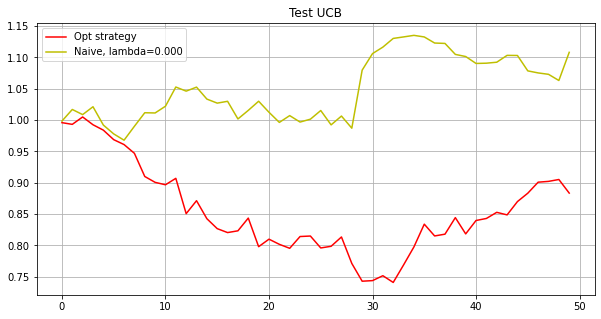

Phase 8
Testing...
./tmp2/snp500-24_phase08_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.0041  0.0032  0.0057  0.      0.0137  0.     -0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.0224  0.     -0.
  0.0069  0.      0.     -0.      0.     -0.     -0.     -0.      0.01
  0.      0.      0.      0.      0.     -0.     -0.      0.     -0.
  0.0008  0.      0.      0.0078 -0.      0.      0.1883 -0.      0.
 -0.      0.     -0.     -0.     -0.      0.     -0.      0.0121 -0.
 -0.      0.0205  0.0409 -0.      0.      0.0543  0.0573 -0.      0.
  0.0386 -0.      0.      0.     -0.      0.     -0.      0.0694  0.
 -0.      0.     -0.      0.1384  0.0683  0.0454  0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.      0.0601  0.      0.     -0.
 -0.     -0.      0.0785  0.0535 -0.      0.      0.     -0.      0.
 -0.    ]
[-0.     -0.      0.      0.     

[ 0.      0.0046  0.0076 -0.      0.      0.0128  0.      0.     -0.
  0.     -0.      0.      0.      0.      0.0224  0.0112  0.0027  0.
  0.011   0.0204 -0.      0.     -0.      0.     -0.     -0.      0.0043
 -0.     -0.     -0.      0.      0.0266 -0.      0.      0.0038  0.
  0.041   0.     -0.     -0.      0.0065  0.      0.0677  0.0879  0.0019
  0.     -0.      0.0012  0.      0.     -0.      0.      0.0287 -0.
 -0.      0.      0.0819  0.     -0.      0.      0.      0.     -0.
  0.0326  0.0388 -0.      0.0151  0.0141 -0.     -0.      0.0017 -0.
  0.1236 -0.     -0.      0.0773  0.0673  0.0436 -0.      0.      0.
  0.0054 -0.     -0.      0.      0.      0.0397  0.0512 -0.      0.
  0.      0.0109  0.0347  0.      0.      0.     -0.     -0.     -0.
  0.    ]
[-0.      0.0014  0.0007  0.      0.      0.      0.      0.0258 -0.
  0.      0.      0.      0.     -0.     -0.      0.      0.0032 -0.
 -0.      0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.0097

[ 0.0205  0.0041  0.0059 -0.      0.039   0.0062 -0.      0.     -0.
  0.      0.     -0.      0.      0.     -0.      0.      0.0003  0.
 -0.     -0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.089  -0.      0.0727  0.      0.023  -0.     -0.
  0.0251  0.      0.     -0.      0.     -0.      0.      0.105  -0.
  0.     -0.      0.      0.0213  0.      0.      0.0033  0.      0.
  0.      0.      0.1267  0.     -0.      0.      0.0629  0.      0.0399
  0.0147 -0.     -0.      0.      0.0043  0.0842  0.0221  0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.0048  0.0447  0.      0.      0.0352  0.     -0.      0.
  0.     -0.      0.0568  0.0675  0.     -0.     -0.     -0.      0.0212
 -0.    ]
[ 0.0402  0.0004  0.     -0.      0.0181  0.0012 -0.      0.0202 -0.
 -0.      0.0734 -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.      0.     -0.      0.0555 -0.     -0.
 -0.     -0.    

[ 0.0247 -0.     -0.      0.0674  0.0285 -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.0216  0.0157  0.0145  0.0298
  0.     -0.     -0.      0.     -0.      0.      0.      0.1302 -0.
 -0.      0.      0.     -0.      0.0276  0.0193 -0.     -0.      0.
  0.0088 -0.      0.      0.     -0.     -0.      0.     -0.     -0.
  0.058   0.102  -0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.      0.1546 -0.     -0.     -0.      0.      0.     -0.
  0.0419 -0.     -0.      0.0572  0.     -0.      0.      0.0344  0.
  0.     -0.      0.     -0.      0.0053 -0.      0.     -0.      0.
  0.0016  0.      0.0685  0.     -0.      0.0806 -0.      0.      0.
 -0.     -0.     -0.      0.0078  0.     -0.     -0.      0.     -0.
 -0.    ]
[-0.     -0.     -0.      0.     -0.      0.0125 -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.      0.
  0.      0.     -0.      0.      0.      0.1065  0.0316 -0.     -0.
 -0.     -0.      0.

[ 0.0071  0.      0.      0.0241  0.018  -0.     -0.      0.0132 -0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.      0.0299 -0.
 -0.     -0.      0.     -0.     -0.      0.      0.0142 -0.      0.0067
 -0.      0.     -0.     -0.      0.0416  0.0409  0.     -0.      0.
  0.0617 -0.     -0.     -0.      0.      0.      0.014   0.0614 -0.
 -0.     -0.      0.      0.      0.0983  0.     -0.      0.      0.0094
 -0.     -0.      0.0353  0.      0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.     -0.      0.0303 -0.      0.     -0.
  0.      0.0276  0.      0.092  -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.0471 -0.     -0.     -0.
 -0.     -0.      0.      0.0822  0.      0.     -0.      0.2448 -0.
 -0.    ]
[ 0.      0.0013  0.      0.      0.0405 -0.      0.      0.0206  0.
 -0.     -0.      0.     -0.     -0.      0.      0.0786  0.0204  0.
 -0.     -0.      0.     -0.     -0.      0.     -0.     -0.      0.
 -0.      0.0029

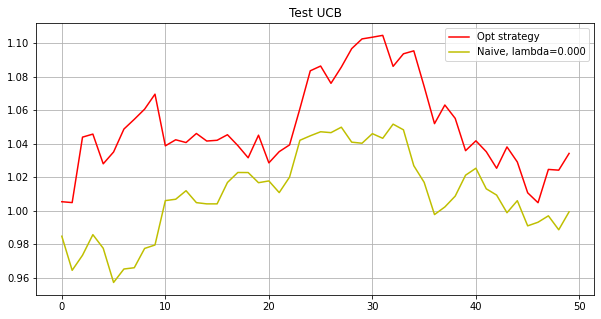

Phase 9
Testing...
./tmp2/snp500-24_phase09_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0105  0.0034  0.0188  0.      0.0046  0.0505  0.0094  0.      0.
  0.0042  0.0001  0.      0.      0.      0.      0.      0.     -0.
  0.      0.042   0.      0.0243  0.      0.0325  0.      0.     -0.
  0.      0.      0.      0.0627  0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.      0.      0.0558  0.      0.0478
 -0.      0.      0.     -0.      0.      0.0333  0.     -0.      0.021
  0.     -0.      0.      0.     -0.      0.      0.      0.     -0.
  0.0076  0.      0.0194  0.      0.      0.      0.0005  0.      0.019
  0.      0.      0.     -0.     -0.      0.      0.0292  0.048  -0.
  0.1611 -0.      0.0475 -0.      0.     -0.      0.     -0.      0.0939
  0.      0.      0.      0.      0.      0.05    0.      0.1029 -0.
  0.    ]
[ 0.      0.0004  0.0

[-0.      0.0034  0.     -0.     -0.     -0.     -0.     -0.      0.
  0.0205 -0.      0.0029 -0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.0165 -0.      0.0072  0.     -0.     -0.
 -0.      0.     -0.      0.0343  0.     -0.      0.1688 -0.     -0.
 -0.     -0.      0.0245 -0.     -0.     -0.      0.0716 -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0164 -0.     -0.      0.
 -0.     -0.     -0.      0.0196 -0.      0.     -0.      0.0567 -0.
  0.008  -0.     -0.     -0.     -0.      0.0015  0.0782 -0.     -0.
 -0.     -0.      0.1937 -0.      0.0447  0.     -0.      0.      0.0522
  0.0897 -0.      0.0496  0.0367  0.     -0.     -0.      0.0033  0.
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.    ]
[-0.      0.0048  0.      0.018   0.008   0.032   0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.      0.0115 -0.     -0.
 -0.     -0.      0.     -0.      0.0002  0.0009 -0.      0.     -0.
 -0.      0.0021  0.

[ 0.      0.0037  0.0335 -0.      0.002   0.0351  0.     -0.     -0.
  0.059   0.     -0.      0.     -0.      0.      0.      0.0003  0.
  0.      0.0493 -0.      0.0175 -0.      0.049   0.     -0.      0.
  0.     -0.      0.      0.0421  0.      0.1224  0.     -0.      0.
  0.      0.      0.0416 -0.     -0.     -0.      0.0528  0.0473  0.
  0.0006 -0.     -0.      0.      0.      0.     -0.      0.0028  0.0215
 -0.      0.      0.      0.     -0.      0.     -0.      0.      0.1034
  0.0036 -0.      0.      0.      0.      0.0058 -0.      0.     -0.
  0.      0.0013 -0.     -0.     -0.      0.      0.0834 -0.     -0.
  0.0916  0.      0.0552 -0.      0.0697  0.      0.      0.0055 -0.
  0.      0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.    ]
[-0.      0.001   0.0004 -0.      0.0016 -0.     -0.     -0.      0.
  0.036   0.      0.0661 -0.     -0.     -0.      0.0276 -0.     -0.
 -0.     -0.      0.      0.0436 -0.      0.      0.     -0.     -0.
 -0.     -0.    

[ 0.      0.004   0.0181  0.0326  0.0025  0.0425 -0.     -0.     -0.
  0.0182 -0.     -0.     -0.     -0.     -0.      0.      0.0098  0.
 -0.      0.0305 -0.      0.0019 -0.      0.0909  0.     -0.      0.
 -0.     -0.     -0.      0.0574 -0.     -0.      0.0802  0.      0.
  0.0231  0.      0.0383 -0.      0.     -0.      0.      0.      0.
 -0.      0.0984 -0.     -0.      0.     -0.      0.      0.      0.
 -0.     -0.      0.     -0.      0.0465  0.      0.     -0.      0.005
  0.0349 -0.      0.0759 -0.     -0.      0.0086  0.0874 -0.     -0.
  0.      0.     -0.     -0.      0.      0.0193 -0.     -0.     -0.
  0.1127 -0.      0.0607 -0.      0.      0.      0.     -0.      0.0006
  0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
  0.    ]
[ 0.0145  0.0036  0.0369  0.      0.0021  0.0435  0.0047  0.      0.
  0.      0.      0.0668  0.     -0.      0.      0.      0.0324  0.
  0.0192  0.     -0.      0.0387 -0.     -0.      0.     -0.      0.
 -0.     -0.     

[-0.      0.0037  0.     -0.     -0.      0.0381  0.0101  0.      0.
  0.049  -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
  0.      0.012  -0.     -0.     -0.      0.072  -0.      0.      0.0089
 -0.      0.     -0.      0.0345 -0.     -0.      0.0178  0.     -0.
  0.0492 -0.      0.      0.      0.     -0.     -0.      0.0477 -0.
 -0.      0.      0.      0.1436 -0.      0.      0.      0.     -0.
  0.     -0.     -0.     -0.      0.     -0.     -0.      0.      0.173
  0.0382  0.     -0.     -0.      0.0764  0.0083  0.0659 -0.      0.
 -0.     -0.      0.      0.      0.0565 -0.      0.     -0.      0.0403
 -0.     -0.      0.0547  0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.    ]
[-0.      0.0021 -0.     -0.     -0.      0.0187 -0.     -0.      0.
  0.     -0.      0.0315 -0.      0.      0.0062  0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0097  0.0162 -0.     -0.
  0.      0. 

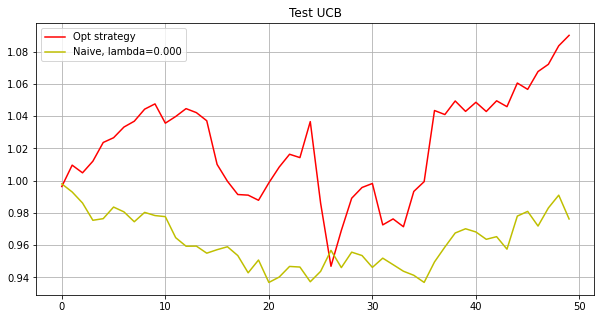

Phase 10
Testing...
./tmp2/snp500-24_phase10_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0192  0.0023  0.0052  0.0003  0.0456  0.      0.0221  0.      0.
  0.0271  0.0067 -0.     -0.      0.116   0.0065  0.      0.      0.0657
  0.02   -0.      0.     -0.      0.      0.     -0.      0.0034  0.0082
  0.0567 -0.     -0.      0.      0.0181 -0.     -0.      0.0012 -0.
 -0.      0.0085  0.      0.0223  0.     -0.      0.0293 -0.      0.1649
  0.0577  0.0037 -0.      0.0366  0.     -0.     -0.     -0.      0.0592
  0.      0.007  -0.     -0.     -0.      0.      0.0059 -0.      0.
  0.      0.     -0.      0.      0.      0.0009  0.      0.     -0.
  0.0104  0.0609  0.      0.0675 -0.     -0.     -0.     -0.      0.
 -0.      0.0016 -0.      0.     -0.      0.     -0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.0001  0.0389 -0.     -0.
  0.    ]
[-0.      0.0037  

[ 0.      0.0057  0.0071 -0.      0.     -0.      0.0002  0.      0.0097
  0.      0.0142  0.0012  0.      0.      0.0139 -0.      0.0266  0.
  0.      0.      0.0032 -0.     -0.     -0.      0.      0.      0.0034
 -0.      0.     -0.      0.      0.0339 -0.      0.0454  0.0071  0.
  0.      0.0354 -0.     -0.      0.0195  0.0239  0.0458 -0.      0.
 -0.      0.     -0.     -0.      0.0059  0.     -0.     -0.      0.
  0.     -0.      0.0073 -0.      0.039  -0.      0.0092  0.1077  0.
 -0.      0.      0.     -0.     -0.      0.0778  0.      0.     -0.
  0.      0.1043  0.     -0.     -0.      0.2268 -0.      0.009   0.
 -0.      0.0116 -0.      0.      0.0702 -0.     -0.     -0.     -0.
  0.0028  0.      0.      0.     -0.      0.004   0.0281 -0.     -0.
  0.    ]
[ 0.      0.0027  0.0046  0.     -0.     -0.      0.0016 -0.      0.
  0.0347  0.0077 -0.      0.0014  0.0091  0.0244  0.      0.0234  0.0106
  0.0068  0.     -0.      0.0134 -0.      0.      0.1496  0.      0.0075
  0.0509

[ 0.      0.0041  0.0068  0.      0.     -0.      0.0121 -0.      0.
  0.      0.0119  0.     -0.      0.      0.0032 -0.      0.0027  0.
  0.     -0.      0.      0.1163  0.      0.      0.0296 -0.      0.0145
 -0.     -0.     -0.     -0.      0.0286  0.0002 -0.     -0.      0.
 -0.      0.0376  0.0141  0.0259  0.0235  0.      0.0368  0.0497 -0.
 -0.      0.      0.      0.0385  0.0587 -0.      0.0195 -0.      0.
  0.     -0.     -0.     -0.      0.     -0.      0.0013  0.0125  0.
 -0.      0.     -0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.0676  0.      0.0531  0.      0.     -0.      0.      0.0101
 -0.      0.0228 -0.      0.0135  0.1177  0.0761 -0.      0.     -0.
 -0.     -0.      0.011  -0.      0.      0.0716  0.0085  0.      0.
  0.    ]
[ 0.      0.0032  0.0081  0.     -0.     -0.      0.0133 -0.     -0.
  0.0068  0.0137  0.      0.011   0.0483  0.     -0.      0.      0.0009
  0.     -0.     -0.      0.      0.      0.      0.      0.      0.0043
 -0.    

[ 0.0025  0.0024  0.0077  0.0524  0.     -0.      0.0097 -0.      0.
  0.      0.0106  0.     -0.     -0.      0.0043 -0.      0.0104  0.1328
  0.     -0.     -0.      0.047   0.     -0.      0.     -0.      0.0123
  0.0271 -0.      0.      0.      0.0402  0.      0.     -0.      0.
 -0.      0.0246  0.     -0.      0.0118  0.      0.0245 -0.      0.1585
  0.     -0.     -0.      0.      0.0021 -0.      0.     -0.      0.
 -0.     -0.      0.      0.      0.0013  0.0561  0.      0.0243 -0.
  0.0766  0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.      0.0751  0.      0.     -0.     -0.     -0.      0.022   0.
 -0.      0.      0.     -0.      0.0708  0.      0.0243  0.      0.
  0.0093 -0.      0.0212 -0.      0.     -0.      0.0381  0.     -0.
 -0.    ]
[ 0.      0.0018  0.0068  0.0062  0.     -0.      0.012   0.      0.0305
  0.0149  0.0119 -0.      0.0153 -0.      0.0036 -0.      0.      0.008
  0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.0003
 

[ 0.0143  0.0072  0.0096  0.      0.0091  0.0019  0.0152 -0.      0.
  0.0322  0.0179 -0.      0.      0.      0.0315  0.      0.0344  0.0242
 -0.      0.0048 -0.      0.0539 -0.     -0.      0.     -0.      0.023
 -0.     -0.     -0.     -0.      0.0471 -0.      0.     -0.      0.
  0.      0.0427  0.0166 -0.      0.      0.      0.0468 -0.     -0.
 -0.     -0.     -0.      0.0094  0.044   0.     -0.      0.     -0.
 -0.     -0.      0.0205  0.0185  0.      0.0004 -0.      0.0231  0.
 -0.      0.0129  0.      0.     -0.      0.1147  0.      0.     -0.
  0.      0.0993  0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.      0.      0.      0.061  -0.     -0.      0.     -0.
  0.1344 -0.     -0.      0.      0.      0.0067  0.0212 -0.      0.0013
 -0.    ]
[-0.      0.0022  0.0055 -0.      0.     -0.      0.0053 -0.     -0.
 -0.      0.0037 -0.      0.0131  0.0067  0.      0.      0.0328 -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.0042
  0.     

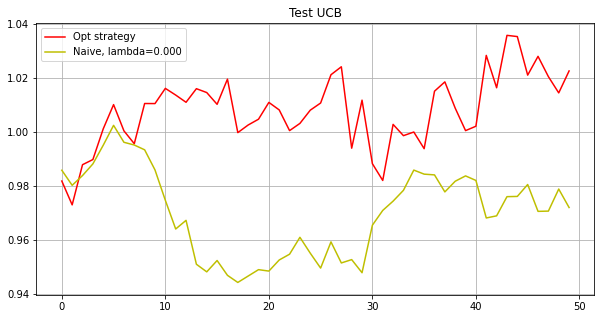

Phase 11
Testing...
./tmp2/snp500-24_phase11_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.      0.0066 -0.      0.0103  0.0057  0.      0.019   0.0363  0.
  0.0287  0.      0.      0.0299 -0.      0.      0.      0.     -0.
 -0.      0.0168  0.048  -0.     -0.      0.0337  0.0053  0.0067 -0.
  0.0234  0.0548 -0.      0.      0.      0.0246  0.0265  0.023   0.
  0.0516 -0.      0.0238  0.     -0.      0.0055  0.      0.      0.0345
  0.     -0.     -0.      0.      0.      0.0095 -0.      0.0178  0.
  0.     -0.      0.     -0.      0.      0.      0.0213 -0.      0.
  0.0047 -0.      0.      0.0168  0.      0.      0.      0.0318  0.
 -0.      0.092   0.0493  0.0534 -0.     -0.      0.      0.0124 -0.
  0.      0.0586 -0.      0.      0.0253 -0.      0.0229 -0.      0.023
  0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.0467]
[ 0.      0.0028 -0.      0

[ 0.      0.0044 -0.     -0.      0.0359  0.      0.0061 -0.      0.0102
  0.0191  0.     -0.      0.      0.0093  0.0724  0.     -0.      0.
  0.0044 -0.     -0.      0.     -0.      0.0152  0.      0.      0.
  0.0056  0.0515  0.      0.      0.0222  0.0352 -0.      0.0465  0.
 -0.      0.1044  0.0086  0.      0.      0.0002 -0.      0.      0.0233
  0.      0.      0.      0.0971 -0.      0.0175  0.     -0.     -0.
  0.      0.0104 -0.      0.     -0.      0.     -0.      0.      0.
  0.     -0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.0383  0.0944  0.088   0.0969 -0.     -0.     -0.      0.0055 -0.
 -0.      0.      0.      0.0034  0.0074  0.0348  0.     -0.      0.
  0.     -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.
  0.032 ]
[-0.      0.0028 -0.      0.0086 -0.      0.      0.     -0.      0.0466
  0.0147 -0.      0.      0.0044  0.      0.043   0.      0.0072 -0.
  0.0839  0.     -0.      0.      0.      0.0025 -0.     -0.      0.
 -0.      0.

[ 0.0003  0.0024  0.0268  0.      0.0144  0.      0.      0.0444  0.
  0.0268  0.     -0.      0.014   0.      0.      0.      0.      0.
  0.1659  0.0519  0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.0381  0.      0.      0.0284 -0.      0.      0.0361  0.
  0.0426  0.0877  0.0346  0.0348  0.      0.     -0.      0.      0.0269
  0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.0044 -0.      0.      0.      0.     -0.     -0.     -0.
  0.      0.      0.      0.     -0.     -0.      0.0052  0.0642  0.
  0.0069  0.061   0.022   0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.      0.0048  0.008   0.      0.0391  0.0192  0.
  0.      0.0018  0.     -0.      0.0027  0.0197  0.0648 -0.      0.
 -0.    ]
[ 0.      0.0036  0.0296  0.      0.0163  0.      0.      0.0104 -0.
  0.      0.     -0.      0.013   0.0084  0.      0.     -0.     -0.
  0.058   0.     -0.     -0.     -0.      0.0254  0.0101  0.002  -0.
  0.1077  0.0405  0.

[ 0.      0.0052 -0.      0.      0.0143  0.      0.      0.0253  0.0017
  0.0203  0.     -0.      0.0118 -0.      0.0081 -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.018   0.      0.0022  0.
 -0.      0.0487  0.0061  0.0493  0.0257  0.0211  0.      0.0522 -0.
 -0.      0.0387  0.008   0.037   0.     -0.     -0.      0.     -0.
  0.     -0.     -0.      0.2175  0.      0.0498  0.     -0.      0.0031
  0.      0.0326 -0.     -0.     -0.      0.      0.      0.      0.
  0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
 -0.      0.0823  0.0458  0.0253  0.     -0.     -0.      0.     -0.
 -0.      0.0871 -0.     -0.      0.0055  0.0066 -0.     -0.      0.0085
  0.     -0.      0.     -0.     -0.     -0.      0.     -0.      0.
  0.0422]
[-0.      0.0045 -0.      0.0243  0.0141  0.0003  0.0004  0.0052  0.
  0.0228  0.     -0.      0.0258 -0.      0.0071  0.      0.      0.
  0.0752  0.0142  0.     -0.     -0.      0.0058  0.      0.0103  0.0575
  0.    

[-0.      0.0063 -0.      0.0044  0.0216  0.     -0.      0.0158  0.
  0.0094 -0.      0.      0.0191 -0.      0.0111  0.      0.      0.
  0.144  -0.      0.     -0.     -0.      0.0244 -0.      0.     -0.
  0.0683  0.0475 -0.      0.0235 -0.     -0.      0.0415  0.0362 -0.
 -0.      0.0213 -0.      0.0019 -0.     -0.     -0.      0.      0.0147
  0.0109  0.0072  0.      0.0747  0.      0.0071  0.      0.      0.0057
  0.     -0.      0.003   0.      0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.0095 -0.      0.0123  0.     -0.      0.
  0.0145  0.1094  0.1125 -0.      0.      0.      0.     -0.     -0.
  0.0118  0.0249  0.      0.      0.      0.0162  0.0163  0.      0.
  0.     -0.      0.0126 -0.     -0.      0.0207 -0.      0.0034 -0.
  0.0163]
[ 0.      0.003  -0.      0.0229  0.0124  0.      0.047   0.0066  0.0338
  0.      0.     -0.      0.0069 -0.      0.0249 -0.     -0.     -0.
  0.0688  0.0237 -0.     -0.     -0.      0.0147  0.      0.      0.
  0.0276  0.

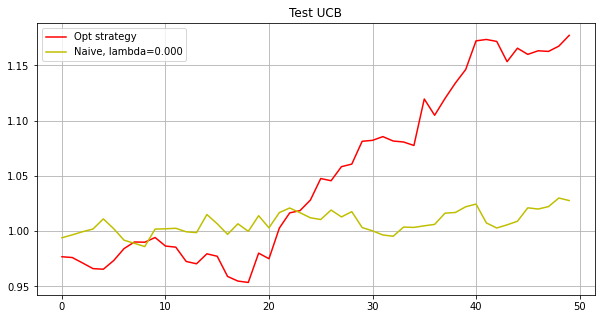

Phase 12
Testing...
./tmp2/snp500-24_phase12_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.      0.0038 -0.      0.0057  0.0324  0.     -0.      0.0127 -0.
  0.0368  0.0379  0.      0.016   0.0011  0.      0.0179  0.     -0.
  0.0714  0.     -0.      0.0491 -0.     -0.      0.     -0.      0.0075
  0.      0.     -0.     -0.      0.0013  0.0471  0.      0.      0.
 -0.      0.0229  0.      0.0389  0.0439  0.      0.0649 -0.      0.
  0.0166  0.     -0.      0.0211 -0.      0.     -0.      0.      0.
 -0.     -0.      0.0449 -0.     -0.      0.0328  0.      0.      0.0778
  0.031   0.     -0.     -0.      0.0045  0.     -0.      0.      0.
 -0.     -0.      0.     -0.      0.      0.0233  0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.0731  0.0695  0.
  0.0148 -0.      0.     -0.      0.      0.0463  0.      0.      0.0091
  0.0238]
[-0.      0.0085 -0.  

[-0.      0.0051 -0.      0.017   0.0129  0.     -0.      0.0281  0.0352
  0.      0.0378  0.      0.02    0.      0.      0.      0.      0.
 -0.      0.     -0.      0.0341 -0.     -0.      0.0683 -0.     -0.
  0.      0.     -0.      0.     -0.     -0.      0.      0.      0.0195
 -0.      0.0976  0.      0.0144 -0.      0.106   0.0138 -0.      0.
  0.0256  0.     -0.     -0.     -0.      0.0103 -0.      0.      0.
  0.0009  0.     -0.      0.     -0.      0.0524  0.      0.0427 -0.
  0.0145 -0.      0.     -0.     -0.     -0.     -0.      0.      0.0566
 -0.     -0.      0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.      0.0207 -0.     -0.     -0.      0.0045  0.0547  0.015
  0.      0.      0.1009 -0.      0.0064  0.0388  0.0276  0.      0.0183
 -0.    ]
[ 0.      0.0057  0.     -0.      0.0251  0.      0.      0.0249  0.
  0.      0.0352  0.0128  0.0214 -0.     -0.     -0.      0.      0.
  0.1782 -0.     -0.      0.0809  0.     -0.      0.0136 -0.      0.0844
 

[ 0.      0.0082  0.     -0.      0.0219  0.     -0.      0.005   0.
  0.      0.0203 -0.      0.0183 -0.     -0.     -0.      0.028  -0.
  0.14   -0.      0.      0.0922  0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.      0.0111 -0.     -0.
  0.0179  0.0482 -0.      0.0623 -0.     -0.      0.0529 -0.     -0.
  0.      0.     -0.     -0.      0.     -0.      0.043  -0.      0.0111
  0.0092 -0.     -0.      0.     -0.      0.103  -0.     -0.     -0.
  0.0366  0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.      0.      0.0204
  0.     -0.     -0.      0.0208  0.0035  0.     -0.     -0.     -0.
 -0.     -0.      0.0504 -0.     -0.      0.0616 -0.      0.006   0.
  0.1079]
[ 0.      0.0046 -0.      0.     -0.      0.      0.     -0.      0.0358
  0.     -0.      0.      0.0134  0.0016  0.      0.0035 -0.      0.
  0.2022 -0.      0.     -0.      0.0383 -0.      0.0603  0.      0.0528
 -0.    

[-0.      0.0064 -0.      0.      0.      0.0054  0.     -0.      0.0019
  0.0028  0.0342  0.      0.0078 -0.      0.     -0.     -0.      0.0076
  0.0979  0.      0.      0.0366  0.      0.      0.0179 -0.      0.
  0.0216 -0.     -0.     -0.      0.1712 -0.      0.0249  0.     -0.
 -0.      0.0758  0.      0.0356 -0.     -0.      0.0004  0.0103  0.
  0.      0.      0.     -0.     -0.     -0.      0.0137  0.      0.
  0.      0.     -0.      0.     -0.     -0.     -0.      0.0218 -0.
  0.045   0.     -0.      0.      0.0137 -0.      0.      0.     -0.
  0.      0.     -0.     -0.      0.      0.0239  0.      0.      0.0029
 -0.      0.     -0.      0.0269  0.0689 -0.      0.      0.     -0.
  0.0594  0.      0.1189  0.      0.0235  0.0232  0.      0.      0.
 -0.    ]
[ 0.      0.0055  0.      0.0139  0.0264 -0.     -0.     -0.      0.
  0.0051  0.0242 -0.      0.0154 -0.     -0.      0.0056 -0.      0.
  0.0069 -0.      0.     -0.      0.     -0.      0.0281 -0.      0.0513
 -0.    

[ 0.      0.0059  0.      0.0062 -0.     -0.      0.     -0.      0.0456
  0.0724  0.0334 -0.      0.0111 -0.      0.     -0.     -0.      0.029
  0.      0.      0.      0.0026  0.0448  0.     -0.      0.1105  0.
 -0.     -0.      0.0321 -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0313 -0.      0.0047  0.      0.      0.1518  0.      0.
 -0.      0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.     -0.     -0.     -0.      0.     -0.      0.0246 -0.
  0.0661 -0.     -0.      0.      0.081   0.     -0.      0.      0.0345
 -0.      0.     -0.     -0.     -0.      0.0214  0.     -0.      0.018
  0.     -0.      0.     -0.     -0.     -0.      0.023   0.     -0.
  0.     -0.      0.0699  0.0412 -0.      0.0386  0.      0.      0.0005
  0.    ]
[ 0.      0.0006  0.     -0.      0.0533 -0.      0.     -0.      0.
  0.      0.0138 -0.      0.0005 -0.     -0.     -0.      0.      0.
  0.087   0.0369 -0.      0.043  -0.      0.      0.0504  0.1026  0.
 -0.  

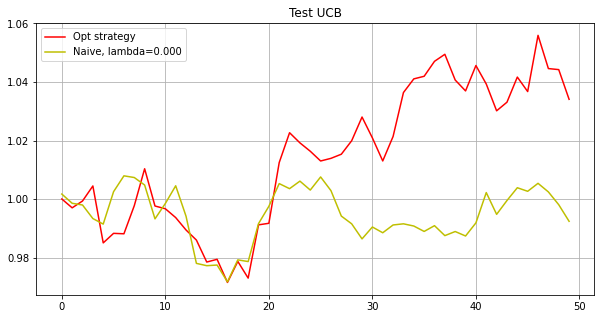

Phase 13
Testing...
./tmp2/snp500-24_phase13_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.     -0.      0.      0.0193  0.     -0.     -0.      0.0348
  0.0204  0.      0.      0.047  -0.      0.     -0.      0.      0.086
  0.0409  0.0526 -0.     -0.      0.      0.1009  0.     -0.      0.
  0.153  -0.      0.0098  0.      0.     -0.     -0.      0.0297 -0.
 -0.     -0.     -0.     -0.      0.     -0.      0.     -0.      0.
  0.     -0.     -0.      0.     -0.      0.      0.0132  0.0289  0.
 -0.      0.     -0.      0.      0.0097  0.     -0.     -0.      0.0641
  0.      0.0356 -0.     -0.     -0.      0.     -0.     -0.      0.0667
 -0.      0.     -0.      0.     -0.      0.      0.     -0.      0.0409
 -0.     -0.     -0.     -0.     -0.      0.      0.     -0.      0.
  0.1445  0.      0.     -0.     -0.     -0.      0.      0.      0.0021
  0.    ]
[-0.      0

[-0.      0.002   0.      0.022   0.0722  0.      0.     -0.      0.
  0.0236  0.     -0.      0.0657  0.0143  0.     -0.     -0.      0.015
  0.     -0.      0.0068  0.      0.      0.0766  0.      0.0448  0.
 -0.      0.      0.0401  0.     -0.     -0.      0.0025 -0.     -0.
  0.0185 -0.     -0.      0.     -0.      0.0303  0.     -0.      0.
  0.0076 -0.      0.0171 -0.     -0.      0.     -0.      0.0193 -0.
  0.      0.     -0.      0.0246  0.0245 -0.     -0.     -0.      0.0388
 -0.      0.0039  0.     -0.      0.      0.     -0.      0.      0.0512
  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.1342
  0.     -0.     -0.      0.0005 -0.     -0.      0.      0.     -0.
  0.1314  0.      0.      0.0897  0.     -0.      0.      0.      0.0227
  0.    ]
[-0.      0.0056  0.0025  0.      0.      0.      0.0032 -0.      0.
  0.023  -0.     -0.      0.0516 -0.     -0.      0.0478  0.0222 -0.
  0.0073  0.0206  0.     -0.      0.      0.0113 -0.      0.0234  0.0093
 

[-0.      0.0055 -0.      0.      0.0641  0.      0.0335 -0.     -0.
  0.0227 -0.      0.      0.0598  0.0141 -0.      0.0687  0.0256 -0.
 -0.      0.0603  0.0012  0.      0.      0.0062  0.      0.0348 -0.
  0.      0.      0.0252  0.      0.      0.      0.      0.      0.
  0.0129 -0.      0.     -0.     -0.     -0.      0.     -0.      0.
  0.      0.     -0.      0.0375 -0.      0.      0.0251  0.0569  0.
  0.     -0.      0.      0.034   0.0713 -0.     -0.     -0.      0.
 -0.     -0.      0.0135 -0.     -0.      0.      0.1093  0.      0.0127
 -0.      0.     -0.      0.016  -0.      0.      0.     -0.      0.
  0.     -0.      0.      0.0484  0.      0.0439  0.      0.      0.
  0.     -0.     -0.      0.0316  0.065   0.     -0.     -0.      0.
 -0.    ]
[ 0.      0.0006 -0.      0.     -0.      0.      0.0102  0.      0.0078
  0.016  -0.      0.      0.0567  0.0284  0.     -0.      0.0094  0.0634
  0.      0.0481 -0.      0.0113 -0.     -0.      0.      0.0725  0.
  0.     -0.

[-0.      0.0015 -0.      0.      0.      0.0298  0.0172 -0.     -0.
  0.0204  0.      0.      0.0348  0.084   0.      0.0186  0.0377  0.0915
 -0.      0.1144 -0.     -0.      0.      0.0075  0.     -0.     -0.
  0.0667  0.016   0.0002 -0.      0.      0.     -0.      0.0257  0.
 -0.      0.      0.     -0.     -0.     -0.      0.0207 -0.      0.
 -0.     -0.     -0.      0.      0.0281  0.     -0.     -0.      0.
 -0.     -0.     -0.      0.0408 -0.     -0.     -0.      0.      0.0365
 -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.      0.0138
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.081
 -0.     -0.      0.      0.0296 -0.      0.     -0.      0.      0.
  0.0434  0.     -0.     -0.      0.0917  0.      0.0486  0.      0.
 -0.    ]
[-0.      0.0042  0.0018 -0.      0.0185  0.      0.0411 -0.      0.
  0.002  -0.     -0.      0.0387  0.0959  0.      0.0502  0.0323  0.008
 -0.      0.1066  0.     -0.      0.      0.0608  0.      0.0184  0.
  0.06

[-0.      0.0063  0.0006  0.      0.      0.      0.0292 -0.      0.0042
  0.0349  0.      0.      0.071  -0.      0.      0.      0.0194  0.0364
 -0.      0.0093 -0.      0.031   0.      0.0176  0.      0.076  -0.
  0.      0.      0.0358  0.     -0.     -0.     -0.      0.      0.
  0.0179  0.      0.     -0.      0.      0.      0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.     -0.      0.1743  0.
  0.     -0.      0.0443  0.0243 -0.      0.     -0.      0.      0.0239
 -0.      0.      0.0143  0.     -0.      0.      0.0222 -0.      0.
 -0.      0.     -0.      0.0271 -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.      0.0007 -0.     -0.      0.      0.      0.
  0.0251  0.     -0.      0.019   0.0902  0.      0.0306  0.      0.1148
 -0.    ]
[-0.      0.0032 -0.      0.     -0.      0.      0.0134 -0.     -0.
  0.0217  0.      0.      0.0335 -0.     -0.     -0.      0.0354 -0.
 -0.      0.      0.0108 -0.     -0.      0.1171 -0.      0.0354 -0.
  0.    

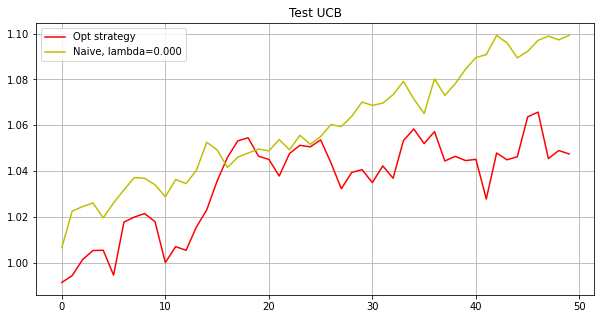

Phase 14
Testing...
./tmp2/snp500-24_phase14_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.0052 -0.     -0.      0.      0.0207  0.0322 -0.      0.025  -0.
 -0.      0.1009 -0.     -0.      0.      0.0583  0.     -0.      0.0186
  0.0499  0.0629  0.     -0.      0.      0.0357  0.      0.0087 -0.
  0.      0.      0.      0.      0.      0.     -0.      0.     -0.
  0.0363  0.      0.     -0.     -0.      0.0122  0.      0.0138 -0.
  0.      0.     -0.      0.0132 -0.     -0.     -0.      0.0161  0.
  0.0562  0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.     -0.     -0.      0.      0.      0.0649  0.      0.
  0.      0.      0.      0.     -0.     -0.     -0.      0.1245  0.0979
  0.0643 -0.     -0.     -0.      0.      0.     -0.      0.081   0.
 -0.     -0.      0.      0.     -0.      0.      0.0016  0.     -0.
  0.    ]
[ 0.0011 -0.      0.0217  

[ 0.0013 -0.     -0.      0.      0.0345  0.0238  0.     -0.     -0.
  0.      0.0389 -0.      0.      0.1622  0.      0.      0.0731  0.
  0.      0.0667 -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.      0.0073  0.     -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.      0.0359 -0.
 -0.     -0.      0.0069  0.0606  0.     -0.      0.     -0.      0.1516
  0.     -0.      0.      0.171   0.     -0.     -0.      0.      0.
 -0.      0.      0.      0.0186 -0.      0.1114  0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.      0.
  0.0362  0.      0.     -0.     -0.     -0.      0.     -0.      0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.     -0.
 -0.    ]
[ 0.0056 -0.      0.0426  0.      0.      0.034   0.0835  0.      0.
  0.0129  0.0421 -0.     -0.      0.      0.0648  0.      0.0651  0.0012
  0.     -0.      0.     -0.      0.      0.0185  0.      0.      0.07
  0.      0.11

[ 0.0022  0.      0.0167  0.      0.      0.0202 -0.      0.      0.
  0.0152  0.0285 -0.      0.      0.      0.0603  0.0798 -0.      0.
  0.0553  0.0454  0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.0617  0.      0.      0.      0.      0.      0.     -0.
 -0.      0.      0.      0.0813  0.0068  0.      0.      0.0216  0.
 -0.     -0.     -0.      0.      0.     -0.      0.      0.0403  0.
  0.0266  0.      0.      0.0078 -0.     -0.     -0.     -0.      0.
  0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.011  -0.      0.1597 -0.      0.      0.      0.0615  0.      0.
 -0.      0.1964 -0.      0.     -0.      0.      0.0017  0.      0.
  0.    ]
[ 0.0048 -0.      0.     -0.      0.0438  0.0347 -0.      0.     -0.
 -0.      0.0082 -0.     -0.      0.0832  0.0216  0.0134  0.0166  0.
  0.0963 -0.      0.0149 -0.     -0.      0.     -0.      0.0092 -0.
  0.0156  0.      0.    

[ 0.0006 -0.      0.0096  0.      0.0253  0.0163  0.      0.      0.
 -0.      0.034   0.     -0.      0.      0.0171  0.     -0.      0.
  0.2032 -0.      0.     -0.      0.      0.0467  0.      0.023   0.0113
  0.0072  0.      0.      0.      0.      0.     -0.      0.     -0.
  0.      0.      0.0299  0.1544 -0.      0.      0.      0.0082  0.
  0.     -0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.0067  0.     -0.      0.      0.0505 -0.     -0.
  0.019   0.     -0.     -0.      0.      0.0298 -0.      0.      0.
 -0.      0.      0.0468  0.      0.     -0.      0.0459  0.0572 -0.
  0.001  -0.      0.      0.114   0.     -0.     -0.      0.0333  0.
 -0.      0.0091 -0.     -0.     -0.      0.      0.      0.      0.
  0.    ]
[-0.     -0.      0.0533  0.      0.0064  0.0066  0.      0.     -0.
 -0.     -0.     -0.     -0.      0.      0.0246  0.      0.0847  0.
  0.144   0.0217 -0.      0.     -0.     -0.     -0.      0.0078 -0.
  0.      0.0115  0.

[ 0.0017 -0.      0.      0.      0.0108  0.0184 -0.     -0.     -0.
 -0.      0.0081  0.0314 -0.     -0.      0.0347  0.      0.0236  0.
  0.      0.0076  0.      0.      0.     -0.      0.      0.     -0.
  0.0111  0.      0.      0.      0.      0.0212  0.0203  0.     -0.
 -0.      0.     -0.      0.2313 -0.      0.      0.      0.0197  0.
 -0.      0.      0.      0.      0.      0.0427 -0.     -0.      0.
  0.017  -0.     -0.     -0.      0.      0.      0.     -0.      0.07
  0.0206  0.1095 -0.      0.1417  0.      0.022   0.     -0.      0.
  0.      0.      0.     -0.     -0.      0.0077  0.     -0.     -0.
  0.0099 -0.      0.1144 -0.      0.     -0.      0.      0.     -0.
  0.      0.     -0.     -0.     -0.      0.      0.0047  0.     -0.
  0.    ]
[ 0.0032 -0.     -0.      0.      0.      0.0217  0.     -0.      0.
  0.      0.0513  0.      0.     -0.      0.0358  0.      0.0194  0.
 -0.      0.0107  0.     -0.      0.     -0.      0.     -0.     -0.
  0.0223 -0.      0.  

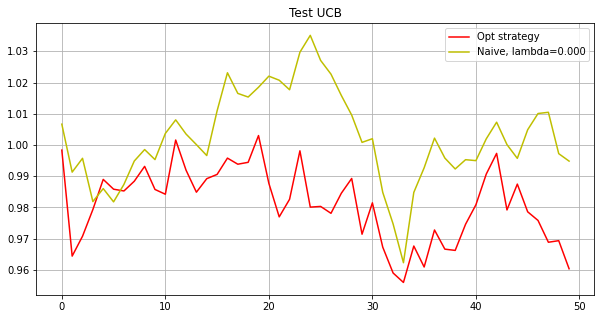

Phase 15
Testing...
./tmp2/snp500-24_phase15_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.     0.     0.     0.01   0.     0.     0.     0.     0.     0.
 0.0224 0.     0.     0.     0.     0.     0.     0.0172 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.0724 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.0986 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.0899 0.0848 0.     0.     0.1086 0.
 0.     0.     0.     0.     0.     0.     0.053  0.     0.     0.
 0.0308 0.     0.0352 0.     0.     0.     0.0533 0.0279 0.     0.
 0.     0.0003 0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.0947 0.     0.2005 0.     0.     0.     0.    ]
[ 0.      0.0718 -0.      0.     -0.      0.      0.      0.      0.
  0.      0.0598 -0.      0.     -0.      0.      0.     -0

[-0.      0.0603 -0.      0.0022 -0.      0.      0.0114  0.      0.
  0.0128  0.0326 -0.     -0.     -0.     -0.     -0.      0.      0.178
  0.      0.      0.     -0.     -0.     -0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.      0.      0.     -0.     -0.      0.     -0.      0.
 -0.      0.     -0.     -0.      0.      0.     -0.      0.     -0.
  0.2676  0.2072 -0.     -0.      0.0567  0.0785 -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.      0.     -0.      0.     -0.
 -0.      0.      0.     -0.      0.0603  0.     -0.     -0.      0.
 -0.     -0.     -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.     -0.      0.     -0.      0.0324  0.     -0.      0.
 -0.    ]
[-0.      0.066  -0.      0.0269  0.     -0.      0.      0.     -0.
  0.0232  0.0903 -0.      0.0132  0.0261 -0.      0.      0.     -0.
 -0.     -0.     -0.      0.0035 -0.      0.      0.      0.      0.
  0.      0.      0. 

[ 0.0612  0.0222 -0.      0.022   0.      0.      0.004   0.      0.
  0.0437  0.0436  0.      0.      0.0303  0.      0.      0.0217  0.
  0.      0.      0.      0.     -0.      0.      0.      0.0286  0.0344
  0.1069  0.0072  0.0037  0.      0.      0.      0.      0.      0.
  0.0233 -0.      0.      0.      0.      0.      0.      0.      0.
  0.0321  0.      0.      0.      0.     -0.      0.      0.     -0.
  0.1054 -0.     -0.      0.      0.0863  0.1269  0.      0.     -0.
  0.      0.     -0.      0.0102 -0.      0.      0.      0.     -0.
  0.      0.0078  0.      0.      0.      0.     -0.      0.      0.047
  0.      0.      0.      0.      0.     -0.      0.      0.      0.1314
  0.      0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.    ]
[-0.      0.0791  0.      0.0191  0.      0.      0.0032  0.      0.
  0.0332  0.0344  0.      0.      0.      0.      0.      0.008   0.
  0.      0.      0.      0.      0.      0.0236 -0.      0.0136 -0.
 -0.      0.2

[-0.      0.0428  0.      0.      0.      0.      0.001  -0.     -0.
  0.0293  0.095  -0.     -0.     -0.     -0.      0.      0.      0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
  0.      0.      0.0073  0.      0.      0.      0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0.     -0.     -0.     -0.      0.0298  0.      0.      0.      0.0185
  0.2014  0.     -0.      0.     -0.      0.0354  0.     -0.     -0.
 -0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
  0.      0.0119  0.      0.      0.0319 -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.      0.0205 -0.      0.1413
 -0.      0.0332 -0.      0.0076 -0.      0.293   0.      0.     -0.
  0.    ]
[-0.      0.066   0.      0.0047 -0.     -0.      0.0151 -0.      0.
  0.0893  0.0872  0.     -0.      0.0241 -0.      0.     -0.     -0.
  0.0153 -0.     -0.      0.     -0.      0.011   0.      0.008   0.0183
  0.      0.

[ 0.0995  0.0867  0.      0.068  -0.     -0.      0.0122 -0.      0.
  0.0469  0.0563  0.      0.0151  0.     -0.     -0.      0.      0.
 -0.     -0.     -0.      0.     -0.      0.079   0.      0.0212  0.0019
  0.     -0.      0.0499 -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.      0.      0.0084 -0.      0.      0.0051 -0.
  0.0227 -0.     -0.      0.0034  0.      0.0344 -0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.
  0.0169  0.0153  0.     -0.      0.3     0.     -0.     -0.     -0.
  0.     -0.      0.     -0.      0.     -0.      0.     -0.      0.0427
  0.     -0.      0.     -0.      0.      0.     -0.      0.0143 -0.
  0.    ]
Opt strategy   Total log return: 0.05168082    Max redraw: 0.02647358
Total return: 1.05303958
Mean return: 1.00103415
Naive lambda: 0.000   Total log return: 0.05791798
Total return: 1.05962808
Mean return: 1.00115903


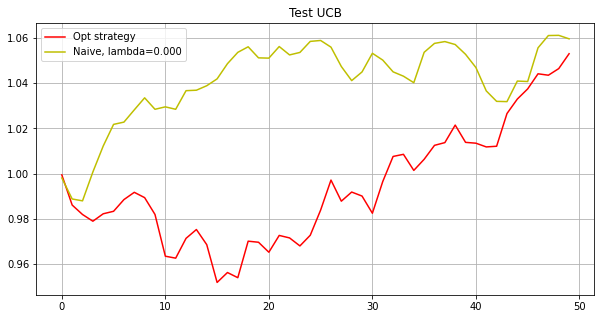

Phase 16
Testing...
./tmp2/snp500-24_phase16_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.      0.      0.      0.0065  0.      0.
  0.      0.0773  0.051   0.0027  0.      0.      0.      0.     -0.
  0.      0.0034  0.     -0.      0.      0.      0.     -0.     -0.
  0.0406 -0.      0.      0.      0.0146  0.      0.     -0.     -0.
  0.      0.     -0.     -0.      0.036   0.      0.     -0.      0.
  0.      0.     -0.     -0.      0.0324  0.0623  0.0021  0.0089 -0.
  0.      0.202   0.1353 -0.     -0.      0.     -0.      0.      0.0047
  0.1115 -0.      0.0753  0.      0.      0.      0.      0.      0.043
  0.      0.0904  0.     -0.      0.      0.     -0.     -0.      0.
  0.    ]
[ 0.0639  0.      0.      0

[ 0.0461  0.     -0.     -0.      0.01    0.0361  0.      0.0212 -0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.     -0.     -0.      0.     -0.      0.0055  0.      0.0101
  0.0404  0.0614  0.0672  0.      0.      0.     -0.      0.     -0.
  0.     -0.      0.     -0.      0.0064 -0.     -0.     -0.     -0.
 -0.      0.     -0.     -0.      0.0392  0.      0.     -0.     -0.
 -0.      0.     -0.      0.0872 -0.      0.0712 -0.     -0.      0.
 -0.     -0.      0.     -0.      0.      0.     -0.      0.2334  0.
 -0.      0.0853 -0.     -0.     -0.      0.      0.      0.     -0.
 -0.      0.      0.     -0.      0.      0.      0.0747 -0.      0.
  0.      0.1045  0.     -0.      0.      0.     -0.      0.     -0.
  0.    ]
[-0.      0.      0.      0.      0.      0.     -0.      0.0634  0.
 -0.     -0.      0.      0.      0.     -0.     -0.     -0.     -0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.
 -0.     -0.     -0.

[ 0.0759 -0.      0.      0.      0.0075 -0.     -0.      0.0004  0.
 -0.     -0.      0.      0.     -0.     -0.      0.0681 -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.0267 -0.     -0.     -0.      0.1531 -0.      0.      0.
  0.      0.     -0.      0.      0.      0.     -0.      0.     -0.
 -0.     -0.      0.      0.     -0.      0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.2367 -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.0914  0.     -0.     -0.     -0.      0.     -0.      0.     -0.
  0.2771  0.0631 -0.     -0.      0.     -0.     -0.     -0.      0.
 -0.    ]
[-0.      0.     -0.     -0.      0.0104  0.      0.      0.0134 -0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.0109  0.      0.0739
  0.     -0.      0.

[ 0.1133  0.     -0.     -0.      0.0114  0.     -0.      0.0132 -0.
  0.     -0.     -0.      0.      0.     -0.     -0.      0.     -0.
  0.     -0.      0.      0.      0.      0.0649  0.     -0.      0.
  0.1699 -0.      0.0187 -0.      0.      0.      0.      0.     -0.
 -0.      0.0253  0.     -0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.      0.0132  0.      0.     -0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.      0.
  0.      0.     -0.     -0.      0.      0.     -0.     -0.      0.
 -0.      0.1209 -0.     -0.     -0.      0.      0.      0.      0.
  0.1169  0.1703 -0.      0.     -0.     -0.      0.0347  0.      0.0021
  0.      0.011  -0.     -0.      0.     -0.     -0.      0.      0.
  0.1142]
[0.     0.     0.     0.     0.0288 0.     0.     0.0262 0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.0429 0.     0.
 0.     0.     0.     0.     0.     0.     0.026  0.0813 0.1377 0.064
 0.     0.     0.     0

[-0.      0.     -0.     -0.      0.005   0.      0.      0.0039 -0.
  0.      0.     -0.      0.0163  0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
  0.0917 -0.      0.0636  0.      0.      0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.0968  0.      0.      0.
 -0.     -0.      0.      0.      0.0267  0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.      0.1998  0.
  0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.0178
 -0.      0.     -0.      0.      0.      0.      0.      0.      0.0136
  0.      0.      0.      0.1646  0.      0.3    -0.      0.      0.
  0.    ]
[ 0.      0.     -0.     -0.      0.0197  0.      0.     -0.     -0.
  0.      0.     -0.      0.0164  0.     -0.     -0.      0.      0.
  0.     -0.      0.      0.      0.      0.0141  0.0366  0.      0.0057
  0.1111  0.

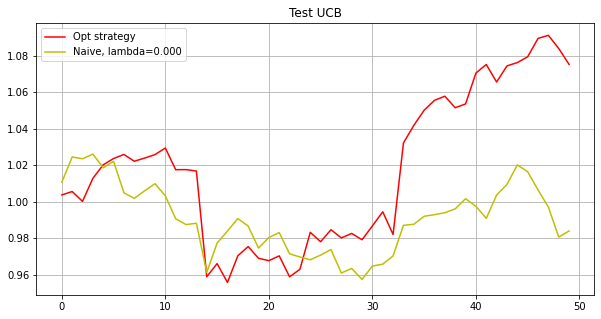

Phase 17
Testing...
./tmp2/snp500-24_phase17_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.      0.      0.      0.     -0.     -0.     -0.      0.      0.0281
  0.0371 -0.      0.     -0.      0.      0.      0.      0.      0.0619
  0.     -0.     -0.     -0.     -0.      0.0387  0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.      0.1357 -0.      0.0007 -0.      0.0401  0.      0.      0.
 -0.      0.      0.0474 -0.     -0.     -0.      0.0385  0.      0.
 -0.      0.     -0.      0.0445 -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0425  0.1428 -0.     -0.     -0.
  0.0489  0.     -0.      0.      0.0836  0.1628 -0.     -0.     -0.
  0.     -0.     -0.     -0.     -0.     -0.     -0.      0.      0.0467
  0.    ]
[ 0.      0.0104 -0.  

[-0.      0.     -0.     -0.      0.1137 -0.     -0.      0.      0.
  0.      0.      0.0071 -0.      0.      0.      0.      0.0603  0.0377
  0.0242  0.      0.      0.      0.      0.1278 -0.      0.      0.0846
  0.0503 -0.      0.2678  0.      0.      0.      0.     -0.      0.
  0.     -0.     -0.     -0.     -0.      0.      0.1636  0.      0.0361
 -0.      0.0266  0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.      0.
 -0.     -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.      0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.      0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.
  0.    ]
[ 0.      0.0323 -0.      0.      0.      0.     -0.      0.      0.
 -0.     -0.      0.     -0.     -0.      0.0689 -0.      0.     -0.
  0.      0.0749  0.     -0.      0.      0.0304  0.      0.      0.
  0.     -0.

[ 0.      0.     -0.     -0.      0.0293  0.      0.      0.     -0.
 -0.     -0.     -0.      0.      0.0383  0.0327 -0.      0.      0.0626
  0.0073  0.0016  0.     -0.      0.      0.     -0.      0.      0.045
  0.0162 -0.      0.0376  0.      0.      0.1108  0.      0.     -0.
 -0.      0.      0.     -0.      0.1224 -0.      0.      0.      0.0444
  0.     -0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.     -0.      0.     -0.     -0.      0.0157  0.      0.      0.
  0.      0.      0.      0.0019  0.     -0.     -0.      0.0173  0.
 -0.     -0.      0.      0.      0.009   0.1328 -0.     -0.     -0.
  0.1497  0.      0.      0.      0.0926  0.011   0.0217  0.     -0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
 -0.    ]
[-0.      0.      0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.      0.0175 -0.     -0.      0.
 -0.      0.0382  0.      0.      0.     -0.     -0.     -0.     -0.
 -0.     -0. 

[ 0.      0.033  -0.      0.      0.     -0.     -0.      0.      0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.      0.      0.0073
  0.     -0.     -0.     -0.      0.      0.     -0.      0.      0.
  0.0011 -0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.      0.      0.1196  0.1304  0.      0.     -0.      0.
 -0.      0.     -0.      0.0032 -0.      0.      0.      0.      0.
 -0.     -0.      0.0324 -0.     -0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.0531  0.1815  0.      0.      0.      0.
  0.     -0.      0.      0.0306  0.0609  0.1084 -0.      0.0223 -0.
 -0.     -0.      0.      0.0728  0.      0.049  -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.0944 -0.
  0.    ]
[-0.      0.     -0.      0.      0.0493 -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.      0.      0.0547  0.      0.0355 -0.
 -0.     -0.      0.      0.      0.      0.0938 -0.     -0.     -0.
 -0.     -0.     -0.

[ 0.      0.0129 -0.      0.     -0.     -0.     -0.     -0.      0.
  0.      0.      0.     -0.      0.      0.0332 -0.      0.0291 -0.
 -0.     -0.      0.     -0.      0.      0.2096 -0.      0.      0.
  0.     -0.     -0.      0.      0.      0.0226 -0.      0.      0.
  0.      0.      0.     -0.      0.1483  0.      0.     -0.     -0.
 -0.      0.      0.      0.0439 -0.      0.0188  0.      0.      0.
  0.     -0.      0.0913 -0.     -0.     -0.      0.      0.      0.
  0.      0.     -0.     -0.      0.2428 -0.      0.     -0.     -0.
 -0.     -0.      0.     -0.      0.0109  0.0397 -0.      0.     -0.
  0.0081 -0.     -0.     -0.      0.     -0.      0.0095  0.      0.
  0.     -0.     -0.      0.      0.     -0.     -0.     -0.      0.0792
  0.    ]
[-0.      0.0504 -0.      0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0003 -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.     -0.     -0.      0.      0.
  0.     -0.      0.

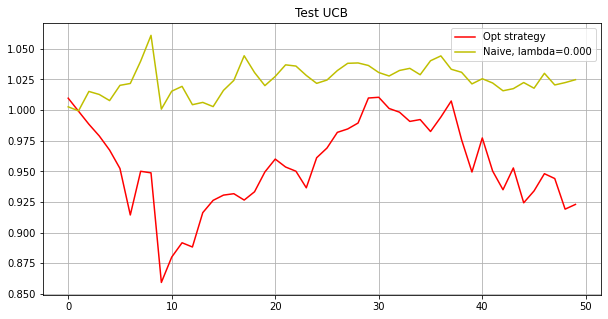

Phase 18
Testing...
./tmp2/snp500-24_phase18_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.      0.
  0.      0.0635 -0.      0.     -0.      0.     -0.      0.     -0.
  0.1147 -0.     -0.      0.      0.0771  0.      0.     -0.      0.
 -0.      0.     -0.      0.0361  0.0196  0.      0.      0.     -0.
  0.1046  0.     -0.     -0.      0.0516  0.      0.0446  0.     -0.
 -0.      0.     -0.     -0.     -0.      0.117   0.      0.     -0.
 -0.      0.      0.     -0.      0.      0.     -0.      0.      0.0824
  0.      0.      0.      0.      0.     -0.      0.     -0.     -0.
 -0.      0.2069 -0.     -0.      0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.0814  0.0004  0.     -0.     -0.     -0.
 -0.    ]
[-0.      0.003   0.      0.  

[-0.      0.      0.     -0.      0.     -0.      0.      0.0643 -0.
 -0.      0.     -0.     -0.      0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0298 -0.     -0.     -0.
  0.1276 -0.     -0.     -0.     -0.     -0.      0.1137 -0.     -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.      0.0035 -0.     -0.      0.      0.1874
 -0.     -0.     -0.      0.     -0.      0.01    0.0162  0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.      0.0511  0.      0.181
  0.      0.      0.      0.013   0.      0.      0.     -0.     -0.
  0.      0.0064 -0.      0.      0.1367 -0.     -0.      0.     -0.
 -0.      0.0591 -0.      0.      0.      0.     -0.      0.     -0.
 -0.    ]
[-0.      0.      0.     -0.      0.      0.     -0.      0.0794 -0.
  0.      0.     -0.     -0.     -0.      0.      0.     -0.     -0.
  0.     -0.     -0.      0.0477 -0.      0.0478  0.      0.     -0.
 -0.     -0.     

[ 0.      0.      0.     -0.     -0.      0.      0.0042 -0.      0.005
 -0.      0.      0.0061 -0.      0.      0.     -0.      0.     -0.
  0.      0.0497 -0.     -0.     -0.      0.0494  0.     -0.      0.
  0.0022 -0.      0.0574 -0.      0.0467 -0.     -0.      0.0653  0.071
 -0.      0.     -0.     -0.      0.0292  0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.0105  0.0682  0.0595 -0.      0.
  0.      0.0167  0.      0.     -0.     -0.      0.0006 -0.     -0.
  0.      0.     -0.      0.      0.0541  0.     -0.      0.0032  0.
 -0.      0.0154  0.     -0.     -0.     -0.      0.      0.     -0.
 -0.     -0.     -0.     -0.      0.1914 -0.     -0.     -0.     -0.
 -0.     -0.     -0.      0.      0.      0.      0.1941  0.     -0.
  0.    ]
[ 0.      0.     -0.     -0.     -0.      0.     -0.     -0.      0.
  0.      0.      0.003  -0.     -0.     -0.      0.     -0.     -0.
  0.      0.      0.      0.0238 -0.     -0.      0.      0.     -0.
  0.0713  0.0257  

[ 0.      0.      0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.     -0.      0.      0.     -0.      0.     -0.
  0.      0.0442 -0.      0.014  -0.      0.     -0.      0.      0.
  0.0999 -0.     -0.     -0.     -0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.     -0.
  0.1118  0.0771 -0.      0.     -0.     -0.      0.0445  0.     -0.
  0.     -0.      0.      0.     -0.      0.      0.      0.      0.
 -0.     -0.      0.0315  0.0777  0.1037 -0.      0.      0.      0.0349
 -0.     -0.     -0.      0.      0.      0.      0.      0.     -0.
  0.      0.0502  0.     -0.     -0.      0.     -0.      0.2123 -0.
  0.      0.     -0.      0.      0.      0.041   0.      0.0572 -0.
  0.    ]
[ 0.      0.0002  0.      0.      0.      0.      0.0036 -0.      0.016
 -0.      0.      0.      0.      0.      0.     -0.      0.      0.
 -0.     -0.      0.     -0.     -0.      0.0566  0.     -0.      0.0389
  0.0564 -0. 

[-0.      0.0018 -0.     -0.     -0.     -0.      0.0014 -0.      0.019
 -0.      0.      0.0028  0.     -0.     -0.      0.     -0.     -0.
  0.      0.      0.     -0.     -0.      0.0599 -0.      0.     -0.
 -0.      0.0202 -0.      0.      0.0473  0.      0.0403 -0.      0.
 -0.      0.      0.0752  0.0039  0.0619 -0.     -0.     -0.     -0.
 -0.     -0.      0.     -0.      0.     -0.     -0.      0.     -0.
 -0.      0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0594
 -0.     -0.     -0.     -0.      0.0462 -0.     -0.     -0.      0.1196
 -0.     -0.     -0.      0.     -0.      0.      0.     -0.     -0.
 -0.      0.2268  0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.2144 -0.     -0.     -0.      0.     -0.     -0.      0.
 -0.    ]
[-0.      0.      0.     -0.      0.      0.      0.     -0.      0.0235
  0.      0.      0.     -0.      0.      0.     -0.      0.      0.
  0.      0.1373  0.0175  0.0134 -0.      0.0731 -0.     -0.     -0.
 -0.     

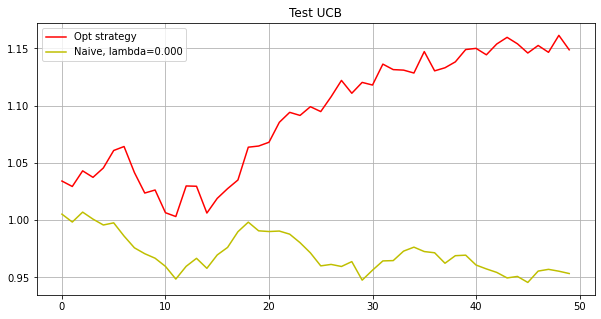

Phase 19
Testing...
./tmp2/snp500-24_phase19_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.0713 -0.      0.     -0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.0133 -0.      0.      0.     -0.     -0.     -0.
  0.0012  0.      0.      0.1294  0.     -0.     -0.     -0.     -0.
 -0.      0.     -0.      0.     -0.     -0.      0.      0.052   0.
  0.      0.      0.     -0.     -0.     -0.     -0.      0.0222 -0.
 -0.      0.     -0.      0.      0.     -0.      0.      0.     -0.
  0.     -0.     -0.      0.     -0.      0.0213  0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.0591  0.1086  0.      0.0366
  0.123  -0.      0.1485  0.     -0.     -0.     -0.     -0.     -0.
  0.      0.2136  0.      0.     -0.      0.     -0.     -0.      0.
  0.    ]
[ 0.     -0.     -0.     -0.  

[ 0.      0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
  0.1025 -0.      0.     -0.     -0.      0.0099  0.      0.      0.
 -0.     -0.      0.0011  0.      0.0307  0.     -0.      0.0693 -0.
  0.      0.      0.05    0.0783  0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.     -0.      0.0643
 -0.      0.0531 -0.     -0.      0.      0.      0.2198  0.      0.0104
  0.     -0.      0.     -0.     -0.      0.      0.0287  0.     -0.
 -0.     -0.      0.     -0.      0.      0.      0.      0.0101  0.
  0.      0.      0.      0.      0.      0.0486  0.     -0.     -0.
  0.0135  0.      0.     -0.      0.      0.      0.      0.1697 -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.0401 -0.
  0.    ]
[ 0.      0.      0.      0.      0.      0.      0.     -0.     -0.
  0.0482  0.      0.0308 -0.      0.1459 -0.      0.     -0.     -0.
 -0.     -0.      0.      0.     -0.     -0.     -0.      0.0269 -0.
  0.     -0.    

[ 0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
  0.073  -0.      0.      0.      0.     -0.     -0.      0.      0.
 -0.     -0.      0.0842 -0.     -0.     -0.      0.     -0.      0.
 -0.      0.      0.0316  0.0511  0.     -0.      0.     -0.      0.
  0.      0.0174 -0.     -0.      0.      0.      0.      0.0421  0.1522
  0.     -0.      0.     -0.     -0.      0.      0.1339  0.      0.
  0.     -0.      0.0366  0.      0.0383  0.     -0.      0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.      0.      0.
 -0.      0.     -0.      0.     -0.     -0.      0.0017 -0.      0.
  0.1709  0.1669  0.      0.     -0.     -0.     -0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
  0.    ]
[ 0.0114  0.     -0.     -0.      0.     -0.     -0.      0.0009 -0.
  0.0929 -0.      0.     -0.     -0.     -0.     -0.      0.     -0.
  0.      0.019   0.094   0.     -0.     -0.     -0.     -0.      0.
 -0.      0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.      0.     -0.      0.
  0.0417 -0.      0.     -0.      0.      0.     -0.      0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.0669  0.0134
  0.      0.      0.     -0.     -0.      0.0078 -0.     -0.      0.0842
 -0.      0.     -0.      0.0287  0.0121 -0.      0.0524  0.126   0.
 -0.     -0.      0.      0.1346  0.     -0.      0.      0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
  0.0189  0.1717  0.      0.      0.     -0.     -0.      0.074  -0.
 -0.      0.1675 -0.     -0.     -0.     -0.     -0.     -0.      0.
  0.    ]
[ 0.      0.      0.      0.      0.     -0.     -0.     -0.     -0.
  0.     -0.      0.0078 -0.      0.     -0.     -0.     -0.     -0.
  0.     -0.      0.     -0.     -0.     -0.      0.      0.019   0.
 -0.      0.    

[ 0.      0.      0.     -0.      0.     -0.     -0.      0.009  -0.
  0.      0.      0.0501 -0.      0.     -0.     -0.     -0.      0.
  0.     -0.      0.0341  0.      0.027  -0.     -0.      0.0224  0.0242
  0.      0.     -0.      0.1171 -0.      0.      0.     -0.      0.
 -0.      0.0843  0.0119 -0.      0.      0.     -0.      0.0871  0.
 -0.     -0.      0.     -0.     -0.      0.      0.1183  0.      0.
  0.      0.      0.1453  0.      0.      0.      0.     -0.      0.
 -0.      0.      0.02   -0.      0.      0.     -0.      0.      0.0433
  0.      0.      0.      0.     -0.     -0.     -0.     -0.     -0.
  0.0376  0.     -0.      0.      0.      0.      0.      0.088  -0.
 -0.      0.0805 -0.     -0.      0.      0.      0.      0.      0.
  0.    ]
[ 0.0001  0.     -0.      0.      0.      0.     -0.      0.0134  0.
  0.      0.      0.     -0.      0.      0.      0.      0.      0.
 -0.     -0.      0.1049  0.      0.      0.     -0.      0.0265 -0.
  0.     -0.    

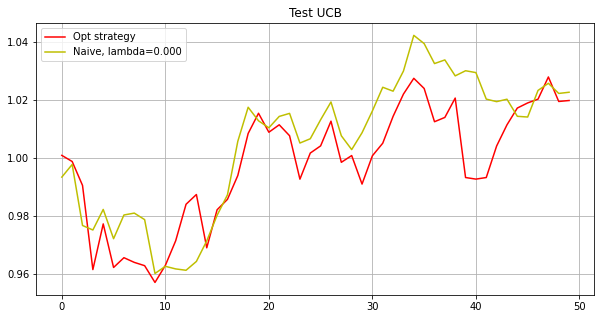

Phase 20
Testing...
./tmp2/snp500-24_phase20_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[0.0016 0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.0772 0.     0.     0.
 0.     0.     0.     0.0255 0.0295 0.     0.     0.     0.     0.0398
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
 0.1037 0.1054 0.     0.     0.     0.     0.     0.     0.0038 0.
 0.     0.     0.     0.1087 0.     0.     0.     0.1164 0.     0.
 0.     0.     0.     0.     0.     0.0091 0.261  0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.0204
 0.     0.     0.     0.     0.     0.     0.097  0.     0.     0.0007]
[ 0.0054 -0.      0.      0.      0.      0.      0.     -0.     -0.
 -0.      0.0184  0.      0.     -0.     -0.     -0

[ 0.005  -0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.08   -0.     -0.      0.045   0.      0.
  0.     -0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.0002  0.      0.     -0.      0.0133  0.      0.0343  0.0468  0.
 -0.      0.      0.      0.     -0.     -0.      0.1423  0.     -0.
 -0.      0.     -0.      0.      0.0581 -0.     -0.     -0.     -0.
  0.1205 -0.      0.     -0.      0.1809  0.      0.     -0.     -0.
  0.     -0.      0.     -0.      0.2734 -0.     -0.     -0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.    ]
[ 0.0063 -0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
  0.0136 -0.     -0.      0.     -0.     -0.     -0.      0.      0.
 -0.     -0.      0.    

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.0199 -0.      0.      0.      0.0501 -0.      0.      0.
  0.     -0.      0.      0.0275  0.     -0.     -0.      0.      0.077
  0.      0.      0.      0.     -0.      0.      0.1321  0.     -0.
  0.      0.     -0.      0.0152  0.      0.      0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.      0.      0.     -0.      0.     -0.     -0.
  0.0181 -0.     -0.     -0.      0.0875  0.      0.      0.      0.
  0.0841  0.      0.     -0.      0.      0.      0.      0.      0.
 -0.      0.      0.     -0.      0.      0.     -0.      0.047   0.0965
  0.      0.      0.3     0.      0.      0.045  -0.      0.     -0.
 -0.    ]
[ 0.0107  0.      0.      0.     -0.      0.      0.     -0.      0.
 -0.      0.      0.      0.     -0.     -0.     -0.     -0.      0.
  0.     -0.     -0.      0.     -0.      0.0198 -0.     -0.      0.
  0.      0.     

[ 0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
  0.      0.0125 -0.     -0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.0041 -0.     -0.      0.     -0.      0.1237
  0.      0.     -0.      0.     -0.      0.     -0.     -0.     -0.
  0.0574 -0.     -0.     -0.     -0.      0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.0381  0.0051 -0.     -0.
 -0.      0.     -0.     -0.      0.0342 -0.     -0.      0.     -0.
  0.     -0.      0.     -0.      0.0633  0.     -0.      0.     -0.
  0.207  -0.     -0.      0.      0.2578 -0.      0.     -0.     -0.
 -0.     -0.     -0.      0.0659  0.     -0.     -0.     -0.      0.0866
 -0.      0.     -0.      0.     -0.      0.      0.0442  0.     -0.
  0.    ]
[-0.     -0.      0.      0.      0.      0.      0.     -0.      0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.     -0.
 -0.     -0.     -0.      0.1441  0.     -0.     -0.     -0.     -0.
  0.     -0.    

[ 0.      0.      0.      0.      0.      0.      0.      0.      0.
 -0.      0.      0.      0.      0.     -0.     -0.     -0.      0.
  0.      0.      0.      0.     -0.      0.      0.0968  0.     -0.
  0.      0.0239  0.      0.      0.0277  0.      0.001   0.0887  0.0352
  0.0571  0.      0.      0.      0.     -0.      0.     -0.      0.
  0.      0.      0.1214 -0.      0.      0.      0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.     -0.     -0.
  0.1337  0.      0.0044  0.     -0.      0.      0.      0.0003  0.
  0.1098  0.      0.     -0.      0.3     0.      0.      0.      0.
 -0.      0.      0.     -0.     -0.      0.      0.     -0.     -0.
  0.      0.     -0.      0.      0.      0.      0.      0.     -0.
 -0.    ]
[ 0.0083 -0.      0.     -0.     -0.      0.     -0.      0.      0.
  0.      0.013   0.     -0.      0.      0.      0.      0.     -0.
 -0.     -0.      0.      0.1025  0.     -0.      0.     -0.     -0.
  0.      0.      0.

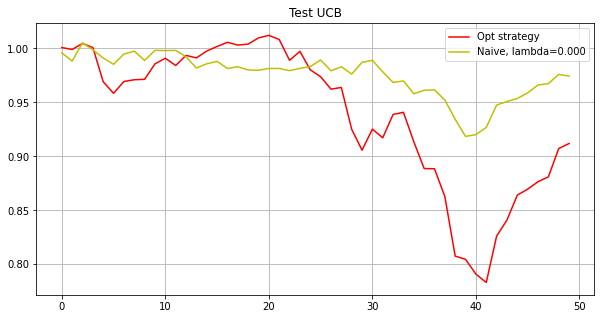

Phase 21
Testing...
./tmp2/snp500-24_phase21_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.      0.     -0.     -0.     -0.     -0.      0.     -0.      0.
 -0.     -0.      0.059   0.     -0.      0.      0.      0.     -0.
  0.     -0.      0.019   0.     -0.      0.     -0.      0.     -0.
 -0.      0.      0.      0.      0.      0.      0.1018  0.      0.
 -0.      0.     -0.     -0.      0.086   0.      0.0916  0.      0.
  0.     -0.      0.1326 -0.      0.007   0.     -0.     -0.      0.005
 -0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.     -0.      0.1792  0.      0.      0.      0.0411  0.      0.
  0.      0.0119  0.0186  0.      0.      0.      0.      0.     -0.
  0.     -0.     -0.     -0.      0.      0.      0.      0.      0.1169
  0.     -0.      0.      0.      0.      0.      0.1304  0.      0.
  0.    ]
[ 0.     -0.     -0.     -0

[-0.      0.      0.     -0.      0.     -0.      0.      0.      0.0448
 -0.     -0.      0.      0.      0.      0.      0.      0.      0.0977
  0.      0.      0.     -0.      0.      0.0223 -0.      0.     -0.
 -0.      0.      0.      0.      0.     -0.      0.     -0.      0.
 -0.      0.      0.      0.      0.0317 -0.      0.      0.      0.
  0.      0.      0.     -0.      0.      0.     -0.     -0.      0.
 -0.      0.      0.      0.     -0.      0.     -0.     -0.      0.
  0.     -0.      0.3     0.     -0.      0.     -0.      0.      0.0335
  0.      0.      0.1832  0.      0.      0.      0.      0.      0.
  0.      0.      0.1883  0.      0.      0.      0.     -0.      0.
  0.     -0.      0.0139  0.0844  0.      0.      0.      0.      0.
 -0.    ]
[ 0.      0.     -0.      0.     -0.     -0.     -0.     -0.     -0.
 -0.      0.      0.0189  0.      0.0253 -0.     -0.     -0.     -0.
  0.     -0.      0.0035  0.     -0.     -0.     -0.      0.05    0.
  0.      0.

[-0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.011
 -0.     -0.     -0.     -0.      0.0001 -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.0075 -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.      0.0992 -0.     -0.     -0.      0.1232
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.      0.0265 -0.
 -0.     -0.      0.3    -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.     -0.
 -0.     -0.      0.1307 -0.     -0.      0.1164 -0.     -0.     -0.
 -0.     -0.      0.0445 -0.     -0.      0.0826 -0.     -0.     -0.
  0.0591]
[-0.      0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.0169  0.067  -0.     -0.      0.     -0.      0.      0.
  0.     -0.     -0.      0.     -0.      0.0384  0.     -0.     -0.
 -0.      0.     

[-0.     -0.     -0.     -0.     -0.     -0.      0.      0.      0.0166
 -0.     -0.      0.      0.      0.      0.     -0.      0.      0.0437
 -0.      0.      0.     -0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.      0.0137 -0.     -0.      0.     -0.     -0.
 -0.      0.      0.      0.     -0.     -0.      0.1414  0.      0.0381
 -0.      0.      0.1324 -0.      0.     -0.     -0.     -0.      0.
  0.      0.0181  0.     -0.      0.      0.     -0.      0.1134 -0.
  0.     -0.     -0.      0.0165  0.      0.     -0.     -0.      0.0384
  0.      0.0885  0.      0.     -0.      0.      0.      0.1165  0.
 -0.      0.      0.1061 -0.      0.      0.     -0.      0.     -0.
 -0.     -0.      0.1166 -0.     -0.      0.     -0.     -0.      0.
  0.    ]
[ 0.     -0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.     -0.      0.0224 -0.      0.     -0.      0.      0.0353  0.
  0.      0.      0.     -0.     -0.      0.0791 -0.      0.     -0.
  0.    

[-0.      0.      0.     -0.      0.     -0.      0.      0.      0.0559
  0.      0.     -0.      0.      0.0167  0.      0.     -0.      0.1533
 -0.     -0.      0.0148  0.     -0.      0.0317  0.      0.     -0.
  0.     -0.      0.0091 -0.      0.      0.     -0.      0.      0.
  0.0744 -0.      0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.      0.0799  0.     -0.      0.     -0.     -0.     -0.
 -0.     -0.      0.0062 -0.     -0.      0.      0.0649  0.1287  0.1093
 -0.      0.      0.     -0.      0.     -0.     -0.      0.      0.
  0.      0.      0.      0.      0.      0.      0.     -0.     -0.
  0.      0.      0.0359  0.0993  0.      0.      0.     -0.      0.0736
  0.     -0.     -0.     -0.      0.      0.0464  0.      0.     -0.
  0.    ]
[ 0.0011  0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.0703  0.      0.0272 -0.      0.      0.0208 -0.
 -0.      0.      0.0406  0.     -0.     -0.     -0.     -0.      0.0092
  0.

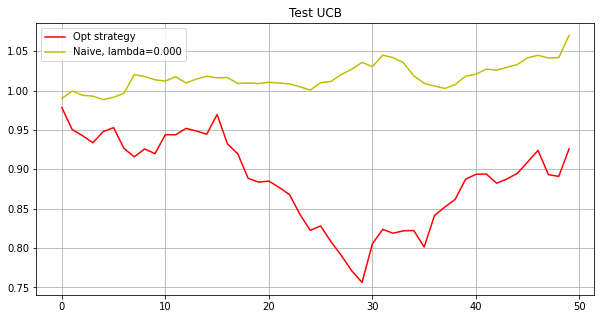

Phase 22
Testing...
./tmp2/snp500-24_phase22_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[-0.      0.     -0.      0.     -0.     -0.      0.     -0.     -0.
 -0.     -0.     -0.     -0.     -0.      0.      0.      0.     -0.
 -0.     -0.     -0.      0.      0.      0.      0.     -0.      0.
  0.     -0.     -0.      0.1539  0.0783  0.     -0.     -0.      0.
  0.     -0.     -0.      0.      0.1425 -0.     -0.      0.      0.2388
 -0.     -0.      0.     -0.      0.     -0.      0.     -0.      0.
  0.      0.     -0.      0.     -0.     -0.     -0.     -0.      0.
  0.0293 -0.      0.0811 -0.     -0.     -0.      0.0731  0.1748 -0.
 -0.     -0.     -0.      0.      0.     -0.      0.      0.      0.
  0.     -0.      0.     -0.      0.     -0.      0.0281 -0.     -0.
 -0.      0.     -0.     -0.      0.     -0.     -0.      0.     -0.
 -0.    ]
[ 0.      0.     -0.     -0.  

[-0.     -0.     -0.     -0.     -0.     -0.      0.      0.     -0.
 -0.      0.      0.     -0.     -0.     -0.      0.      0.0048  0.
  0.0248 -0.      0.0591 -0.     -0.     -0.      0.0123 -0.      0.
  0.0343  0.      0.      0.1183  0.      0.      0.      0.     -0.
 -0.     -0.     -0.      0.      0.      0.0816  0.     -0.      0.0486
  0.     -0.      0.      0.     -0.      0.     -0.      0.      0.
 -0.      0.      0.0383 -0.     -0.      0.      0.      0.1381 -0.
  0.1119 -0.      0.      0.      0.     -0.      0.      0.     -0.
 -0.      0.      0.      0.1809 -0.      0.      0.      0.     -0.
  0.      0.      0.1181  0.      0.     -0.      0.     -0.     -0.
  0.     -0.      0.0289  0.     -0.      0.      0.     -0.     -0.
 -0.    ]
[-0.      0.     -0.     -0.      0.     -0.      0.      0.      0.
 -0.      0.      0.0275 -0.      0.0192 -0.      0.      0.      0.0517
 -0.     -0.      0.      0.      0.      0.      0.0931 -0.      0.
  0.0388  0.    

[ 0.     -0.      0.      0.     -0.      0.      0.      0.0463  0.
  0.      0.      0.      0.     -0.      0.     -0.      0.0177  0.0045
 -0.     -0.      0.      0.      0.      0.      0.      0.      0.
  0.0864  0.     -0.      0.      0.      0.     -0.      0.      0.
  0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
 -0.      0.     -0.      0.      0.      0.      0.0157  0.      0.
  0.     -0.     -0.      0.      0.      0.0176 -0.      0.1778  0.0165
  0.      0.1421  0.0386  0.     -0.      0.      0.     -0.     -0.
  0.0936  0.      0.      0.      0.      0.      0.      0.     -0.
 -0.      0.      0.1562  0.      0.1145 -0.      0.      0.      0.
 -0.     -0.      0.0475  0.     -0.      0.     -0.     -0.      0.0248
  0.    ]
[-0.      0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.0559 -0.      0.0026 -0.     -0.      0.0187 -0.
  0.0436  0.     -0.     -0.     -0.     -0.      0.0506  0.     -0.
  0.0776 -0.

[ 0.      0.     -0.     -0.      0.     -0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.      0.0295 -0.
 -0.      0.     -0.      0.      0.      0.      0.0061 -0.      0.
  0.     -0.      0.1348 -0.      0.      0.      0.     -0.     -0.
 -0.     -0.      0.      0.      0.      0.     -0.     -0.      0.0264
 -0.      0.     -0.      0.     -0.      0.     -0.      0.      0.
 -0.     -0.      0.1142 -0.      0.      0.0272 -0.      0.1722  0.0041
 -0.      0.      0.0597 -0.     -0.     -0.      0.     -0.      0.
  0.0223 -0.      0.      0.1654  0.095   0.     -0.      0.      0.
  0.      0.      0.0356 -0.      0.0365  0.0371  0.     -0.      0.
 -0.      0.      0.034   0.      0.      0.      0.     -0.     -0.
  0.    ]
[-0.      0.     -0.     -0.     -0.     -0.     -0.      0.0903 -0.
 -0.     -0.     -0.     -0.      0.     -0.     -0.      0.0447  0.073
  0.0048  0.     -0.     -0.     -0.     -0.      0.0344 -0.     -0.
  0.037  -0. 

[-0.      0.     -0.     -0.     -0.     -0.      0.      0.0695 -0.
 -0.      0.      0.0171 -0.      0.0181  0.0052 -0.      0.0277  0.
 -0.      0.     -0.      0.     -0.      0.0222  0.015   0.0173 -0.
  0.      0.     -0.      0.      0.      0.     -0.     -0.      0.
  0.      0.     -0.      0.     -0.      0.     -0.     -0.      0.
 -0.      0.0712  0.     -0.     -0.     -0.      0.     -0.     -0.
 -0.      0.     -0.      0.0636 -0.      0.1465  0.      0.0934  0.057
  0.      0.      0.     -0.     -0.      0.      0.      0.      0.
 -0.      0.      0.      0.1409  0.      0.     -0.     -0.      0.
  0.     -0.      0.     -0.      0.1352  0.0436  0.     -0.     -0.
 -0.     -0.      0.0385 -0.     -0.     -0.      0.     -0.      0.0179
  0.    ]
[-0.      0.      0.     -0.      0.     -0.      0.      0.0406  0.
  0.     -0.      0.     -0.      0.      0.      0.      0.0169 -0.
  0.     -0.      0.1613  0.      0.      0.      0.0008 -0.      0.
 -0.     -0.     

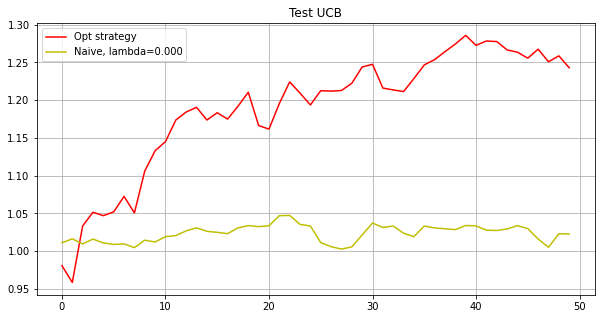

Phase 23
Testing...
./tmp2/snp500-24_phase23_iter2000_subn100_lb5_M10_matcnt30_invTrue_ggdTrue.npz
------------------------------------------------------------------------------------
Opt strategy
[ 0.      0.      0.      0.     -0.     -0.      0.0844 -0.     -0.
  0.0388 -0.      0.      0.0427 -0.      0.     -0.      0.     -0.
  0.0284 -0.      0.      0.      0.     -0.      0.      0.      0.
 -0.      0.      0.0175  0.      0.0946  0.      0.     -0.      0.
  0.0237  0.      0.      0.      0.      0.      0.      0.      0.
  0.     -0.      0.01   -0.     -0.      0.      0.     -0.      0.
  0.      0.      0.1278 -0.     -0.      0.1365  0.0239 -0.      0.0968
 -0.      0.     -0.      0.      0.      0.      0.      0.     -0.
 -0.      0.      0.      0.      0.      0.      0.      0.     -0.
  0.      0.      0.      0.      0.      0.     -0.      0.021   0.
  0.     -0.      0.      0.      0.2353  0.0186  0.      0.      0.
  0.    ]
[-0.      0.0134  0.     -0.  

[ 0.      0.001  -0.      0.0027  0.     -0.     -0.      0.     -0.
 -0.     -0.      0.     -0.     -0.     -0.     -0.      0.      0.
  0.0153 -0.      0.     -0.      0.0014 -0.     -0.     -0.     -0.
  0.0252  0.     -0.     -0.      0.     -0.      0.0407  0.0145 -0.
  0.     -0.      0.0398  0.0776  0.      0.     -0.     -0.     -0.
  0.      0.      0.0113 -0.      0.     -0.      0.0268  0.     -0.
  0.0376  0.      0.0538 -0.     -0.      0.      0.118  -0.     -0.
  0.     -0.      0.0633  0.0163  0.     -0.      0.     -0.      0.
  0.0255 -0.      0.      0.      0.0037 -0.     -0.      0.      0.
 -0.     -0.      0.      0.0062  0.     -0.     -0.      0.0801  0.0552
  0.     -0.     -0.     -0.      0.      0.2843  0.      0.     -0.
  0.    ]
[ 0.     -0.      0.     -0.     -0.     -0.      0.1026 -0.      0.
  0.0442 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
  0.0147 -0.     -0.     -0.      0.     -0.      0.     -0.     -0.
 -0.      0.     -0.

[ 0.      0.0314  0.      0.      0.     -0.      0.      0.      0.
  0.     -0.     -0.      0.0358 -0.      0.     -0.      0.      0.
  0.0856  0.      0.      0.      0.      0.0058 -0.      0.     -0.
 -0.      0.      0.0989  0.0871  0.      0.      0.      0.     -0.
 -0.      0.      0.      0.0879  0.     -0.      0.     -0.      0.
  0.      0.      0.      0.      0.      0.      0.0092 -0.     -0.
  0.      0.0192  0.     -0.     -0.      0.0491 -0.      0.      0.
  0.      0.      0.      0.      0.0407  0.0313  0.0492  0.     -0.
  0.      0.     -0.      0.      0.     -0.     -0.      0.      0.2179
 -0.      0.     -0.     -0.     -0.      0.0207 -0.      0.1302  0.
  0.     -0.     -0.     -0.     -0.      0.      0.      0.      0.
 -0.    ]
[-0.      0.     -0.      0.0014 -0.     -0.      0.1099 -0.      0.
 -0.     -0.      0.     -0.     -0.     -0.      0.     -0.      0.
 -0.      0.      0.     -0.      0.     -0.      0.      0.      0.
  0.0371  0.     -0.

[-0.      0.      0.      0.      0.      0.      0.0572 -0.     -0.
 -0.      0.      0.      0.0491  0.     -0.      0.      0.      0.
  0.0976  0.      0.     -0.      0.      0.      0.     -0.      0.
  0.0083  0.      0.0248  0.0857  0.     -0.     -0.      0.      0.
  0.     -0.      0.0749  0.1044  0.      0.     -0.      0.      0.
 -0.      0.      0.     -0.      0.      0.      0.     -0.     -0.
  0.      0.      0.0233  0.      0.0177 -0.     -0.      0.     -0.
  0.     -0.     -0.      0.     -0.     -0.     -0.      0.      0.
  0.0772 -0.     -0.      0.      0.     -0.      0.     -0.      0.
  0.0095 -0.     -0.     -0.      0.      0.0287  0.      0.      0.0417
  0.      0.      0.     -0.      0.3     0.      0.      0.      0.
  0.    ]
[0.     0.     0.     0.     0.     0.     0.0275 0.     0.     0.
 0.     0.     0.0492 0.     0.     0.     0.     0.     0.0518 0.
 0.     0.     0.     0.     0.     0.     0.     0.0181 0.     0.
 0.     0.1957 0.     0.00

[-0.      0.0303 -0.      0.0005  0.     -0.      0.0686  0.      0.
  0.0365  0.      0.     -0.     -0.     -0.     -0.     -0.      0.
 -0.     -0.      0.     -0.      0.     -0.      0.0181 -0.     -0.
  0.0157  0.     -0.      0.103  -0.     -0.     -0.     -0.      0.
  0.      0.0424 -0.     -0.     -0.      0.      0.      0.0745  0.2006
  0.     -0.      0.0313 -0.      0.     -0.      0.054   0.     -0.
  0.0175 -0.     -0.      0.     -0.      0.      0.1236 -0.     -0.
 -0.      0.     -0.      0.      0.     -0.     -0.     -0.     -0.
  0.     -0.      0.0017 -0.      0.0047  0.0386 -0.     -0.     -0.
 -0.     -0.     -0.      0.0366 -0.      0.     -0.      0.0667  0.
  0.0351 -0.     -0.     -0.      0.     -0.      0.      0.     -0.
  0.    ]
[-0.     -0.     -0.     -0.      0.      0.      0.0193  0.     -0.
 -0.     -0.      0.     -0.     -0.      0.0557  0.     -0.      0.
 -0.     -0.      0.     -0.      0.      0.     -0.     -0.      0.
  0.0135  0.      0.

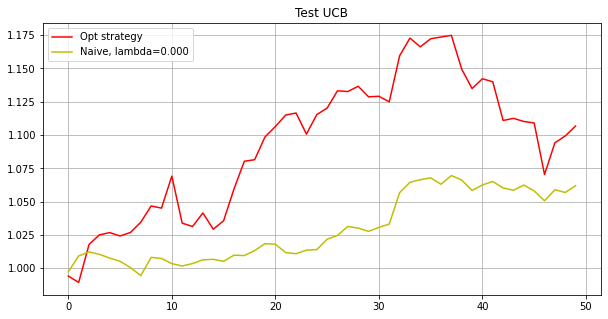

-----------------------------Final result-----------------------------
Opt strategy
Total return: 2.16525470
Mean return: 1.00064399
Naive strategy
Total return: 2.18874770
Mean return: 1.00065299


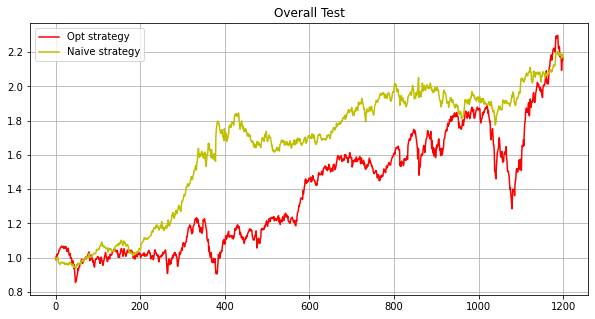

In [30]:
paras={'dataset':'snp500-24', 'maxiter':2000, 'subn':100, 'lb':5, 'M':10, 'inverse':'True', 'ggd':'True', 'matcnt':30}

gamma=30.0
run(paras, c=0.0, gamma=gamma, testv=np.arange(-0.02, 0.0100001, 0.002), phase_cnt=24)

In [34]:
'%s'%False

'False'